# Project covering neural networks

# -------------------------------------------NN1------------------------------------------------

## MLP CLASS

In [2]:
import numpy as np
import random
import math
import matplotlib.pyplot as plt
import pandas as pd
import time

def sigmoid(x):
    return 1/(1+np.exp(-x))

def sigmoid_derivative(x):
    s = sigmoid(x)
    return s * (1 - s)

def linear(x):
    return x

def linear_derivative(x):
    return 1

def relu(x):
    return np.maximum(0, x)

def relu_derivative(x):
    return (x>0).astype(float)

def tanh(x):
    return np.tanh(x)

def tanh_derivative(x):
    return 1 - np.tanh(x)**2

def softmax(x):
    exp_x = np.exp(x)
    return exp_x/np.sum(exp_x, axis = 1, keepdims=True)



class MLPNoBackprop:
    #####################################################################################################################
    #----------------------------------------FRIST CHECKPOINT -----------------------------------------------------------
    #####################################################################################################################
    def __init__(self, layer_sizes,
                 hidden_activation='sigmoid',
                 output_activation='linear',
                 weights_initialize_function ='uniform',
                 l2_lambda = 0,
                 l1_lambda = 0):
        self.l1_lambda = l1_lambda
        self.l2_lambda = l2_lambda
        self.weights = [0] * (len(layer_sizes)-1)
        self.biases = [0] * (len(layer_sizes)-1)
        self.layer_sizes = layer_sizes
        self.bounds = {
            'uniform': {i: (0, 1) for i in range(len(layer_sizes) - 1)},  
            'he': {
                i: (-math.sqrt(6 / layer_sizes[i]), math.sqrt(6 / layer_sizes[i]))
                for i in range(len(layer_sizes) - 1)
            },
            'xavier': {
                i: (-math.sqrt(6 / (layer_sizes[i] + layer_sizes[i + 1])), 
                    math.sqrt(6 / (layer_sizes[i] + layer_sizes[i + 1])))
                for i in range(len(layer_sizes) - 1)
            }
        }
            
        for i in range(len(layer_sizes)-1):
            low, high = self.bounds[weights_initialize_function][i] 
            self.weights[i] = np.random.uniform(low, high,(layer_sizes[i],layer_sizes[i+1]))
            self.biases[i] = np.zeros((layer_sizes[i+1], ))
        self.functions = {
            'linear': linear,
            'sigmoid': sigmoid,
            'relu': relu,
            'tanh': tanh,
            'softmax': softmax
        }
        self.hidden_activation = self.functions[hidden_activation]
        self.output_activation = self.functions[output_activation]
        
        self.derivatives ={
            'linear': linear_derivative,
            'sigmoid': sigmoid_derivative,
            'relu': relu_derivative,
            'tanh': tanh_derivative,
            'softmax': softmax
        }
        
        self.hidden_derivative = self.derivatives[hidden_activation]
        self.output_derivative = self.derivatives[output_activation]

    def forward(self, X):
        """
        Performs the foraward pass in a neural network
        
        Parameters:
        X - numpy.ndarray 
            input data matrix (can be a vector or a matrix)
            
        Returns:
        actiations : list
            a list of activations from the hidden layers and output layer
        """
        if X.ndim == 1:
            X = X.reshape(1,-1)
        activation = X
        activations = [activation]
        for i in range(len(self.weights)-1):
            z = activation @ self.weights[i] + self.biases[i]
            activation = self.hidden_activation(z)
            activations.append(activation)
        z = activation @ self.weights[-1] + self.biases[-1]
        activation = self.output_activation(z)
        activations.append(activation)
        return activations
    

    def predict(self, X):
        """
        return activation from output layer after performing a forward pass
        
        Parameters:
        X - numpy.ndarray
            input data matrix (can be a vector or a matrix)
        
        Returns:
        numpy.ndarray
            The activation of the output layer, representing the network's prediction
        """
        return self.forward(X)[-1]
        
    def set_weights_and_biases(self, layer_idx, W, b):
        """
        Allows to manually set weights and biases for layer with index equal to layer_indx

        Parameters: 
        layer_indx: int
        index of the layer for which weights and biases should be set
        W: numpy.ndarray
            Weight matrix
        b: numpy.ndarray
            Bias vector for specified layer
        """
        self.weights[layer_idx] = W
        self.biases[layer_idx] = b

    
    def mse(self, y_true, y_pred):
        """
         Computes the Mean Squared Error (MSE) between true and predicted values.

        Parameters:
        y_true - numpy.ndarray
            The ground truth (actual) values.
        y_pred - numpy.ndarray
            The predicted values.
        Returns:
        float
        The mean squared error
        """
        loss = np.mean((y_true - y_pred) ** 2)
        l2_reg = self.l2_lambda * sum(np.sum(w**2) for w in self.weights)
        l1_reg = self.l1_lambda * sum(np.sum(np.abs(w)) for w in self.weights)
        return loss + l2_reg + l1_reg

###########################################################################################################################    
#--------------------------------------------- SECOND CHECKPOINT ----------------------------------------------------------    
###########################################################################################################################    
    
    def backward(self, X, Y_true):
        """
        Computes gradients of weights and biases using backpropagation for regression.

        Parameters:
        X : numpy.ndarray
            Input data.
        Y_true : numpy.ndarray
            True target values.

        Returns:
        list
            Gradients of weights.
        list
            Gradients of biases.
        """
        weights_backprop=[]
        biases_backprop=[]
        activations = self.forward(X)
        n = len(Y_true)
        error = 2/n * (activations[-1] - Y_true)
        delta = error * self.output_derivative(activations[-2] @ self.weights[-1] + self.biases[-1])
        last_gradient_descent = activations[-2].T @ delta+  2*self.l2_lambda * self.weights[-1] + self.l1_lambda * np.sign(self.weights[-1])
        weights_backprop.insert(0, last_gradient_descent)
        biases_backprop.insert(0, np.sum(delta, axis=0, keepdims=True))
        for i in range(len(self.weights) -2, -1, -1):
            delta = (delta @ self.weights[i+1].T) * self.hidden_derivative(activations[i] @ self.weights[i] + self.biases[i])
            gradient = activations[i].T @ delta + 2*self.l2_lambda * self.weights[i] + self.l1_lambda * np.sign(self.weights[i])
            weights_backprop.insert(0, gradient)
            biases_backprop.insert(0,  np.sum(delta, axis=0, keepdims=True))
        
        return weights_backprop, biases_backprop
    
             
    
    def SGD(self, X, Y_true, epochs, learning_rate):
        """
        Trains the model using stochastic gradient descent.

        Parameters:
        X : numpy.ndarray
            Input features.
        Y_true : numpy.ndarray
            Target labels.
        epochs : int
            Number of epochs.
        learning_rate : float
            Learning rate.
        """
        n_samples = X.shape[0]
        weights_history = []
        biases_history = []   
        for epoch in range(epochs):
            shuffle_idx = np.random.permutation(n_samples)
            X_shuffled = X[shuffle_idx]
            Y_shuffled = Y_true[shuffle_idx]
            for i in range(n_samples):
                w, b = self.backward(X_shuffled, Y_shuffled)
                for l in range(len(self.weights)):
                    new_weight = self.weights[l] - learning_rate * w[l]
                    new_bias = self.biases[l] - learning_rate * b[l]
                    self.set_weights_and_biases(l, new_weight, new_bias)

            epoch_weights = [w.copy() for w in self.weights]
            epoch_biases = [b.copy() for b in self.biases]
            weights_history.append(epoch_weights)
            biases_history.append(epoch_biases) 
            
        self.plot_weights_and_biases(weights_history, biases_history)
            

    def mini_batch_GD(self, X, Y_true, batch_size, epochs, learning_rate):
        """
        Trains the model using mini-batch gradient descent.

        Parameters:
        X : numpy.ndarray
            Input features.
        Y_true : numpy.ndarray
            Target labels.
        batch_size : int
            Size of the mini-batch.
        epochs : int
            Number of epochs.
        learning_rate : float
            Learning rate.
        """
        n_samples = X.shape[0]
        weights_history = []
        biases_history = []      
        for epoch in range(epochs):
            shuffle_idx = np.random.permutation(n_samples)
            X_shuffled = X[shuffle_idx]
            Y_shuffled = Y_true[shuffle_idx]
            for i in range(0, n_samples, batch_size):
                X_batch = X_shuffled[i:i+batch_size]
                Y_batch = Y_shuffled[i:i+batch_size]
                w, b = self.backward(X_batch, Y_batch)
                for l in range(len(self.weights)):
                    new_weight = self.weights[l] - learning_rate * w[l]
                    new_bias = self.biases[l] - learning_rate * b[l]
                    self.set_weights_and_biases(l, new_weight, new_bias)
                    
            epoch_weights = [w.copy() for w in self.weights]
            epoch_biases = [b.copy() for b in self.biases]
            weights_history.append(epoch_weights)
            biases_history.append(epoch_biases)        
            
#             if epoch % 10 == 0:    
#                 loss = self.mse(Y_true, self.predict(X)[-1])
#                 print(f"Epoka {epoch}: Loss = {loss:.9f}")
                
        self.plot_weights_and_biases(weights_history, biases_history)
        
    def plot_weights_and_biases(self, weights_history, biases_history):
        import matplotlib.pyplot as plt
        import numpy as np

        num_epochs = len(weights_history)
        num_layers = len(weights_history[0])

        fig, axs = plt.subplots(2, num_layers, figsize=(5*num_layers, 8), sharex=True)

        for l in range(num_layers):
            ax_w = axs[0, l]
            
            layer_weights = [epoch[l].flatten() for epoch in weights_history]
            layer_weights = np.array(layer_weights)
            for i in range(layer_weights.shape[1]):
                ax_w.plot(range(num_epochs), layer_weights[:, i], alpha=0.5)
            ax_w.set_title(f'Layer {l+1} Weights')
            ax_w.set_ylabel('Weight value')

            ax_b = axs[1, l]
            layer_biases = [epoch[l].flatten() for epoch in biases_history]
            layer_biases = np.array(layer_biases)
            for i in range(layer_biases.shape[1]):
                ax_b.plot(range(num_epochs), layer_biases[:, i], alpha=0.5)
            ax_b.set_title(f'Layer {l+1} Biases')
            ax_b.set_xlabel('Epoch')
            ax_b.set_ylabel('Bias value')

        plt.tight_layout()
        plt.show()


#######################################################################################################################
#-------------------------------------------THIRD CHECKOPINT ---------------------------------------------------------
######################################################################################################################
    
    def momentum(self, X, Y_true, epochs, learning_rate, Lambda, batch_size):
        """
        Trains the model using momentum-based gradient descent.

        Parameters:
        X : numpy.ndarray
            Input features.
        Y_true : numpy.ndarray
            Target labels.
        epochs : int
            Number of epochs.
        learning_rate : float
            Learning rate.
        Lambda : float
            Momentum coefficient.
        batch_size : int
            Size of the mini-batch.
        """
        n_samples = X.shape[0]
        momentum_weights = [0] * (len(self.layer_sizes)-1)
        momentum_biases = [0] * (len(self.layer_sizes)-1)
        loss_list = []
        for i in range(len(self.layer_sizes)-1):
            momentum_weights[i] = np.zeros((self.layer_sizes[i], self.layer_sizes[i+1]))
            momentum_biases[i] = np.zeros((self.layer_sizes[i+1], )) 
        for epoch in range(epochs):
            shuffle_idx = np.random.permutation(n_samples)
            X_shuffled = X[shuffle_idx]
            Y_shuffled = Y_true[shuffle_idx]
            for i in range(0, n_samples, batch_size):
                X_batch = X_shuffled[i:i+batch_size]
                Y_batch = Y_shuffled[i:i+batch_size]
                w, b = self.backward(X_batch, Y_batch)
                for l in range(len(self.weights)):
                    momentum_weights[l] = Lambda * momentum_weights[l] + learning_rate * w[l]
                    momentum_biases[l] = Lambda * momentum_biases[l] + learning_rate * b[l].squeeze()            
                    self.weights[l] -= momentum_weights[l]
                    self.biases[l] -= momentum_biases[l]

            if epoch % 10 == 0:
                loss = self.mse(self.predict(X), Y_true) 
                loss_list.append(loss)                
                print(f"Epoka {epoch}: Loss = {loss:.9f}")                      
    
        self.plot_loss(loss_list, 'mse')
        
    
    def RMSprop(self, X, Y_true, epochs, learning_rate, beta, epsilon, batch_size):
        """
        Trains the model using RMSprop optimization.

        Parameters:
        X : numpy.ndarray
            Input features.
        Y_true : numpy.ndarray
            Target labels.
        epochs : int
            Number of epochs.
        learning_rate : float
            Learning rate.
        beta : float
            Decay rate for moving average.
        epsilon : float
            Small constant for numerical stability.
        batch_size : int
            Size of the mini-batch.
        """
        n_samples = X.shape[0]
        v_weights = [np.zeros((self.layer_sizes[i], self.layer_sizes[i+1])) for i in range(len(self.layer_sizes)-1)]
        v_biases = [np.zeros((self.layer_sizes[i+1],)) for i in range(len(self.layer_sizes)-1)]
        loss_list =[]
        
        for epoch in range(epochs):
            shuffle_idx = np.random.permutation(n_samples)
            X_shuffled = X[shuffle_idx]
            Y_shuffled = Y_true[shuffle_idx]

            for i in range(0, n_samples, batch_size):
                X_batch = X_shuffled[i:i + batch_size]
                Y_batch = Y_shuffled[i:i + batch_size]
                w, b = self.backward(X_batch, Y_batch)

                for l in range(len(self.weights)):
                    v_weights[l] = beta * v_weights[l] + (1 - beta) * (w[l] ** 2)
                    v_biases[l] = beta * v_biases[l] + (1 - beta) * (b[l] ** 2)
                    self.weights[l] -= (learning_rate / (np.sqrt(v_weights[l]) + epsilon)) * w[l]
                    self.biases[l] -= ((learning_rate / (np.sqrt(v_biases[l]) + epsilon)) * b[l]).squeeze()

            if epoch % 10 == 0:
                loss = self.mse(self.predict(X), Y_true)
                loss_list.append(loss)
                print(f"Epoka {epoch}: Loss = {loss:.9f}")
        
        self.plot_loss(loss_list, 'mse')
                
    def plot_loss(self, loss_history, loss_type, window_size=100):
        num_epochs = len(loss_history)
        loss_history = np.array(loss_history)
        epochs = np.arange(num_epochs)

        rolling_mean = np.convolve(loss_history, np.ones(window_size)/window_size, mode = 'valid')
        rolling_std = np.array([
            np.std(loss_history[i:i+window_size])
            for i in range(num_epochs - window_size + 1)
        ])
        
        valid_epochs = epochs[window_size-1:]
        
        
        
        plt.figure(figsize=(12, 6))
        plt.plot(epochs[100:], loss_history[100:], color='grey', label='loss', alpha=0.5)
        plt.plot(valid_epochs, rolling_mean, color='blue', label='rolling mean')
        plt.fill_between(valid_epochs,
                        rolling_mean - 3*rolling_std,
                        rolling_mean + 3*rolling_std,
                        color='blue',
                        alpha =0.3,
                        label = 'rolling std')
        
        plt.xlabel('epochs')
        plt.ylabel(f'{loss_type}')
        plt.yscale('log')
        plt.title(f'{loss_type} through epochs')
        plt.tight_layout()
        plt.show()                
                
####################################################################################################################
#-------------------------------------------FOURTH CHECKPOINT ------------------------------------------------------
####################################################################################################################

    def predict_classification(self, X):
        """
        Predicts class labels for the given input data X.

        Parameters:
        X : numpy.ndarray
            Input features.

        Returns:
        numpy.ndarray
            Predicted class labels.
        """
        probabilities = self.forward(X)[-1]
        return np.argmax(probabilities, axis=1).reshape(-1,1)
   
    
    def one_hot_encoding(self, Y_true):
        """
        Converts class labels into one-hot encoded vectors.

        Parameters:
        Y_true : numpy.ndarray
            Class labels.

        Returns:
        numpy.ndarray
            One-hot encoded labels.
        """
        num_classes = np.max(Y_true) + 1
        one_hot = np.zeros((Y_true.shape[0], num_classes))
        for i in range(Y_true.shape[0]):
            one_hot[i, Y_true[i]] = 1
        return one_hot    
    
    def backward_classification(self, X, Y_true):
        """
        Computes gradients using backpropagation for classification tasks.

        This implementation assumes that the output layer uses the softmax activation function
        and the loss function is cross-entropy. In this case, the derivative simplifies to 
        (softmax_output - one_hot_encoded_labels), which is used directly for the output layer gradient.

        Parameters:
        X : numpy.ndarray
            Input features.
        Y_true : numpy.ndarray
            One-hot encoded true labels.

        Returns:
        list
            Gradients of weights for each layer.
        list
            Gradients of biases for each layer.
        """
        weights_backprop = []
        biases_backprop =[]
        activations = self.forward(X)
        n = len(Y_true)
#         if self.output_activation == 'softmax':
        delta = (activations[-1] - Y_true)
#         else:
#             error = -Y_true/activations[-1] 
#             delta = error * self.output_derivative(activations[-2] @ self.weights[-1] + self.biases[-1])
        last_gradient_descent = activations[-2].T @ delta + 2 * self.l2_lambda * self.weights[-1] + self.l1_lambda * np.sign(self.weights[-1])
        weights_backprop.insert(0, last_gradient_descent)
        biases_backprop.insert(0, np.sum(delta, axis=0, keepdims=True))
        for i in range(len(self.weights) -2, -1, -1):
            delta = (delta @ self.weights[i+1].T) * self.hidden_derivative(activations[i] @ self.weights[i] + self.biases[i])
            gradient = activations[i].T @ delta + 2 * self.l2_lambda * self.weights[i] + self.l1_lambda * np.sign(self.weights[i])
            weights_backprop.insert(0, gradient)
            biases_backprop.insert(0,  np.sum(delta, axis=0, keepdims=True))
        
        return weights_backprop, biases_backprop
    
    
    def classifiaction_train(self, X, Y_true, epochs, learning_rate, batch_size):
        """
        Trains the model for classification using mini-batch gradient descent.

        Parameters:
        X : numpy.ndarray
            Input features.
        Y_true : numpy.ndarray
            True class labels.
        epochs : int
            Number of training epochs.
        learning_rate : float
            Learning rate for gradient descent.
        batch_size : int
            Size of the mini-batch.
        """
        Y = Y_true
        Y_true = self.one_hot_encoding(Y_true)
        n_samples = X.shape[0]
        weights_history = []
        biases_history = []      
        for epoch in range(epochs):
            shuffle_idx = np.random.permutation(n_samples)
            X_shuffled = X[shuffle_idx]
            Y_shuffled = Y_true[shuffle_idx]            
            for i in range(0, n_samples, batch_size):
                X_batch = X_shuffled[i:i+batch_size]
                Y_batch = Y_shuffled[i:i+batch_size]
                w, b = self.backward_classification(X_batch, Y_batch)
                for l in range(len(self.weights)):
                    new_weight = self.weights[l] - learning_rate * w[l]
                    new_bias = self.biases[l] - learning_rate * b[l]
                    self.set_weights_and_biases(l, new_weight, new_bias)
            if epoch % 10 == 0:
                loss = self.f1_score(Y, self.predict_classification(X))
                print(f"Epoka {epoch}: Loss = {loss:.9f}")  
            epoch_weights = [w.copy() for w in self.weights]
            epoch_biases = [b.copy() for b in self.biases]
            weights_history.append(epoch_weights)
            biases_history.append(epoch_biases)   
        self.plot_weights_and_biases(weights_history, biases_history)        

    
    def cross_entropy_loss(self, y_true, y_pred):
        ce_loss = -np.sum(y_true * np.log(y_pred + 1e-9)) / y_true.shape[0]
        l2_reg = self.l2_lambda * sum(np.sum(w**2) for w in self.weights)
        l1_reg = self.l1_lambda * sum(np.sum(np.abs(w)) for w in self.weights)
        return ce_loss + l2_reg + l1_reg
        
    
    def f1_score(self, y_true, y_pred):
        unique_classes = np.unique(y_true)
        f1_scores =[]
        for cls in unique_classes:
            tp = np.sum((y_pred == cls)&(y_true==cls))
            fp = np.sum((y_pred == cls)& (y_true!=cls))
            fn = np.sum((y_pred != cls)& (y_true == cls))
            
            precision = tp / (tp+fp) if (tp+fp) > 0 else 0
            recall = tp/(tp+fn) if (tp+fn)>0 else 0
            f1 = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0
            f1_scores.append(f1)
        return np.mean(f1_scores)
    
    
###############################################################################################
########################### early stopping ####################################################
###############################################################################################
        
    def classification_earlystop_GD(self, X, Y_true, batch_size, epochs, learning_rate, 
                                 X_val=None, Y_val=None, early_stopping=False, patience=10):
        n_samples = X.shape[0]
        weights_history = []
        biases_history = []      

        best_loss = float('inf')
        best_weights = None
        best_biases = None
        patience_counter = 0

        for epoch in range(epochs):
            shuffle_idx = np.random.permutation(n_samples)
            X_shuffled = X[shuffle_idx]
            Y_shuffled = Y_true[shuffle_idx]

            for i in range(0, n_samples, batch_size):
                X_batch = X_shuffled[i:i+batch_size]
                Y_batch = Y_shuffled[i:i+batch_size]
                w, b = self.backward_classification(X_batch, Y_batch)
                for l in range(len(self.weights)):
                    new_weight = self.weights[l] - learning_rate * w[l]
                    new_bias = self.biases[l] - learning_rate * b[l]
                    self.set_weights_and_biases(l, new_weight, new_bias)

            if early_stopping and X_val is not None and Y_val is not None:
                val_loss = self.cross_entropy_loss(self.one_hot_encoding(Y_val), self.forward(X_val)[-1])
                print(f"Epoka {epoch}: Walidacja loss = {val_loss:.6f}")

                if val_loss < best_loss:
                    best_loss = val_loss
                    best_weights = [w.copy() for w in self.weights]
                    best_biases = [b.copy() for b in self.biases]
                    patience_counter = 0
                else:
                    patience_counter += 1
                    if patience_counter >= patience:
                        print(f"Early stopping at epoch {epoch}. Best validation loss: {best_loss:.6f}")
                        self.weights = best_weights
                        self.biases = best_biases
                        return

            epoch_weights = [w.copy() for w in self.weights]
            epoch_biases = [b.copy() for b in self.biases]
            weights_history.append(epoch_weights)
            biases_history.append(epoch_biases)        

        self.plot_weights_and_biases(weights_history, biases_history)


## Loading csv fiels

In [3]:
stepsL_train = pd.read_csv('steps-large-training.csv')
stepsL_test = pd.read_csv('steps-large-test.csv')
squareS_train = pd.read_csv('square-simple-training.csv')
squareS_test = pd.read_csv('square-simple-test.csv')

In [4]:
stepsL_train.head()

,Unnamed: 0,x,y
0,1,-1.481354,-80
1,2,1.033264,80
2,3,-0.076403,0
3,4,-1.419785,-80
4,5,-0.108398,0


## splitting data into features and target

In [5]:
X_stepsL_train = np.array(stepsL_train[['x']])
Y_stepsL_train = np.array(stepsL_train[['y']])
X_stepsL_test = np.array(stepsL_test[['x']])
Y_stepsL_test = np.array(stepsL_test[['y']])
X_squareS_train = np.array(squareS_train[['x']])
Y_squareS_train = np.array(squareS_train[['y']])
X_squareS_test = np.array(squareS_test[['x']])
Y_squareS_test = np.array(squareS_test[['y']])

In [6]:
X_stepsL_train

array([[-1.4813543 ],
       [ 1.03326405],
       [-0.07640313],
       ...,
       [ 0.81091671],
       [ 0.64431837],
       [ 0.72881634]])

## Steps dataset visualization

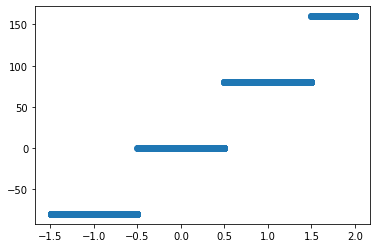

In [7]:
plt.scatter(X_stepsL_train,  Y_stepsL_train)
plt.show()

## Squares dataset visualization

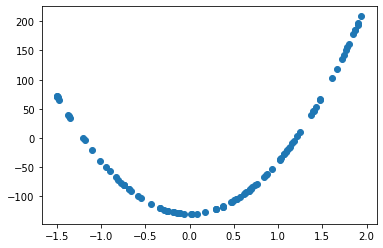

In [8]:
plt.scatter(X_squareS_train, Y_squareS_train)
plt.show()

## MLP for steps dataset (one hidden layer with 10 neurons)

### first attempt with random weights

In [8]:
mlp_steps = MLPNoBackprop(layer_sizes = [1, 10, 1])
y_stepsL_pred = mlp_steps.predict(X_stepsL_train)

In [9]:
mse_error_steps1 = mlp_steps.mse(Y_stepsL_train, y_stepsL_pred)
print(mse_error_steps1)

7125.111633091792


In [10]:
print(y_stepsL_pred)

[[1.845238  ]
 [3.73439128]
 [2.87684524]
 ...
 [3.57366432]
 [3.44834135]
 [3.51238307]]


### manually setting weights and biases

In [11]:
import ipywidgets as widgets
from ipywidgets import interactive

In [12]:
def update_plot(W_0_0, W_0_1, W_0_2, W_0_3, W_0_4, W_0_5, W_0_6, W_0_7, W_0_8, W_0_9,
                b_0_0, b_0_1, b_0_2, b_0_3, b_0_4, b_0_5, b_0_6, b_0_7, b_0_8, b_0_9,
                W_1_0, W_1_1, W_1_2, W_1_3, W_1_4, W_1_5, W_1_6, W_1_7, W_1_8, W_1_9,
                b_1):
    W_0 = np.array([[W_0_0, W_0_1, W_0_2, W_0_3, W_0_4, W_0_5, W_0_6, W_0_7, W_0_8, W_0_9]])
    b_0 = np.array([b_0_0, b_0_1, b_0_2, b_0_3, b_0_4, b_0_5, b_0_6, b_0_7, b_0_8, b_0_9])
    W_1 = np.array([[W_1_0], [W_1_1], [W_1_2], [W_1_3], [W_1_4], [W_1_5], [W_1_6], [W_1_7], [W_1_8], [W_1_9]])
    b_1 = np.array([b_1])

    mlp_steps.set_weights_and_biases(0, W_0, b_0)
    mlp_steps.set_weights_and_biases(1, W_1, b_1)


    y_stepsL_pred = mlp_steps.predict(X_stepsL_train)
    mse_value = mlp_steps.mse(Y_stepsL_train, y_stepsL_pred)

    plt.figure(figsize=(8, 5))
    plt.scatter(X_stepsL_train, Y_stepsL_train, label='True Data', color='blue', alpha=0.5)
    plt.scatter(X_stepsL_train, y_stepsL_pred, label=f'Predicted Data (MSE: {mse_value:.4f})', color='red')
    plt.legend()
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.title('Interactive MLP Regression')
    plt.show()


widgets_list = [
    widgets.FloatSlider(value=10, min=-600, max=600, step=0.1, description=f'W_0_{i}') for i in range(10)
] + [
    widgets.FloatSlider(value=0, min=-600, max=600, step=0.1, description=f'b_0_{i}') for i in range(10)
] + [
    widgets.FloatSlider(value=-10, min=-600, max=600, step=0.1, description=f'W_1_{i}') for i in range(10)
] + [
    widgets.FloatSlider(value=0, min=-600, max=600, step=0.1, description=f'b_1')
]

interactive_plot = interactive(update_plot, **{f'W_0_{i}': widgets_list[i] for i in range(10)} |
                                              {f'b_0_{i}': widgets_list[i+10] for i in range(10)} |
                                              {f'W_1_{i}': widgets_list[i+20] for i in range(10)} |
                                              {'b_1': widgets_list[30]})

interactive_plot

interactive(children=(FloatSlider(value=10.0, description='W_0_0', max=600.0, min=-600.0), FloatSlider(value=1…

## weights from sliders

In [13]:
W_0 = np.array([[300.3,501.1,472.5,600.0,500.1,399.9,403.6,463.9,500.0,500.0]])
b_0 = np.array([150.0,-250.5,-506.5,-306.1,-375.3,-600.0,-303.1,-346.5,-530.0,-536.1])
mlp_steps.set_weights_and_biases(0, W_0, b_0)

W_1 = np.array([[83.8],[85.7],[-25.9],[-10.4],[-33.6],[77.0],[25.8],[11.0],[-0.3],[28.2]])
b_1 = np.array([-82.0])
mlp_steps.set_weights_and_biases(1, W_1, b_1)

y_stepsL_pred =mlp_steps.predict(X_stepsL_train)
mse_value = mlp_steps.mse(Y_stepsL_train, y_stepsL_pred)
print(mse_value)

8.527777568129963


C:\Users\Administrator\AppData\Local\Temp\ipykernel_22476\3675195034.py:9: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-x))


## mse on training set

In [14]:
y_stepsL_pred =mlp_steps.predict(X_stepsL_test)
mse_value = mlp_steps.mse(Y_stepsL_test, y_stepsL_pred)
print(mse_value)

7.507656780160088


C:\Users\Administrator\AppData\Local\Temp\ipykernel_22476\3675195034.py:9: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-x))


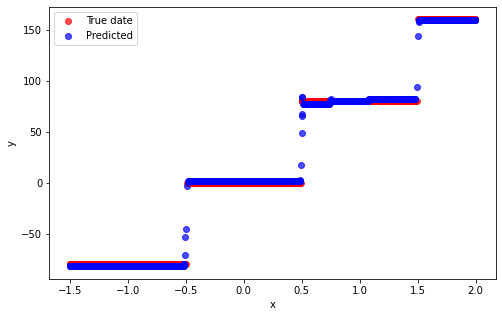

In [17]:
plt.figure(figsize=(8,5))
plt.scatter(X_stepsL_test, Y_stepsL_test, label ='True date', color= 'red', alpha=0.7)
plt.scatter(X_stepsL_test, y_stepsL_pred, label ='Predicted', color = 'blue', alpha =0.7)
plt.legend()
plt.xlabel('x')
plt.ylabel('y')
plt.show()

# MLP for squares dataset(one hidden layer with 5 neurons)

## random weights

In [18]:
mlp_square= MLPNoBackprop(layer_sizes = [1,5,1], hidden_activation='relu')
y_squareS_pred = mlp_square.predict(X_squareS_train)

In [19]:
mse_error_square1 = mlp_square.mse(Y_squareS_train, y_squareS_pred)
print(mse_error_square1)

10029.583464088404


## silders for weights and biases manipulation

In [20]:
np.seterr(over='ignore')

{'divide': 'warn', 'over': 'warn', 'under': 'ignore', 'invalid': 'warn'}

In [21]:
def update_plot(W_0_0, W_0_1, W_0_2, W_0_3, W_0_4,
                b_0_0, b_0_1, b_0_2, b_0_3, b_0_4,
                W_1_0, W_1_1, W_1_2, W_1_3, W_1_4,
                b_1):

    W_0 = np.array([[W_0_0, W_0_1, W_0_2, W_0_3, W_0_4]])
    b_0 = np.array([b_0_0, b_0_1, b_0_2, b_0_3, b_0_4])
    W_1 = np.array([[W_1_0], [W_1_1], [W_1_2], [W_1_3], [W_1_4]])
    b_1 = np.array([b_1])

   
    mlp_square.set_weights_and_biases(0, W_0, b_0)
    mlp_square.set_weights_and_biases(1, W_1, b_1)


    y_squareS_pred = mlp_square.predict(X_squareS_train)
    mse_value = mlp_square.mse(Y_squareS_train, y_squareS_pred)

   
    plt.figure(figsize=(8, 5))
    plt.scatter(X_squareS_train, Y_squareS_train, label='True Data', color='blue', alpha=0.5)
    plt.scatter(X_squareS_train, y_squareS_pred, label=f'Predicted Data (MSE: {mse_value:.4f})', color='red')
    plt.legend()
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.title('Interactive MLP Regression for Square')
    plt.show()


widgets_list = [
    widgets.FloatSlider(value=10, min=-600, max=600, step=0.1, description=f'W_0_{i}') for i in range(5)
] + [
    widgets.FloatSlider(value=0, min=-600, max=600, step=0.1, description=f'b_0_{i}') for i in range(5)
] + [
    widgets.FloatSlider(value=-10, min=-600, max=600, step=0.1, description=f'W_1_{i}') for i in range(5)
] + [
    widgets.FloatSlider(value=0, min=-600, max=600, step=0.1, description='b_1')
]


interactive_plot = interactive(update_plot, **{f'W_0_{i}': widgets_list[i] for i in range(5)} |
                                              {f'b_0_{i}': widgets_list[i+5] for i in range(5)} |
                                              {f'W_1_{i}': widgets_list[i+10] for i in range(5)} |
                                              {'b_1': widgets_list[15]})

interactive_plot


interactive(children=(FloatSlider(value=10.0, description='W_0_0', max=600.0, min=-600.0), FloatSlider(value=1…

In [22]:
W_0 = np.array([[297,41,-204,9.9,-121]])
b_0 = np.array([30, 0.02, -97.8, 0.3,13])
mlp_square.set_weights_and_biases(0, W_0, b_0)

W_1 = np.array([[0.11],[64.14],[0.96],[-251.3],[-0.13]])
b_1 = np.array([-113])
mlp_square.set_weights_and_biases(1, W_1, b_1)

y_squareS_pred =mlp_square.predict(X_squareS_train)
mse_value = mlp_square.mse(Y_squareS_train, y_squareS_pred)
print(mse_value)

479.7992090448728


### now on test set

In [23]:
y_pred = mlp_square.predict(X_squareS_test)
mse = mlp_square.mse(Y_squareS_test, y_pred)
print(mse)

415.87483547679824


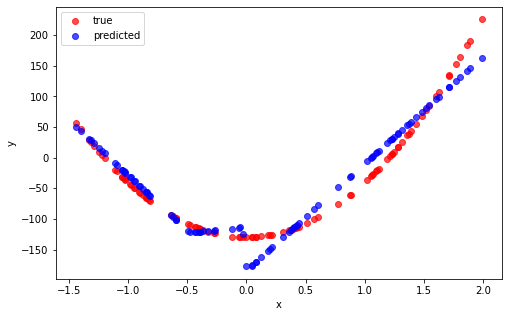

In [26]:
plt.figure(figsize=(8, 5))
plt.scatter(X_squareS_test, Y_squareS_test, label ='true', color='red', alpha =0.7)
plt.scatter(X_squareS_test, y_pred, label ='predicted', color = 'blue', alpha =0.7)
plt.legend()
plt.xlabel('x')
plt.ylabel('y')
plt.show()

# two hidden layers with 5 neurons in each

In [27]:
mlp_square= MLPNoBackprop(layer_sizes = [1,5,5,1])
y_squareS_pred = mlp_square.predict(X_squareS_train)
mse_error_square1 = mlp_square.mse(Y_squareS_train, y_squareS_pred)
print(mse_error_square1)

10201.188670009542


In [28]:
def update_plot(
    W_0_0, W_0_1, W_0_2, W_0_3, W_0_4,
    b_0_0, b_0_1, b_0_2, b_0_3, b_0_4,

    W_1_0_0, W_1_0_1, W_1_0_2, W_1_0_3, W_1_0_4,
    W_1_1_0, W_1_1_1, W_1_1_2, W_1_1_3, W_1_1_4,
    W_1_2_0, W_1_2_1, W_1_2_2, W_1_2_3, W_1_2_4,
    W_1_3_0, W_1_3_1, W_1_3_2, W_1_3_3, W_1_3_4,
    W_1_4_0, W_1_4_1, W_1_4_2, W_1_4_3, W_1_4_4,
    b_1_0, b_1_1, b_1_2, b_1_3, b_1_4,

    W_2_0, W_2_1, W_2_2, W_2_3, W_2_4,
    b_2
):

    W_0 = np.array([[W_0_0, W_0_1, W_0_2, W_0_3, W_0_4]])  
    b_0 = np.array([b_0_0, b_0_1, b_0_2, b_0_3, b_0_4])     

    W_1 = np.array([
        [W_1_0_0, W_1_0_1, W_1_0_2, W_1_0_3, W_1_0_4],
        [W_1_1_0, W_1_1_1, W_1_1_2, W_1_1_3, W_1_1_4],
        [W_1_2_0, W_1_2_1, W_1_2_2, W_1_2_3, W_1_2_4],
        [W_1_3_0, W_1_3_1, W_1_3_2, W_1_3_3, W_1_3_4],
        [W_1_4_0, W_1_4_1, W_1_4_2, W_1_4_3, W_1_4_4],
    ])  

    b_1 = np.array([b_1_0, b_1_1, b_1_2, b_1_3, b_1_4])  

    W_2 = np.array([[W_2_0], [W_2_1], [W_2_2], [W_2_3], [W_2_4]])  
    b_2 = np.array([b_2])  

    mlp_square.set_weights_and_biases(0, W_0, b_0)
    mlp_square.set_weights_and_biases(1, W_1, b_1)
    mlp_square.set_weights_and_biases(2, W_2, b_2)

    y_squareS_pred = mlp_square.predict(X_squareS_train)
    mse_value = mlp_square.mse(Y_squareS_train, y_squareS_pred)

    plt.figure(figsize=(8, 5))
    plt.scatter(X_squareS_train, Y_squareS_train, label='True Data', color='blue', alpha=0.5)
    plt.scatter(X_squareS_train, y_squareS_pred, label=f'Predicted (MSE: {mse_value:.4f})', color='red')
    plt.legend()
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.title('MLP Regression [1,5,5,1]')
    plt.show()

widgets_list = [
    widgets.FloatSlider(value=10, min=-600, max=600, step=0.1, description=f'W_0_{i}') for i in range(5)
] + [
    widgets.FloatSlider(value=0, min=-600, max=600, step=0.1, description=f'b_0_{i}') for i in range(5)
] + [
    widgets.FloatSlider(value=-10, min=-600, max=600, step=0.1, description=f'W_1_{i}_{j}') for i in range(5) for j in range(5)
] + [
    widgets.FloatSlider(value=0, min=-600, max=600, step=0.1, description=f'b_1_{i}') for i in range(5)
] + [
    widgets.FloatSlider(value=0, min=-600, max=600, step=0.1, description=f'W_2_{i}') for i in range(5)
] + [
    widgets.FloatSlider(value=0, min=-600, max=600, step=0.1, description='b_2')
]


# Uruchomienie interaktywnego wykresu
interactive_plot = interactive(update_plot, **{f'W_0_{i}': widgets_list[i] for i in range(5)} |
                                              {f'b_0_{i}': widgets_list[i+5] for i in range(5)} |
                                              {f'W_1_{i}_{j}': widgets_list[i*5 + j + 10] for i in range(5) for j in range(5)} |
                                              {f'b_1_{i}': widgets_list[i + 35] for i in range(5)} |
                                              {f'W_2_{i}': widgets_list[i + 40] for i in range(5)} |
                                              {'b_2': widgets_list[45]})

interactive_plot

interactive(children=(FloatSlider(value=10.0, description='W_0_0', max=600.0, min=-600.0), FloatSlider(value=1…

In [29]:
W_0 = np.array([[9.4, 3.9, 5, 60.6, 6]])
b_0 = np.array([7.3, -2.2, 2.4, 26.9, -3.3])
mlp_square.set_weights_and_biases(0, W_0, b_0)

W_1 = np.array([[-10, -3.9, -8.7, -250 ,-12],
                [-1.1, 0.50, -9.3, 400, -9.2],
                [80, -4.1, -5, -386, -15],
                [-7, 10.3, 12.2, 190, -11],
                [-78, -5.3, -14, 1.1, 116]])
b_1 = np.array([-15, -0.9, 19.7, 49.4, -68]) 
mlp_square.set_weights_and_biases(1, W_1, b_1) 

W_2 = np.array([[-16],[-33],[-37],[128],[171.1]])
b_2 = np.array([-44])
mlp_square.set_weights_and_biases(2, W_2, b_2)

y_squareS_pred =mlp_square.predict(X_squareS_train)
mse_value = mlp_square.mse(Y_squareS_train, y_squareS_pred)
print(mse_value)

187.33084369505337


In [30]:
y_pred = mlp_square.predict(X_squareS_test)
mse = mlp_square.mse(Y_squareS_test, y_pred)
print(mse)

549.5161161564539


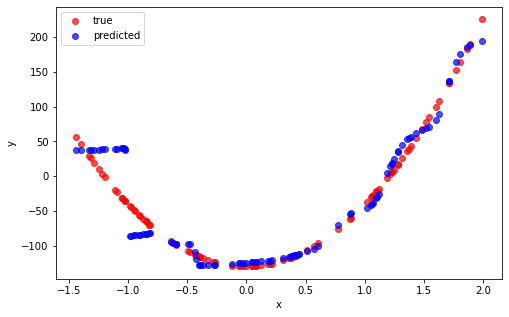

In [31]:
plt.figure(figsize=(8, 5))
plt.scatter(X_squareS_test, Y_squareS_test, label ='true', color='red', alpha =0.7)
plt.scatter(X_squareS_test, y_pred, label ='predicted', color = 'blue', alpha =0.7)
plt.legend()
plt.xlabel('x')
plt.ylabel('y')
plt.show()

# ------------------------------------------NN2------------------------------------------------------

Now we are working on this datastets: square-simple, steps-small, multimodal-large  
I have to implement backpropagation  
The squares set has already been loaded  
X_squareS_train = np.array(squareS_train[['x']])  
Y_squareS_train = np.array(squareS_train[['y']])  
X_squareS_test = np.array(squareS_test[['x']])  
Y_squareS_test = np.array(squareS_test[['y']])  
  
Let's load steps and multimodal dataset

In [9]:
stepsS_train = pd.read_csv('steps-small-training.csv')
stepsS_test = pd.read_csv('steps-small-test.csv')
multimodalL_train = pd.read_csv('multimodal-large-training.csv')
multimodalL_test = pd.read_csv('multimodal-large-test.csv')

### spliting into target and features

In [10]:
X_stepsS_train = np.array(stepsS_train[['x']])
Y_stepsS_train = np.array(stepsS_train[['y']])
X_stepsS_test = np.array(stepsS_test[['x']])
Y_stepsS_test = np.array(stepsS_test[['y']])
X_multimodalL_train = np.array(multimodalL_train[['x']])
Y_multimodalL_train = np.array(multimodalL_train[['y']])
X_multimodalL_test = np.array(multimodalL_test[['x']])
Y_multimodalL_test = np.array(multimodalL_test[['y']])

### now lets normalize our data

#### squares

In [11]:
X_squareS_train_normalized = (X_squareS_train- np.mean(X_squareS_train))/(np.std(X_squareS_train))
Y_squareS_train_normalized = (Y_squareS_train- np.mean(Y_squareS_train))/(np.std(Y_squareS_train))
X_squareS_test_normalized = (X_squareS_test- np.mean(X_squareS_train))/(np.std(X_squareS_train))
Y_squareS_test_normalized = (Y_squareS_test- np.mean(Y_squareS_train))/(np.std(Y_squareS_train))

#### steps

In [12]:
X_stepsS_train_normalized = (X_stepsS_train- np.mean(X_stepsS_train))/(np.std(X_stepsS_train))
Y_stepsS_train_normalized = (Y_stepsS_train- np.mean(Y_stepsS_train))/(np.std(Y_stepsS_train))
X_stepsS_test_normalized = (X_stepsS_test- np.mean(X_stepsS_train))/(np.std(X_stepsS_train))
Y_stepsS_test_normalized = (Y_stepsS_test- np.mean(Y_stepsS_train))/(np.std(Y_stepsS_train))

### multimodal

In [13]:
X_multimodalL_train_normalized = (X_multimodalL_train- np.mean(X_multimodalL_train))/(np.std(X_multimodalL_train))
Y_multimodalL_train_normalized = (Y_multimodalL_train- np.mean(Y_multimodalL_train))/(np.std(Y_multimodalL_train))
X_multimodalL_test_normalized = (X_multimodalL_test- np.mean(X_multimodalL_train))/(np.std(X_multimodalL_train))
Y_multimodalL_test_normalized = (Y_multimodalL_test- np.mean(Y_multimodalL_train))/(np.std(Y_multimodalL_train))

# MLP FOR SQUARES


## SGD


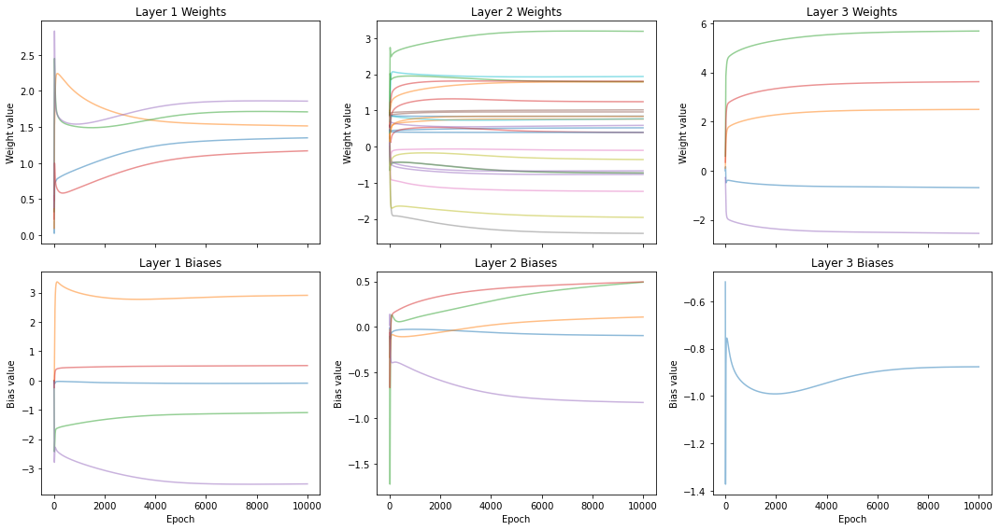

Czas wykonania: 138.269608 sekundy


In [37]:
mlp_squares = MLPNoBackprop(layer_sizes = [1, 5, 5, 1])
start_time = time.time()
mlp_squares.SGD(X_squareS_train_normalized, Y_squareS_train_normalized, 10000, 0.05)
end_time = time.time()
execution_time = end_time - start_time
print(f"Czas wykonania: {execution_time:.6f} sekundy")

In [38]:
Ypred_normalized = mlp_squares.predict(X_squareS_test_normalized)
Ypred = (Ypred_normalized * np.std(Y_squareS_train)) + np.mean(Y_squareS_train)
print(mlp_squares.mse(Ypred, Y_squareS_test))

0.04694478442926461


## mini batch

Epoka 0: Loss = 1.008753251
Epoka 10: Loss = 1.013711176
Epoka 20: Loss = 1.034677936
Epoka 30: Loss = 1.124099326
Epoka 40: Loss = 1.008762325
Epoka 50: Loss = 1.006616825
Epoka 60: Loss = 1.114444254
Epoka 70: Loss = 1.081419194
Epoka 80: Loss = 1.291127792
Epoka 90: Loss = 1.440136386
Epoka 100: Loss = 1.471041513
Epoka 110: Loss = 1.593951581
Epoka 120: Loss = 1.564674429
Epoka 130: Loss = 1.568792753
Epoka 140: Loss = 1.478923585
Epoka 150: Loss = 1.575746349
Epoka 160: Loss = 1.569205517
Epoka 170: Loss = 1.587425008
Epoka 180: Loss = 1.566773895
Epoka 190: Loss = 1.553690980
Epoka 200: Loss = 1.420080341
Epoka 210: Loss = 1.489373458
Epoka 220: Loss = 1.502266102
Epoka 230: Loss = 1.466432394
Epoka 240: Loss = 1.485009682
Epoka 250: Loss = 1.436527524
Epoka 260: Loss = 1.441496021
Epoka 270: Loss = 1.443083338
Epoka 280: Loss = 1.446489874
Epoka 290: Loss = 1.428048015
Epoka 300: Loss = 1.437686436
Epoka 310: Loss = 1.426116619
Epoka 320: Loss = 1.398512988
Epoka 330: Loss = 1.4

Epoka 2720: Loss = 1.366297866
Epoka 2730: Loss = 1.367669302
Epoka 2740: Loss = 1.361720269
Epoka 2750: Loss = 1.359388489
Epoka 2760: Loss = 1.363577149
Epoka 2770: Loss = 1.374374253
Epoka 2780: Loss = 1.372302410
Epoka 2790: Loss = 1.365604277
Epoka 2800: Loss = 1.367513692
Epoka 2810: Loss = 1.359246073
Epoka 2820: Loss = 1.368009507
Epoka 2830: Loss = 1.370808498
Epoka 2840: Loss = 1.368542010
Epoka 2850: Loss = 1.366742693
Epoka 2860: Loss = 1.351804969
Epoka 2870: Loss = 1.353543499
Epoka 2880: Loss = 1.368016394
Epoka 2890: Loss = 1.370307950
Epoka 2900: Loss = 1.367627428
Epoka 2910: Loss = 1.371086222
Epoka 2920: Loss = 1.377074859
Epoka 2930: Loss = 1.362962299
Epoka 2940: Loss = 1.355410898
Epoka 2950: Loss = 1.371164269
Epoka 2960: Loss = 1.365580459
Epoka 2970: Loss = 1.362351110
Epoka 2980: Loss = 1.362143747
Epoka 2990: Loss = 1.365800970
Epoka 3000: Loss = 1.357486379
Epoka 3010: Loss = 1.372252886
Epoka 3020: Loss = 1.372321387
Epoka 3030: Loss = 1.370854530
Epoka 30

Epoka 5400: Loss = 1.355866930
Epoka 5410: Loss = 1.362251385
Epoka 5420: Loss = 1.351792937
Epoka 5430: Loss = 1.363959998
Epoka 5440: Loss = 1.359188273
Epoka 5450: Loss = 1.365069689
Epoka 5460: Loss = 1.372220954
Epoka 5470: Loss = 1.362519902
Epoka 5480: Loss = 1.363274476
Epoka 5490: Loss = 1.367591895
Epoka 5500: Loss = 1.368111076
Epoka 5510: Loss = 1.366411559
Epoka 5520: Loss = 1.373131997
Epoka 5530: Loss = 1.363310051
Epoka 5540: Loss = 1.366410192
Epoka 5550: Loss = 1.366552839
Epoka 5560: Loss = 1.360084136
Epoka 5570: Loss = 1.367136964
Epoka 5580: Loss = 1.369306796
Epoka 5590: Loss = 1.357458478
Epoka 5600: Loss = 1.372089025
Epoka 5610: Loss = 1.363404301
Epoka 5620: Loss = 1.365547802
Epoka 5630: Loss = 1.365061518
Epoka 5640: Loss = 1.362264452
Epoka 5650: Loss = 1.368839376
Epoka 5660: Loss = 1.371587859
Epoka 5670: Loss = 1.363737540
Epoka 5680: Loss = 1.369810743
Epoka 5690: Loss = 1.364389323
Epoka 5700: Loss = 1.367288210
Epoka 5710: Loss = 1.364571391
Epoka 57

Epoka 8080: Loss = 1.367316880
Epoka 8090: Loss = 1.362670879
Epoka 8100: Loss = 1.362640429
Epoka 8110: Loss = 1.362964674
Epoka 8120: Loss = 1.364378371
Epoka 8130: Loss = 1.373671463
Epoka 8140: Loss = 1.357983651
Epoka 8150: Loss = 1.359071772
Epoka 8160: Loss = 1.362641402
Epoka 8170: Loss = 1.365893608
Epoka 8180: Loss = 1.368014343
Epoka 8190: Loss = 1.362914964
Epoka 8200: Loss = 1.358363920
Epoka 8210: Loss = 1.363018080
Epoka 8220: Loss = 1.361187204
Epoka 8230: Loss = 1.367393097
Epoka 8240: Loss = 1.361460920
Epoka 8250: Loss = 1.362109242
Epoka 8260: Loss = 1.366102832
Epoka 8270: Loss = 1.365034285
Epoka 8280: Loss = 1.366061584
Epoka 8290: Loss = 1.366624751
Epoka 8300: Loss = 1.370000458
Epoka 8310: Loss = 1.360498074
Epoka 8320: Loss = 1.369001887
Epoka 8330: Loss = 1.363299490
Epoka 8340: Loss = 1.362957097
Epoka 8350: Loss = 1.362995766
Epoka 8360: Loss = 1.365233614
Epoka 8370: Loss = 1.360623369
Epoka 8380: Loss = 1.368058698
Epoka 8390: Loss = 1.368196485
Epoka 84

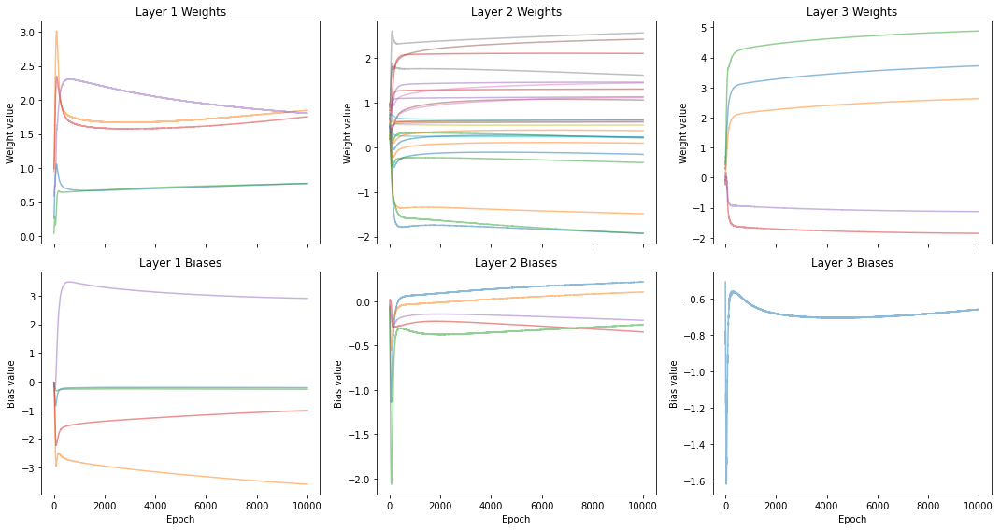

Czas wykonania: 63.547931 sekundy


In [37]:
mlp_squares2 = MLPNoBackprop(layer_sizes = [1, 5, 5, 1])
start_time = time.time()
mlp_squares2.mini_batch_GD(X_squareS_train_normalized, Y_squareS_train_normalized, 5, 10000, 0.05)
end_time = time.time()
execution_time = end_time - start_time
print(f"Czas wykonania: {execution_time:.6f} sekundy")

In [38]:
Ypred_normalized2 = mlp_squares2.predict(X_squareS_test_normalized)
Ypred2 = (Ypred_normalized2 * np.std(Y_squareS_train)) + np.mean(Y_squareS_train)
print(mlp_squares2.mse(Ypred2, Y_squareS_test))

0.5862990122179259


### lepszy wynik dla SGD ale dużo dłuższy czas wykonywania

# MLP FOR STEPS

## SGD 

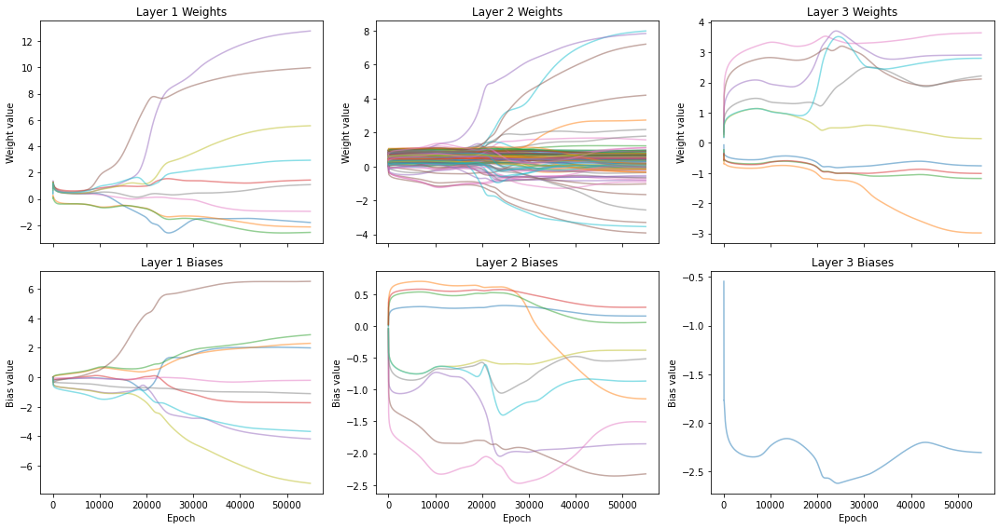

Czas wykonania: 1081.495786 sekundy


In [39]:
mlp_steps = MLPNoBackprop(layer_sizes = [1, 10, 10, 1], weights_initialize_function ='uniform')
start_time = time.time()
mlp_steps.SGD(X_stepsS_train_normalized, Y_stepsS_train_normalized, 55000, 0.015)
end_time = time.time()
execution_time = end_time - start_time
print(f"Czas wykonania: {execution_time:.6f} sekundy")

In [40]:
Ypred_normalized = mlp_steps.predict(X_stepsS_train_normalized)
Ypred = (Ypred_normalized * np.std(Y_stepsS_train)) + np.mean(Y_stepsS_train)
mse_value = mlp_steps.mse(Ypred, Y_stepsS_train)
print(mse_value)

2.127327601391904


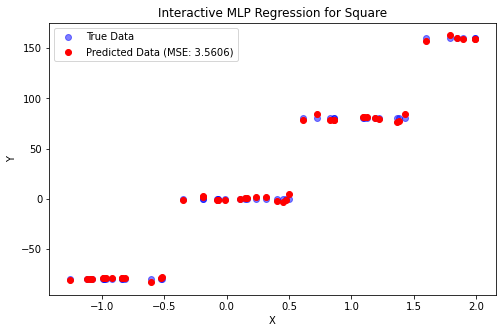

In [167]:
plt.figure(figsize=(8, 5))
plt.scatter(X_stepsS_train, Y_stepsS_train, label='True Data', color='blue', alpha=0.5)
plt.scatter(X_stepsS_train, Ypred, label=f'Predicted Data (MSE: {mse_value:.4f})', color='red')
plt.legend()
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Interactive MLP Regression for Square')
plt.show()

## mini batch

Epoka 0: Loss = 2.083666660
Epoka 10: Loss = 1.084540365
Epoka 20: Loss = 1.047731007
Epoka 30: Loss = 1.042221513
Epoka 40: Loss = 1.001900983
Epoka 50: Loss = 1.000076086
Epoka 60: Loss = 1.002751235
Epoka 70: Loss = 1.001129810
Epoka 80: Loss = 1.020647772
Epoka 90: Loss = 1.157630004
Epoka 100: Loss = 1.034255915
Epoka 110: Loss = 1.005894519
Epoka 120: Loss = 1.066877986
Epoka 130: Loss = 1.015952708
Epoka 140: Loss = 1.008580471
Epoka 150: Loss = 1.004387616
Epoka 160: Loss = 1.007437652
Epoka 170: Loss = 1.001797055
Epoka 180: Loss = 1.000569787
Epoka 190: Loss = 1.152867439
Epoka 200: Loss = 1.061881896
Epoka 210: Loss = 1.106159000
Epoka 220: Loss = 1.002383099
Epoka 230: Loss = 1.000681606
Epoka 240: Loss = 1.031532687
Epoka 250: Loss = 1.143406313
Epoka 260: Loss = 1.001773412
Epoka 270: Loss = 1.106445318
Epoka 280: Loss = 1.061182217
Epoka 290: Loss = 1.042214126
Epoka 300: Loss = 1.008946456
Epoka 310: Loss = 1.034366269
Epoka 320: Loss = 1.092003714
Epoka 330: Loss = 1.0

Epoka 2720: Loss = 1.027535157
Epoka 2730: Loss = 1.012876179
Epoka 2740: Loss = 1.002129377
Epoka 2750: Loss = 1.003224536
Epoka 2760: Loss = 1.006046331
Epoka 2770: Loss = 1.003216344
Epoka 2780: Loss = 1.001165087
Epoka 2790: Loss = 1.003439140
Epoka 2800: Loss = 1.036135046
Epoka 2810: Loss = 1.011905908
Epoka 2820: Loss = 1.002407940
Epoka 2830: Loss = 1.009855949
Epoka 2840: Loss = 1.003725664
Epoka 2850: Loss = 1.005869686
Epoka 2860: Loss = 1.020203177
Epoka 2870: Loss = 1.009222265
Epoka 2880: Loss = 1.004532467
Epoka 2890: Loss = 1.056680015
Epoka 2900: Loss = 1.014795795
Epoka 2910: Loss = 1.063203434
Epoka 2920: Loss = 1.043806281
Epoka 2930: Loss = 1.010723649
Epoka 2940: Loss = 1.000060466
Epoka 2950: Loss = 1.019405467
Epoka 2960: Loss = 1.038907859
Epoka 2970: Loss = 1.030216724
Epoka 2980: Loss = 1.011251010
Epoka 2990: Loss = 1.003065049
Epoka 3000: Loss = 1.003017903
Epoka 3010: Loss = 1.002813140
Epoka 3020: Loss = 1.037709470
Epoka 3030: Loss = 1.074812399
Epoka 30

Epoka 5400: Loss = 1.005800816
Epoka 5410: Loss = 1.029959343
Epoka 5420: Loss = 1.018934346
Epoka 5430: Loss = 1.001034633
Epoka 5440: Loss = 1.026328857
Epoka 5450: Loss = 1.012199062
Epoka 5460: Loss = 1.007108564
Epoka 5470: Loss = 1.002660246
Epoka 5480: Loss = 1.002192813
Epoka 5490: Loss = 1.002969853
Epoka 5500: Loss = 1.009796056
Epoka 5510: Loss = 1.014243082
Epoka 5520: Loss = 1.000050219
Epoka 5530: Loss = 1.001432137
Epoka 5540: Loss = 1.000194112
Epoka 5550: Loss = 1.001549757
Epoka 5560: Loss = 1.002042832
Epoka 5570: Loss = 1.005768862
Epoka 5580: Loss = 1.041979865
Epoka 5590: Loss = 1.027528731
Epoka 5600: Loss = 1.007494773
Epoka 5610: Loss = 1.000337808
Epoka 5620: Loss = 1.000132358
Epoka 5630: Loss = 1.006795235
Epoka 5640: Loss = 1.000962803
Epoka 5650: Loss = 1.000056722
Epoka 5660: Loss = 1.001426285
Epoka 5670: Loss = 1.000800858
Epoka 5680: Loss = 1.022714462
Epoka 5690: Loss = 1.006201356
Epoka 5700: Loss = 1.013038744
Epoka 5710: Loss = 1.001416357
Epoka 57

Epoka 8080: Loss = 1.023536724
Epoka 8090: Loss = 1.005581284
Epoka 8100: Loss = 1.046088797
Epoka 8110: Loss = 1.007958037
Epoka 8120: Loss = 1.007521858
Epoka 8130: Loss = 1.003333431
Epoka 8140: Loss = 1.012714254
Epoka 8150: Loss = 1.000011421
Epoka 8160: Loss = 1.002937283
Epoka 8170: Loss = 1.003221890
Epoka 8180: Loss = 1.012708673
Epoka 8190: Loss = 1.008766560
Epoka 8200: Loss = 1.023713377
Epoka 8210: Loss = 1.001991246
Epoka 8220: Loss = 1.004267972
Epoka 8230: Loss = 1.005258819
Epoka 8240: Loss = 1.022290212
Epoka 8250: Loss = 1.037489722
Epoka 8260: Loss = 1.037417922
Epoka 8270: Loss = 1.018430027
Epoka 8280: Loss = 1.039022898
Epoka 8290: Loss = 1.006213559
Epoka 8300: Loss = 1.000302155
Epoka 8310: Loss = 1.022609670
Epoka 8320: Loss = 1.023958727
Epoka 8330: Loss = 1.017483687
Epoka 8340: Loss = 1.001661501
Epoka 8350: Loss = 1.019166110
Epoka 8360: Loss = 1.016507138
Epoka 8370: Loss = 1.039014686
Epoka 8380: Loss = 1.041094751
Epoka 8390: Loss = 1.036137208
Epoka 84

Epoka 10720: Loss = 1.083068426
Epoka 10730: Loss = 1.096997199
Epoka 10740: Loss = 1.076694428
Epoka 10750: Loss = 1.052569844
Epoka 10760: Loss = 1.084019291
Epoka 10770: Loss = 1.103873625
Epoka 10780: Loss = 1.082265677
Epoka 10790: Loss = 1.094903515
Epoka 10800: Loss = 1.072560960
Epoka 10810: Loss = 1.101016107
Epoka 10820: Loss = 1.080936874
Epoka 10830: Loss = 1.059157521
Epoka 10840: Loss = 1.079058370
Epoka 10850: Loss = 1.071669086
Epoka 10860: Loss = 1.090009953
Epoka 10870: Loss = 1.081111821
Epoka 10880: Loss = 1.102029461
Epoka 10890: Loss = 1.095533750
Epoka 10900: Loss = 1.091001960
Epoka 10910: Loss = 1.076644454
Epoka 10920: Loss = 1.085594561
Epoka 10930: Loss = 1.079402342
Epoka 10940: Loss = 1.088539762
Epoka 10950: Loss = 1.116798780
Epoka 10960: Loss = 1.084493760
Epoka 10970: Loss = 1.100219565
Epoka 10980: Loss = 1.070114865
Epoka 10990: Loss = 1.090544042
Epoka 11000: Loss = 1.096605833
Epoka 11010: Loss = 1.073481346
Epoka 11020: Loss = 1.113630039
Epoka 11

Epoka 13330: Loss = 1.050423933
Epoka 13340: Loss = 1.069907174
Epoka 13350: Loss = 1.048632175
Epoka 13360: Loss = 1.075132127
Epoka 13370: Loss = 1.052619886
Epoka 13380: Loss = 1.073663070
Epoka 13390: Loss = 1.069590611
Epoka 13400: Loss = 1.079822221
Epoka 13410: Loss = 1.086076570
Epoka 13420: Loss = 1.082272713
Epoka 13430: Loss = 1.100490856
Epoka 13440: Loss = 1.085041946
Epoka 13450: Loss = 1.085617552
Epoka 13460: Loss = 1.069607495
Epoka 13470: Loss = 1.095509897
Epoka 13480: Loss = 1.102143903
Epoka 13490: Loss = 1.051542289
Epoka 13500: Loss = 1.094054984
Epoka 13510: Loss = 1.077181613
Epoka 13520: Loss = 1.046791206
Epoka 13530: Loss = 1.061182939
Epoka 13540: Loss = 1.062894058
Epoka 13550: Loss = 1.067881392
Epoka 13560: Loss = 1.091645879
Epoka 13570: Loss = 1.112310047
Epoka 13580: Loss = 1.083056627
Epoka 13590: Loss = 1.070506114
Epoka 13600: Loss = 1.074559627
Epoka 13610: Loss = 1.077405525
Epoka 13620: Loss = 1.068692459
Epoka 13630: Loss = 1.092511043
Epoka 13

Epoka 15930: Loss = 1.071585820
Epoka 15940: Loss = 1.070570894
Epoka 15950: Loss = 1.070075941
Epoka 15960: Loss = 1.083868106
Epoka 15970: Loss = 1.058265486
Epoka 15980: Loss = 1.069210069
Epoka 15990: Loss = 1.067466787
Epoka 16000: Loss = 1.058685064
Epoka 16010: Loss = 1.069833467
Epoka 16020: Loss = 1.081999402
Epoka 16030: Loss = 1.067730923
Epoka 16040: Loss = 1.068667474
Epoka 16050: Loss = 1.069312508
Epoka 16060: Loss = 1.050674903
Epoka 16070: Loss = 1.072400870
Epoka 16080: Loss = 1.057254546
Epoka 16090: Loss = 1.071999681
Epoka 16100: Loss = 1.076826069
Epoka 16110: Loss = 1.069040011
Epoka 16120: Loss = 1.073332788
Epoka 16130: Loss = 1.078242062
Epoka 16140: Loss = 1.072948093
Epoka 16150: Loss = 1.074171713
Epoka 16160: Loss = 1.087665658
Epoka 16170: Loss = 1.080599278
Epoka 16180: Loss = 1.069300672
Epoka 16190: Loss = 1.069111904
Epoka 16200: Loss = 1.054492091
Epoka 16210: Loss = 1.071768466
Epoka 16220: Loss = 1.077163655
Epoka 16230: Loss = 1.053708637
Epoka 16

Epoka 18520: Loss = 1.069373852
Epoka 18530: Loss = 1.057304530
Epoka 18540: Loss = 1.063934821
Epoka 18550: Loss = 1.060019369
Epoka 18560: Loss = 1.067943161
Epoka 18570: Loss = 1.062038170
Epoka 18580: Loss = 1.068887067
Epoka 18590: Loss = 1.061493664
Epoka 18600: Loss = 1.049955424
Epoka 18610: Loss = 1.078705443
Epoka 18620: Loss = 1.076325263
Epoka 18630: Loss = 1.068015067
Epoka 18640: Loss = 1.065633887
Epoka 18650: Loss = 1.063345718
Epoka 18660: Loss = 1.063623474
Epoka 18670: Loss = 1.060830587
Epoka 18680: Loss = 1.066603524
Epoka 18690: Loss = 1.052024149
Epoka 18700: Loss = 1.065383284
Epoka 18710: Loss = 1.068229674
Epoka 18720: Loss = 1.066077087
Epoka 18730: Loss = 1.056904515
Epoka 18740: Loss = 1.060963173
Epoka 18750: Loss = 1.053622943
Epoka 18760: Loss = 1.069848631
Epoka 18770: Loss = 1.069088604
Epoka 18780: Loss = 1.060902187
Epoka 18790: Loss = 1.079601054
Epoka 18800: Loss = 1.058830928
Epoka 18810: Loss = 1.068127622
Epoka 18820: Loss = 1.054184022
Epoka 18

Epoka 21130: Loss = 1.065372630
Epoka 21140: Loss = 1.060650996
Epoka 21150: Loss = 1.055773090
Epoka 21160: Loss = 1.061674577
Epoka 21170: Loss = 1.058390321
Epoka 21180: Loss = 1.066883586
Epoka 21190: Loss = 1.059436957
Epoka 21200: Loss = 1.061310869
Epoka 21210: Loss = 1.050736508
Epoka 21220: Loss = 1.069373991
Epoka 21230: Loss = 1.057323468
Epoka 21240: Loss = 1.053581687
Epoka 21250: Loss = 1.065114960
Epoka 21260: Loss = 1.060576346
Epoka 21270: Loss = 1.056259076
Epoka 21280: Loss = 1.056915192
Epoka 21290: Loss = 1.051151883
Epoka 21300: Loss = 1.073426978
Epoka 21310: Loss = 1.059643307
Epoka 21320: Loss = 1.063045891
Epoka 21330: Loss = 1.052553513
Epoka 21340: Loss = 1.053796279
Epoka 21350: Loss = 1.053837765
Epoka 21360: Loss = 1.064741286
Epoka 21370: Loss = 1.055720581
Epoka 21380: Loss = 1.062080204
Epoka 21390: Loss = 1.058373558
Epoka 21400: Loss = 1.069562226
Epoka 21410: Loss = 1.060701720
Epoka 21420: Loss = 1.059308935
Epoka 21430: Loss = 1.059687478
Epoka 21

Epoka 23700: Loss = 1.050752961
Epoka 23710: Loss = 1.057806862
Epoka 23720: Loss = 1.057401296
Epoka 23730: Loss = 1.042513238
Epoka 23740: Loss = 1.061576570
Epoka 23750: Loss = 1.054038189
Epoka 23760: Loss = 1.051640799
Epoka 23770: Loss = 1.050254401
Epoka 23780: Loss = 1.053998426
Epoka 23790: Loss = 1.061514397
Epoka 23800: Loss = 1.053867868
Epoka 23810: Loss = 1.053049682
Epoka 23820: Loss = 1.056753114
Epoka 23830: Loss = 1.055342060
Epoka 23840: Loss = 1.057259587
Epoka 23850: Loss = 1.052869647
Epoka 23860: Loss = 1.058847962
Epoka 23870: Loss = 1.055451476
Epoka 23880: Loss = 1.056112901
Epoka 23890: Loss = 1.065068626
Epoka 23900: Loss = 1.056380648
Epoka 23910: Loss = 1.058613168
Epoka 23920: Loss = 1.054351651
Epoka 23930: Loss = 1.055498003
Epoka 23940: Loss = 1.055053952
Epoka 23950: Loss = 1.050953833
Epoka 23960: Loss = 1.049387574
Epoka 23970: Loss = 1.057498312
Epoka 23980: Loss = 1.052176826
Epoka 23990: Loss = 1.055389026
Epoka 24000: Loss = 1.052878194
Epoka 24

Epoka 26270: Loss = 1.053621676
Epoka 26280: Loss = 1.052852960
Epoka 26290: Loss = 1.044907346
Epoka 26300: Loss = 1.044725855
Epoka 26310: Loss = 1.049839928
Epoka 26320: Loss = 1.063217753
Epoka 26330: Loss = 1.049845159
Epoka 26340: Loss = 1.052845634
Epoka 26350: Loss = 1.048661623
Epoka 26360: Loss = 1.050959269
Epoka 26370: Loss = 1.044759792
Epoka 26380: Loss = 1.053838294
Epoka 26390: Loss = 1.052779911
Epoka 26400: Loss = 1.046198775
Epoka 26410: Loss = 1.052979178
Epoka 26420: Loss = 1.045445742
Epoka 26430: Loss = 1.058422763
Epoka 26440: Loss = 1.053455718
Epoka 26450: Loss = 1.051186898
Epoka 26460: Loss = 1.050818476
Epoka 26470: Loss = 1.053951483
Epoka 26480: Loss = 1.049993050
Epoka 26490: Loss = 1.049393088
Epoka 26500: Loss = 1.053434506
Epoka 26510: Loss = 1.054324523
Epoka 26520: Loss = 1.050645363
Epoka 26530: Loss = 1.052205108
Epoka 26540: Loss = 1.054971645
Epoka 26550: Loss = 1.053763387
Epoka 26560: Loss = 1.054751022
Epoka 26570: Loss = 1.057386883
Epoka 26

Epoka 28850: Loss = 1.045779122
Epoka 28860: Loss = 1.044201173
Epoka 28870: Loss = 1.043269719
Epoka 28880: Loss = 1.047333925
Epoka 28890: Loss = 1.046718837
Epoka 28900: Loss = 1.047321133
Epoka 28910: Loss = 1.041106001
Epoka 28920: Loss = 1.045633036
Epoka 28930: Loss = 1.048994298
Epoka 28940: Loss = 1.044449200
Epoka 28950: Loss = 1.049205853
Epoka 28960: Loss = 1.049272116
Epoka 28970: Loss = 1.044570122
Epoka 28980: Loss = 1.047804555
Epoka 28990: Loss = 1.045623408
Epoka 29000: Loss = 1.044004747
Epoka 29010: Loss = 1.043040105
Epoka 29020: Loss = 1.041232105
Epoka 29030: Loss = 1.042870510
Epoka 29040: Loss = 1.046798513
Epoka 29050: Loss = 1.044144465
Epoka 29060: Loss = 1.051426841
Epoka 29070: Loss = 1.055503151
Epoka 29080: Loss = 1.043094535
Epoka 29090: Loss = 1.044667488
Epoka 29100: Loss = 1.050784739
Epoka 29110: Loss = 1.048588591
Epoka 29120: Loss = 1.044742252
Epoka 29130: Loss = 1.045170129
Epoka 29140: Loss = 1.046695932
Epoka 29150: Loss = 1.047884275
Epoka 29

Epoka 31460: Loss = 1.037440706
Epoka 31470: Loss = 1.042437496
Epoka 31480: Loss = 1.039514028
Epoka 31490: Loss = 1.036128863
Epoka 31500: Loss = 1.047212842
Epoka 31510: Loss = 1.040622461
Epoka 31520: Loss = 1.041394509
Epoka 31530: Loss = 1.042262811
Epoka 31540: Loss = 1.042908511
Epoka 31550: Loss = 1.044209730
Epoka 31560: Loss = 1.041979938
Epoka 31570: Loss = 1.037430860
Epoka 31580: Loss = 1.038253846
Epoka 31590: Loss = 1.041746091
Epoka 31600: Loss = 1.041774769
Epoka 31610: Loss = 1.041740115
Epoka 31620: Loss = 1.034395142
Epoka 31630: Loss = 1.042550206
Epoka 31640: Loss = 1.035518603
Epoka 31650: Loss = 1.042579706
Epoka 31660: Loss = 1.036091929
Epoka 31670: Loss = 1.037431611
Epoka 31680: Loss = 1.040722956
Epoka 31690: Loss = 1.040031257
Epoka 31700: Loss = 1.040752631
Epoka 31710: Loss = 1.040905870
Epoka 31720: Loss = 1.038506889
Epoka 31730: Loss = 1.047401747
Epoka 31740: Loss = 1.044558758
Epoka 31750: Loss = 1.040641788
Epoka 31760: Loss = 1.040286879
Epoka 31

Epoka 34030: Loss = 1.039532261
Epoka 34040: Loss = 1.040501770
Epoka 34050: Loss = 1.038478645
Epoka 34060: Loss = 1.037048825
Epoka 34070: Loss = 1.036316442
Epoka 34080: Loss = 1.037308343
Epoka 34090: Loss = 1.032080240
Epoka 34100: Loss = 1.034325613
Epoka 34110: Loss = 1.035862390
Epoka 34120: Loss = 1.031237961
Epoka 34130: Loss = 1.042366720
Epoka 34140: Loss = 1.032474633
Epoka 34150: Loss = 1.042332419
Epoka 34160: Loss = 1.037030869
Epoka 34170: Loss = 1.035220216
Epoka 34180: Loss = 1.035408351
Epoka 34190: Loss = 1.037353306
Epoka 34200: Loss = 1.037347252
Epoka 34210: Loss = 1.034364714
Epoka 34220: Loss = 1.034436188
Epoka 34230: Loss = 1.037478965
Epoka 34240: Loss = 1.036326067
Epoka 34250: Loss = 1.037942952
Epoka 34260: Loss = 1.042838021
Epoka 34270: Loss = 1.037246737
Epoka 34280: Loss = 1.037811788
Epoka 34290: Loss = 1.037275520
Epoka 34300: Loss = 1.039415945
Epoka 34310: Loss = 1.039104669
Epoka 34320: Loss = 1.036565705
Epoka 34330: Loss = 1.034673855
Epoka 34

Epoka 36650: Loss = 1.036823909
Epoka 36660: Loss = 1.031062300
Epoka 36670: Loss = 1.034265744
Epoka 36680: Loss = 1.033253171
Epoka 36690: Loss = 1.038099687
Epoka 36700: Loss = 1.037139473
Epoka 36710: Loss = 1.032485692
Epoka 36720: Loss = 1.034365267
Epoka 36730: Loss = 1.033932654
Epoka 36740: Loss = 1.037812936
Epoka 36750: Loss = 1.032088261
Epoka 36760: Loss = 1.037119861
Epoka 36770: Loss = 1.032257171
Epoka 36780: Loss = 1.035021265
Epoka 36790: Loss = 1.037119756
Epoka 36800: Loss = 1.032397835
Epoka 36810: Loss = 1.034931952
Epoka 36820: Loss = 1.032971898
Epoka 36830: Loss = 1.035209468
Epoka 36840: Loss = 1.038070317
Epoka 36850: Loss = 1.033966091
Epoka 36860: Loss = 1.033021849
Epoka 36870: Loss = 1.033973523
Epoka 36880: Loss = 1.041369881
Epoka 36890: Loss = 1.034713214
Epoka 36900: Loss = 1.035472114
Epoka 36910: Loss = 1.032839573
Epoka 36920: Loss = 1.032008192
Epoka 36930: Loss = 1.034365128
Epoka 36940: Loss = 1.033307953
Epoka 36950: Loss = 1.033925514
Epoka 36

Epoka 39260: Loss = 1.032412145
Epoka 39270: Loss = 1.032312869
Epoka 39280: Loss = 1.031194070
Epoka 39290: Loss = 1.033645108
Epoka 39300: Loss = 1.035935137
Epoka 39310: Loss = 1.033520330
Epoka 39320: Loss = 1.032255167
Epoka 39330: Loss = 1.033177757
Epoka 39340: Loss = 1.032763696
Epoka 39350: Loss = 1.034515720
Epoka 39360: Loss = 1.034180608
Epoka 39370: Loss = 1.033345340
Epoka 39380: Loss = 1.031800867
Epoka 39390: Loss = 1.034808379
Epoka 39400: Loss = 1.036433234
Epoka 39410: Loss = 1.030019373
Epoka 39420: Loss = 1.038076039
Epoka 39430: Loss = 1.035339762
Epoka 39440: Loss = 1.033727147
Epoka 39450: Loss = 1.033495243
Epoka 39460: Loss = 1.035115817
Epoka 39470: Loss = 1.030010110
Epoka 39480: Loss = 1.037043189
Epoka 39490: Loss = 1.035144702
Epoka 39500: Loss = 1.035304546
Epoka 39510: Loss = 1.034261162
Epoka 39520: Loss = 1.033117966
Epoka 39530: Loss = 1.032756043
Epoka 39540: Loss = 1.031996190
Epoka 39550: Loss = 1.034218981
Epoka 39560: Loss = 1.036540784
Epoka 39

Epoka 41880: Loss = 1.031547688
Epoka 41890: Loss = 1.032747113
Epoka 41900: Loss = 1.035993930
Epoka 41910: Loss = 1.034350935
Epoka 41920: Loss = 1.034465884
Epoka 41930: Loss = 1.035497882
Epoka 41940: Loss = 1.033774817
Epoka 41950: Loss = 1.034777535
Epoka 41960: Loss = 1.032032405
Epoka 41970: Loss = 1.032705861
Epoka 41980: Loss = 1.037513106
Epoka 41990: Loss = 1.034424646
Epoka 42000: Loss = 1.033446262
Epoka 42010: Loss = 1.033846920
Epoka 42020: Loss = 1.032698646
Epoka 42030: Loss = 1.034021188
Epoka 42040: Loss = 1.032239030
Epoka 42050: Loss = 1.031563907
Epoka 42060: Loss = 1.033664791
Epoka 42070: Loss = 1.034038268
Epoka 42080: Loss = 1.030320512
Epoka 42090: Loss = 1.033809246
Epoka 42100: Loss = 1.037704225
Epoka 42110: Loss = 1.032983277
Epoka 42120: Loss = 1.032485793
Epoka 42130: Loss = 1.032714916
Epoka 42140: Loss = 1.033010012
Epoka 42150: Loss = 1.034774196
Epoka 42160: Loss = 1.030403685
Epoka 42170: Loss = 1.032867564
Epoka 42180: Loss = 1.032236889
Epoka 42

Epoka 44620: Loss = 1.032632727
Epoka 44630: Loss = 1.032967632
Epoka 44640: Loss = 1.033938122
Epoka 44650: Loss = 1.029773209
Epoka 44660: Loss = 1.036700637
Epoka 44670: Loss = 1.031931378
Epoka 44680: Loss = 1.033192728
Epoka 44690: Loss = 1.036274216
Epoka 44700: Loss = 1.034792600
Epoka 44710: Loss = 1.034427251
Epoka 44720: Loss = 1.030301952
Epoka 44730: Loss = 1.033063060
Epoka 44740: Loss = 1.035494925
Epoka 44750: Loss = 1.030894683
Epoka 44760: Loss = 1.032141124
Epoka 44770: Loss = 1.036795316
Epoka 44780: Loss = 1.030363395
Epoka 44790: Loss = 1.038291712
Epoka 44800: Loss = 1.033657919
Epoka 44810: Loss = 1.035162960
Epoka 44820: Loss = 1.032131634
Epoka 44830: Loss = 1.035546518
Epoka 44840: Loss = 1.034679915
Epoka 44850: Loss = 1.032926920
Epoka 44860: Loss = 1.031465761
Epoka 44870: Loss = 1.033126406
Epoka 44880: Loss = 1.034829279
Epoka 44890: Loss = 1.034008601
Epoka 44900: Loss = 1.038303961
Epoka 44910: Loss = 1.031215543
Epoka 44920: Loss = 1.035374244
Epoka 44

Epoka 47400: Loss = 1.036201760
Epoka 47410: Loss = 1.033208941
Epoka 47420: Loss = 1.033291061
Epoka 47430: Loss = 1.031999715
Epoka 47440: Loss = 1.032044805
Epoka 47450: Loss = 1.032184402
Epoka 47460: Loss = 1.031464613
Epoka 47470: Loss = 1.033587996
Epoka 47480: Loss = 1.033257791
Epoka 47490: Loss = 1.031898320
Epoka 47500: Loss = 1.036087660
Epoka 47510: Loss = 1.033887849
Epoka 47520: Loss = 1.034265654
Epoka 47530: Loss = 1.036246156
Epoka 47540: Loss = 1.034663119
Epoka 47550: Loss = 1.031901327
Epoka 47560: Loss = 1.032367699
Epoka 47570: Loss = 1.036104018
Epoka 47580: Loss = 1.030797043
Epoka 47590: Loss = 1.036520363
Epoka 47600: Loss = 1.033396845
Epoka 47610: Loss = 1.033240340
Epoka 47620: Loss = 1.034255925
Epoka 47630: Loss = 1.031869241
Epoka 47640: Loss = 1.034611748
Epoka 47650: Loss = 1.032010985
Epoka 47660: Loss = 1.033877641
Epoka 47670: Loss = 1.034720151
Epoka 47680: Loss = 1.034311039
Epoka 47690: Loss = 1.034837001
Epoka 47700: Loss = 1.032965164
Epoka 47

Epoka 50060: Loss = 1.032605509
Epoka 50070: Loss = 1.035279523
Epoka 50080: Loss = 1.030082960
Epoka 50090: Loss = 1.034471062
Epoka 50100: Loss = 1.036375750
Epoka 50110: Loss = 1.034138185
Epoka 50120: Loss = 1.033755012
Epoka 50130: Loss = 1.036522775
Epoka 50140: Loss = 1.034242407
Epoka 50150: Loss = 1.036648366
Epoka 50160: Loss = 1.036995398
Epoka 50170: Loss = 1.031696310
Epoka 50180: Loss = 1.031910049
Epoka 50190: Loss = 1.033772880
Epoka 50200: Loss = 1.033549983
Epoka 50210: Loss = 1.032762709
Epoka 50220: Loss = 1.034887439
Epoka 50230: Loss = 1.032235676
Epoka 50240: Loss = 1.032475116
Epoka 50250: Loss = 1.032350345
Epoka 50260: Loss = 1.033346756
Epoka 50270: Loss = 1.036265565
Epoka 50280: Loss = 1.033128608
Epoka 50290: Loss = 1.032831153
Epoka 50300: Loss = 1.032113906
Epoka 50310: Loss = 1.031372238
Epoka 50320: Loss = 1.032357493
Epoka 50330: Loss = 1.032526201
Epoka 50340: Loss = 1.035776070
Epoka 50350: Loss = 1.032395785
Epoka 50360: Loss = 1.033643440
Epoka 50

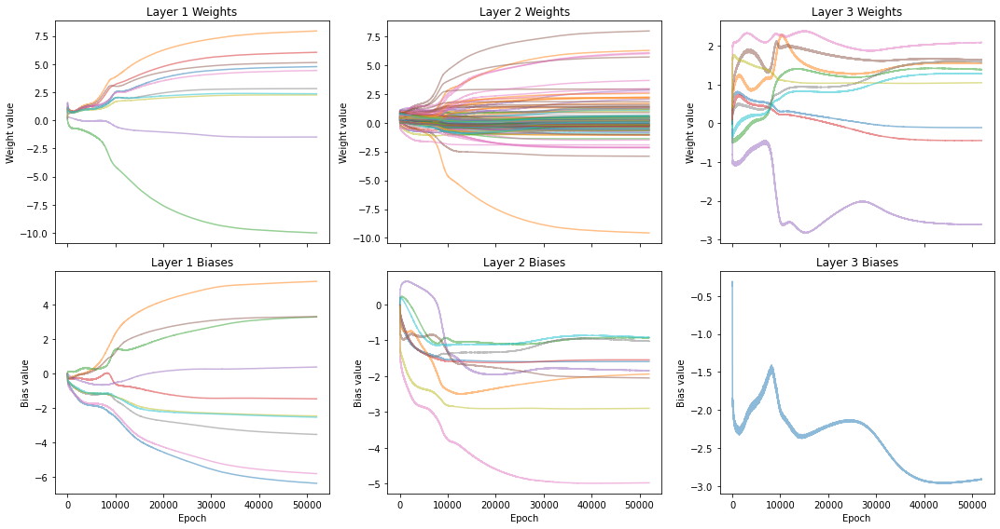

Czas wykonania: 185.000870 sekundy


In [41]:
mlp_steps2 = MLPNoBackprop(layer_sizes = [1, 10, 10, 1])
start_time = time.time()
mlp_steps2.mini_batch_GD(X_stepsS_train_normalized, Y_stepsS_train_normalized, 4, 52000, 0.06)
end_time = time.time()
execution_time = end_time - start_time
print(f"Czas wykonania: {execution_time:.6f} sekundy")

In [42]:
Ypred_normalized2 = mlp_steps2.predict(X_stepsS_train_normalized)
Ypred2 = (Ypred_normalized2 * np.std(Y_stepsS_train)) + np.mean(Y_stepsS_train)
mse_value = mlp_steps2.mse(Ypred2, Y_stepsS_train)
print(mse_value) 

1.6084783124328035


In [173]:
Ypred_normalized2 = mlp_steps2.predict(X_stepsS_train_normalized)
Ypred2 = (Ypred_normalized2 * np.std(Y_stepsS_train)) + np.mean(Y_stepsS_train)
mse_value = mlp_steps2.mse(Ypred2, Y_stepsS_train)
print(mse_value) 

1.5753910567929217


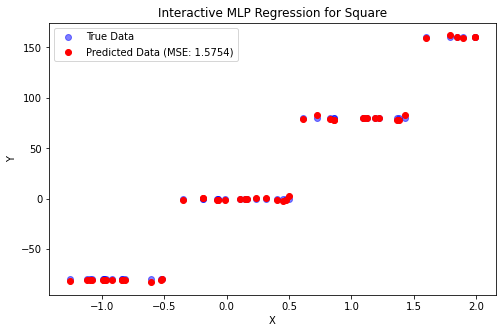

In [174]:
plt.figure(figsize=(8, 5))
plt.scatter(X_stepsS_train, Y_stepsS_train, label='True Data', color='blue', alpha=0.5)
plt.scatter(X_stepsS_train, Ypred2, label=f'Predicted Data (MSE: {mse_value:.4f})', color='red')
plt.legend()
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Interactive MLP Regression for Square')
plt.show()

# MLP FOR MULTIMODAL

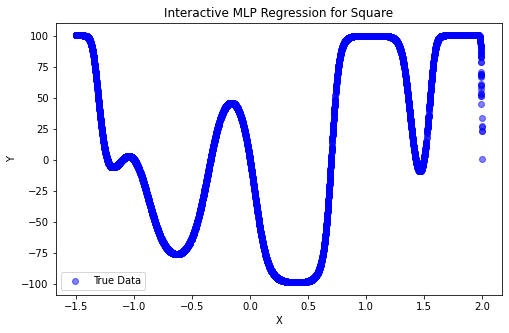

In [175]:
plt.figure(figsize=(8, 5))
plt.scatter(X_multimodalL_train, Y_multimodalL_train, label='True Data', color='blue', alpha=0.5)
plt.legend()
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Interactive MLP Regression for Square')
plt.show()

In [187]:
mlp_multimodal = MLPNoBackprop(layer_sizes = [1, 26, 1], hidden_activation='tanh')
start_time = time.time()
mlp_multimodal.SGD(X_multimodalL_train_normalized, Y_multimodalL_train_normalized, 100, 0.01)
end_time = time.time()
execution_time = end_time - start_time
print(f"Czas wykonania: {execution_time:.6f} sekundy")

Czas wykonania: 44460.318400 sekundy


In [188]:
Ypred_normalized = mlp_multimodal.predict(X_multimodalL_test_normalized)
Ypred = (Ypred_normalized * np.std(Y_multimodalL_train)) + np.mean(Y_multimodalL_train)
print(mlp_steps.mse(Ypred, Y_multimodalL_test))

66.56316593008948


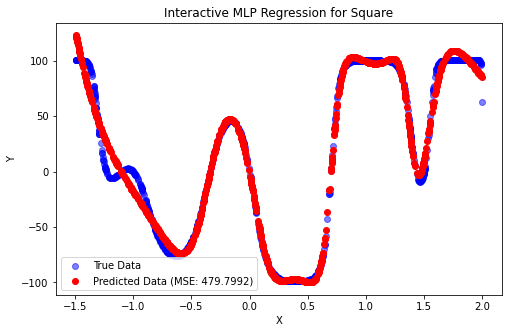

In [219]:
plt.figure(figsize=(8, 5))
plt.scatter(X_multimodalL_test, Y_multimodalL_test, label='True Data', color='blue', alpha=0.5)
plt.scatter(X_multimodalL_test, Ypred, label=f'Predicted Data (MSE: {mse_value:.4f})', color='red')
plt.legend()
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Interactive MLP Regression for Square')
plt.show()

Epoka 0: Loss = 1.113489114
Epoka 10: Loss = 1.461981406
Epoka 20: Loss = 1.580793201
Epoka 30: Loss = 1.599341003
Epoka 40: Loss = 1.517901195
Epoka 50: Loss = 1.437358686
Epoka 60: Loss = 1.413470388
Epoka 70: Loss = 1.442124858
Epoka 80: Loss = 1.441733230
Epoka 90: Loss = 1.440692185
Epoka 100: Loss = 1.386360729
Epoka 110: Loss = 1.433431472
Epoka 120: Loss = 1.394281870
Epoka 130: Loss = 1.390323271
Epoka 140: Loss = 1.371293778
Epoka 150: Loss = 1.389494311
Epoka 160: Loss = 1.333482961
Epoka 170: Loss = 1.331075096
Epoka 180: Loss = 1.358171093
Epoka 190: Loss = 1.301366672
Epoka 200: Loss = 1.233251681
Epoka 210: Loss = 1.243853893
Epoka 220: Loss = 1.223289138
Epoka 230: Loss = 1.216566211
Epoka 240: Loss = 1.246719390
Epoka 250: Loss = 1.250250138
Epoka 260: Loss = 1.255152841
Epoka 270: Loss = 1.259085859
Epoka 280: Loss = 1.261519412
Epoka 290: Loss = 1.261648112
Epoka 300: Loss = 1.268628335
Epoka 310: Loss = 1.280503620
Epoka 320: Loss = 1.279312391
Epoka 330: Loss = 1.2

Epoka 2680: Loss = 1.317035983
Epoka 2690: Loss = 1.324399509
Epoka 2700: Loss = 1.327601971
Epoka 2710: Loss = 1.342535812
Epoka 2720: Loss = 1.325307209
Epoka 2730: Loss = 1.326584362
Epoka 2740: Loss = 1.319597178
Epoka 2750: Loss = 1.337039773
Epoka 2760: Loss = 1.333261174
Epoka 2770: Loss = 1.343788494
Epoka 2780: Loss = 1.349174822
Epoka 2790: Loss = 1.329839920
Epoka 2800: Loss = 1.328847168
Epoka 2810: Loss = 1.333448618
Epoka 2820: Loss = 1.332487859
Epoka 2830: Loss = 1.337955186
Epoka 2840: Loss = 1.346448772
Epoka 2850: Loss = 1.333973689
Epoka 2860: Loss = 1.340519074
Epoka 2870: Loss = 1.337490936
Epoka 2880: Loss = 1.332281788
Epoka 2890: Loss = 1.322863670
Epoka 2900: Loss = 1.334356376
Epoka 2910: Loss = 1.335478503
Epoka 2920: Loss = 1.336011102
Epoka 2930: Loss = 1.332897108
Epoka 2940: Loss = 1.311587782
Epoka 2950: Loss = 1.329082499
Epoka 2960: Loss = 1.325056613
Epoka 2970: Loss = 1.339602087
Epoka 2980: Loss = 1.326155437
Epoka 2990: Loss = 1.325775681
Epoka 30

Epoka 5330: Loss = 1.283318355
Epoka 5340: Loss = 1.283382955
Epoka 5350: Loss = 1.283990173
Epoka 5360: Loss = 1.278798328
Epoka 5370: Loss = 1.278325102
Epoka 5380: Loss = 1.288799854
Epoka 5390: Loss = 1.270353532
Epoka 5400: Loss = 1.287583597
Epoka 5410: Loss = 1.292092294
Epoka 5420: Loss = 1.287954349
Epoka 5430: Loss = 1.283363078
Epoka 5440: Loss = 1.294591448
Epoka 5450: Loss = 1.282719077
Epoka 5460: Loss = 1.284013403
Epoka 5470: Loss = 1.293278527
Epoka 5480: Loss = 1.281713594
Epoka 5490: Loss = 1.281268262
Epoka 5500: Loss = 1.289821292
Epoka 5510: Loss = 1.282375055
Epoka 5520: Loss = 1.275367687
Epoka 5530: Loss = 1.281013879
Epoka 5540: Loss = 1.286776034
Epoka 5550: Loss = 1.273835135
Epoka 5560: Loss = 1.274334776
Epoka 5570: Loss = 1.284915685
Epoka 5580: Loss = 1.291345705
Epoka 5590: Loss = 1.287175438
Epoka 5600: Loss = 1.274532868
Epoka 5610: Loss = 1.286588478
Epoka 5620: Loss = 1.285549139
Epoka 5630: Loss = 1.276311870
Epoka 5640: Loss = 1.274678757
Epoka 56

Epoka 7980: Loss = 1.235315642
Epoka 7990: Loss = 1.250452136
Epoka 8000: Loss = 1.239504953
Epoka 8010: Loss = 1.231850397
Epoka 8020: Loss = 1.250347695
Epoka 8030: Loss = 1.241727582
Epoka 8040: Loss = 1.240087307
Epoka 8050: Loss = 1.231466841
Epoka 8060: Loss = 1.237568330
Epoka 8070: Loss = 1.249588551
Epoka 8080: Loss = 1.240268312
Epoka 8090: Loss = 1.242175053
Epoka 8100: Loss = 1.232535896
Epoka 8110: Loss = 1.233998258
Epoka 8120: Loss = 1.233000252
Epoka 8130: Loss = 1.248292287
Epoka 8140: Loss = 1.233095212
Epoka 8150: Loss = 1.233088010
Epoka 8160: Loss = 1.241239356
Epoka 8170: Loss = 1.239100102
Epoka 8180: Loss = 1.237170599
Epoka 8190: Loss = 1.234030909
Epoka 8200: Loss = 1.240678825
Epoka 8210: Loss = 1.245714763
Epoka 8220: Loss = 1.239633101
Epoka 8230: Loss = 1.242432767
Epoka 8240: Loss = 1.236248200
Epoka 8250: Loss = 1.238771025
Epoka 8260: Loss = 1.232308915
Epoka 8270: Loss = 1.236504855
Epoka 8280: Loss = 1.241282436
Epoka 8290: Loss = 1.249547636
Epoka 83

Epoka 10610: Loss = 1.233100957
Epoka 10620: Loss = 1.228110002
Epoka 10630: Loss = 1.215179094
Epoka 10640: Loss = 1.218579479
Epoka 10650: Loss = 1.212409388
Epoka 10660: Loss = 1.218331476
Epoka 10670: Loss = 1.230946397
Epoka 10680: Loss = 1.219384550
Epoka 10690: Loss = 1.226363613
Epoka 10700: Loss = 1.222413117
Epoka 10710: Loss = 1.221208584
Epoka 10720: Loss = 1.221191952
Epoka 10730: Loss = 1.224815229
Epoka 10740: Loss = 1.227617796
Epoka 10750: Loss = 1.222313691
Epoka 10760: Loss = 1.219156269
Epoka 10770: Loss = 1.213190142
Epoka 10780: Loss = 1.214968948
Epoka 10790: Loss = 1.220756002
Epoka 10800: Loss = 1.217355148
Epoka 10810: Loss = 1.226400471
Epoka 10820: Loss = 1.224663822
Epoka 10830: Loss = 1.226998692
Epoka 10840: Loss = 1.234402942
Epoka 10850: Loss = 1.211331219
Epoka 10860: Loss = 1.222475705
Epoka 10870: Loss = 1.226205060
Epoka 10880: Loss = 1.218174399
Epoka 10890: Loss = 1.220397979
Epoka 10900: Loss = 1.215173315
Epoka 10910: Loss = 1.206151647
Epoka 10

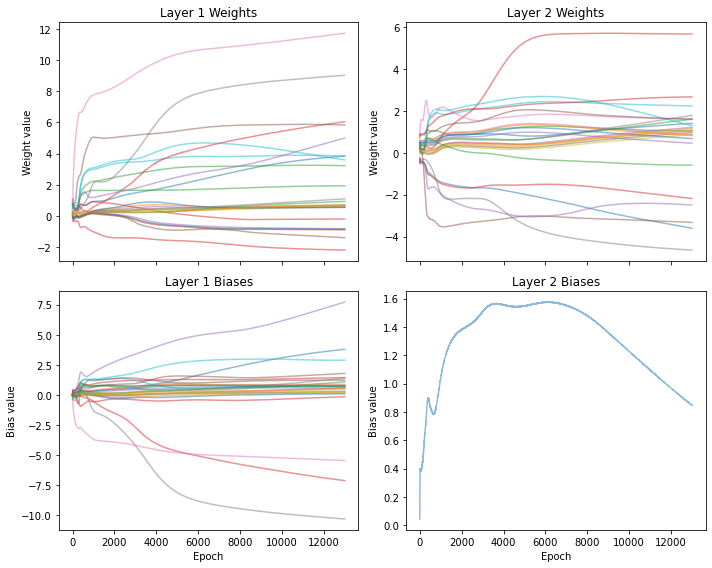

Czas wykonania: 953.058971 sekundy


In [43]:
mlp_multimodal2 = MLPNoBackprop(layer_sizes = [1, 26, 1], hidden_activation='tanh')
start_time = time.time()
mlp_multimodal2.mini_batch_GD(X_multimodalL_train_normalized, Y_multimodalL_train_normalized, 10, 13000, 0.001)
end_time = time.time()
execution_time = end_time - start_time
print(f"Czas wykonania: {execution_time:.6f} sekundy")

In [44]:
Ypred_normalized2 = mlp_multimodal2.predict(X_multimodalL_test_normalized)
Ypred2 = (Ypred_normalized2 * np.std(Y_multimodalL_train)) + np.mean(Y_multimodalL_train)
print(mlp_steps.mse(Ypred2, Y_multimodalL_test))

32.97740561470125


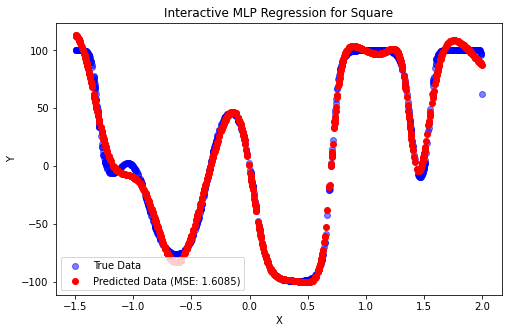

In [45]:
plt.figure(figsize=(8, 5))
plt.scatter(X_multimodalL_test, Y_multimodalL_test, label='True Data', color='blue', alpha=0.5)
plt.scatter(X_multimodalL_test, Ypred2, label=f'Predicted Data (MSE: {mse_value:.4f})', color='red')
plt.legend()
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Interactive MLP Regression for Square')
plt.show()

# ----------------------------------------NN3--------------------------------------------------

### Now I have to implement two improvements to gradient-based learning: Momentum and gradient normalization using RMSprop I will be working on these datasets: square-large, steps-large and multimodal-large   Steps-large and Multimodal-Large have been already loaded. 


stepsL_train = pd.read_csv('steps-large-training.csv')  
stepsL_test = pd.read_csv('steps-large-test.csv')  
X_stepsL_train = np.array(stepsL_train[['x']])  
Y_stepsL_train = np.array(stepsL_train[['y']])  
X_stepsL_test = np.array(stepsL_test[['x']])  
Y_stepsL_test = np.array(stepsL_test[['y']])  
  
  
multimodalL_train = pd.read_csv('multimodal-large-training.csv')  
multimodalL_test = pd.read_csv('multimodal-large-test.csv')  
X_multimodalL_train = np.array(multimodalL_train[['x']])  
Y_multimodalL_train = np.array(multimodalL_train[['y']])  
X_multimodalL_test = np.array(multimodalL_test[['x']])  
Y_multimodalL_test = np.array(multimodalL_test[['y']])  
  
### multimodal-large have been additionaly normalised
X_multimodalL_train_normalized = (X_multimodalL_train-   np.mean(X_multimodalL_train))/(np.std(X_multimodalL_train))  
Y_multimodalL_train_normalized = (Y_multimodalL_train-   np.mean(Y_multimodalL_train))/(np.std(Y_multimodalL_train))  
X_multimodalL_test_normalized = (X_multimodalL_test-   np.mean(X_multimodalL_train))/(np.std(X_multimodalL_train))  
Y_multimodalL_test_normalized = (Y_multimodalL_test-   np.mean(Y_multimodalL_train))/(np.std(Y_multimodalL_train))  

### now i have to load square-large dataset and normalize it, just like the steps-large dataset

In [14]:
squareL_train =pd.read_csv('square-large-training.csv')
squareL_test = pd.read_csv('square-large-test.csv')
X_squareL_train = np.array(squareL_train[['x']])
Y_squareL_train = np.array(squareL_train[['y']])
X_squareL_test = np.array(squareL_test[['x']])
Y_squareL_test =np.array(squareL_test[['y']])

### now lets normalize square-large and steps-large

#### square


In [15]:
X_squareL_train_normalized = (X_squareL_train- np.mean(X_squareL_train))/(np.std(X_squareL_train))
Y_squareL_train_normalized = (Y_squareL_train- np.mean(Y_squareL_train))/(np.std(Y_squareL_train))
X_squareL_test_normalized = (X_squareL_test- np.mean(X_squareL_train))/(np.std(X_squareL_train))
Y_squareL_test_normalized = (Y_squareL_test- np.mean(Y_squareL_train))/(np.std(Y_squareL_train))

#### steps

In [16]:
X_stepsL_train_normalized = (X_stepsL_train- np.mean(X_stepsL_train))/(np.std(X_stepsL_train))
Y_stepsL_train_normalized =(Y_stepsL_train - np.mean(Y_stepsL_train))/(np.std(Y_stepsL_train))
X_stepsL_test_normalized = (X_stepsL_test - np.mean(X_stepsL_train))/(np.std(X_stepsL_train))
Y_stepsL_test_normalized =(Y_stepsL_test - np.mean(Y_stepsL_train))/(np.std(Y_stepsL_train)) 

## MLP for square_large trained using sgd with momentum

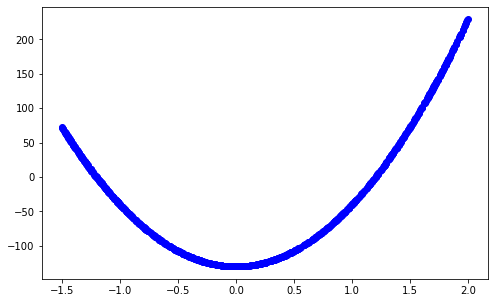

In [39]:
plt.figure(figsize=(8,5))
plt.scatter(X_squareL_train, Y_squareL_train, color='blue')

#### miało być sgd ale dałam batcha 10 bo strasznie długo się liczyło

## momentum

Epoka 0: Loss = 0.937851822
Epoka 10: Loss = 0.166492491
Epoka 20: Loss = 0.002627062
Epoka 30: Loss = 0.000722276
Epoka 40: Loss = 0.000382228
Epoka 50: Loss = 0.000250212
Epoka 60: Loss = 0.000245872
Epoka 70: Loss = 0.000174776
Epoka 80: Loss = 0.000165454
Epoka 90: Loss = 0.000161546
Epoka 100: Loss = 0.000161607
Epoka 110: Loss = 0.000141774
Epoka 120: Loss = 0.000132300
Epoka 130: Loss = 0.000133097
Epoka 140: Loss = 0.000129854
Epoka 150: Loss = 0.000123725
Epoka 160: Loss = 0.000116243
Epoka 170: Loss = 0.000113164
Epoka 180: Loss = 0.000108945
Epoka 190: Loss = 0.000114185
Epoka 200: Loss = 0.000120001
Epoka 210: Loss = 0.000102242
Epoka 220: Loss = 0.000105866
Epoka 230: Loss = 0.000094113
Epoka 240: Loss = 0.000096055
Epoka 250: Loss = 0.000139928
Epoka 260: Loss = 0.000086919
Epoka 270: Loss = 0.000084336
Epoka 280: Loss = 0.000093394
Epoka 290: Loss = 0.000087246
Epoka 300: Loss = 0.000077859
Epoka 310: Loss = 0.000078831
Epoka 320: Loss = 0.000074232
Epoka 330: Loss = 0.0

Epoka 2680: Loss = 0.000001935
Epoka 2690: Loss = 0.000001848
Epoka 2700: Loss = 0.000001919
Epoka 2710: Loss = 0.000001904
Epoka 2720: Loss = 0.000002134
Epoka 2730: Loss = 0.000002011
Epoka 2740: Loss = 0.000001961
Epoka 2750: Loss = 0.000001880
Epoka 2760: Loss = 0.000002107
Epoka 2770: Loss = 0.000001880
Epoka 2780: Loss = 0.000001951
Epoka 2790: Loss = 0.000001954
Epoka 2800: Loss = 0.000001779
Epoka 2810: Loss = 0.000002006
Epoka 2820: Loss = 0.000002320
Epoka 2830: Loss = 0.000001757
Epoka 2840: Loss = 0.000001798
Epoka 2850: Loss = 0.000001787
Epoka 2860: Loss = 0.000001705
Epoka 2870: Loss = 0.000001733
Epoka 2880: Loss = 0.000002845
Epoka 2890: Loss = 0.000001757
Epoka 2900: Loss = 0.000001748
Epoka 2910: Loss = 0.000001887
Epoka 2920: Loss = 0.000001845
Epoka 2930: Loss = 0.000001755
Epoka 2940: Loss = 0.000001722
Epoka 2950: Loss = 0.000002423
Epoka 2960: Loss = 0.000001731
Epoka 2970: Loss = 0.000001914
Epoka 2980: Loss = 0.000001838
Epoka 2990: Loss = 0.000001830
Epoka 30

Epoka 5360: Loss = 0.000001241
Epoka 5370: Loss = 0.000001181
Epoka 5380: Loss = 0.000001298
Epoka 5390: Loss = 0.000001215
Epoka 5400: Loss = 0.000001149
Epoka 5410: Loss = 0.000001221
Epoka 5420: Loss = 0.000001148
Epoka 5430: Loss = 0.000001328
Epoka 5440: Loss = 0.000001349
Epoka 5450: Loss = 0.000001201
Epoka 5460: Loss = 0.000001795
Epoka 5470: Loss = 0.000001157
Epoka 5480: Loss = 0.000001238
Epoka 5490: Loss = 0.000001212
Epoka 5500: Loss = 0.000001283
Epoka 5510: Loss = 0.000001342
Epoka 5520: Loss = 0.000001147
Epoka 5530: Loss = 0.000001295
Epoka 5540: Loss = 0.000001583
Epoka 5550: Loss = 0.000001148
Epoka 5560: Loss = 0.000001225
Epoka 5570: Loss = 0.000001234
Epoka 5580: Loss = 0.000001209
Epoka 5590: Loss = 0.000001175
Epoka 5600: Loss = 0.000001179
Epoka 5610: Loss = 0.000001305
Epoka 5620: Loss = 0.000001239
Epoka 5630: Loss = 0.000001718
Epoka 5640: Loss = 0.000001116
Epoka 5650: Loss = 0.000001253
Epoka 5660: Loss = 0.000001182
Epoka 5670: Loss = 0.000001334
Epoka 56

Epoka 8010: Loss = 0.000001133
Epoka 8020: Loss = 0.000000977
Epoka 8030: Loss = 0.000000949
Epoka 8040: Loss = 0.000001275
Epoka 8050: Loss = 0.000001005
Epoka 8060: Loss = 0.000000998
Epoka 8070: Loss = 0.000001021
Epoka 8080: Loss = 0.000001309
Epoka 8090: Loss = 0.000001004
Epoka 8100: Loss = 0.000000987
Epoka 8110: Loss = 0.000001130
Epoka 8120: Loss = 0.000001077
Epoka 8130: Loss = 0.000001016
Epoka 8140: Loss = 0.000001197
Epoka 8150: Loss = 0.000001017
Epoka 8160: Loss = 0.000001197
Epoka 8170: Loss = 0.000000916
Epoka 8180: Loss = 0.000000966
Epoka 8190: Loss = 0.000001571
Epoka 8200: Loss = 0.000001009
Epoka 8210: Loss = 0.000000950
Epoka 8220: Loss = 0.000000903
Epoka 8230: Loss = 0.000001077
Epoka 8240: Loss = 0.000000904
Epoka 8250: Loss = 0.000001539
Epoka 8260: Loss = 0.000001066
Epoka 8270: Loss = 0.000000905
Epoka 8280: Loss = 0.000001108
Epoka 8290: Loss = 0.000000950
Epoka 8300: Loss = 0.000000897
Epoka 8310: Loss = 0.000001352
Epoka 8320: Loss = 0.000000928
Epoka 83

Epoka 10640: Loss = 0.000000794
Epoka 10650: Loss = 0.000000784
Epoka 10660: Loss = 0.000000882
Epoka 10670: Loss = 0.000000946
Epoka 10680: Loss = 0.000001049
Epoka 10690: Loss = 0.000000968
Epoka 10700: Loss = 0.000000928
Epoka 10710: Loss = 0.000000780
Epoka 10720: Loss = 0.000000775
Epoka 10730: Loss = 0.000000767
Epoka 10740: Loss = 0.000000780
Epoka 10750: Loss = 0.000001021
Epoka 10760: Loss = 0.000000826
Epoka 10770: Loss = 0.000000772
Epoka 10780: Loss = 0.000000908
Epoka 10790: Loss = 0.000000945
Epoka 10800: Loss = 0.000000873
Epoka 10810: Loss = 0.000001199
Epoka 10820: Loss = 0.000000765
Epoka 10830: Loss = 0.000000782
Epoka 10840: Loss = 0.000000839
Epoka 10850: Loss = 0.000000764
Epoka 10860: Loss = 0.000000751
Epoka 10870: Loss = 0.000000826
Epoka 10880: Loss = 0.000000861
Epoka 10890: Loss = 0.000000898
Epoka 10900: Loss = 0.000000764
Epoka 10910: Loss = 0.000000812
Epoka 10920: Loss = 0.000000888
Epoka 10930: Loss = 0.000000819
Epoka 10940: Loss = 0.000000804
Epoka 10

Epoka 13210: Loss = 0.000000872
Epoka 13220: Loss = 0.000000649
Epoka 13230: Loss = 0.000000675
Epoka 13240: Loss = 0.000000723
Epoka 13250: Loss = 0.000000645
Epoka 13260: Loss = 0.000000734
Epoka 13270: Loss = 0.000000702
Epoka 13280: Loss = 0.000000726
Epoka 13290: Loss = 0.000000708
Epoka 13300: Loss = 0.000000703
Epoka 13310: Loss = 0.000000640
Epoka 13320: Loss = 0.000000652
Epoka 13330: Loss = 0.000000719
Epoka 13340: Loss = 0.000000643
Epoka 13350: Loss = 0.000000712
Epoka 13360: Loss = 0.000000633
Epoka 13370: Loss = 0.000000787
Epoka 13380: Loss = 0.000000762
Epoka 13390: Loss = 0.000000737
Epoka 13400: Loss = 0.000000834
Epoka 13410: Loss = 0.000000652
Epoka 13420: Loss = 0.000000724
Epoka 13430: Loss = 0.000000663
Epoka 13440: Loss = 0.000000671
Epoka 13450: Loss = 0.000000658
Epoka 13460: Loss = 0.000000677
Epoka 13470: Loss = 0.000000742
Epoka 13480: Loss = 0.000000665
Epoka 13490: Loss = 0.000000638
Epoka 13500: Loss = 0.000000691
Epoka 13510: Loss = 0.000000731
Epoka 13

Epoka 15790: Loss = 0.000000679
Epoka 15800: Loss = 0.000000556
Epoka 15810: Loss = 0.000000585
Epoka 15820: Loss = 0.000000616
Epoka 15830: Loss = 0.000000568
Epoka 15840: Loss = 0.000000638
Epoka 15850: Loss = 0.000000635
Epoka 15860: Loss = 0.000000597
Epoka 15870: Loss = 0.000000566
Epoka 15880: Loss = 0.000000745
Epoka 15890: Loss = 0.000000576
Epoka 15900: Loss = 0.000000675
Epoka 15910: Loss = 0.000000627
Epoka 15920: Loss = 0.000000576
Epoka 15930: Loss = 0.000000636
Epoka 15940: Loss = 0.000000542
Epoka 15950: Loss = 0.000000556
Epoka 15960: Loss = 0.000000734
Epoka 15970: Loss = 0.000000581
Epoka 15980: Loss = 0.000000671
Epoka 15990: Loss = 0.000000552
Epoka 16000: Loss = 0.000000552
Epoka 16010: Loss = 0.000000663
Epoka 16020: Loss = 0.000000815
Epoka 16030: Loss = 0.000000603
Epoka 16040: Loss = 0.000000715
Epoka 16050: Loss = 0.000000628
Epoka 16060: Loss = 0.000000918
Epoka 16070: Loss = 0.000000573
Epoka 16080: Loss = 0.000000589
Epoka 16090: Loss = 0.000000546
Epoka 16

Epoka 18390: Loss = 0.000000501
Epoka 18400: Loss = 0.000000501
Epoka 18410: Loss = 0.000000549
Epoka 18420: Loss = 0.000000488
Epoka 18430: Loss = 0.000000575
Epoka 18440: Loss = 0.000000478
Epoka 18450: Loss = 0.000000635
Epoka 18460: Loss = 0.000000478
Epoka 18470: Loss = 0.000000525
Epoka 18480: Loss = 0.000000551
Epoka 18490: Loss = 0.000000526
Epoka 18500: Loss = 0.000000495
Epoka 18510: Loss = 0.000000478
Epoka 18520: Loss = 0.000000683
Epoka 18530: Loss = 0.000000493
Epoka 18540: Loss = 0.000000628
Epoka 18550: Loss = 0.000000489
Epoka 18560: Loss = 0.000000633
Epoka 18570: Loss = 0.000000486
Epoka 18580: Loss = 0.000000505
Epoka 18590: Loss = 0.000000530
Epoka 18600: Loss = 0.000000736
Epoka 18610: Loss = 0.000000548
Epoka 18620: Loss = 0.000000486
Epoka 18630: Loss = 0.000000504
Epoka 18640: Loss = 0.000000558
Epoka 18650: Loss = 0.000000513
Epoka 18660: Loss = 0.000000492
Epoka 18670: Loss = 0.000000520
Epoka 18680: Loss = 0.000000495
Epoka 18690: Loss = 0.000000512
Epoka 18

Epoka 20990: Loss = 0.000000447
Epoka 21000: Loss = 0.000000515
Epoka 21010: Loss = 0.000000490
Epoka 21020: Loss = 0.000000423
Epoka 21030: Loss = 0.000000547
Epoka 21040: Loss = 0.000000434
Epoka 21050: Loss = 0.000000463
Epoka 21060: Loss = 0.000000538
Epoka 21070: Loss = 0.000000437
Epoka 21080: Loss = 0.000000460
Epoka 21090: Loss = 0.000000553
Epoka 21100: Loss = 0.000000504
Epoka 21110: Loss = 0.000000573
Epoka 21120: Loss = 0.000000442
Epoka 21130: Loss = 0.000000428
Epoka 21140: Loss = 0.000000524
Epoka 21150: Loss = 0.000000468
Epoka 21160: Loss = 0.000000427
Epoka 21170: Loss = 0.000000470
Epoka 21180: Loss = 0.000000434
Epoka 21190: Loss = 0.000000479
Epoka 21200: Loss = 0.000000421
Epoka 21210: Loss = 0.000000587
Epoka 21220: Loss = 0.000000494
Epoka 21230: Loss = 0.000000416
Epoka 21240: Loss = 0.000000463
Epoka 21250: Loss = 0.000000455
Epoka 21260: Loss = 0.000000506
Epoka 21270: Loss = 0.000000420
Epoka 21280: Loss = 0.000000462
Epoka 21290: Loss = 0.000000427
Epoka 21

Epoka 23590: Loss = 0.000000558
Epoka 23600: Loss = 0.000000499
Epoka 23610: Loss = 0.000000413
Epoka 23620: Loss = 0.000000386
Epoka 23630: Loss = 0.000000468
Epoka 23640: Loss = 0.000000390
Epoka 23650: Loss = 0.000000369
Epoka 23660: Loss = 0.000000379
Epoka 23670: Loss = 0.000000375
Epoka 23680: Loss = 0.000000404
Epoka 23690: Loss = 0.000000774
Epoka 23700: Loss = 0.000000408
Epoka 23710: Loss = 0.000000418
Epoka 23720: Loss = 0.000000388
Epoka 23730: Loss = 0.000000431
Epoka 23740: Loss = 0.000000431
Epoka 23750: Loss = 0.000000398
Epoka 23760: Loss = 0.000000382
Epoka 23770: Loss = 0.000000474
Epoka 23780: Loss = 0.000000368
Epoka 23790: Loss = 0.000000430
Epoka 23800: Loss = 0.000000407
Epoka 23810: Loss = 0.000000413
Epoka 23820: Loss = 0.000000395
Epoka 23830: Loss = 0.000000451
Epoka 23840: Loss = 0.000000389
Epoka 23850: Loss = 0.000000465
Epoka 23860: Loss = 0.000000437
Epoka 23870: Loss = 0.000000372
Epoka 23880: Loss = 0.000000439
Epoka 23890: Loss = 0.000000438
Epoka 23

Epoka 26160: Loss = 0.000000347
Epoka 26170: Loss = 0.000000328
Epoka 26180: Loss = 0.000000407
Epoka 26190: Loss = 0.000000353
Epoka 26200: Loss = 0.000000342
Epoka 26210: Loss = 0.000000379
Epoka 26220: Loss = 0.000000373
Epoka 26230: Loss = 0.000000353
Epoka 26240: Loss = 0.000000352
Epoka 26250: Loss = 0.000000451
Epoka 26260: Loss = 0.000000330
Epoka 26270: Loss = 0.000000331
Epoka 26280: Loss = 0.000000419
Epoka 26290: Loss = 0.000000545
Epoka 26300: Loss = 0.000000331
Epoka 26310: Loss = 0.000000555
Epoka 26320: Loss = 0.000000327
Epoka 26330: Loss = 0.000000333
Epoka 26340: Loss = 0.000000329
Epoka 26350: Loss = 0.000000400
Epoka 26360: Loss = 0.000000439
Epoka 26370: Loss = 0.000000349
Epoka 26380: Loss = 0.000000429
Epoka 26390: Loss = 0.000000335
Epoka 26400: Loss = 0.000000419
Epoka 26410: Loss = 0.000000361
Epoka 26420: Loss = 0.000000390
Epoka 26430: Loss = 0.000000346
Epoka 26440: Loss = 0.000000372
Epoka 26450: Loss = 0.000000408
Epoka 26460: Loss = 0.000000336
Epoka 26

Epoka 28750: Loss = 0.000000414
Epoka 28760: Loss = 0.000000299
Epoka 28770: Loss = 0.000000314
Epoka 28780: Loss = 0.000000300
Epoka 28790: Loss = 0.000000338
Epoka 28800: Loss = 0.000000363
Epoka 28810: Loss = 0.000000325
Epoka 28820: Loss = 0.000000323
Epoka 28830: Loss = 0.000000397
Epoka 28840: Loss = 0.000000299
Epoka 28850: Loss = 0.000000301
Epoka 28860: Loss = 0.000000297
Epoka 28870: Loss = 0.000000295
Epoka 28880: Loss = 0.000000345
Epoka 28890: Loss = 0.000000329
Epoka 28900: Loss = 0.000000329
Epoka 28910: Loss = 0.000000350
Epoka 28920: Loss = 0.000000372
Epoka 28930: Loss = 0.000000369
Epoka 28940: Loss = 0.000000304
Epoka 28950: Loss = 0.000000337
Epoka 28960: Loss = 0.000000312
Epoka 28970: Loss = 0.000000309
Epoka 28980: Loss = 0.000000359
Epoka 28990: Loss = 0.000000324
Epoka 29000: Loss = 0.000000299
Epoka 29010: Loss = 0.000000318
Epoka 29020: Loss = 0.000000397
Epoka 29030: Loss = 0.000000292
Epoka 29040: Loss = 0.000000422
Epoka 29050: Loss = 0.000000321
Epoka 29

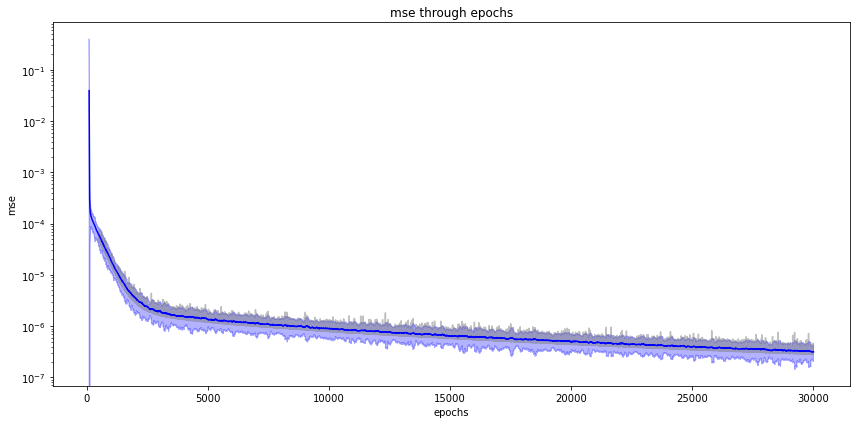

Czas wykonania: 237.892449 sekundy


In [33]:
mlp_squareL = MLPNoBackprop(layer_sizes = [1, 15, 15, 1])
start_time = time.time()
mlp_squareL.momentum(X_squareL_train_normalized, Y_squareL_train_normalized, epochs = 30000, learning_rate=0.05, Lambda=0.9, batch_size=20)
end_time = time.time()
execution_time = end_time - start_time
print(f"Czas wykonania: {execution_time:.6f} sekundy")

In [268]:
ypred_normalized = mlp_squareL.predict(X_squareL_train_normalized)
ypred = ypred_normalized *np.std(Y_squareL_train) +np.mean(Y_squareL_train)
print(mlp_squareL.mse(ypred, Y_squareL_train))


0.0021961347516349906


In [259]:
ypred_normalized = mlp_squareL.predict(X_squareL_test_normalized)
ypred = ypred_normalized *np.std(Y_squareL_train) +np.mean(Y_squareL_train)
print(mlp_squareL.mse(ypred, Y_squareL_test))


5.372767564366863


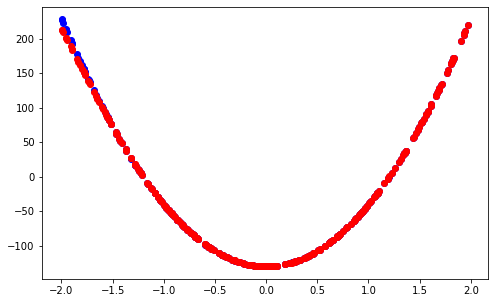

In [260]:
plt.figure(figsize=(8,5))
plt.scatter(X_squareL_test, Y_squareL_test, color='blue')
plt.scatter(X_squareL_test, ypred, color='red')

## RMSprop

Epoka 0: Loss = 17.661050365
Epoka 10: Loss = 0.647418470
Epoka 20: Loss = 0.361397699
Epoka 30: Loss = 0.051141629
Epoka 40: Loss = 0.020723805
Epoka 50: Loss = 0.011808849
Epoka 60: Loss = 0.007800685
Epoka 70: Loss = 0.005225687
Epoka 80: Loss = 0.003730380
Epoka 90: Loss = 0.002732017
Epoka 100: Loss = 0.001894379
Epoka 110: Loss = 0.001374161
Epoka 120: Loss = 0.000971732
Epoka 130: Loss = 0.000681100
Epoka 140: Loss = 0.000754126
Epoka 150: Loss = 0.000366883
Epoka 160: Loss = 0.000858818
Epoka 170: Loss = 0.000349934
Epoka 180: Loss = 0.000261529
Epoka 190: Loss = 0.000154125
Epoka 200: Loss = 0.000452308
Epoka 210: Loss = 0.000295579
Epoka 220: Loss = 0.000113844
Epoka 230: Loss = 0.000122605
Epoka 240: Loss = 0.000108319
Epoka 250: Loss = 0.000109042
Epoka 260: Loss = 0.000112160
Epoka 270: Loss = 0.000370733
Epoka 280: Loss = 0.000090142
Epoka 290: Loss = 0.000107485
Epoka 300: Loss = 0.000225266
Epoka 310: Loss = 0.000075571
Epoka 320: Loss = 0.000157587
Epoka 330: Loss = 0.

Epoka 2680: Loss = 0.000039053
Epoka 2690: Loss = 0.000012379
Epoka 2700: Loss = 0.000006157
Epoka 2710: Loss = 0.000003922
Epoka 2720: Loss = 0.000109332
Epoka 2730: Loss = 0.000010600
Epoka 2740: Loss = 0.000260215
Epoka 2750: Loss = 0.000092008
Epoka 2760: Loss = 0.000057427
Epoka 2770: Loss = 0.000008274
Epoka 2780: Loss = 0.000228378
Epoka 2790: Loss = 0.000009440
Epoka 2800: Loss = 0.000004808
Epoka 2810: Loss = 0.000012497
Epoka 2820: Loss = 0.000009072
Epoka 2830: Loss = 0.000007211
Epoka 2840: Loss = 0.000051592
Epoka 2850: Loss = 0.000006145
Epoka 2860: Loss = 0.000027925
Epoka 2870: Loss = 0.000038352
Epoka 2880: Loss = 0.000014511
Epoka 2890: Loss = 0.000004569
Epoka 2900: Loss = 0.000031607
Epoka 2910: Loss = 0.000106398
Epoka 2920: Loss = 0.000005357
Epoka 2930: Loss = 0.000066827
Epoka 2940: Loss = 0.000012429
Epoka 2950: Loss = 0.000017650
Epoka 2960: Loss = 0.000052483
Epoka 2970: Loss = 0.000060775
Epoka 2980: Loss = 0.000024065
Epoka 2990: Loss = 0.000006636
Epoka 30

Epoka 5350: Loss = 0.000007610
Epoka 5360: Loss = 0.000002307
Epoka 5370: Loss = 0.000014572
Epoka 5380: Loss = 0.000028131
Epoka 5390: Loss = 0.000022364
Epoka 5400: Loss = 0.000007905
Epoka 5410: Loss = 0.000003501
Epoka 5420: Loss = 0.000009372
Epoka 5430: Loss = 0.000124880
Epoka 5440: Loss = 0.000011787
Epoka 5450: Loss = 0.000005427
Epoka 5460: Loss = 0.000006147
Epoka 5470: Loss = 0.000019102
Epoka 5480: Loss = 0.000008973
Epoka 5490: Loss = 0.000028615
Epoka 5500: Loss = 0.000006506
Epoka 5510: Loss = 0.000043772
Epoka 5520: Loss = 0.000028225
Epoka 5530: Loss = 0.000012701
Epoka 5540: Loss = 0.000011333
Epoka 5550: Loss = 0.000079522
Epoka 5560: Loss = 0.000175809
Epoka 5570: Loss = 0.000202520
Epoka 5580: Loss = 0.000003918
Epoka 5590: Loss = 0.000141306
Epoka 5600: Loss = 0.000020062
Epoka 5610: Loss = 0.000054480
Epoka 5620: Loss = 0.000008406
Epoka 5630: Loss = 0.000009638
Epoka 5640: Loss = 0.000006006
Epoka 5650: Loss = 0.000021333
Epoka 5660: Loss = 0.000034960
Epoka 56

Epoka 8000: Loss = 0.000051803
Epoka 8010: Loss = 0.000037089
Epoka 8020: Loss = 0.000041377
Epoka 8030: Loss = 0.000001234
Epoka 8040: Loss = 0.000007580
Epoka 8050: Loss = 0.000001876
Epoka 8060: Loss = 0.000036681
Epoka 8070: Loss = 0.000001963
Epoka 8080: Loss = 0.000006943
Epoka 8090: Loss = 0.000013904
Epoka 8100: Loss = 0.000074879
Epoka 8110: Loss = 0.000029572
Epoka 8120: Loss = 0.000049210
Epoka 8130: Loss = 0.000287275
Epoka 8140: Loss = 0.000042800
Epoka 8150: Loss = 0.000019224
Epoka 8160: Loss = 0.000034671
Epoka 8170: Loss = 0.000157793
Epoka 8180: Loss = 0.000070044
Epoka 8190: Loss = 0.000023003
Epoka 8200: Loss = 0.000185162
Epoka 8210: Loss = 0.000132934
Epoka 8220: Loss = 0.000003820
Epoka 8230: Loss = 0.000019191
Epoka 8240: Loss = 0.000038733
Epoka 8250: Loss = 0.000011270
Epoka 8260: Loss = 0.000067417
Epoka 8270: Loss = 0.000178324
Epoka 8280: Loss = 0.000121354
Epoka 8290: Loss = 0.000008047
Epoka 8300: Loss = 0.000012906
Epoka 8310: Loss = 0.000005537
Epoka 83

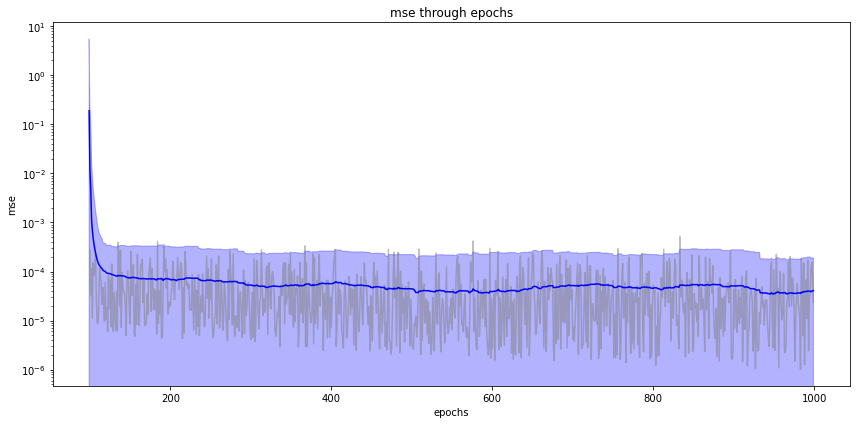

Czas wykonania: 89.265543 sekundy


In [75]:
mlp_squareL2 = MLPNoBackprop(layer_sizes = [1, 23, 1])
start_time = time.time()
mlp_squareL2.RMSprop(X_squareL_train_normalized, Y_squareL_train_normalized, epochs = 10000, learning_rate=0.001, beta=0.9, epsilon=1e-7, batch_size=10)
end_time = time.time()
execution_time = end_time - start_time
print(f"Czas wykonania: {execution_time:.6f} sekundy")

In [76]:
ypred_normalized = mlp_squareL2.predict(X_squareL_train_normalized)
ypred = ypred_normalized *np.std(Y_squareL_train) +np.mean(Y_squareL_train)
print(mlp_squareL2.mse(ypred, Y_squareL_train))

0.40429371320861685


In [55]:
ypred_normalized = mlp_squareL2.predict(X_squareL_test_normalized)
ypred = ypred_normalized *np.std(Y_squareL_train) +np.mean(Y_squareL_train)
print(mlp_squareL2.mse(ypred, Y_squareL_test))

11.662615058564132


# mlp for steps large

## momentum

Epoka 0: Loss = 0.075197506
Epoka 10: Loss = 0.070101491
Epoka 20: Loss = 0.066693742
Epoka 30: Loss = 0.065901982
Epoka 40: Loss = 0.065301264
Epoka 50: Loss = 0.064218994
Epoka 60: Loss = 0.064291123
Epoka 70: Loss = 0.060243938
Epoka 80: Loss = 0.058949220
Epoka 90: Loss = 0.057224606
Epoka 100: Loss = 0.052379636
Epoka 110: Loss = 0.049202578
Epoka 120: Loss = 0.055693881
Epoka 130: Loss = 0.042852427
Epoka 140: Loss = 0.036842646
Epoka 150: Loss = 0.027603698
Epoka 160: Loss = 0.020622547
Epoka 170: Loss = 0.018657776
Epoka 180: Loss = 0.017759482
Epoka 190: Loss = 0.016973276
Epoka 200: Loss = 0.015522512
Epoka 210: Loss = 0.014714384
Epoka 220: Loss = 0.013811256
Epoka 230: Loss = 0.013075532
Epoka 240: Loss = 0.012538954
Epoka 250: Loss = 0.012005439
Epoka 260: Loss = 0.011938230
Epoka 270: Loss = 0.011786266
Epoka 280: Loss = 0.011138765
Epoka 290: Loss = 0.010204586
Epoka 300: Loss = 0.009660419
Epoka 310: Loss = 0.009222039
Epoka 320: Loss = 0.009423537
Epoka 330: Loss = 0.0

Epoka 2680: Loss = 0.002502409
Epoka 2690: Loss = 0.002428780
Epoka 2700: Loss = 0.002437434
Epoka 2710: Loss = 0.002626471
Epoka 2720: Loss = 0.002530888
Epoka 2730: Loss = 0.002387771
Epoka 2740: Loss = 0.002513911
Epoka 2750: Loss = 0.002422756
Epoka 2760: Loss = 0.002448786
Epoka 2770: Loss = 0.002403184
Epoka 2780: Loss = 0.002382080
Epoka 2790: Loss = 0.002430906
Epoka 2800: Loss = 0.002403601
Epoka 2810: Loss = 0.002651855
Epoka 2820: Loss = 0.002559273
Epoka 2830: Loss = 0.002403248
Epoka 2840: Loss = 0.002662205
Epoka 2850: Loss = 0.002536980
Epoka 2860: Loss = 0.002434415
Epoka 2870: Loss = 0.002406965
Epoka 2880: Loss = 0.002561496
Epoka 2890: Loss = 0.002379351
Epoka 2900: Loss = 0.002512293
Epoka 2910: Loss = 0.002542794
Epoka 2920: Loss = 0.003072390
Epoka 2930: Loss = 0.002454093
Epoka 2940: Loss = 0.002647364
Epoka 2950: Loss = 0.002406474
Epoka 2960: Loss = 0.002319261
Epoka 2970: Loss = 0.002447850
Epoka 2980: Loss = 0.002740610
Epoka 2990: Loss = 0.002410982
Epoka 30

Epoka 5330: Loss = 0.001855664
Epoka 5340: Loss = 0.002130825
Epoka 5350: Loss = 0.001678723
Epoka 5360: Loss = 0.001765325
Epoka 5370: Loss = 0.001655429
Epoka 5380: Loss = 0.001659307
Epoka 5390: Loss = 0.001979276
Epoka 5400: Loss = 0.002043878
Epoka 5410: Loss = 0.001795762
Epoka 5420: Loss = 0.001719771
Epoka 5430: Loss = 0.001868145
Epoka 5440: Loss = 0.001713499
Epoka 5450: Loss = 0.001665018
Epoka 5460: Loss = 0.001732555
Epoka 5470: Loss = 0.001836281
Epoka 5480: Loss = 0.001737104
Epoka 5490: Loss = 0.001696690
Epoka 5500: Loss = 0.001773175
Epoka 5510: Loss = 0.001891576
Epoka 5520: Loss = 0.001904793
Epoka 5530: Loss = 0.001696743
Epoka 5540: Loss = 0.001642068
Epoka 5550: Loss = 0.001746586
Epoka 5560: Loss = 0.001645763
Epoka 5570: Loss = 0.001712044
Epoka 5580: Loss = 0.001673218
Epoka 5590: Loss = 0.001667485
Epoka 5600: Loss = 0.001718256
Epoka 5610: Loss = 0.001739891
Epoka 5620: Loss = 0.001690391
Epoka 5630: Loss = 0.001642500
Epoka 5640: Loss = 0.001859241
Epoka 56

Epoka 7980: Loss = 0.001467920
Epoka 7990: Loss = 0.001425113
Epoka 8000: Loss = 0.001328238
Epoka 8010: Loss = 0.001505316
Epoka 8020: Loss = 0.001441044
Epoka 8030: Loss = 0.001381126
Epoka 8040: Loss = 0.001375715
Epoka 8050: Loss = 0.001357454
Epoka 8060: Loss = 0.001473632
Epoka 8070: Loss = 0.001417320
Epoka 8080: Loss = 0.001397937
Epoka 8090: Loss = 0.001406844
Epoka 8100: Loss = 0.001596620
Epoka 8110: Loss = 0.001382295
Epoka 8120: Loss = 0.001362622
Epoka 8130: Loss = 0.001366836
Epoka 8140: Loss = 0.001378083
Epoka 8150: Loss = 0.001539251
Epoka 8160: Loss = 0.001394798
Epoka 8170: Loss = 0.001387423
Epoka 8180: Loss = 0.001331172
Epoka 8190: Loss = 0.001359415
Epoka 8200: Loss = 0.001348593
Epoka 8210: Loss = 0.001497192
Epoka 8220: Loss = 0.001347291
Epoka 8230: Loss = 0.001539320
Epoka 8240: Loss = 0.001552595
Epoka 8250: Loss = 0.001484979
Epoka 8260: Loss = 0.001335549
Epoka 8270: Loss = 0.001376037
Epoka 8280: Loss = 0.001398193
Epoka 8290: Loss = 0.001352093
Epoka 83

Epoka 10610: Loss = 0.001220329
Epoka 10620: Loss = 0.001155551
Epoka 10630: Loss = 0.001451181
Epoka 10640: Loss = 0.001427236
Epoka 10650: Loss = 0.001189343
Epoka 10660: Loss = 0.001327390
Epoka 10670: Loss = 0.001273619
Epoka 10680: Loss = 0.001259596
Epoka 10690: Loss = 0.001180961
Epoka 10700: Loss = 0.001198233
Epoka 10710: Loss = 0.001444652
Epoka 10720: Loss = 0.001215728
Epoka 10730: Loss = 0.001226425
Epoka 10740: Loss = 0.001251704
Epoka 10750: Loss = 0.001186648
Epoka 10760: Loss = 0.001167231
Epoka 10770: Loss = 0.001188946
Epoka 10780: Loss = 0.001305983
Epoka 10790: Loss = 0.001162087
Epoka 10800: Loss = 0.001243343
Epoka 10810: Loss = 0.001144815
Epoka 10820: Loss = 0.001170086
Epoka 10830: Loss = 0.001145788
Epoka 10840: Loss = 0.001170247
Epoka 10850: Loss = 0.001217097
Epoka 10860: Loss = 0.001141629
Epoka 10870: Loss = 0.001172735
Epoka 10880: Loss = 0.001131920
Epoka 10890: Loss = 0.001180316
Epoka 10900: Loss = 0.001180711
Epoka 10910: Loss = 0.001143103
Epoka 10

Epoka 13180: Loss = 0.001108134
Epoka 13190: Loss = 0.001221084
Epoka 13200: Loss = 0.001170237
Epoka 13210: Loss = 0.001026261
Epoka 13220: Loss = 0.001071553
Epoka 13230: Loss = 0.001019577
Epoka 13240: Loss = 0.001160275
Epoka 13250: Loss = 0.001055560
Epoka 13260: Loss = 0.001219348
Epoka 13270: Loss = 0.001289369
Epoka 13280: Loss = 0.001063912
Epoka 13290: Loss = 0.001039646
Epoka 13300: Loss = 0.001271555
Epoka 13310: Loss = 0.001067526
Epoka 13320: Loss = 0.001183296
Epoka 13330: Loss = 0.001068549
Epoka 13340: Loss = 0.001197723
Epoka 13350: Loss = 0.001135137
Epoka 13360: Loss = 0.001068439
Epoka 13370: Loss = 0.001191611
Epoka 13380: Loss = 0.001036034
Epoka 13390: Loss = 0.001056382
Epoka 13400: Loss = 0.001102164
Epoka 13410: Loss = 0.001095072
Epoka 13420: Loss = 0.001031359
Epoka 13430: Loss = 0.001011336
Epoka 13440: Loss = 0.001101176
Epoka 13450: Loss = 0.001135775
Epoka 13460: Loss = 0.001012964
Epoka 13470: Loss = 0.001076036
Epoka 13480: Loss = 0.001020833
Epoka 13

Epoka 15750: Loss = 0.000994874
Epoka 15760: Loss = 0.000968418
Epoka 15770: Loss = 0.000940958
Epoka 15780: Loss = 0.001108547
Epoka 15790: Loss = 0.000922993
Epoka 15800: Loss = 0.000940127
Epoka 15810: Loss = 0.000985587
Epoka 15820: Loss = 0.000976381
Epoka 15830: Loss = 0.001069372
Epoka 15840: Loss = 0.000962645
Epoka 15850: Loss = 0.000915285
Epoka 15860: Loss = 0.000917978
Epoka 15870: Loss = 0.000976289
Epoka 15880: Loss = 0.001050673
Epoka 15890: Loss = 0.000954378
Epoka 15900: Loss = 0.000985633
Epoka 15910: Loss = 0.001024187
Epoka 15920: Loss = 0.001110622
Epoka 15930: Loss = 0.000984554
Epoka 15940: Loss = 0.000939148
Epoka 15950: Loss = 0.001100489
Epoka 15960: Loss = 0.001003058
Epoka 15970: Loss = 0.001024414
Epoka 15980: Loss = 0.001074977
Epoka 15990: Loss = 0.000974464
Epoka 16000: Loss = 0.001232216
Epoka 16010: Loss = 0.001001252
Epoka 16020: Loss = 0.001000378
Epoka 16030: Loss = 0.000934068
Epoka 16040: Loss = 0.001121676
Epoka 16050: Loss = 0.000931171
Epoka 16

Epoka 18320: Loss = 0.000866612
Epoka 18330: Loss = 0.000879235
Epoka 18340: Loss = 0.000850758
Epoka 18350: Loss = 0.000857040
Epoka 18360: Loss = 0.000897582
Epoka 18370: Loss = 0.001147664
Epoka 18380: Loss = 0.000943634
Epoka 18390: Loss = 0.000869607
Epoka 18400: Loss = 0.000867711
Epoka 18410: Loss = 0.000879595
Epoka 18420: Loss = 0.000871674
Epoka 18430: Loss = 0.000901714
Epoka 18440: Loss = 0.000880068
Epoka 18450: Loss = 0.000913197
Epoka 18460: Loss = 0.000958716
Epoka 18470: Loss = 0.000925659
Epoka 18480: Loss = 0.000946847
Epoka 18490: Loss = 0.000853982
Epoka 18500: Loss = 0.000844520
Epoka 18510: Loss = 0.000974947
Epoka 18520: Loss = 0.000953711
Epoka 18530: Loss = 0.000880869
Epoka 18540: Loss = 0.000888328
Epoka 18550: Loss = 0.000875467
Epoka 18560: Loss = 0.000988116
Epoka 18570: Loss = 0.000878278
Epoka 18580: Loss = 0.000931752
Epoka 18590: Loss = 0.000835597
Epoka 18600: Loss = 0.000844073
Epoka 18610: Loss = 0.001087530
Epoka 18620: Loss = 0.000895417
Epoka 18

Epoka 20890: Loss = 0.000859998
Epoka 20900: Loss = 0.000865257
Epoka 20910: Loss = 0.000814363
Epoka 20920: Loss = 0.000912514
Epoka 20930: Loss = 0.000868755
Epoka 20940: Loss = 0.000975628
Epoka 20950: Loss = 0.000788413
Epoka 20960: Loss = 0.000805874
Epoka 20970: Loss = 0.000992133
Epoka 20980: Loss = 0.000854268
Epoka 20990: Loss = 0.000809998
Epoka 21000: Loss = 0.000947681
Epoka 21010: Loss = 0.000951466
Epoka 21020: Loss = 0.000848199
Epoka 21030: Loss = 0.000887518
Epoka 21040: Loss = 0.000816762
Epoka 21050: Loss = 0.000834447
Epoka 21060: Loss = 0.000805910
Epoka 21070: Loss = 0.000888438
Epoka 21080: Loss = 0.000935677
Epoka 21090: Loss = 0.000997396
Epoka 21100: Loss = 0.000914653
Epoka 21110: Loss = 0.000794082
Epoka 21120: Loss = 0.000821156
Epoka 21130: Loss = 0.000806954
Epoka 21140: Loss = 0.000881672
Epoka 21150: Loss = 0.000792626
Epoka 21160: Loss = 0.000956187
Epoka 21170: Loss = 0.000790939
Epoka 21180: Loss = 0.000785621
Epoka 21190: Loss = 0.000804016
Epoka 21

Epoka 23460: Loss = 0.000771839
Epoka 23470: Loss = 0.000760502
Epoka 23480: Loss = 0.000807315
Epoka 23490: Loss = 0.000911808
Epoka 23500: Loss = 0.000741796
Epoka 23510: Loss = 0.000867604
Epoka 23520: Loss = 0.000877517
Epoka 23530: Loss = 0.000796087
Epoka 23540: Loss = 0.000761727
Epoka 23550: Loss = 0.000779613
Epoka 23560: Loss = 0.000732045
Epoka 23570: Loss = 0.000867934
Epoka 23580: Loss = 0.000955763
Epoka 23590: Loss = 0.000769999
Epoka 23600: Loss = 0.000839254
Epoka 23610: Loss = 0.000835542
Epoka 23620: Loss = 0.000736917
Epoka 23630: Loss = 0.000812411
Epoka 23640: Loss = 0.000781249
Epoka 23650: Loss = 0.000884474
Epoka 23660: Loss = 0.000749955
Epoka 23670: Loss = 0.000825811
Epoka 23680: Loss = 0.000782375
Epoka 23690: Loss = 0.000854826
Epoka 23700: Loss = 0.000973120
Epoka 23710: Loss = 0.000783889
Epoka 23720: Loss = 0.000822498
Epoka 23730: Loss = 0.000845376
Epoka 23740: Loss = 0.000798710
Epoka 23750: Loss = 0.000813804
Epoka 23760: Loss = 0.000843564
Epoka 23

Epoka 26030: Loss = 0.000800015
Epoka 26040: Loss = 0.000752915
Epoka 26050: Loss = 0.000817258
Epoka 26060: Loss = 0.000877931
Epoka 26070: Loss = 0.000760494
Epoka 26080: Loss = 0.000758783
Epoka 26090: Loss = 0.000741872
Epoka 26100: Loss = 0.000753271
Epoka 26110: Loss = 0.000747234
Epoka 26120: Loss = 0.001060157
Epoka 26130: Loss = 0.000738429
Epoka 26140: Loss = 0.000722363
Epoka 26150: Loss = 0.000783178
Epoka 26160: Loss = 0.000771435
Epoka 26170: Loss = 0.000913018
Epoka 26180: Loss = 0.000731082
Epoka 26190: Loss = 0.000916289
Epoka 26200: Loss = 0.000783236
Epoka 26210: Loss = 0.000699491
Epoka 26220: Loss = 0.000782509
Epoka 26230: Loss = 0.000779948
Epoka 26240: Loss = 0.000826630
Epoka 26250: Loss = 0.000725535
Epoka 26260: Loss = 0.000804985
Epoka 26270: Loss = 0.000721085
Epoka 26280: Loss = 0.000781064
Epoka 26290: Loss = 0.000730218
Epoka 26300: Loss = 0.000716580
Epoka 26310: Loss = 0.000713862
Epoka 26320: Loss = 0.000806781
Epoka 26330: Loss = 0.000779840
Epoka 26

Epoka 28600: Loss = 0.000719485
Epoka 28610: Loss = 0.000741970
Epoka 28620: Loss = 0.000783185
Epoka 28630: Loss = 0.000661417
Epoka 28640: Loss = 0.000882883
Epoka 28650: Loss = 0.000671253
Epoka 28660: Loss = 0.000787576
Epoka 28670: Loss = 0.000755644
Epoka 28680: Loss = 0.000679630
Epoka 28690: Loss = 0.000676168
Epoka 28700: Loss = 0.000664285
Epoka 28710: Loss = 0.000735731
Epoka 28720: Loss = 0.000819746
Epoka 28730: Loss = 0.000815507
Epoka 28740: Loss = 0.000689694
Epoka 28750: Loss = 0.000689230
Epoka 28760: Loss = 0.000711855
Epoka 28770: Loss = 0.000720950
Epoka 28780: Loss = 0.000665742
Epoka 28790: Loss = 0.000700264
Epoka 28800: Loss = 0.000676986
Epoka 28810: Loss = 0.000686400
Epoka 28820: Loss = 0.000668164
Epoka 28830: Loss = 0.000940648
Epoka 28840: Loss = 0.000814011
Epoka 28850: Loss = 0.000730556
Epoka 28860: Loss = 0.000759198
Epoka 28870: Loss = 0.000749036
Epoka 28880: Loss = 0.000688183
Epoka 28890: Loss = 0.000759652
Epoka 28900: Loss = 0.000686104
Epoka 28

Epoka 31170: Loss = 0.000720302
Epoka 31180: Loss = 0.000724109
Epoka 31190: Loss = 0.000719962
Epoka 31200: Loss = 0.000663695
Epoka 31210: Loss = 0.000833712
Epoka 31220: Loss = 0.000921755
Epoka 31230: Loss = 0.000717635
Epoka 31240: Loss = 0.000887249
Epoka 31250: Loss = 0.000650278
Epoka 31260: Loss = 0.000790059
Epoka 31270: Loss = 0.000777291
Epoka 31280: Loss = 0.000716704
Epoka 31290: Loss = 0.000702192
Epoka 31300: Loss = 0.000840929
Epoka 31310: Loss = 0.000773053
Epoka 31320: Loss = 0.000639338
Epoka 31330: Loss = 0.000688980
Epoka 31340: Loss = 0.000760648
Epoka 31350: Loss = 0.000747820
Epoka 31360: Loss = 0.000675670
Epoka 31370: Loss = 0.000789631
Epoka 31380: Loss = 0.000661502
Epoka 31390: Loss = 0.000704947
Epoka 31400: Loss = 0.000651976
Epoka 31410: Loss = 0.000812302
Epoka 31420: Loss = 0.000667984
Epoka 31430: Loss = 0.000729048
Epoka 31440: Loss = 0.000919343
Epoka 31450: Loss = 0.000635817
Epoka 31460: Loss = 0.000734348
Epoka 31470: Loss = 0.000745900
Epoka 31

Epoka 33740: Loss = 0.000658818
Epoka 33750: Loss = 0.000689142
Epoka 33760: Loss = 0.000740595
Epoka 33770: Loss = 0.000654623
Epoka 33780: Loss = 0.000616592
Epoka 33790: Loss = 0.000668233
Epoka 33800: Loss = 0.000833920
Epoka 33810: Loss = 0.000649295
Epoka 33820: Loss = 0.000688597
Epoka 33830: Loss = 0.000640400
Epoka 33840: Loss = 0.000667588
Epoka 33850: Loss = 0.000624310
Epoka 33860: Loss = 0.000635307
Epoka 33870: Loss = 0.000679396
Epoka 33880: Loss = 0.000616258
Epoka 33890: Loss = 0.000642953
Epoka 33900: Loss = 0.000637926
Epoka 33910: Loss = 0.000760939
Epoka 33920: Loss = 0.000661574
Epoka 33930: Loss = 0.000662794
Epoka 33940: Loss = 0.000691740
Epoka 33950: Loss = 0.000648489
Epoka 33960: Loss = 0.000682977
Epoka 33970: Loss = 0.000615468
Epoka 33980: Loss = 0.000689514
Epoka 33990: Loss = 0.000633374
Epoka 34000: Loss = 0.000716700
Epoka 34010: Loss = 0.000833807
Epoka 34020: Loss = 0.000892517
Epoka 34030: Loss = 0.000645205
Epoka 34040: Loss = 0.000639187
Epoka 34

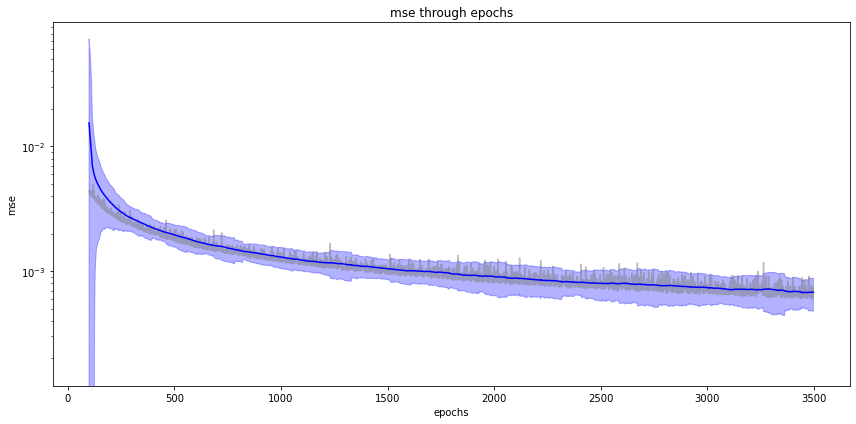

Czas wykonania: 1127.701762 sekundy


In [78]:
mlp_stepsL = MLPNoBackprop(layer_sizes = [1, 15, 15, 1], weights_initialize_function ='uniform')
start_time = time.time()
mlp_stepsL.momentum(X_stepsL_train_normalized, Y_stepsL_train_normalized, epochs=35000, learning_rate=0.06, Lambda=0.9, batch_size=64)
end_time = time.time()
execution_time = end_time - start_time
print(f"Czas wykonania: {execution_time:.6f} sekundy")

In [79]:
ypred_normalized = mlp_stepsL.predict(X_stepsL_test_normalized)
ypred = ypred_normalized *np.std(Y_stepsL_train) +np.mean(Y_stepsL_train)
print(mlp_stepsL.mse(ypred, Y_stepsL_test))

3.327461098795133


## RMSprop

Epoka 0: Loss = 0.089735913
Epoka 10: Loss = 0.079132383
Epoka 20: Loss = 0.048375577
Epoka 30: Loss = 0.016801859
Epoka 40: Loss = 0.016680612
Epoka 50: Loss = 0.011257009
Epoka 60: Loss = 0.010032748
Epoka 70: Loss = 0.007905437
Epoka 80: Loss = 0.007183612
Epoka 90: Loss = 0.006500711
Epoka 100: Loss = 0.005783893
Epoka 110: Loss = 0.007780935
Epoka 120: Loss = 0.005482267
Epoka 130: Loss = 0.005624700
Epoka 140: Loss = 0.005079630
Epoka 150: Loss = 0.005335595
Epoka 160: Loss = 0.007736318
Epoka 170: Loss = 0.004469101
Epoka 180: Loss = 0.006752904
Epoka 190: Loss = 0.008443745
Epoka 200: Loss = 0.003510158
Epoka 210: Loss = 0.004644462
Epoka 220: Loss = 0.004347927
Epoka 230: Loss = 0.003783844
Epoka 240: Loss = 0.004710102
Epoka 250: Loss = 0.003393851
Epoka 260: Loss = 0.004071188
Epoka 270: Loss = 0.005960087
Epoka 280: Loss = 0.004160955
Epoka 290: Loss = 0.003635332
Epoka 300: Loss = 0.003197666
Epoka 310: Loss = 0.011002228
Epoka 320: Loss = 0.002921640
Epoka 330: Loss = 0.0

Epoka 2680: Loss = 0.002177756
Epoka 2690: Loss = 0.001169544
Epoka 2700: Loss = 0.001327795
Epoka 2710: Loss = 0.001378095
Epoka 2720: Loss = 0.001334683
Epoka 2730: Loss = 0.002611979
Epoka 2740: Loss = 0.002966143
Epoka 2750: Loss = 0.002165807
Epoka 2760: Loss = 0.002161953
Epoka 2770: Loss = 0.002517166
Epoka 2780: Loss = 0.002041590
Epoka 2790: Loss = 0.002997748
Epoka 2800: Loss = 0.001063887
Epoka 2810: Loss = 0.002003843
Epoka 2820: Loss = 0.003068838
Epoka 2830: Loss = 0.003306906
Epoka 2840: Loss = 0.002130884
Epoka 2850: Loss = 0.001940386
Epoka 2860: Loss = 0.001181414
Epoka 2870: Loss = 0.002198893
Epoka 2880: Loss = 0.001231144
Epoka 2890: Loss = 0.001199551
Epoka 2900: Loss = 0.003565510
Epoka 2910: Loss = 0.002006091
Epoka 2920: Loss = 0.001223133
Epoka 2930: Loss = 0.001987329
Epoka 2940: Loss = 0.001646436
Epoka 2950: Loss = 0.001187689
Epoka 2960: Loss = 0.000978498
Epoka 2970: Loss = 0.001147129
Epoka 2980: Loss = 0.001216920
Epoka 2990: Loss = 0.001887000
Epoka 30

Epoka 5330: Loss = 0.001393557
Epoka 5340: Loss = 0.001870426
Epoka 5350: Loss = 0.001468948
Epoka 5360: Loss = 0.001121862
Epoka 5370: Loss = 0.002405417
Epoka 5380: Loss = 0.001500673
Epoka 5390: Loss = 0.001673181
Epoka 5400: Loss = 0.001165364
Epoka 5410: Loss = 0.001832276
Epoka 5420: Loss = 0.001342494
Epoka 5430: Loss = 0.000941649
Epoka 5440: Loss = 0.001409688
Epoka 5450: Loss = 0.001936145
Epoka 5460: Loss = 0.004815121
Epoka 5470: Loss = 0.001288427
Epoka 5480: Loss = 0.001146643
Epoka 5490: Loss = 0.000696073
Epoka 5500: Loss = 0.001457291
Epoka 5510: Loss = 0.000609019
Epoka 5520: Loss = 0.001630125
Epoka 5530: Loss = 0.002099118
Epoka 5540: Loss = 0.005943245
Epoka 5550: Loss = 0.000857278
Epoka 5560: Loss = 0.001799157
Epoka 5570: Loss = 0.000838549
Epoka 5580: Loss = 0.001586075
Epoka 5590: Loss = 0.001098503
Epoka 5600: Loss = 0.001986380
Epoka 5610: Loss = 0.001308256
Epoka 5620: Loss = 0.001519463
Epoka 5630: Loss = 0.002179951
Epoka 5640: Loss = 0.001497307
Epoka 56

Epoka 7980: Loss = 0.001680449
Epoka 7990: Loss = 0.001692405
Epoka 8000: Loss = 0.001837858
Epoka 8010: Loss = 0.000722810
Epoka 8020: Loss = 0.001543264
Epoka 8030: Loss = 0.001472578
Epoka 8040: Loss = 0.001199557
Epoka 8050: Loss = 0.001252161
Epoka 8060: Loss = 0.000724835
Epoka 8070: Loss = 0.001488901
Epoka 8080: Loss = 0.001452773
Epoka 8090: Loss = 0.001630478
Epoka 8100: Loss = 0.001176264
Epoka 8110: Loss = 0.001748315
Epoka 8120: Loss = 0.001387918
Epoka 8130: Loss = 0.000846217
Epoka 8140: Loss = 0.000718284
Epoka 8150: Loss = 0.000560983
Epoka 8160: Loss = 0.001902068
Epoka 8170: Loss = 0.000961435
Epoka 8180: Loss = 0.002595362
Epoka 8190: Loss = 0.000593302
Epoka 8200: Loss = 0.002312001
Epoka 8210: Loss = 0.001138791
Epoka 8220: Loss = 0.000597178
Epoka 8230: Loss = 0.000889925
Epoka 8240: Loss = 0.001166934
Epoka 8250: Loss = 0.001313731
Epoka 8260: Loss = 0.001013823
Epoka 8270: Loss = 0.000724314
Epoka 8280: Loss = 0.001934476
Epoka 8290: Loss = 0.001383150
Epoka 83

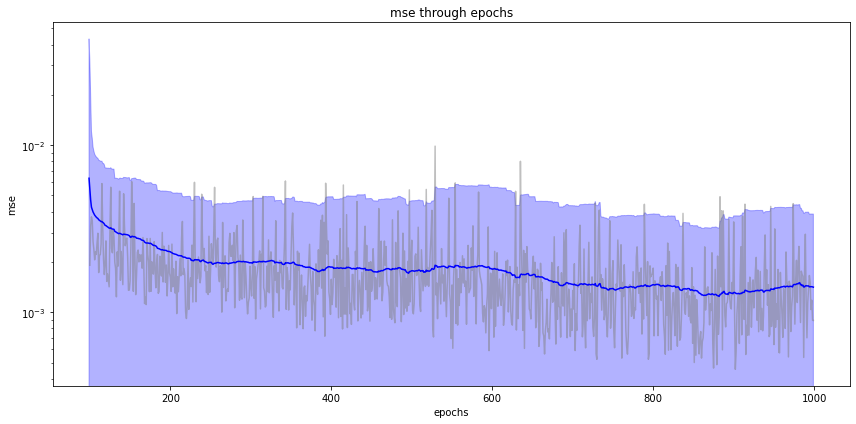

Czas wykonania: 479.636955 sekundy


In [90]:
mlp_stepsL2 = MLPNoBackprop(layer_sizes = [1, 10, 10, 1])
start_time = time.time()
mlp_stepsL2.RMSprop(X_stepsL_train_normalized, Y_stepsL_train_normalized, epochs = 10000, learning_rate=0.01, beta=0.9, epsilon=1e-7, batch_size=32)
end_time = time.time()
execution_time = end_time - start_time
print(f"Czas wykonania: {execution_time:.6f} sekundy")

In [91]:
ypred_normalized = mlp_stepsL2.predict(X_stepsL_test_normalized)
ypred = ypred_normalized *np.std(Y_stepsL_train) +np.mean(Y_stepsL_train)
print(mlp_stepsL2.mse(ypred, Y_stepsL_test))

2.2475730800174154


# mlp for multimodal

## momentum

In [266]:
mlp_multimodalL = MLPNoBackprop(layer_sizes = [1, 26, 1], hidden_activation='tanh')
start_time = time.time()
mlp_multimodalL.momentum(X_multimodalL_train_normalized, Y_multimodalL_train_normalized, batch_size = 64, epochs=13000, learning_rate=0.001, Lambda=0.9)
end_time = time.time()
execution_time = end_time - start_time
print(f"Czas wykonania: {execution_time:.6f} sekundy

Epoka 0: Loss = 0.791971559
Epoka 10: Loss = 0.485865130
Epoka 20: Loss = 0.453360170
Epoka 30: Loss = 0.422319837
Epoka 40: Loss = 0.399245602
Epoka 50: Loss = 0.384653972
Epoka 60: Loss = 0.372851837
Epoka 70: Loss = 0.360910261
Epoka 80: Loss = 0.345408565
Epoka 90: Loss = 0.326944201
Epoka 100: Loss = 0.311648839
Epoka 110: Loss = 0.298152557
Epoka 120: Loss = 0.285960363
Epoka 130: Loss = 0.273142326
Epoka 140: Loss = 0.256422225
Epoka 150: Loss = 0.231431179
Epoka 160: Loss = 0.197515538
Epoka 170: Loss = 0.166133943
Epoka 180: Loss = 0.144404362
Epoka 190: Loss = 0.132267470
Epoka 200: Loss = 0.125546137
Epoka 210: Loss = 0.120133775
Epoka 220: Loss = 0.116422279
Epoka 230: Loss = 0.113425162
Epoka 240: Loss = 0.110017072
Epoka 250: Loss = 0.108539046
Epoka 260: Loss = 0.104671050
Epoka 270: Loss = 0.102342295
Epoka 280: Loss = 0.100391975
Epoka 290: Loss = 0.098407972
Epoka 300: Loss = 0.095617366
Epoka 310: Loss = 0.093378431
Epoka 320: Loss = 0.091422552
Epoka 330: Loss = 0.0

Epoka 2690: Loss = 0.036046001
Epoka 2700: Loss = 0.035586526
Epoka 2710: Loss = 0.035614281
Epoka 2720: Loss = 0.035783820
Epoka 2730: Loss = 0.035327355
Epoka 2740: Loss = 0.035126500
Epoka 2750: Loss = 0.035065201
Epoka 2760: Loss = 0.034907990
Epoka 2770: Loss = 0.034912247
Epoka 2780: Loss = 0.034677816
Epoka 2790: Loss = 0.034588010
Epoka 2800: Loss = 0.034496186
Epoka 2810: Loss = 0.034536565
Epoka 2820: Loss = 0.034241146
Epoka 2830: Loss = 0.034146726
Epoka 2840: Loss = 0.033969745
Epoka 2850: Loss = 0.033881550
Epoka 2860: Loss = 0.033993430
Epoka 2870: Loss = 0.034103993
Epoka 2880: Loss = 0.033479494
Epoka 2890: Loss = 0.033370417
Epoka 2900: Loss = 0.033342054
Epoka 2910: Loss = 0.033336435
Epoka 2920: Loss = 0.033063670
Epoka 2930: Loss = 0.032934201
Epoka 2940: Loss = 0.032903138
Epoka 2950: Loss = 0.032851901
Epoka 2960: Loss = 0.032655330
Epoka 2970: Loss = 0.032394513
Epoka 2980: Loss = 0.032358941
Epoka 2990: Loss = 0.032158271
Epoka 3000: Loss = 0.032204224
Epoka 30

Epoka 5340: Loss = 0.011641926
Epoka 5350: Loss = 0.011626308
Epoka 5360: Loss = 0.011743902
Epoka 5370: Loss = 0.011509701
Epoka 5380: Loss = 0.011503060
Epoka 5390: Loss = 0.011534739
Epoka 5400: Loss = 0.011429469
Epoka 5410: Loss = 0.011354955
Epoka 5420: Loss = 0.011356739
Epoka 5430: Loss = 0.011300502
Epoka 5440: Loss = 0.011260430
Epoka 5450: Loss = 0.011279253
Epoka 5460: Loss = 0.011168159
Epoka 5470: Loss = 0.011179692
Epoka 5480: Loss = 0.011147260
Epoka 5490: Loss = 0.011072452
Epoka 5500: Loss = 0.011225015
Epoka 5510: Loss = 0.011026981
Epoka 5520: Loss = 0.010948986
Epoka 5530: Loss = 0.010921639
Epoka 5540: Loss = 0.010909660
Epoka 5550: Loss = 0.010939291
Epoka 5560: Loss = 0.011013679
Epoka 5570: Loss = 0.010767631
Epoka 5580: Loss = 0.010833904
Epoka 5590: Loss = 0.010855736
Epoka 5600: Loss = 0.010669968
Epoka 5610: Loss = 0.010705399
Epoka 5620: Loss = 0.010648125
Epoka 5630: Loss = 0.010588109
Epoka 5640: Loss = 0.010607513
Epoka 5650: Loss = 0.010539500
Epoka 56

Epoka 7990: Loss = 0.005547607
Epoka 8000: Loss = 0.005555841
Epoka 8010: Loss = 0.005525317
Epoka 8020: Loss = 0.005510489
Epoka 8030: Loss = 0.005491927
Epoka 8040: Loss = 0.005510708
Epoka 8050: Loss = 0.005479065
Epoka 8060: Loss = 0.005473540
Epoka 8070: Loss = 0.005449720
Epoka 8080: Loss = 0.005464004
Epoka 8090: Loss = 0.005425877
Epoka 8100: Loss = 0.005456617
Epoka 8110: Loss = 0.005402304
Epoka 8120: Loss = 0.005423303
Epoka 8130: Loss = 0.005369783
Epoka 8140: Loss = 0.005381816
Epoka 8150: Loss = 0.005337077
Epoka 8160: Loss = 0.005407952
Epoka 8170: Loss = 0.005341974
Epoka 8180: Loss = 0.005309804
Epoka 8190: Loss = 0.005315724
Epoka 8200: Loss = 0.005352224
Epoka 8210: Loss = 0.005271537
Epoka 8220: Loss = 0.005270656
Epoka 8230: Loss = 0.005239038
Epoka 8240: Loss = 0.005258378
Epoka 8250: Loss = 0.005214073
Epoka 8260: Loss = 0.005203598
Epoka 8270: Loss = 0.005450241
Epoka 8280: Loss = 0.005189852
Epoka 8290: Loss = 0.005210249
Epoka 8300: Loss = 0.005160944
Epoka 83

Epoka 10620: Loss = 0.002931693
Epoka 10630: Loss = 0.002936784
Epoka 10640: Loss = 0.002920807
Epoka 10650: Loss = 0.002918487
Epoka 10660: Loss = 0.002916304
Epoka 10670: Loss = 0.002895753
Epoka 10680: Loss = 0.002965729
Epoka 10690: Loss = 0.002914660
Epoka 10700: Loss = 0.002931005
Epoka 10710: Loss = 0.002895880
Epoka 10720: Loss = 0.002915094
Epoka 10730: Loss = 0.002876250
Epoka 10740: Loss = 0.002872325
Epoka 10750: Loss = 0.002860157
Epoka 10760: Loss = 0.002914154
Epoka 10770: Loss = 0.002901303
Epoka 10780: Loss = 0.002851874
Epoka 10790: Loss = 0.002842968
Epoka 10800: Loss = 0.002835060
Epoka 10810: Loss = 0.002851745
Epoka 10820: Loss = 0.002865476
Epoka 10830: Loss = 0.002871519
Epoka 10840: Loss = 0.002841323
Epoka 10850: Loss = 0.002849187
Epoka 10860: Loss = 0.002836822
Epoka 10870: Loss = 0.002818823
Epoka 10880: Loss = 0.002837305
Epoka 10890: Loss = 0.002809382
Epoka 10900: Loss = 0.002811187
Epoka 10910: Loss = 0.002802322
Epoka 10920: Loss = 0.002794038
Epoka 10

In [267]:
ypred_normalized = mlp_multimodalL.predict(X_multimodalL_test_normalized)
ypred = ypred_normalized *np.std(Y_multimodalL_train) +np.mean(Y_multimodalL_train)
print(mlp_multimodalL.mse(ypred, Y_multimodalL_test))

8.006999112315732


Epoka 0: Loss = 0.760876992
Epoka 10: Loss = 0.493205865
Epoka 20: Loss = 0.471601663
Epoka 30: Loss = 0.447964635
Epoka 40: Loss = 0.420949850
Epoka 50: Loss = 0.397664766
Epoka 60: Loss = 0.382730245
Epoka 70: Loss = 0.372720703
Epoka 80: Loss = 0.364343549
Epoka 90: Loss = 0.358451897
Epoka 100: Loss = 0.352102703
Epoka 110: Loss = 0.344997357
Epoka 120: Loss = 0.333324209
Epoka 130: Loss = 0.319379905
Epoka 140: Loss = 0.305620089
Epoka 150: Loss = 0.291594368
Epoka 160: Loss = 0.278307436
Epoka 170: Loss = 0.263134597
Epoka 180: Loss = 0.245175634
Epoka 190: Loss = 0.215111821
Epoka 200: Loss = 0.182159857
Epoka 210: Loss = 0.154828593
Epoka 220: Loss = 0.137698581
Epoka 230: Loss = 0.127563235
Epoka 240: Loss = 0.120514469
Epoka 250: Loss = 0.114387024
Epoka 260: Loss = 0.109633294
Epoka 270: Loss = 0.104177204
Epoka 280: Loss = 0.099142080
Epoka 290: Loss = 0.094187315
Epoka 300: Loss = 0.089571802
Epoka 310: Loss = 0.085458765
Epoka 320: Loss = 0.082133661
Epoka 330: Loss = 0.0

Epoka 2680: Loss = 0.039354768
Epoka 2690: Loss = 0.039550128
Epoka 2700: Loss = 0.039217461
Epoka 2710: Loss = 0.039087588
Epoka 2720: Loss = 0.039502196
Epoka 2730: Loss = 0.038894384
Epoka 2740: Loss = 0.039166092
Epoka 2750: Loss = 0.038738347
Epoka 2760: Loss = 0.038779196
Epoka 2770: Loss = 0.038574977
Epoka 2780: Loss = 0.038697698
Epoka 2790: Loss = 0.038348202
Epoka 2800: Loss = 0.038377994
Epoka 2810: Loss = 0.038171752
Epoka 2820: Loss = 0.038098210
Epoka 2830: Loss = 0.038344018
Epoka 2840: Loss = 0.037867740
Epoka 2850: Loss = 0.038334788
Epoka 2860: Loss = 0.037767853
Epoka 2870: Loss = 0.037515175
Epoka 2880: Loss = 0.037516031
Epoka 2890: Loss = 0.037797435
Epoka 2900: Loss = 0.037203850
Epoka 2910: Loss = 0.037465477
Epoka 2920: Loss = 0.037054369
Epoka 2930: Loss = 0.037076691
Epoka 2940: Loss = 0.036840025
Epoka 2950: Loss = 0.037104807
Epoka 2960: Loss = 0.036829174
Epoka 2970: Loss = 0.036489588
Epoka 2980: Loss = 0.036622179
Epoka 2990: Loss = 0.036226563
Epoka 30

Epoka 5330: Loss = 0.014913755
Epoka 5340: Loss = 0.014881787
Epoka 5350: Loss = 0.015055740
Epoka 5360: Loss = 0.014807028
Epoka 5370: Loss = 0.014952677
Epoka 5380: Loss = 0.014709006
Epoka 5390: Loss = 0.014721367
Epoka 5400: Loss = 0.014701130
Epoka 5410: Loss = 0.014665888
Epoka 5420: Loss = 0.014660227
Epoka 5430: Loss = 0.014585672
Epoka 5440: Loss = 0.014673395
Epoka 5450: Loss = 0.014545929
Epoka 5460: Loss = 0.014530222
Epoka 5470: Loss = 0.014482094
Epoka 5480: Loss = 0.014950678
Epoka 5490: Loss = 0.014494459
Epoka 5500: Loss = 0.014416443
Epoka 5510: Loss = 0.014494808
Epoka 5520: Loss = 0.014396291
Epoka 5530: Loss = 0.014505703
Epoka 5540: Loss = 0.014349547
Epoka 5550: Loss = 0.014312965
Epoka 5560: Loss = 0.014389203
Epoka 5570: Loss = 0.014306750
Epoka 5580: Loss = 0.014266163
Epoka 5590: Loss = 0.014250886
Epoka 5600: Loss = 0.014234289
Epoka 5610: Loss = 0.014278915
Epoka 5620: Loss = 0.014204384
Epoka 5630: Loss = 0.014158495
Epoka 5640: Loss = 0.014219124
Epoka 56

Epoka 7980: Loss = 0.012319433
Epoka 7990: Loss = 0.012326445
Epoka 8000: Loss = 0.012315040
Epoka 8010: Loss = 0.012390133
Epoka 8020: Loss = 0.012384206
Epoka 8030: Loss = 0.012311650
Epoka 8040: Loss = 0.012344504
Epoka 8050: Loss = 0.012306217
Epoka 8060: Loss = 0.012356828
Epoka 8070: Loss = 0.012275467
Epoka 8080: Loss = 0.012315303
Epoka 8090: Loss = 0.012295985
Epoka 8100: Loss = 0.012259582
Epoka 8110: Loss = 0.012269074
Epoka 8120: Loss = 0.012332854
Epoka 8130: Loss = 0.012253546
Epoka 8140: Loss = 0.012267295
Epoka 8150: Loss = 0.012232620
Epoka 8160: Loss = 0.012428661
Epoka 8170: Loss = 0.012259121
Epoka 8180: Loss = 0.012257087
Epoka 8190: Loss = 0.012382565
Epoka 8200: Loss = 0.012239346
Epoka 8210: Loss = 0.012361816
Epoka 8220: Loss = 0.012226439
Epoka 8230: Loss = 0.012305413
Epoka 8240: Loss = 0.012205961
Epoka 8250: Loss = 0.012252231
Epoka 8260: Loss = 0.012188456
Epoka 8270: Loss = 0.012165211
Epoka 8280: Loss = 0.012167872
Epoka 8290: Loss = 0.012440798
Epoka 83

Epoka 10610: Loss = 0.009864806
Epoka 10620: Loss = 0.009910337
Epoka 10630: Loss = 0.009870999
Epoka 10640: Loss = 0.009834413
Epoka 10650: Loss = 0.009808237
Epoka 10660: Loss = 0.009844834
Epoka 10670: Loss = 0.009772716
Epoka 10680: Loss = 0.009849842
Epoka 10690: Loss = 0.009773768
Epoka 10700: Loss = 0.009854550
Epoka 10710: Loss = 0.009708531
Epoka 10720: Loss = 0.009682465
Epoka 10730: Loss = 0.009697922
Epoka 10740: Loss = 0.009701426
Epoka 10750: Loss = 0.009647183
Epoka 10760: Loss = 0.009631031
Epoka 10770: Loss = 0.009671896
Epoka 10780: Loss = 0.009626496
Epoka 10790: Loss = 0.009655489
Epoka 10800: Loss = 0.009547067
Epoka 10810: Loss = 0.009848862
Epoka 10820: Loss = 0.009561344
Epoka 10830: Loss = 0.009616953
Epoka 10840: Loss = 0.009496337
Epoka 10850: Loss = 0.009467345
Epoka 10860: Loss = 0.009596445
Epoka 10870: Loss = 0.009523006
Epoka 10880: Loss = 0.009501356
Epoka 10890: Loss = 0.009548609
Epoka 10900: Loss = 0.009505041
Epoka 10910: Loss = 0.009401642
Epoka 10

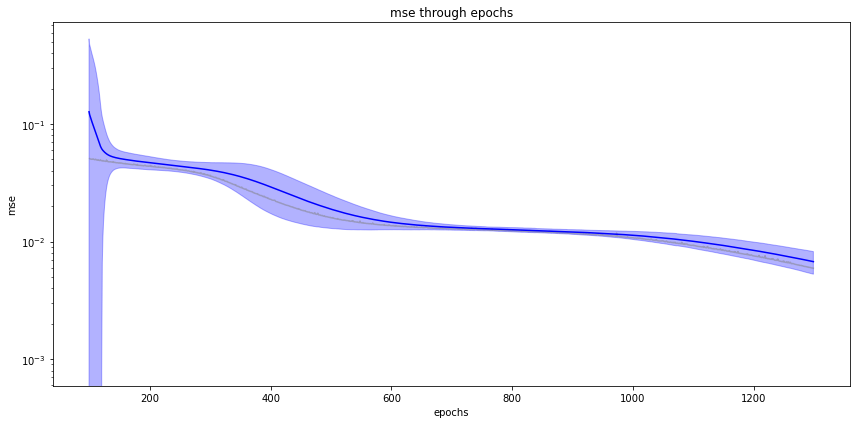

Czas wykonania: 274.481763 sekundy


In [94]:
mlp_multimodalL = MLPNoBackprop(layer_sizes = [1, 26, 1], hidden_activation='tanh')
start_time = time.time()
mlp_multimodalL.momentum(X_multimodalL_train_normalized, Y_multimodalL_train_normalized, batch_size = 64, epochs=13000, learning_rate=0.001, Lambda=0.9)
end_time = time.time()
execution_time = end_time - start_time
print(f"Czas wykonania: {execution_time:.6f} sekundy")

# RMSprop

In [349]:
mlp_multimodalL2 = MLPNoBackprop(layer_sizes = [1, 26, 1])
start_time = time.time()
mlp_multimodalL2.RMSprop(X_multimodalL_train_normalized, Y_multimodalL_train_normalized, epochs = 13000, learning_rate=0.005, beta=0.8, epsilon=1e-7, batch_size=64)
end_time = time.time()
execution_time = end_time - start_time
print(f"Czas wykonania: {execution_time:.6f} sekundy")


Epoka 0: Loss = 0.804955008
Epoka 10: Loss = 0.452662808
Epoka 20: Loss = 0.376357911
Epoka 30: Loss = 0.311642682
Epoka 40: Loss = 0.288987279
Epoka 50: Loss = 0.144267448
Epoka 60: Loss = 0.063924578
Epoka 70: Loss = 0.072429208
Epoka 80: Loss = 0.061552724
Epoka 90: Loss = 0.058028732
Epoka 100: Loss = 0.057023539
Epoka 110: Loss = 0.056425979
Epoka 120: Loss = 0.054013323
Epoka 130: Loss = 0.059552942
Epoka 140: Loss = 0.055351545
Epoka 150: Loss = 0.057984379
Epoka 160: Loss = 0.052423385
Epoka 170: Loss = 0.053173257
Epoka 180: Loss = 0.074217168
Epoka 190: Loss = 0.061502156
Epoka 200: Loss = 0.059682764
Epoka 210: Loss = 0.048008648
Epoka 220: Loss = 0.046520767
Epoka 230: Loss = 0.045111179
Epoka 240: Loss = 0.048076525
Epoka 250: Loss = 0.046389262
Epoka 260: Loss = 0.042653051
Epoka 270: Loss = 0.041097445
Epoka 280: Loss = 0.042874806
Epoka 290: Loss = 0.038670141
Epoka 300: Loss = 0.042144805
Epoka 310: Loss = 0.042650948
Epoka 320: Loss = 0.038263397
Epoka 330: Loss = 0.0

Epoka 2680: Loss = 0.002144082
Epoka 2690: Loss = 0.002365396
Epoka 2700: Loss = 0.002531736
Epoka 2710: Loss = 0.002162654
Epoka 2720: Loss = 0.002818397
Epoka 2730: Loss = 0.002538301
Epoka 2740: Loss = 0.002472511
Epoka 2750: Loss = 0.002643692
Epoka 2760: Loss = 0.002399039
Epoka 2770: Loss = 0.003845578
Epoka 2780: Loss = 0.003908963
Epoka 2790: Loss = 0.005680544
Epoka 2800: Loss = 0.003033207
Epoka 2810: Loss = 0.003931096
Epoka 2820: Loss = 0.002484902
Epoka 2830: Loss = 0.003076902
Epoka 2840: Loss = 0.002986013
Epoka 2850: Loss = 0.003916268
Epoka 2860: Loss = 0.002328089
Epoka 2870: Loss = 0.005113280
Epoka 2880: Loss = 0.002732747
Epoka 2890: Loss = 0.003166079
Epoka 2900: Loss = 0.002348496
Epoka 2910: Loss = 0.003655618
Epoka 2920: Loss = 0.004259592
Epoka 2930: Loss = 0.002711396
Epoka 2940: Loss = 0.002079664
Epoka 2950: Loss = 0.002334754
Epoka 2960: Loss = 0.003366963
Epoka 2970: Loss = 0.004638348
Epoka 2980: Loss = 0.002389704
Epoka 2990: Loss = 0.002328095
Epoka 30

Epoka 5330: Loss = 0.003595361
Epoka 5340: Loss = 0.002319037
Epoka 5350: Loss = 0.002004392
Epoka 5360: Loss = 0.001993043
Epoka 5370: Loss = 0.002709242
Epoka 5380: Loss = 0.002006585
Epoka 5390: Loss = 0.003294760
Epoka 5400: Loss = 0.002411212
Epoka 5410: Loss = 0.003051735
Epoka 5420: Loss = 0.005331193
Epoka 5430: Loss = 0.001714937
Epoka 5440: Loss = 0.002836843
Epoka 5450: Loss = 0.002953944
Epoka 5460: Loss = 0.002067288
Epoka 5470: Loss = 0.001961073
Epoka 5480: Loss = 0.003202825
Epoka 5490: Loss = 0.002472653
Epoka 5500: Loss = 0.001900475
Epoka 5510: Loss = 0.002307113
Epoka 5520: Loss = 0.002444045
Epoka 5530: Loss = 0.002482708
Epoka 5540: Loss = 0.001999020
Epoka 5550: Loss = 0.002700692
Epoka 5560: Loss = 0.002311399
Epoka 5570: Loss = 0.001817429
Epoka 5580: Loss = 0.001797672
Epoka 5590: Loss = 0.002782256
Epoka 5600: Loss = 0.002626163
Epoka 5610: Loss = 0.003603137
Epoka 5620: Loss = 0.002699293
Epoka 5630: Loss = 0.002299449
Epoka 5640: Loss = 0.001847388
Epoka 56

Epoka 7980: Loss = 0.001588924
Epoka 7990: Loss = 0.001990069
Epoka 8000: Loss = 0.002526625
Epoka 8010: Loss = 0.001557659
Epoka 8020: Loss = 0.001889030
Epoka 8030: Loss = 0.001813014
Epoka 8040: Loss = 0.001928475
Epoka 8050: Loss = 0.002508136
Epoka 8060: Loss = 0.001470938
Epoka 8070: Loss = 0.002490486
Epoka 8080: Loss = 0.001429020
Epoka 8090: Loss = 0.001350700
Epoka 8100: Loss = 0.001770431
Epoka 8110: Loss = 0.001965969
Epoka 8120: Loss = 0.002707378
Epoka 8130: Loss = 0.001336547
Epoka 8140: Loss = 0.001390970
Epoka 8150: Loss = 0.001755681
Epoka 8160: Loss = 0.001412780
Epoka 8170: Loss = 0.001587927
Epoka 8180: Loss = 0.005563418
Epoka 8190: Loss = 0.001360392
Epoka 8200: Loss = 0.001712378
Epoka 8210: Loss = 0.003563342
Epoka 8220: Loss = 0.002839429
Epoka 8230: Loss = 0.002919117
Epoka 8240: Loss = 0.002433518
Epoka 8250: Loss = 0.001614545
Epoka 8260: Loss = 0.002818567
Epoka 8270: Loss = 0.002874826
Epoka 8280: Loss = 0.001578929
Epoka 8290: Loss = 0.001605567
Epoka 83

Epoka 10610: Loss = 0.001439167
Epoka 10620: Loss = 0.001446745
Epoka 10630: Loss = 0.001464909
Epoka 10640: Loss = 0.002567650
Epoka 10650: Loss = 0.001491940
Epoka 10660: Loss = 0.001599757
Epoka 10670: Loss = 0.002463433
Epoka 10680: Loss = 0.002558957
Epoka 10690: Loss = 0.001686534
Epoka 10700: Loss = 0.001607684
Epoka 10710: Loss = 0.002396621
Epoka 10720: Loss = 0.001374358
Epoka 10730: Loss = 0.001954919
Epoka 10740: Loss = 0.001374159
Epoka 10750: Loss = 0.002158893
Epoka 10760: Loss = 0.001336562
Epoka 10770: Loss = 0.002202740
Epoka 10780: Loss = 0.001273009
Epoka 10790: Loss = 0.001244696
Epoka 10800: Loss = 0.001616371
Epoka 10810: Loss = 0.001583513
Epoka 10820: Loss = 0.001324006
Epoka 10830: Loss = 0.001755225
Epoka 10840: Loss = 0.001265828
Epoka 10850: Loss = 0.001408223
Epoka 10860: Loss = 0.001356459
Epoka 10870: Loss = 0.001528337
Epoka 10880: Loss = 0.001396888
Epoka 10890: Loss = 0.001485032
Epoka 10900: Loss = 0.001969408
Epoka 10910: Loss = 0.002865955
Epoka 10

In [353]:
ypred_normalized = mlp_multimodalL2.predict(X_multimodalL_test_normalized)
ypred = ypred_normalized *np.std(Y_multimodalL_train) +np.mean(Y_multimodalL_train)
print(mlp_multimodalL.mse(ypred, Y_multimodalL_test))

2.241974818875493


Epoka 0: Loss = 0.870124376
Epoka 10: Loss = 0.471040292
Epoka 20: Loss = 0.376175654
Epoka 30: Loss = 0.300355115
Epoka 40: Loss = 0.288380540
Epoka 50: Loss = 0.130461352
Epoka 60: Loss = 0.062491595
Epoka 70: Loss = 0.061758681
Epoka 80: Loss = 0.059781120
Epoka 90: Loss = 0.059471460
Epoka 100: Loss = 0.056041925
Epoka 110: Loss = 0.050567967
Epoka 120: Loss = 0.048738046
Epoka 130: Loss = 0.052378228
Epoka 140: Loss = 0.067521371
Epoka 150: Loss = 0.054965722
Epoka 160: Loss = 0.046966411
Epoka 170: Loss = 0.047577232
Epoka 180: Loss = 0.052479133
Epoka 190: Loss = 0.044448110
Epoka 200: Loss = 0.068131972
Epoka 210: Loss = 0.050507664
Epoka 220: Loss = 0.057711853
Epoka 230: Loss = 0.044272694
Epoka 240: Loss = 0.047500135
Epoka 250: Loss = 0.043076004
Epoka 260: Loss = 0.046046839
Epoka 270: Loss = 0.041613142
Epoka 280: Loss = 0.052504069
Epoka 290: Loss = 0.054872551
Epoka 300: Loss = 0.041160280
Epoka 310: Loss = 0.046232706
Epoka 320: Loss = 0.040811713
Epoka 330: Loss = 0.0

Epoka 2680: Loss = 0.002073201
Epoka 2690: Loss = 0.003779681
Epoka 2700: Loss = 0.002039796
Epoka 2710: Loss = 0.002021096
Epoka 2720: Loss = 0.001909177
Epoka 2730: Loss = 0.002172277
Epoka 2740: Loss = 0.006721017
Epoka 2750: Loss = 0.004195201
Epoka 2760: Loss = 0.001948074
Epoka 2770: Loss = 0.002433103
Epoka 2780: Loss = 0.009230033
Epoka 2790: Loss = 0.002372598
Epoka 2800: Loss = 0.002343161
Epoka 2810: Loss = 0.002354812
Epoka 2820: Loss = 0.003757735
Epoka 2830: Loss = 0.003695020
Epoka 2840: Loss = 0.012864807
Epoka 2850: Loss = 0.003939809
Epoka 2860: Loss = 0.002673996
Epoka 2870: Loss = 0.004610003
Epoka 2880: Loss = 0.003083071
Epoka 2890: Loss = 0.004581088
Epoka 2900: Loss = 0.003503632
Epoka 2910: Loss = 0.003555283
Epoka 2920: Loss = 0.002429423
Epoka 2930: Loss = 0.003004530
Epoka 2940: Loss = 0.002052578
Epoka 2950: Loss = 0.003815800
Epoka 2960: Loss = 0.002226215
Epoka 2970: Loss = 0.003821673
Epoka 2980: Loss = 0.002419624
Epoka 2990: Loss = 0.002495090
Epoka 30

Epoka 5330: Loss = 0.001428125
Epoka 5340: Loss = 0.001883764
Epoka 5350: Loss = 0.001534778
Epoka 5360: Loss = 0.001347606
Epoka 5370: Loss = 0.002372006
Epoka 5380: Loss = 0.001729048
Epoka 5390: Loss = 0.001579399
Epoka 5400: Loss = 0.005201625
Epoka 5410: Loss = 0.002069080
Epoka 5420: Loss = 0.001756925
Epoka 5430: Loss = 0.001654201
Epoka 5440: Loss = 0.001788155
Epoka 5450: Loss = 0.004069406
Epoka 5460: Loss = 0.001580930
Epoka 5470: Loss = 0.003754338
Epoka 5480: Loss = 0.001810165
Epoka 5490: Loss = 0.001611188
Epoka 5500: Loss = 0.003801451
Epoka 5510: Loss = 0.002649351
Epoka 5520: Loss = 0.002154862
Epoka 5530: Loss = 0.002371800
Epoka 5540: Loss = 0.002358884
Epoka 5550: Loss = 0.003616470
Epoka 5560: Loss = 0.001783018
Epoka 5570: Loss = 0.002390546
Epoka 5580: Loss = 0.002766623
Epoka 5590: Loss = 0.001670836
Epoka 5600: Loss = 0.001278038
Epoka 5610: Loss = 0.001354352
Epoka 5620: Loss = 0.001662700
Epoka 5630: Loss = 0.001694715
Epoka 5640: Loss = 0.002799626
Epoka 56

Epoka 7980: Loss = 0.002642964
Epoka 7990: Loss = 0.001691783
Epoka 8000: Loss = 0.003761617
Epoka 8010: Loss = 0.001617961
Epoka 8020: Loss = 0.005411690
Epoka 8030: Loss = 0.002678523
Epoka 8040: Loss = 0.001392026
Epoka 8050: Loss = 0.002059695
Epoka 8060: Loss = 0.006808717
Epoka 8070: Loss = 0.001233441
Epoka 8080: Loss = 0.003544627
Epoka 8090: Loss = 0.001967617
Epoka 8100: Loss = 0.001925423
Epoka 8110: Loss = 0.001139814
Epoka 8120: Loss = 0.001259333
Epoka 8130: Loss = 0.003125745
Epoka 8140: Loss = 0.001811963
Epoka 8150: Loss = 0.002399266
Epoka 8160: Loss = 0.003592838
Epoka 8170: Loss = 0.001919731
Epoka 8180: Loss = 0.001445094
Epoka 8190: Loss = 0.001251642
Epoka 8200: Loss = 0.001195714
Epoka 8210: Loss = 0.003611490
Epoka 8220: Loss = 0.003668901
Epoka 8230: Loss = 0.010555026
Epoka 8240: Loss = 0.001133067
Epoka 8250: Loss = 0.001095527
Epoka 8260: Loss = 0.001142827
Epoka 8270: Loss = 0.002593216
Epoka 8280: Loss = 0.001254053
Epoka 8290: Loss = 0.001749816
Epoka 83

Epoka 10610: Loss = 0.001218465
Epoka 10620: Loss = 0.002571398
Epoka 10630: Loss = 0.001036546
Epoka 10640: Loss = 0.002223011
Epoka 10650: Loss = 0.001179215
Epoka 10660: Loss = 0.001417066
Epoka 10670: Loss = 0.003121193
Epoka 10680: Loss = 0.001296067
Epoka 10690: Loss = 0.001599647
Epoka 10700: Loss = 0.001598159
Epoka 10710: Loss = 0.001181962
Epoka 10720: Loss = 0.004170975
Epoka 10730: Loss = 0.001327005
Epoka 10740: Loss = 0.001534712
Epoka 10750: Loss = 0.003903145
Epoka 10760: Loss = 0.001134208
Epoka 10770: Loss = 0.001564567
Epoka 10780: Loss = 0.001119970
Epoka 10790: Loss = 0.002594313
Epoka 10800: Loss = 0.001128310
Epoka 10810: Loss = 0.001089935
Epoka 10820: Loss = 0.002149654
Epoka 10830: Loss = 0.001004711
Epoka 10840: Loss = 0.001167172
Epoka 10850: Loss = 0.001294922
Epoka 10860: Loss = 0.001035917
Epoka 10870: Loss = 0.001544261
Epoka 10880: Loss = 0.002028394
Epoka 10890: Loss = 0.001040492
Epoka 10900: Loss = 0.001071271
Epoka 10910: Loss = 0.001323838
Epoka 10

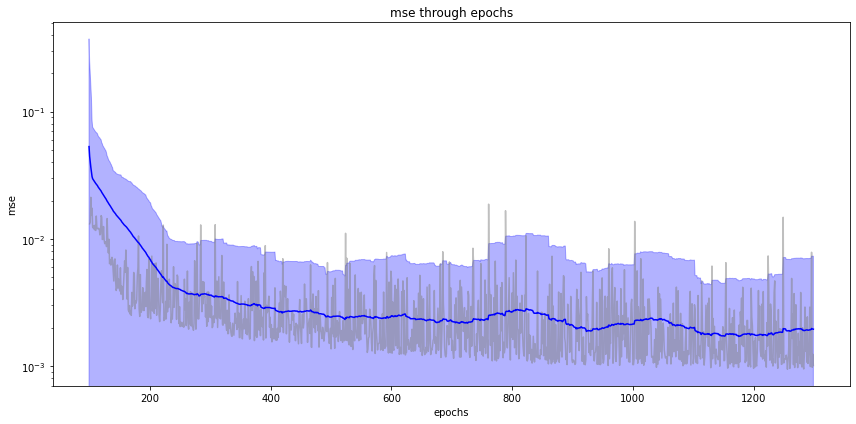

Czas wykonania: 370.915329 sekundy


In [96]:
mlp_multimodalL2 = MLPNoBackprop(layer_sizes = [1, 26, 1])
start_time = time.time()
mlp_multimodalL2.RMSprop(X_multimodalL_train_normalized, Y_multimodalL_train_normalized, epochs = 13000, learning_rate=0.005, beta=0.8, epsilon=1e-7, batch_size=64)
end_time = time.time()
execution_time = end_time - start_time
print(f"Czas wykonania: {execution_time:.6f} sekundy")

# --------------------------------------------NN4-----------------------------------------------------

For this checkpoint I will be working on classification tasks.  
My goal is to implement the softmax activation function and the F-measure. I will be testing my implementation on the following datasets:
- rings3-regular
- easy
- xor

## Rings

In [18]:
df_ringsR_train = pd.read_csv('rings3-regular-training.csv')
df_ringsR_test = pd.read_csv('rings3-regular-test.csv')

In [19]:
df_ringsR_train.head()

,x,y,c
0,-93.563317,-76.345110,0
1,1.060114,-16.727040,0
2,24.396099,40.358822,0
3,-94.595137,-97.889250,0
4,-85.331382,-56.736933,0


In [20]:
X_ringsR_train = np.array(df_ringsR_train[['x', 'y']])
Y_ringsR_train = np.array(df_ringsR_train[['c']])
X_ringsR_test = np.array(df_ringsR_test[['x', 'y']])
Y_ringsR_test = np.array(df_ringsR_test[['c']])


In [21]:
X_ringsR_train_normalized = (X_ringsR_train - np.mean(X_ringsR_train))/np.std(X_ringsR_train)
X_ringsR_test_normalized = (X_ringsR_test - np.mean(X_ringsR_train))/np.std(X_ringsR_train)

In [18]:
np.unique(Y_ringsR_train)

array([0, 1, 2], dtype=int64)

In [21]:
len(np.unique(Y_ringsR_train))

3

In [29]:
X_ringsR_train.shape[1]

2

### 3 classes = 3 output layers

In [76]:
mlp_ringsR = MLPNoBackprop(layer_sizes = [X_ringsR_train.shape[1], 10, len(np.unique(Y_ringsR_train))], 
                           output_activation='softmax')
start_time = time.time()
mlp_ringsR.classifiaction_train(X_ringsR_train_normalized, Y_ringsR_train, epochs = 1000, learning_rate=0.01, batch_size=10)
end_time = time.time()
execution_time = end_time - start_time
print(f"Czas wykonania: {execution_time:.6f} sekundy")

Epoka 0: Loss = 0.345832389
Epoka 10: Loss = 0.487297847
Epoka 20: Loss = 0.515250248
Epoka 30: Loss = 0.586956605
Epoka 40: Loss = 0.673377072
Epoka 50: Loss = 0.665696699
Epoka 60: Loss = 0.728956351
Epoka 70: Loss = 0.766794820
Epoka 80: Loss = 0.796551723
Epoka 90: Loss = 0.815065282
Epoka 100: Loss = 0.814810098
Epoka 110: Loss = 0.817860277
Epoka 120: Loss = 0.827107554
Epoka 130: Loss = 0.833424927
Epoka 140: Loss = 0.832154282
Epoka 150: Loss = 0.830196838
Epoka 160: Loss = 0.841095375
Epoka 170: Loss = 0.851527329
Epoka 180: Loss = 0.854931869
Epoka 190: Loss = 0.864061882
Epoka 200: Loss = 0.869062719
Epoka 210: Loss = 0.876959817
Epoka 220: Loss = 0.882142740
Epoka 230: Loss = 0.883355413
Epoka 240: Loss = 0.892072471
Epoka 250: Loss = 0.892854051
Epoka 260: Loss = 0.893379089
Epoka 270: Loss = 0.887339519
Epoka 280: Loss = 0.896877297
Epoka 290: Loss = 0.884918168
Epoka 300: Loss = 0.897540590
Epoka 310: Loss = 0.902773472
Epoka 320: Loss = 0.902230342
Epoka 330: Loss = 0.9

In [77]:
ypred = mlp_ringsR.predict_classification(X_ringsR_test_normalized)

In [78]:
mlp_ringsR.f1_score(Y_ringsR_test, ypred)

0.9344786081912858

# easy

In [22]:
df_easy_train = pd.read_csv('easy-training.csv')
df_easy_test = pd.read_csv('easy-test.csv')

In [23]:
df_easy_train.head()

,x,y,c
0,-72.829461,-40.239391,False
1,-65.464396,-60.501516,False
2,14.389589,74.223994,False
3,-92.335628,17.466916,False
4,-61.058421,-16.761820,False


### False = 0, True = 1

In [24]:
df_easy_train['c'] = df_easy_train['c'].replace({True: 1, False: 0})
print(df_easy_train.head())

           x          y  c
0 -72.829461 -40.239391  0
1 -65.464396 -60.501516  0
2  14.389589  74.223994  0
3 -92.335628  17.466916  0
4 -61.058421 -16.761820  0


In [25]:
df_easy_test['c'] = df_easy_test['c'].replace({True: 1, False: 0})
print(df_easy_test.head())

           x          y  c
0  88.836312  35.105689  1
1   8.454690  57.210448  0
2 -57.221426  29.312467  0
3 -11.922723 -88.264355  1
4   8.885765   6.605795  1


In [26]:
X_easy_train = np.array(df_easy_train[['x', 'y']])
X_easy_test = np.array(df_easy_test[['x', 'y']])
Y_easy_train = np.array(df_easy_train[['c']])
Y_easy_test = np.array(df_easy_test[['c']])

In [27]:
X_easy_train_normalized = (X_easy_train - np.mean(X_easy_train))/np.std(X_easy_train)
X_easy_test_normalized = (X_easy_test - np.mean(X_easy_train))/np.std(X_easy_train)

In [39]:
len(np.unique(Y_easy_train))

2

In [42]:
mlp_easy = MLPNoBackprop(layer_sizes = [X_easy_train.shape[1], 10, len(np.unique(Y_easy_train))], 
                           output_activation='softmax')
start_time = time.time()
mlp_easy.classifiaction_train(X_easy_train_normalized, Y_easy_train, epochs = 1500, learning_rate=0.015, batch_size=24)
end_time = time.time()
execution_time = end_time - start_time
print(f"Czas wykonania: {execution_time:.6f} sekundy")

Epoka 0: Loss = 0.869867916
Epoka 10: Loss = 0.981999352
Epoka 20: Loss = 0.993999784
Epoka 30: Loss = 0.997999992
Epoka 40: Loss = 0.996000000
Epoka 50: Loss = 0.989999000
Epoka 60: Loss = 0.997999992
Epoka 70: Loss = 0.995999936
Epoka 80: Loss = 0.991999488
Epoka 90: Loss = 0.991999488
Epoka 100: Loss = 0.997999992
Epoka 110: Loss = 0.993999784
Epoka 120: Loss = 0.995999936
Epoka 130: Loss = 0.997999992
Epoka 140: Loss = 0.997999992
Epoka 150: Loss = 0.997999992
Epoka 160: Loss = 0.997999992
Epoka 170: Loss = 0.997999992
Epoka 180: Loss = 0.997999992
Epoka 190: Loss = 0.995999936
Epoka 200: Loss = 0.997999992
Epoka 210: Loss = 0.995999936
Epoka 220: Loss = 0.997999992
Epoka 230: Loss = 0.997999992
Epoka 240: Loss = 0.997999992
Epoka 250: Loss = 0.995999936
Epoka 260: Loss = 0.995999936
Epoka 270: Loss = 0.995999936
Epoka 280: Loss = 0.995999936
Epoka 290: Loss = 0.997999992
Epoka 300: Loss = 0.995999936
Epoka 310: Loss = 0.995999936
Epoka 320: Loss = 0.997999992
Epoka 330: Loss = 0.9

In [179]:
ypred = mlp_easy.predict_classification(X_easy_test_normalized)

In [180]:
mlp_ringsR.f1_score(Y_easy_test, ypred)

0.9979999279974079

# XOR

In [28]:
df_xor3_train = pd.read_csv('xor3-training.csv')
df_xor3_test = pd.read_csv('xor3-test.csv')

In [29]:
df_xor3_train.head()

,x,y,c
0,-5.720316,18.198653,0
1,50.039419,-71.390360,0
2,93.072781,-76.340256,0
3,10.434100,-21.863272,0
4,30.198218,-24.730234,0


In [30]:
X_xor3_train = np.array(df_xor3_train[['x', 'y']])
X_xor3_test = np.array(df_xor3_test[['x', 'y']])
Y_xor3_train = np.array(df_xor3_train[['c']])
Y_xor3_test = np.array(df_xor3_test[['c']])

In [31]:
X_xor3_train_normalized = (X_xor3_train - np.mean(X_xor3_train))/np.std( X_xor3_train)
X_xor3_test_normalized = (X_xor3_test - np.mean(X_xor3_train))/np.std( X_xor3_train)

In [81]:
mlp_xor3 = MLPNoBackprop(layer_sizes = [X_xor3_train.shape[1], 20, 20, len(np.unique(Y_xor3_train))], 
                           output_activation='softmax')
start_time = time.time()
mlp_xor3.classifiaction_train(X_xor3_train_normalized, Y_xor3_train, epochs = 800, learning_rate=0.01, batch_size=64)
end_time = time.time()
execution_time = end_time - start_time
print(f"Czas wykonania: {execution_time:.6f} sekundy")

Epoka 0: Loss = 0.333333333
Epoka 10: Loss = 0.333333333
Epoka 20: Loss = 0.333333333
Epoka 30: Loss = 0.333333333
Epoka 40: Loss = 0.333333333
Epoka 50: Loss = 0.573383966
Epoka 60: Loss = 0.520403041
Epoka 70: Loss = 0.333333333
Epoka 80: Loss = 0.495537072
Epoka 90: Loss = 0.600612937
Epoka 100: Loss = 0.328337104
Epoka 110: Loss = 0.684317884
Epoka 120: Loss = 0.766351375
Epoka 130: Loss = 0.772470089
Epoka 140: Loss = 0.699779570
Epoka 150: Loss = 0.774408224
Epoka 160: Loss = 0.775641026
Epoka 170: Loss = 0.776777634
Epoka 180: Loss = 0.777028737
Epoka 190: Loss = 0.783378885
Epoka 200: Loss = 0.783378885
Epoka 210: Loss = 0.786190315
Epoka 220: Loss = 0.788965933
Epoka 230: Loss = 0.783510882
Epoka 240: Loss = 0.790916109
Epoka 250: Loss = 0.790521923
Epoka 260: Loss = 0.789357703
Epoka 270: Loss = 0.792002391
Epoka 280: Loss = 0.788080334
Epoka 290: Loss = 0.788961039
Epoka 300: Loss = 0.789513265
Epoka 310: Loss = 0.800909782
Epoka 320: Loss = 0.805151239
Epoka 330: Loss = 0.8

In [82]:
ypred = mlp_xor3.predict_classification(X_xor3_test_normalized)

In [83]:
mlp_xor3.f1_score(Y_xor3_test, ypred)

0.9712643678160919

# --------------------------------------NN5---------------------------------------------------------

Now, I need to compare the performance and learning speed of neural networks with varying numbers of neurons in hidden layers and different activation functions. The objective is to evaluate how different activation functions affect the effectiveness and training time of networks with one, two, and three hidden layers. It is essential to take into account that various activation functions may lead to different outcomes depending on the number of neurons and layers used in the network.

The first part of this analysis will focus on preliminary tests using the multimodal-large dataset for regression. I will compare the performance of networks with different architectures (one, two, and three hidden layers) and four different activation functions. Afterward, I will select the two best performing architectures for further testing on other datasets.

The datasets I will use for the additional testing are:

Regression: steps-large

Classification: rings5-regular and rings3-regular

multimodal Large is already loaded and normalized
X_multimodalL_train_normalized = (X_multimodalL_train- np.mean(X_multimodalL_train))/(np.std(X_multimodalL_train))
Y_multimodalL_train_normalized = (Y_multimodalL_train- np.mean(Y_multimodalL_train))/(np.std(Y_multimodalL_train))
X_multimodalL_test_normalized = (X_multimodalL_test- np.mean(X_multimodalL_train))/(np.std(X_multimodalL_train))
Y_multimodalL_test_normalized = (Y_multimodalL_test- np.mean(Y_multimodalL_train))/(np.std(Y_multimodalL_train))

## testing diffrent architektures and activation functions for multimodal Large 

## One hidden layer

In [39]:
activation_functions =['sigmoid', 'linear', 'tanh', 'relu']
num_neurons = [3, 5, 8, 11, 19, 25, 30]

for hidden_function in activation_functions:
    for output_function in activation_functions:
        for neurons in num_neurons:
            mlp_multimodal = MLPNoBackprop(layer_sizes = [1, neurons, 1], hidden_activation=hidden_function, output_activation=output_function)
            start_time = time.time()
            mlp_multimodal.mini_batch_GD(X_multimodalL_train_normalized, Y_multimodalL_train_normalized, epochs = 1000, learning_rate = 0.01, batch_size=32)
            end_time = time.time()
            execution_time = end_time - start_time
            print(f"""Execution time: {execution_time:.6f} seconds
            for one layer with {hidden_function} hidden activation and {output_function} output activation
            one layer with {neurons} neurons""")
            Ypred_normalized = mlp_multimodal.predict(X_multimodalL_test_normalized)
            Ypred = (Ypred_normalized * np.std(Y_multimodalL_train)) + np.mean(Y_multimodalL_train)
            print('mse:')
            print(mlp_multimodal.mse(Ypred, Y_multimodalL_test))
            print('--------------------------------------------------------------------------------')

Execution time: 61.855260 seconds
            for one layer with sigmoid hidden activation and sigmoid output activation
            one layer with 3 neurons
mse:
3575.611735447458
--------------------------------------------------------------------------------
Execution time: 64.495157 seconds
            for one layer with sigmoid hidden activation and sigmoid output activation
            one layer with 5 neurons
mse:
3573.342154682163
--------------------------------------------------------------------------------
Execution time: 70.048052 seconds
            for one layer with sigmoid hidden activation and sigmoid output activation
            one layer with 8 neurons
mse:
3573.5144308695963
--------------------------------------------------------------------------------
Execution time: 75.686884 seconds
            for one layer with sigmoid hidden activation and sigmoid output activation
            one layer with 11 neurons
mse:
3573.511788537501
-------------------------------

Execution time: 27.579331 seconds
            for one layer with linear hidden activation and sigmoid output activation
            one layer with 19 neurons
mse:
3560.2956123000226
--------------------------------------------------------------------------------
Execution time: 57.568055 seconds
            for one layer with linear hidden activation and sigmoid output activation
            one layer with 25 neurons
mse:
3560.2931517447764
--------------------------------------------------------------------------------
Execution time: 59.472312 seconds
            for one layer with linear hidden activation and sigmoid output activation
            one layer with 30 neurons
mse:
3560.270204600186
--------------------------------------------------------------------------------
Execution time: 38.344748 seconds
            for one layer with linear hidden activation and linear output activation
            one layer with 3 neurons
mse:
4435.9400051844195
--------------------------------

Execution time: 48.619278 seconds
            for one layer with tanh hidden activation and linear output activation
            one layer with 5 neurons
mse:
436.6073282956269
--------------------------------------------------------------------------------
Execution time: 54.265607 seconds
            for one layer with tanh hidden activation and linear output activation
            one layer with 8 neurons
mse:
219.11147372485905
--------------------------------------------------------------------------------
Execution time: 57.979923 seconds
            for one layer with tanh hidden activation and linear output activation
            one layer with 11 neurons
mse:
217.5243125533719
--------------------------------------------------------------------------------
Execution time: 61.375017 seconds
            for one layer with tanh hidden activation and linear output activation
            one layer with 19 neurons
mse:
140.02646790855755
---------------------------------------------

Execution time: 19.361424 seconds
            for one layer with relu hidden activation and linear output activation
            one layer with 25 neurons
mse:
2792.988794461785
--------------------------------------------------------------------------------
Execution time: 19.372368 seconds
            for one layer with relu hidden activation and linear output activation
            one layer with 30 neurons
mse:
2801.4973528231403
--------------------------------------------------------------------------------
Execution time: 16.290415 seconds
            for one layer with relu hidden activation and tanh output activation
            one layer with 3 neurons
mse:
2627.9531407602917
--------------------------------------------------------------------------------
Execution time: 17.025429 seconds
            for one layer with relu hidden activation and tanh output activation
            one layer with 5 neurons
mse:
2628.0858998946233
------------------------------------------------

BEST PARAMETERS = 19 NEURONS, hidden activation tanh, output activation linear

## two hidden layers

In [40]:
activation_functions =['sigmoid', 'linear', 'tanh', 'relu']
num_neurons = [10, 15, 25, 30]

for hidden_function in activation_functions:
    for output_function in activation_functions:
        for neuron1 in num_neurons:
            for neuron2 in num_neurons:
                mlp_multimodal = MLPNoBackprop(layer_sizes = [1, neuron1, neuron2, 1], hidden_activation=hidden_function, output_activation=output_function)
                start_time = time.time()
                mlp_multimodal.mini_batch_GD(X_multimodalL_train_normalized, Y_multimodalL_train_normalized, epochs = 1000, learning_rate = 0.01, batch_size=32)
                end_time = time.time()
                execution_time = end_time - start_time
                print(f"""Execution time: {execution_time:.6f} seconds
                for one layer with {hidden_function} hidden activation and {output_function} output activation
                one layer with {neuron1} neurons in first hidden layer and {neuron2} in second hidden layer""")
                Ypred_normalized = mlp_multimodal.predict(X_multimodalL_test_normalized)
                Ypred = (Ypred_normalized * np.std(Y_multimodalL_train)) + np.mean(Y_multimodalL_train)
                print('mse:')
                print(mlp_multimodal.mse(Ypred, Y_multimodalL_test))
                print('--------------------------------------------------------------------------------')

Execution time: 37.289423 seconds
                for one layer with sigmoid hidden activation and sigmoid output activation
                one layer with 10 neurons in first hidden layer and 10 in second hidden layer
mse:
5221.594444563065
--------------------------------------------------------------------------------
Execution time: 42.123062 seconds
                for one layer with sigmoid hidden activation and sigmoid output activation
                one layer with 10 neurons in first hidden layer and 15 in second hidden layer
mse:
5221.530269448439
--------------------------------------------------------------------------------
Execution time: 50.787863 seconds
                for one layer with sigmoid hidden activation and sigmoid output activation
                one layer with 10 neurons in first hidden layer and 25 in second hidden layer
mse:
5221.515827180531
--------------------------------------------------------------------------------
Execution time: 50.402138 secon

Execution time: 57.710276 seconds
                for one layer with sigmoid hidden activation and linear output activation
                one layer with 25 neurons in first hidden layer and 25 in second hidden layer
mse:
479.5986843679383
--------------------------------------------------------------------------------
Execution time: 59.568743 seconds
                for one layer with sigmoid hidden activation and linear output activation
                one layer with 25 neurons in first hidden layer and 30 in second hidden layer
mse:
454.45014857775465
--------------------------------------------------------------------------------
Execution time: 46.652165 seconds
                for one layer with sigmoid hidden activation and linear output activation
                one layer with 30 neurons in first hidden layer and 10 in second hidden layer
mse:
444.86971146844
--------------------------------------------------------------------------------
Execution time: 50.795386 seconds
 

Execution time: 40.756397 seconds
                for one layer with sigmoid hidden activation and relu output activation
                one layer with 15 neurons in first hidden layer and 10 in second hidden layer
mse:
5221.396095604534
--------------------------------------------------------------------------------
Execution time: 43.784639 seconds
                for one layer with sigmoid hidden activation and relu output activation
                one layer with 15 neurons in first hidden layer and 15 in second hidden layer
mse:
5221.396095604534
--------------------------------------------------------------------------------
Execution time: 50.908736 seconds
                for one layer with sigmoid hidden activation and relu output activation
                one layer with 15 neurons in first hidden layer and 25 in second hidden layer
mse:
5221.396095604534
--------------------------------------------------------------------------------
Execution time: 54.045397 seconds
      

Execution time: 49.594914 seconds
                for one layer with linear hidden activation and sigmoid output activation
                one layer with 30 neurons in first hidden layer and 25 in second hidden layer
mse:
3557.6023029195107
--------------------------------------------------------------------------------
Execution time: 53.927688 seconds
                for one layer with linear hidden activation and sigmoid output activation
                one layer with 30 neurons in first hidden layer and 30 in second hidden layer
mse:
3557.6397615249602
--------------------------------------------------------------------------------
Execution time: 25.005977 seconds
                for one layer with linear hidden activation and linear output activation
                one layer with 10 neurons in first hidden layer and 10 in second hidden layer
mse:
4435.471971998568
--------------------------------------------------------------------------------


C:\Users\Administrator\AppData\Local\Temp\ipykernel_15336\2693131919.py:105: RuntimeWarning: overflow encountered in matmul
  z = activation @ self.weights[i] + self.biases[i]
C:\Users\Administrator\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\Users\Administrator\AppData\Local\Temp\ipykernel_15336\2693131919.py:189: RuntimeWarning: overflow encountered in matmul
  delta = (delta @ self.weights[i+1].T) * self.hidden_derivative(activations[i] @ self.weights[i] + self.biases[i])
C:\Users\Administrator\AppData\Local\Temp\ipykernel_15336\2693131919.py:190: RuntimeWarning: invalid value encountered in matmul
  gradient = activations[i].T @ delta


Execution time: 29.471925 seconds
                for one layer with linear hidden activation and linear output activation
                one layer with 10 neurons in first hidden layer and 15 in second hidden layer
mse:
nan
--------------------------------------------------------------------------------
Execution time: 31.825626 seconds
                for one layer with linear hidden activation and linear output activation
                one layer with 10 neurons in first hidden layer and 25 in second hidden layer
mse:
nan
--------------------------------------------------------------------------------


C:\Users\Administrator\AppData\Local\Temp\ipykernel_15336\2693131919.py:185: RuntimeWarning: overflow encountered in matmul
  last_gradient_descent = activations[-2].T @ delta
C:\Users\Administrator\AppData\Local\Temp\ipykernel_15336\2693131919.py:190: RuntimeWarning: overflow encountered in matmul
  gradient = activations[i].T @ delta
C:\Users\Administrator\AppData\Local\Temp\ipykernel_15336\2693131919.py:189: RuntimeWarning: invalid value encountered in matmul
  delta = (delta @ self.weights[i+1].T) * self.hidden_derivative(activations[i] @ self.weights[i] + self.biases[i])


Execution time: 31.840608 seconds
                for one layer with linear hidden activation and linear output activation
                one layer with 10 neurons in first hidden layer and 30 in second hidden layer
mse:
nan
--------------------------------------------------------------------------------
Execution time: 29.836609 seconds
                for one layer with linear hidden activation and linear output activation
                one layer with 15 neurons in first hidden layer and 10 in second hidden layer
mse:
nan
--------------------------------------------------------------------------------
Execution time: 30.724278 seconds
                for one layer with linear hidden activation and linear output activation
                one layer with 15 neurons in first hidden layer and 15 in second hidden layer
mse:
nan
--------------------------------------------------------------------------------
Execution time: 37.455591 seconds
                for one layer with linear hid

C:\Users\Administrator\AppData\Local\Temp\ipykernel_15336\2693131919.py:108: RuntimeWarning: overflow encountered in matmul
  z = activation @ self.weights[-1] + self.biases[-1]
C:\Users\Administrator\AppData\Local\Temp\ipykernel_15336\2693131919.py:108: RuntimeWarning: invalid value encountered in matmul
  z = activation @ self.weights[-1] + self.biases[-1]
C:\Users\Administrator\AppData\Local\Temp\ipykernel_15336\2693131919.py:184: RuntimeWarning: overflow encountered in matmul
  delta = error * self.output_derivative(activations[-2] @ self.weights[-1] + self.biases[-1])
C:\Users\Administrator\AppData\Local\Temp\ipykernel_15336\2693131919.py:184: RuntimeWarning: invalid value encountered in matmul
  delta = error * self.output_derivative(activations[-2] @ self.weights[-1] + self.biases[-1])


Execution time: 46.160653 seconds
                for one layer with linear hidden activation and linear output activation
                one layer with 25 neurons in first hidden layer and 30 in second hidden layer
mse:
nan
--------------------------------------------------------------------------------
Execution time: 32.815435 seconds
                for one layer with linear hidden activation and linear output activation
                one layer with 30 neurons in first hidden layer and 10 in second hidden layer
mse:
nan
--------------------------------------------------------------------------------
Execution time: 39.688262 seconds
                for one layer with linear hidden activation and linear output activation
                one layer with 30 neurons in first hidden layer and 15 in second hidden layer
mse:
nan
--------------------------------------------------------------------------------
Execution time: 45.839473 seconds
                for one layer with linear hid

Execution time: 32.959535 seconds
                for one layer with linear hidden activation and relu output activation
                one layer with 15 neurons in first hidden layer and 15 in second hidden layer
mse:
5221.396095604534
--------------------------------------------------------------------------------


C:\Users\Administrator\AppData\Local\Temp\ipykernel_15336\2693131919.py:185: RuntimeWarning: invalid value encountered in matmul
  last_gradient_descent = activations[-2].T @ delta
C:\Users\Administrator\AppData\Local\Temp\ipykernel_15336\2693131919.py:105: RuntimeWarning: invalid value encountered in add
  z = activation @ self.weights[i] + self.biases[i]
C:\Users\Administrator\AppData\Local\Temp\ipykernel_15336\2693131919.py:189: RuntimeWarning: invalid value encountered in add
  delta = (delta @ self.weights[i+1].T) * self.hidden_derivative(activations[i] @ self.weights[i] + self.biases[i])


Execution time: 38.544827 seconds
                for one layer with linear hidden activation and relu output activation
                one layer with 15 neurons in first hidden layer and 25 in second hidden layer
mse:
nan
--------------------------------------------------------------------------------
Execution time: 40.986253 seconds
                for one layer with linear hidden activation and relu output activation
                one layer with 15 neurons in first hidden layer and 30 in second hidden layer
mse:
nan
--------------------------------------------------------------------------------
Execution time: 31.995055 seconds
                for one layer with linear hidden activation and relu output activation
                one layer with 25 neurons in first hidden layer and 10 in second hidden layer
mse:
5221.396095604534
--------------------------------------------------------------------------------
Execution time: 38.135017 seconds
                for one layer with li

C:\Users\Administrator\AppData\Local\Temp\ipykernel_15336\2693131919.py:105: RuntimeWarning: invalid value encountered in matmul
  z = activation @ self.weights[i] + self.biases[i]


Execution time: 45.666873 seconds
                for one layer with linear hidden activation and relu output activation
                one layer with 30 neurons in first hidden layer and 25 in second hidden layer
mse:
nan
--------------------------------------------------------------------------------
Execution time: 50.136383 seconds
                for one layer with linear hidden activation and relu output activation
                one layer with 30 neurons in first hidden layer and 30 in second hidden layer
mse:
nan
--------------------------------------------------------------------------------
Execution time: 35.307399 seconds
                for one layer with tanh hidden activation and sigmoid output activation
                one layer with 10 neurons in first hidden layer and 10 in second hidden layer
mse:
3557.7086451344653
--------------------------------------------------------------------------------
Execution time: 41.878374 seconds
                for one layer with 

Execution time: 44.964857 seconds
                for one layer with tanh hidden activation and linear output activation
                one layer with 25 neurons in first hidden layer and 10 in second hidden layer
mse:
1655.3978217396964
--------------------------------------------------------------------------------
Execution time: 52.694923 seconds
                for one layer with tanh hidden activation and linear output activation
                one layer with 25 neurons in first hidden layer and 15 in second hidden layer
mse:
1591.2107291337982
--------------------------------------------------------------------------------
Execution time: 60.990112 seconds
                for one layer with tanh hidden activation and linear output activation
                one layer with 25 neurons in first hidden layer and 25 in second hidden layer
mse:
1593.5493265502848
--------------------------------------------------------------------------------
Execution time: 66.588783 seconds
      

Execution time: 44.403322 seconds
                for one layer with tanh hidden activation and relu output activation
                one layer with 10 neurons in first hidden layer and 25 in second hidden layer
mse:
4377.498603553673
--------------------------------------------------------------------------------
Execution time: 48.641886 seconds
                for one layer with tanh hidden activation and relu output activation
                one layer with 10 neurons in first hidden layer and 30 in second hidden layer
mse:
4370.751698676899
--------------------------------------------------------------------------------
Execution time: 39.416201 seconds
                for one layer with tanh hidden activation and relu output activation
                one layer with 15 neurons in first hidden layer and 10 in second hidden layer
mse:
3484.455070069463
--------------------------------------------------------------------------------
Execution time: 42.328756 seconds
               

Execution time: 40.354622 seconds
                for one layer with relu hidden activation and sigmoid output activation
                one layer with 30 neurons in first hidden layer and 10 in second hidden layer
mse:
3559.293544714184
--------------------------------------------------------------------------------
Execution time: 47.561067 seconds
                for one layer with relu hidden activation and sigmoid output activation
                one layer with 30 neurons in first hidden layer and 15 in second hidden layer
mse:
3558.47278257001
--------------------------------------------------------------------------------
Execution time: 55.906898 seconds
                for one layer with relu hidden activation and sigmoid output activation
                one layer with 30 neurons in first hidden layer and 25 in second hidden layer
mse:
3559.2332837061463
--------------------------------------------------------------------------------
Execution time: 59.465761 seconds
      

Execution time: 43.621181 seconds
                for one layer with relu hidden activation and tanh output activation
                one layer with 15 neurons in first hidden layer and 25 in second hidden layer
mse:
2627.628011374906
--------------------------------------------------------------------------------
Execution time: 46.240605 seconds
                for one layer with relu hidden activation and tanh output activation
                one layer with 15 neurons in first hidden layer and 30 in second hidden layer
mse:
1844.632299615596
--------------------------------------------------------------------------------
Execution time: 37.933081 seconds
                for one layer with relu hidden activation and tanh output activation
                one layer with 25 neurons in first hidden layer and 10 in second hidden layer
mse:
1845.1543030056032
--------------------------------------------------------------------------------
Execution time: 43.599078 seconds
              

BEST PARAMETERS: 10 neurons in first hidden layer, 30 neuronos in second hidden layer, tanh hidden activation, linear output activation

## three hidden layers

In [44]:
activation_functions =['sigmoid', 'linear', 'tanh', 'relu']
num_neurons = [5, 10, 15, 20]

for hidden_function in activation_functions:
    for output_function in activation_functions:
        if hidden_function == output_function:
            continue
        if hidden_function =='sigmoid' and (output_function =='tanh' or output_function == 'relu'):
            continue
        if hidden_function =='relu' and (output_function =='sigmoid' or output_function =='linear'):
            continue 
        if hidden_function =='linear' and output_function =='relu':
            continue            
        for neuron1 in num_neurons:
            for neuron2 in num_neurons:
                for neuron3 in num_neurons:
                    mlp_multimodal = MLPNoBackprop(layer_sizes = [1, neuron1, neuron2, neuron3, 1], hidden_activation=hidden_function, output_activation=output_function)
                    start_time = time.time()
                    mlp_multimodal.mini_batch_GD(X_multimodalL_train_normalized, Y_multimodalL_train_normalized, epochs = 1000, learning_rate = 0.01, batch_size=32)
                    end_time = time.time()
                    execution_time = end_time - start_time
                    print(f"""Execution time: {execution_time:.6f} seconds
                    for one layer with {hidden_function} hidden activation and {output_function} output activation
                    one layer with {neuron1} neurons in first hidden layer and {neuron2} in second hidden layer
                    and {neuron3} neurons in third hidden layer""")
                    Ypred_normalized = mlp_multimodal.predict(X_multimodalL_test_normalized)
                    Ypred = (Ypred_normalized * np.std(Y_multimodalL_train)) + np.mean(Y_multimodalL_train)
                    print('mse:')
                    print(mlp_multimodal.mse(Ypred, Y_multimodalL_test))
                    print('--------------------------------------------------------------------------------')

Execution time: 53.965802 seconds
                    for one layer with sigmoid hidden activation and linear output activation
                    one layer with 5 neurons in first hidden layer and 5 in second hidden layer
                    and 5 neurons in third hidden layer
mse:
424.130045113064
--------------------------------------------------------------------------------
Execution time: 56.162102 seconds
                    for one layer with sigmoid hidden activation and linear output activation
                    one layer with 5 neurons in first hidden layer and 5 in second hidden layer
                    and 10 neurons in third hidden layer
mse:
425.0017848756298
--------------------------------------------------------------------------------
Execution time: 59.448978 seconds
                    for one layer with sigmoid hidden activation and linear output activation
                    one layer with 5 neurons in first hidden layer and 5 in second hidden layer
        

Execution time: 59.905518 seconds
                    for one layer with sigmoid hidden activation and linear output activation
                    one layer with 10 neurons in first hidden layer and 10 in second hidden layer
                    and 15 neurons in third hidden layer
mse:
310.7727873850894
--------------------------------------------------------------------------------
Execution time: 60.973827 seconds
                    for one layer with sigmoid hidden activation and linear output activation
                    one layer with 10 neurons in first hidden layer and 10 in second hidden layer
                    and 20 neurons in third hidden layer
mse:
309.4081851475596
--------------------------------------------------------------------------------
Execution time: 57.792895 seconds
                    for one layer with sigmoid hidden activation and linear output activation
                    one layer with 10 neurons in first hidden layer and 15 in second hidden layer


Execution time: 65.299707 seconds
                    for one layer with sigmoid hidden activation and linear output activation
                    one layer with 15 neurons in first hidden layer and 20 in second hidden layer
                    and 5 neurons in third hidden layer
mse:
5249.14897328369
--------------------------------------------------------------------------------
Execution time: 68.535875 seconds
                    for one layer with sigmoid hidden activation and linear output activation
                    one layer with 15 neurons in first hidden layer and 20 in second hidden layer
                    and 10 neurons in third hidden layer
mse:
5224.36040978385
--------------------------------------------------------------------------------
Execution time: 72.184076 seconds
                    for one layer with sigmoid hidden activation and linear output activation
                    one layer with 15 neurons in first hidden layer and 20 in second hidden layer
   

Execution time: 44.529261 seconds
                    for one layer with linear hidden activation and sigmoid output activation
                    one layer with 5 neurons in first hidden layer and 5 in second hidden layer
                    and 15 neurons in third hidden layer
mse:
3557.605744344822
--------------------------------------------------------------------------------
Execution time: 43.428116 seconds
                    for one layer with linear hidden activation and sigmoid output activation
                    one layer with 5 neurons in first hidden layer and 5 in second hidden layer
                    and 20 neurons in third hidden layer
mse:
3557.5819053989712
--------------------------------------------------------------------------------
Execution time: 41.729731 seconds
                    for one layer with linear hidden activation and sigmoid output activation
                    one layer with 5 neurons in first hidden layer and 10 in second hidden layer
    

Execution time: 47.895679 seconds
                    for one layer with linear hidden activation and sigmoid output activation
                    one layer with 10 neurons in first hidden layer and 15 in second hidden layer
                    and 5 neurons in third hidden layer
mse:
3557.581326905652
--------------------------------------------------------------------------------
Execution time: 50.271102 seconds
                    for one layer with linear hidden activation and sigmoid output activation
                    one layer with 10 neurons in first hidden layer and 15 in second hidden layer
                    and 10 neurons in third hidden layer
mse:
3557.6156685802007
--------------------------------------------------------------------------------
Execution time: 52.056175 seconds
                    for one layer with linear hidden activation and sigmoid output activation
                    one layer with 10 neurons in first hidden layer and 15 in second hidden layer


C:\Users\Administrator\AppData\Local\Temp\ipykernel_15336\2693131919.py:9: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-x))


Execution time: 58.896792 seconds
                    for one layer with linear hidden activation and sigmoid output activation
                    one layer with 15 neurons in first hidden layer and 20 in second hidden layer
                    and 15 neurons in third hidden layer
mse:
3557.8931593032617
--------------------------------------------------------------------------------
Execution time: 63.395206 seconds
                    for one layer with linear hidden activation and sigmoid output activation
                    one layer with 15 neurons in first hidden layer and 20 in second hidden layer
                    and 20 neurons in third hidden layer
mse:
3557.739889121701
--------------------------------------------------------------------------------
Execution time: 44.188435 seconds
                    for one layer with linear hidden activation and sigmoid output activation
                    one layer with 20 neurons in first hidden layer and 5 in second hidden layer


Execution time: 38.743745 seconds
                    for one layer with linear hidden activation and tanh output activation
                    one layer with 5 neurons in first hidden layer and 10 in second hidden layer
                    and 5 neurons in third hidden layer
mse:
3335.8163558785113
--------------------------------------------------------------------------------
Execution time: 40.140582 seconds
                    for one layer with linear hidden activation and tanh output activation
                    one layer with 5 neurons in first hidden layer and 10 in second hidden layer
                    and 10 neurons in third hidden layer
mse:
3335.8507976571714
--------------------------------------------------------------------------------
Execution time: 45.766987 seconds
                    for one layer with linear hidden activation and tanh output activation
                    one layer with 5 neurons in first hidden layer and 10 in second hidden layer
           

Execution time: 48.840312 seconds
                    for one layer with linear hidden activation and tanh output activation
                    one layer with 10 neurons in first hidden layer and 15 in second hidden layer
                    and 15 neurons in third hidden layer
mse:
3335.9954772617957
--------------------------------------------------------------------------------
Execution time: 53.207165 seconds
                    for one layer with linear hidden activation and tanh output activation
                    one layer with 10 neurons in first hidden layer and 15 in second hidden layer
                    and 20 neurons in third hidden layer
mse:
3335.870745883517
--------------------------------------------------------------------------------
Execution time: 45.736737 seconds
                    for one layer with linear hidden activation and tanh output activation
                    one layer with 10 neurons in first hidden layer and 20 in second hidden layer
        

Execution time: 41.858786 seconds
                    for one layer with linear hidden activation and tanh output activation
                    one layer with 20 neurons in first hidden layer and 5 in second hidden layer
                    and 5 neurons in third hidden layer
mse:
3336.033582043394
--------------------------------------------------------------------------------
Execution time: 42.323119 seconds
                    for one layer with linear hidden activation and tanh output activation
                    one layer with 20 neurons in first hidden layer and 5 in second hidden layer
                    and 10 neurons in third hidden layer
mse:
3335.8409091540793
--------------------------------------------------------------------------------
Execution time: 45.465425 seconds
                    for one layer with linear hidden activation and tanh output activation
                    one layer with 20 neurons in first hidden layer and 5 in second hidden layer
            

Execution time: 58.532979 seconds
                    for one layer with tanh hidden activation and sigmoid output activation
                    one layer with 5 neurons in first hidden layer and 10 in second hidden layer
                    and 15 neurons in third hidden layer
mse:
3557.8294852027298
--------------------------------------------------------------------------------
Execution time: 60.868432 seconds
                    for one layer with tanh hidden activation and sigmoid output activation
                    one layer with 5 neurons in first hidden layer and 10 in second hidden layer
                    and 20 neurons in third hidden layer
mse:
3557.772815690345
--------------------------------------------------------------------------------
Execution time: 54.523970 seconds
                    for one layer with tanh hidden activation and sigmoid output activation
                    one layer with 5 neurons in first hidden layer and 15 in second hidden layer
        

Execution time: 60.780211 seconds
                    for one layer with tanh hidden activation and sigmoid output activation
                    one layer with 10 neurons in first hidden layer and 20 in second hidden layer
                    and 5 neurons in third hidden layer
mse:
3557.163888313148
--------------------------------------------------------------------------------
Execution time: 64.734955 seconds
                    for one layer with tanh hidden activation and sigmoid output activation
                    one layer with 10 neurons in first hidden layer and 20 in second hidden layer
                    and 10 neurons in third hidden layer
mse:
3557.802937550508
--------------------------------------------------------------------------------
Execution time: 71.646237 seconds
                    for one layer with tanh hidden activation and sigmoid output activation
                    one layer with 10 neurons in first hidden layer and 20 in second hidden layer
       

Execution time: 60.719742 seconds
                    for one layer with tanh hidden activation and sigmoid output activation
                    one layer with 20 neurons in first hidden layer and 5 in second hidden layer
                    and 15 neurons in third hidden layer
mse:
3557.778149456589
--------------------------------------------------------------------------------
Execution time: 62.505141 seconds
                    for one layer with tanh hidden activation and sigmoid output activation
                    one layer with 20 neurons in first hidden layer and 5 in second hidden layer
                    and 20 neurons in third hidden layer
mse:
3557.681506325819
--------------------------------------------------------------------------------
Execution time: 58.441160 seconds
                    for one layer with tanh hidden activation and sigmoid output activation
                    one layer with 20 neurons in first hidden layer and 10 in second hidden layer
        

Execution time: 51.723110 seconds
                    for one layer with tanh hidden activation and linear output activation
                    one layer with 5 neurons in first hidden layer and 15 in second hidden layer
                    and 5 neurons in third hidden layer
mse:
1665.3282189037145
--------------------------------------------------------------------------------
Execution time: 56.397024 seconds
                    for one layer with tanh hidden activation and linear output activation
                    one layer with 5 neurons in first hidden layer and 15 in second hidden layer
                    and 10 neurons in third hidden layer
mse:
1585.8076134541561
--------------------------------------------------------------------------------
Execution time: 60.651181 seconds
                    for one layer with tanh hidden activation and linear output activation
                    one layer with 5 neurons in first hidden layer and 15 in second hidden layer
           

Execution time: 69.124771 seconds
                    for one layer with tanh hidden activation and linear output activation
                    one layer with 10 neurons in first hidden layer and 20 in second hidden layer
                    and 15 neurons in third hidden layer
mse:
1581.9663943704786
--------------------------------------------------------------------------------
Execution time: 71.998750 seconds
                    for one layer with tanh hidden activation and linear output activation
                    one layer with 10 neurons in first hidden layer and 20 in second hidden layer
                    and 20 neurons in third hidden layer
mse:
1588.0895438477244
--------------------------------------------------------------------------------
Execution time: 50.366231 seconds
                    for one layer with tanh hidden activation and linear output activation
                    one layer with 15 neurons in first hidden layer and 5 in second hidden layer
        

Execution time: 55.781426 seconds
                    for one layer with tanh hidden activation and linear output activation
                    one layer with 20 neurons in first hidden layer and 10 in second hidden layer
                    and 5 neurons in third hidden layer
mse:
1667.308259946593
--------------------------------------------------------------------------------
Execution time: 58.731164 seconds
                    for one layer with tanh hidden activation and linear output activation
                    one layer with 20 neurons in first hidden layer and 10 in second hidden layer
                    and 10 neurons in third hidden layer
mse:
1595.4615624268215
--------------------------------------------------------------------------------
Execution time: 65.439628 seconds
                    for one layer with tanh hidden activation and linear output activation
                    one layer with 20 neurons in first hidden layer and 10 in second hidden layer
         

Execution time: 61.536808 seconds
                    for one layer with tanh hidden activation and relu output activation
                    one layer with 5 neurons in first hidden layer and 15 in second hidden layer
                    and 15 neurons in third hidden layer
mse:
3174.2358440127964
--------------------------------------------------------------------------------
Execution time: 66.049291 seconds
                    for one layer with tanh hidden activation and relu output activation
                    one layer with 5 neurons in first hidden layer and 15 in second hidden layer
                    and 20 neurons in third hidden layer
mse:
5221.396095604534
--------------------------------------------------------------------------------
Execution time: 55.111127 seconds
                    for one layer with tanh hidden activation and relu output activation
                    one layer with 5 neurons in first hidden layer and 20 in second hidden layer
                 

Execution time: 51.551700 seconds
                    for one layer with tanh hidden activation and relu output activation
                    one layer with 15 neurons in first hidden layer and 5 in second hidden layer
                    and 5 neurons in third hidden layer
mse:
3175.4324818717605
--------------------------------------------------------------------------------
Execution time: 54.024923 seconds
                    for one layer with tanh hidden activation and relu output activation
                    one layer with 15 neurons in first hidden layer and 5 in second hidden layer
                    and 10 neurons in third hidden layer
mse:
3174.5098105721668
--------------------------------------------------------------------------------
Execution time: 56.276991 seconds
                    for one layer with tanh hidden activation and relu output activation
                    one layer with 15 neurons in first hidden layer and 5 in second hidden layer
                 

Execution time: 66.585597 seconds
                    for one layer with tanh hidden activation and relu output activation
                    one layer with 20 neurons in first hidden layer and 10 in second hidden layer
                    and 15 neurons in third hidden layer
mse:
3483.408369777318
--------------------------------------------------------------------------------
Execution time: 68.497440 seconds
                    for one layer with tanh hidden activation and relu output activation
                    one layer with 20 neurons in first hidden layer and 10 in second hidden layer
                    and 20 neurons in third hidden layer
mse:
3174.1648036118754
--------------------------------------------------------------------------------
Execution time: 63.814703 seconds
                    for one layer with tanh hidden activation and relu output activation
                    one layer with 20 neurons in first hidden layer and 15 in second hidden layer
              

Execution time: 47.512144 seconds
                    for one layer with relu hidden activation and tanh output activation
                    one layer with 5 neurons in first hidden layer and 20 in second hidden layer
                    and 5 neurons in third hidden layer
mse:
2627.513688665959
--------------------------------------------------------------------------------
Execution time: 50.285292 seconds
                    for one layer with relu hidden activation and tanh output activation
                    one layer with 5 neurons in first hidden layer and 20 in second hidden layer
                    and 10 neurons in third hidden layer
mse:
2627.3835663191167
--------------------------------------------------------------------------------
Execution time: 55.623044 seconds
                    for one layer with relu hidden activation and tanh output activation
                    one layer with 5 neurons in first hidden layer and 20 in second hidden layer
                  

Execution time: 47.975680 seconds
                    for one layer with relu hidden activation and tanh output activation
                    one layer with 15 neurons in first hidden layer and 5 in second hidden layer
                    and 15 neurons in third hidden layer
mse:
2627.3087606754543
--------------------------------------------------------------------------------
Execution time: 49.871406 seconds
                    for one layer with relu hidden activation and tanh output activation
                    one layer with 15 neurons in first hidden layer and 5 in second hidden layer
                    and 20 neurons in third hidden layer
mse:
2627.604707083229
--------------------------------------------------------------------------------
Execution time: 49.736534 seconds
                    for one layer with relu hidden activation and tanh output activation
                    one layer with 15 neurons in first hidden layer and 10 in second hidden layer
                

Execution time: 54.813377 seconds
                    for one layer with relu hidden activation and tanh output activation
                    one layer with 20 neurons in first hidden layer and 15 in second hidden layer
                    and 5 neurons in third hidden layer
mse:
2627.34679737233
--------------------------------------------------------------------------------
Execution time: 57.426910 seconds
                    for one layer with relu hidden activation and tanh output activation
                    one layer with 20 neurons in first hidden layer and 15 in second hidden layer
                    and 10 neurons in third hidden layer
mse:
2627.312040122603
--------------------------------------------------------------------------------
Execution time: 59.046901 seconds
                    for one layer with relu hidden activation and tanh output activation
                    one layer with 20 neurons in first hidden layer and 15 in second hidden layer
                 

BEST PARAMETRS: 5 NEURONS in first hidden layer, 5 neurons in second hidden layer, 20 neourns in third hidden layer, tanh hidden activation
linear output activation

## BEST MSE WAS ACHIVED ON MLP WITH 3 HIDDEN LAYERS, 5,5,20. TANH HIDDEN ACTIVATION AND LINEAR OUTPUT ACTIVATION

In [50]:
mlp_multimodal = MLPNoBackprop(layer_sizes = [1, 5, 5, 20, 1], hidden_activation='tanh')
start_time = time.time()
mlp_multimodal.mini_batch_GD(X_multimodalL_train_normalized, Y_multimodalL_train_normalized, batch_size = 32, epochs=2000, learning_rate=0.01)
end_time = time.time()
execution_time = end_time - start_time
print(f"Czas wykonania: {execution_time:.6f} sekundy")
Ypred_normalized = mlp_multimodal.predict(X_multimodalL_test_normalized)
Ypred = (Ypred_normalized * np.std(Y_multimodalL_train)) + np.mean(Y_multimodalL_train)
print('mse:')
print(mlp_multimodal.mse(Ypred, Y_multimodalL_test))
print('--------------------------------------------------------------------------------')

Czas wykonania: 125.875894 sekundy
mse:
2.663257009847435
--------------------------------------------------------------------------------


In [52]:
mse_value = mlp_multimodal.mse(Ypred, Y_multimodalL_test)

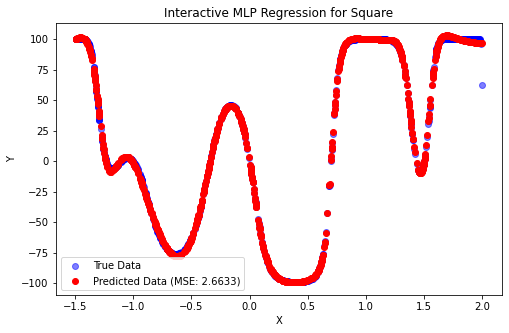

In [53]:
plt.figure(figsize=(8, 5))
plt.scatter(X_multimodalL_test, Y_multimodalL_test, label='True Data', color='blue', alpha=0.5)
plt.scatter(X_multimodalL_test, Ypred, label=f'Predicted Data (MSE: {mse_value:.4f})', color='red')
plt.legend()
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Interactive MLP Regression for Square')
plt.show()

# now lets move on to additional testing on step-large and rings5-regular and ring3-regular

stepsL and rings3-regular are already loaded a normalized.  
X_stepsL_train_normalized = (X_stepsL_train- np.mean(X_stepsL_train))/(np.std(X_stepsL_train))
Y_stepsL_train_normalized =(Y_stepsL_train - np.mean(Y_stepsL_train))/(np.std(Y_stepsL_train))
X_stepsL_test_normalized = (X_stepsL_test - np.mean(X_stepsL_train))/(np.std(X_stepsL_train))
Y_stepsL_test_normalized =(Y_stepsL_test - np.mean(Y_stepsL_train))/(np.std(Y_stepsL_train)) 

X_ringsR_train = np.array(df_ringsR_train[['x', 'y']])  
Y_ringsR_train = np.array(df_ringsR_train[['c']])  
X_ringsR_test = np.array(df_ringsR_test[['x', 'y']])  
Y_ringsR_test = np.array(df_ringsR_test[['c']])  
X_ringsR_train_normalized = (X_ringsR_train - np.mean(X_ringsR_train))/np.std(X_ringsR_train)  
X_ringsR_test_normalized = (X_ringsR_test - np.mean(X_ringsR_train))/np.std(X_ringsR_train)    

Lets load ring5

In [32]:
df_ringsR5_train = pd.read_csv('rings5-regular-training.csv')
df_ringsR5_test = pd.read_csv('rings5-regular-test.csv')


In [33]:
df_ringsR5_train.head()

,x,y,c
0,26.926121,-16.588451,0
1,-77.438767,95.159464,0
2,-98.650099,94.923714,0
3,22.241184,-5.447678,0
4,12.843637,-21.496457,0


In [34]:
X_ringsR5_train = np.array(df_ringsR5_train[['x', 'y']])  
Y_ringsR5_train = np.array(df_ringsR5_train[['c']])  
X_ringsR5_test = np.array(df_ringsR5_test[['x', 'y']])  
Y_ringsR5_test = np.array(df_ringsR5_test[['c']]) 

In [35]:
X_ringsR5_train_normalized = (X_ringsR5_train - np.mean(X_ringsR5_train))/np.std(X_ringsR5_train)  
X_ringsR5_test_normalized = (X_ringsR5_test - np.mean(X_ringsR5_train))/np.std(X_ringsR5_train) 

## stepsLarge


lets test in on one hidden layer

In [54]:
activation_functions =['sigmoid', 'linear', 'tanh', 'relu']
num_neurons = [5, 10, 15, 20]

for hidden_function in activation_functions:
    for output_function in activation_functions:
        if hidden_function == output_function:
            continue
        for neurons in num_neurons:
            mlp_stepsL = MLPNoBackprop(layer_sizes = [1, neurons, 1], hidden_activation=hidden_function, output_activation=output_function)
            start_time = time.time()
            mlp_stepsL.mini_batch_GD(X_stepsL_train_normalized,Y_stepsL_train_normalized , epochs = 1000, learning_rate = 0.01, batch_size=64)
            end_time = time.time()
            execution_time = end_time - start_time
            print(f"""Execution time: {execution_time:.6f} seconds
            for one layer with {hidden_function} hidden activation and {output_function} output activation
            one layer with {neurons} neurons""")
            Ypred_normalized = mlp_stepsL.predict(X_stepsL_test_normalized)
            Ypred = (Ypred_normalized * np.std(Y_stepsL_train_normalized)) + np.mean(Y_stepsL_train_normalized)
            print('mse:')
            print(mlp_stepsL.mse(Ypred, Y_stepsL_test))
            print('--------------------------------------------------------------------------------')

Execution time: 37.009719 seconds
            for one layer with sigmoid hidden activation and linear output activation
            one layer with 5 neurons
mse:
7302.438220727504
--------------------------------------------------------------------------------
Execution time: 41.592634 seconds
            for one layer with sigmoid hidden activation and linear output activation
            one layer with 10 neurons
mse:
7301.556950814843
--------------------------------------------------------------------------------
Execution time: 42.604982 seconds
            for one layer with sigmoid hidden activation and linear output activation
            one layer with 15 neurons
mse:
7302.4268297343
--------------------------------------------------------------------------------
Execution time: 46.742369 seconds
            for one layer with sigmoid hidden activation and linear output activation
            one layer with 20 neurons
mse:
7301.789860376223
------------------------------------

Execution time: 11.726496 seconds
            for one layer with tanh hidden activation and relu output activation
            one layer with 5 neurons
mse:
7352.44870299836
--------------------------------------------------------------------------------
Execution time: 13.157080 seconds
            for one layer with tanh hidden activation and relu output activation
            one layer with 10 neurons
mse:
7353.383112641035
--------------------------------------------------------------------------------
Execution time: 14.855235 seconds
            for one layer with tanh hidden activation and relu output activation
            one layer with 15 neurons
mse:
7353.220439348105
--------------------------------------------------------------------------------
Execution time: 16.414217 seconds
            for one layer with tanh hidden activation and relu output activation
            one layer with 20 neurons
mse:
7353.072177128797
-------------------------------------------------------

### dalsze testy na większej ilości epok dla 3 najlepszych par funkcji 

In [59]:
activation_functions =[['sigmoid', 'linear'], ['tanh', 'linear'], ['relu', 'linear']]
num_neurons = [10, 15, 20, 25]

for el in activation_functions:
    for neurons in num_neurons:
            mlp_stepsL = MLPNoBackprop(layer_sizes = [1, neurons, 1], hidden_activation = el[0], output_activation = el[1])
            start_time = time.time()
            mlp_stepsL.mini_batch_GD(X_stepsL_train_normalized,Y_stepsL_train_normalized , epochs = 5000, learning_rate = 0.05, batch_size=64)
            end_time = time.time()
            execution_time = end_time - start_time
            print(f"""Execution time: {execution_time:.6f} seconds
            for one layer with {el[0]} hidden activation and {el[1]} output activation
            one layer with {neurons} neurons""")
            Ypred_normalized = mlp_stepsL.predict(X_stepsL_test_normalized)
            Ypred = (Ypred_normalized * np.std(Y_stepsL_train_normalized)) + np.mean(Y_stepsL_train_normalized)
            print('mse:')
            print(mlp_stepsL.mse(Ypred, Y_stepsL_test))
            print('--------------------------------------------------------------------------------')
        

Execution time: 65.576581 seconds
            for one layer with sigmoid hidden activation and linear output activation
            one layer with 10 neurons
mse:
7292.0775721280925
--------------------------------------------------------------------------------
Execution time: 66.860545 seconds
            for one layer with sigmoid hidden activation and linear output activation
            one layer with 15 neurons
mse:
7294.113757896469
--------------------------------------------------------------------------------
Execution time: 73.373752 seconds
            for one layer with sigmoid hidden activation and linear output activation
            one layer with 20 neurons
mse:
7297.369598197659
--------------------------------------------------------------------------------
Execution time: 84.676295 seconds
            for one layer with sigmoid hidden activation and linear output activation
            one layer with 25 neurons
mse:
7297.207003175
-----------------------------------

tanh and linear seems the best

In [81]:
mlp_stepsL = MLPNoBackprop(layer_sizes = [1, 6, 6, 1], hidden_activation = 'tanh', output_activation = 'linear')
start_time = time.time()
mlp_stepsL.mini_batch_GD(X_stepsL_train_normalized,Y_stepsL_train_normalized , epochs = 1000, learning_rate = 0.001, batch_size=64)
end_time = time.time()
execution_time = end_time - start_time
Ypred_normalized = mlp_stepsL.predict(X_stepsL_test_normalized)
Ypred = (Ypred_normalized * np.std(Y_stepsL_train_normalized)) + np.mean(Y_stepsL_train_normalized)
print('mse:')
print(mlp_stepsL.mse(Ypred, Y_stepsL_test))
print('--------------------------------------------------------------------------------')

Epoka 0: Loss = 1.649514118
Epoka 10: Loss = 1.420651906
Epoka 20: Loss = 1.388463435
Epoka 30: Loss = 1.362160155
Epoka 40: Loss = 1.342018226
Epoka 50: Loss = 1.325254574
Epoka 60: Loss = 1.309956604
Epoka 70: Loss = 1.297049848
Epoka 80: Loss = 1.286197924
Epoka 90: Loss = 1.278763383
Epoka 100: Loss = 1.266834194
Epoka 110: Loss = 1.263989856
Epoka 120: Loss = 1.255354675
Epoka 130: Loss = 1.247458000
Epoka 140: Loss = 1.245196018
Epoka 150: Loss = 1.240658921
Epoka 160: Loss = 1.237764573
Epoka 170: Loss = 1.232415432
Epoka 180: Loss = 1.227446683
Epoka 190: Loss = 1.233429340
Epoka 200: Loss = 1.222805689
Epoka 210: Loss = 1.221602680
Epoka 220: Loss = 1.221766837
Epoka 230: Loss = 1.217913079
Epoka 240: Loss = 1.217460046
Epoka 250: Loss = 1.214243330
Epoka 260: Loss = 1.208968750
Epoka 270: Loss = 1.205120803
Epoka 280: Loss = 1.211090280
Epoka 290: Loss = 1.206385692
Epoka 300: Loss = 1.207040220
Epoka 310: Loss = 1.202323790
Epoka 320: Loss = 1.202562732
Epoka 330: Loss = 1.2

## Rings3-Regular
będę testować rózne funkcje aktywacji w warstwie ukrytej, w output pozostaje softmax


In [87]:
activation_functions =['sigmoid', 'linear', 'tanh', 'relu']
num_neurons = [5, 10, 15, 20]
for el in activation_functions:
    for neurons in num_neurons:
        mlp_ringsR = MLPNoBackprop(layer_sizes = [X_ringsR_train.shape[1], neurons, len(np.unique(Y_ringsR_train))], 
                                   output_activation='softmax', hidden_activation = el)
        start_time = time.time()
        mlp_ringsR.classifiaction_train(X_ringsR_train_normalized, Y_ringsR_train, epochs = 1000, learning_rate=0.01, batch_size=10)
        end_time = time.time()
        execution_time = end_time - start_time
        print('--------------------------------------------------------------------------------------------')
        print(f"Czas wykonania: {execution_time:.6f} sekundy dla {el} w warstwie ukrytej i {neurons} neuronów")
        ypred = mlp_ringsR.predict_classification(X_ringsR_test_normalized)
        print('f1 score:')
        print(mlp_ringsR.f1_score(Y_ringsR_test, ypred))
        print('--------------------------------------------------------------------------------------------')


Epoka 0: Loss = 0.325316030
Epoka 10: Loss = 0.438041431
Epoka 20: Loss = 0.434231987
Epoka 30: Loss = 0.537188154
Epoka 40: Loss = 0.618863268
Epoka 50: Loss = 0.677081301
Epoka 60: Loss = 0.705475452
Epoka 70: Loss = 0.741406690
Epoka 80: Loss = 0.732148083
Epoka 90: Loss = 0.764778032
Epoka 100: Loss = 0.766476618
Epoka 110: Loss = 0.812211121
Epoka 120: Loss = 0.828766769
Epoka 130: Loss = 0.859876662
Epoka 140: Loss = 0.871527343
Epoka 150: Loss = 0.836352188
Epoka 160: Loss = 0.872765171
Epoka 170: Loss = 0.867900375
Epoka 180: Loss = 0.882727617
Epoka 190: Loss = 0.875086590
Epoka 200: Loss = 0.869732327
Epoka 210: Loss = 0.872215915
Epoka 220: Loss = 0.878452458
Epoka 230: Loss = 0.882003372
Epoka 240: Loss = 0.879794647
Epoka 250: Loss = 0.883919536
Epoka 260: Loss = 0.881385387
Epoka 270: Loss = 0.889949111
Epoka 280: Loss = 0.876982466
Epoka 290: Loss = 0.879758183
Epoka 300: Loss = 0.882615564
Epoka 310: Loss = 0.879896718
Epoka 320: Loss = 0.886635116
Epoka 330: Loss = 0.8

Epoka 560: Loss = 0.954635647
Epoka 570: Loss = 0.951965618
Epoka 580: Loss = 0.955971449
Epoka 590: Loss = 0.953267785
Epoka 600: Loss = 0.959308843
Epoka 610: Loss = 0.955904953
Epoka 620: Loss = 0.963276282
Epoka 630: Loss = 0.966005372
Epoka 640: Loss = 0.960631398
Epoka 650: Loss = 0.964666017
Epoka 660: Loss = 0.955939479
Epoka 670: Loss = 0.965992683
Epoka 680: Loss = 0.961969292
Epoka 690: Loss = 0.964647650
Epoka 700: Loss = 0.967325073
Epoka 710: Loss = 0.968011494
Epoka 720: Loss = 0.965990555
Epoka 730: Loss = 0.967361887
Epoka 740: Loss = 0.965395393
Epoka 750: Loss = 0.963999329
Epoka 760: Loss = 0.967957954
Epoka 770: Loss = 0.967369405
Epoka 780: Loss = 0.971361150
Epoka 790: Loss = 0.964593498
Epoka 800: Loss = 0.966630483
Epoka 810: Loss = 0.966662498
Epoka 820: Loss = 0.970661980
Epoka 830: Loss = 0.966038403
Epoka 840: Loss = 0.968104306
Epoka 850: Loss = 0.971373127
Epoka 860: Loss = 0.970016773
Epoka 870: Loss = 0.971353717
Epoka 880: Loss = 0.973342482
Epoka 890:

Epoka 20: Loss = 0.380720908
Epoka 30: Loss = 0.359070991
Epoka 40: Loss = 0.423781372
Epoka 50: Loss = 0.437063122
Epoka 60: Loss = 0.445602979
Epoka 70: Loss = 0.357689059
Epoka 80: Loss = 0.429186392
Epoka 90: Loss = 0.428721500
Epoka 100: Loss = 0.354815554
Epoka 110: Loss = 0.448357262
Epoka 120: Loss = 0.404734225
Epoka 130: Loss = 0.348807519
Epoka 140: Loss = 0.357201300
Epoka 150: Loss = 0.338915419
Epoka 160: Loss = 0.350873713
Epoka 170: Loss = 0.506391358
Epoka 180: Loss = 0.388574869
Epoka 190: Loss = 0.384518214
Epoka 200: Loss = 0.458424869
Epoka 210: Loss = 0.367603456
Epoka 220: Loss = 0.392194074
Epoka 230: Loss = 0.392401680
Epoka 240: Loss = 0.474491133
Epoka 250: Loss = 0.409885121
Epoka 260: Loss = 0.462291787
Epoka 270: Loss = 0.452162979
Epoka 280: Loss = 0.435323482
Epoka 290: Loss = 0.501836136
Epoka 300: Loss = 0.503524207
Epoka 310: Loss = 0.376706584
Epoka 320: Loss = 0.487803506
Epoka 330: Loss = 0.460639801
Epoka 340: Loss = 0.404464332
Epoka 350: Loss = 

Epoka 580: Loss = 0.384925584
Epoka 590: Loss = 0.408589286
Epoka 600: Loss = 0.370609722
Epoka 610: Loss = 0.451457638
Epoka 620: Loss = 0.426557384
Epoka 630: Loss = 0.431859624
Epoka 640: Loss = 0.378163823
Epoka 650: Loss = 0.430311041
Epoka 660: Loss = 0.430805285
Epoka 670: Loss = 0.496696762
Epoka 680: Loss = 0.363091192
Epoka 690: Loss = 0.399223698
Epoka 700: Loss = 0.418345656
Epoka 710: Loss = 0.426472693
Epoka 720: Loss = 0.454061754
Epoka 730: Loss = 0.360242820
Epoka 740: Loss = 0.351278442
Epoka 750: Loss = 0.366339162
Epoka 760: Loss = 0.353587912
Epoka 770: Loss = 0.503786579
Epoka 780: Loss = 0.457578990
Epoka 790: Loss = 0.377352245
Epoka 800: Loss = 0.423066047
Epoka 810: Loss = 0.433695902
Epoka 820: Loss = 0.391770072
Epoka 830: Loss = 0.488731884
Epoka 840: Loss = 0.418378916
Epoka 850: Loss = 0.440350921
Epoka 860: Loss = 0.380627368
Epoka 870: Loss = 0.380839455
Epoka 880: Loss = 0.434604279
Epoka 890: Loss = 0.382086913
Epoka 900: Loss = 0.465860104
Epoka 910:

Epoka 40: Loss = 0.908913334
Epoka 50: Loss = 0.934167163
Epoka 60: Loss = 0.926241518
Epoka 70: Loss = 0.912151437
Epoka 80: Loss = 0.941376763
Epoka 90: Loss = 0.937783460
Epoka 100: Loss = 0.933427087
Epoka 110: Loss = 0.946580093
Epoka 120: Loss = 0.935033624
Epoka 130: Loss = 0.954014028
Epoka 140: Loss = 0.959326339
Epoka 150: Loss = 0.952594394
Epoka 160: Loss = 0.963997599
Epoka 170: Loss = 0.960086387
Epoka 180: Loss = 0.964628618
Epoka 190: Loss = 0.961907779
Epoka 200: Loss = 0.958078817
Epoka 210: Loss = 0.957877550
Epoka 220: Loss = 0.966675715
Epoka 230: Loss = 0.971969770
Epoka 240: Loss = 0.958732480
Epoka 250: Loss = 0.959243493
Epoka 260: Loss = 0.970009434
Epoka 270: Loss = 0.959228011
Epoka 280: Loss = 0.973348807
Epoka 290: Loss = 0.970665526
Epoka 300: Loss = 0.967371313
Epoka 310: Loss = 0.957285390
Epoka 320: Loss = 0.965401226
Epoka 330: Loss = 0.961378331
Epoka 340: Loss = 0.953035437
Epoka 350: Loss = 0.968734390
Epoka 360: Loss = 0.974689856
Epoka 370: Loss 

Epoka 600: Loss = 0.778290504
Epoka 610: Loss = 0.765893593
Epoka 620: Loss = 0.740068646
Epoka 630: Loss = 0.779541072
Epoka 640: Loss = 0.760347103
Epoka 650: Loss = 0.767065041
Epoka 660: Loss = 0.757625064
Epoka 670: Loss = 0.765889023
Epoka 680: Loss = 0.749657440
Epoka 690: Loss = 0.760206196
Epoka 700: Loss = 0.759413917
Epoka 710: Loss = 0.780131310
Epoka 720: Loss = 0.736095452
Epoka 730: Loss = 0.756619702
Epoka 740: Loss = 0.770295490
Epoka 750: Loss = 0.767161662
Epoka 760: Loss = 0.774096158
Epoka 770: Loss = 0.765877078
Epoka 780: Loss = 0.752137122
Epoka 790: Loss = 0.777262674
Epoka 800: Loss = 0.764392560
Epoka 810: Loss = 0.767642068
Epoka 820: Loss = 0.779192733
Epoka 830: Loss = 0.777702474
Epoka 840: Loss = 0.756956485
Epoka 850: Loss = 0.774853360
Epoka 860: Loss = 0.770443245
Epoka 870: Loss = 0.756618249
Epoka 880: Loss = 0.752008168
Epoka 890: Loss = 0.769936788
Epoka 900: Loss = 0.761628885
Epoka 910: Loss = 0.773199239
Epoka 920: Loss = 0.770429392
Epoka 930:

Epoka 80: Loss = 0.919229217
Epoka 90: Loss = 0.928819533
Epoka 100: Loss = 0.901539152
Epoka 110: Loss = 0.932672617
Epoka 120: Loss = 0.930852166
Epoka 130: Loss = 0.894338214
Epoka 140: Loss = 0.930897581
Epoka 150: Loss = 0.928491707
Epoka 160: Loss = 0.923122525
Epoka 170: Loss = 0.919864374
Epoka 180: Loss = 0.930678139
Epoka 190: Loss = 0.900613557
Epoka 200: Loss = 0.938979842
Epoka 210: Loss = 0.925636659
Epoka 220: Loss = 0.891455546
Epoka 230: Loss = 0.913089428
Epoka 240: Loss = 0.902817982
Epoka 250: Loss = 0.941366454
Epoka 260: Loss = 0.851325059
Epoka 270: Loss = 0.947345910
Epoka 280: Loss = 0.959987553
Epoka 290: Loss = 0.928816032
Epoka 300: Loss = 0.950510612
Epoka 310: Loss = 0.938268348
Epoka 320: Loss = 0.947976899
Epoka 330: Loss = 0.951978529
Epoka 340: Loss = 0.918520906
Epoka 350: Loss = 0.921508256
Epoka 360: Loss = 0.942252139
Epoka 370: Loss = 0.958627662
Epoka 380: Loss = 0.930293012
Epoka 390: Loss = 0.853419703
Epoka 400: Loss = 0.912782615
Epoka 410: L

 najlepiej pordział sobie tanh, sigmoid, relu tez wypada nie najgorzej, najgorzej linear

## Rings5-regular

In [89]:
activation_functions =['sigmoid', 'linear', 'tanh', 'relu']
num_neurons = [5, 10, 15, 20]
for el in activation_functions:
    for neurons in num_neurons:
        mlp_ringsR = MLPNoBackprop(layer_sizes = [X_ringsR5_train.shape[1], neurons, len(np.unique(Y_ringsR5_train))], 
                                   output_activation='softmax', hidden_activation = el)
        start_time = time.time()
        mlp_ringsR.classifiaction_train(X_ringsR5_train_normalized, Y_ringsR5_train, epochs = 1000, learning_rate=0.01, batch_size=10)
        end_time = time.time()
        execution_time = end_time - start_time
        print('--------------------------------------------------------------------------------------------')
        print(f"Czas wykonania: {execution_time:.6f} sekundy dla {el} w warstwie ukrytej i {neurons} neuronów")
        ypred = mlp_ringsR.predict_classification(X_ringsR5_test_normalized)
        print('f1 score:')
        print(mlp_ringsR.f1_score(Y_ringsR5_test, ypred))
        print('--------------------------------------------------------------------------------------------')


Epoka 0: Loss = 0.210162206
Epoka 10: Loss = 0.305835164
Epoka 20: Loss = 0.394082362
Epoka 30: Loss = 0.562739107
Epoka 40: Loss = 0.497999253
Epoka 50: Loss = 0.481666138
Epoka 60: Loss = 0.570567539
Epoka 70: Loss = 0.665527401
Epoka 80: Loss = 0.666709396
Epoka 90: Loss = 0.654296339
Epoka 100: Loss = 0.690149529
Epoka 110: Loss = 0.692357182
Epoka 120: Loss = 0.698592685
Epoka 130: Loss = 0.691198487
Epoka 140: Loss = 0.708581158
Epoka 150: Loss = 0.703337484
Epoka 160: Loss = 0.703756433
Epoka 170: Loss = 0.698410095
Epoka 180: Loss = 0.708805933
Epoka 190: Loss = 0.706997884
Epoka 200: Loss = 0.715938503
Epoka 210: Loss = 0.710910710
Epoka 220: Loss = 0.717891493
Epoka 230: Loss = 0.715382930
Epoka 240: Loss = 0.724840199
Epoka 250: Loss = 0.719167885
Epoka 260: Loss = 0.712473757
Epoka 270: Loss = 0.717422628
Epoka 280: Loss = 0.729631283
Epoka 290: Loss = 0.723472570
Epoka 300: Loss = 0.727757871
Epoka 310: Loss = 0.731403966
Epoka 320: Loss = 0.728956009
Epoka 330: Loss = 0.7

Epoka 550: Loss = 0.918147194
Epoka 560: Loss = 0.920622079
Epoka 570: Loss = 0.920560335
Epoka 580: Loss = 0.922283428
Epoka 590: Loss = 0.918798766
Epoka 600: Loss = 0.918717162
Epoka 610: Loss = 0.925522768
Epoka 620: Loss = 0.924493931
Epoka 630: Loss = 0.918952047
Epoka 640: Loss = 0.926268589
Epoka 650: Loss = 0.921410658
Epoka 660: Loss = 0.927821356
Epoka 670: Loss = 0.926824841
Epoka 680: Loss = 0.926929321
Epoka 690: Loss = 0.929473053
Epoka 700: Loss = 0.930255042
Epoka 710: Loss = 0.931774433
Epoka 720: Loss = 0.933516492
Epoka 730: Loss = 0.934112397
Epoka 740: Loss = 0.931108978
Epoka 750: Loss = 0.930119936
Epoka 760: Loss = 0.935196345
Epoka 770: Loss = 0.933428412
Epoka 780: Loss = 0.931876234
Epoka 790: Loss = 0.935895965
Epoka 800: Loss = 0.934366190
Epoka 810: Loss = 0.934967261
Epoka 820: Loss = 0.935943920
Epoka 830: Loss = 0.939827484
Epoka 840: Loss = 0.932553843
Epoka 850: Loss = 0.937389083
Epoka 860: Loss = 0.935032401
Epoka 870: Loss = 0.938200794
Epoka 880:

Epoka 20: Loss = 0.298498173
Epoka 30: Loss = 0.288298166
Epoka 40: Loss = 0.267627508
Epoka 50: Loss = 0.320464108
Epoka 60: Loss = 0.329552809
Epoka 70: Loss = 0.294482866
Epoka 80: Loss = 0.288761580
Epoka 90: Loss = 0.306756265
Epoka 100: Loss = 0.332353302
Epoka 110: Loss = 0.315068240
Epoka 120: Loss = 0.274103928
Epoka 130: Loss = 0.325874690
Epoka 140: Loss = 0.311914235
Epoka 150: Loss = 0.299706247
Epoka 160: Loss = 0.288378020
Epoka 170: Loss = 0.281311267
Epoka 180: Loss = 0.311231219
Epoka 190: Loss = 0.242737566
Epoka 200: Loss = 0.248550935
Epoka 210: Loss = 0.246265086
Epoka 220: Loss = 0.303709970
Epoka 230: Loss = 0.301303567
Epoka 240: Loss = 0.279203249
Epoka 250: Loss = 0.315677193
Epoka 260: Loss = 0.315932415
Epoka 270: Loss = 0.320371527
Epoka 280: Loss = 0.289592344
Epoka 290: Loss = 0.251603488
Epoka 300: Loss = 0.309452372
Epoka 310: Loss = 0.314191294
Epoka 320: Loss = 0.234898542
Epoka 330: Loss = 0.269543103
Epoka 340: Loss = 0.281381763
Epoka 350: Loss = 

Epoka 600: Loss = 0.264899738
Epoka 610: Loss = 0.267957769
Epoka 620: Loss = 0.290458037
Epoka 630: Loss = 0.324903035
Epoka 640: Loss = 0.276385174
Epoka 650: Loss = 0.279645045
Epoka 660: Loss = 0.303455008
Epoka 670: Loss = 0.259067015
Epoka 680: Loss = 0.293046181
Epoka 690: Loss = 0.300889661
Epoka 700: Loss = 0.243567076
Epoka 710: Loss = 0.281292335
Epoka 720: Loss = 0.313036825
Epoka 730: Loss = 0.301339421
Epoka 740: Loss = 0.275308134
Epoka 750: Loss = 0.311688813
Epoka 760: Loss = 0.284130183
Epoka 770: Loss = 0.297481864
Epoka 780: Loss = 0.316952434
Epoka 790: Loss = 0.294803106
Epoka 800: Loss = 0.311886079
Epoka 810: Loss = 0.289254188
Epoka 820: Loss = 0.287242955
Epoka 830: Loss = 0.297823594
Epoka 840: Loss = 0.269098168
Epoka 850: Loss = 0.283425048
Epoka 860: Loss = 0.308681001
Epoka 870: Loss = 0.302183395
Epoka 880: Loss = 0.303774884
Epoka 890: Loss = 0.311836898
Epoka 900: Loss = 0.284895626
Epoka 910: Loss = 0.299282068
Epoka 920: Loss = 0.270403153
Epoka 930:

Epoka 60: Loss = 0.899750598
Epoka 70: Loss = 0.892317332
Epoka 80: Loss = 0.906758011
Epoka 90: Loss = 0.913121538
Epoka 100: Loss = 0.924073653
Epoka 110: Loss = 0.920126587
Epoka 120: Loss = 0.928502787
Epoka 130: Loss = 0.928687850
Epoka 140: Loss = 0.933949684
Epoka 150: Loss = 0.937818477
Epoka 160: Loss = 0.938312097
Epoka 170: Loss = 0.937372822
Epoka 180: Loss = 0.941374378
Epoka 190: Loss = 0.940400858
Epoka 200: Loss = 0.946234654
Epoka 210: Loss = 0.946317149
Epoka 220: Loss = 0.946981881
Epoka 230: Loss = 0.923757449
Epoka 240: Loss = 0.947048106
Epoka 250: Loss = 0.955961075
Epoka 260: Loss = 0.950213325
Epoka 270: Loss = 0.957632822
Epoka 280: Loss = 0.961647290
Epoka 290: Loss = 0.952620809
Epoka 300: Loss = 0.960746537
Epoka 310: Loss = 0.951923305
Epoka 320: Loss = 0.959138028
Epoka 330: Loss = 0.956016407
Epoka 340: Loss = 0.967982012
Epoka 350: Loss = 0.960566520
Epoka 360: Loss = 0.960772477
Epoka 370: Loss = 0.965526436
Epoka 380: Loss = 0.959998304
Epoka 390: Los

Epoka 630: Loss = 0.767910327
Epoka 640: Loss = 0.788805983
Epoka 650: Loss = 0.734214671
Epoka 660: Loss = 0.793032165
Epoka 670: Loss = 0.792138061
Epoka 680: Loss = 0.785650590
Epoka 690: Loss = 0.800810324
Epoka 700: Loss = 0.799630346
Epoka 710: Loss = 0.777482941
Epoka 720: Loss = 0.779630221
Epoka 730: Loss = 0.801980747
Epoka 740: Loss = 0.794358841
Epoka 750: Loss = 0.759454760
Epoka 760: Loss = 0.808759282
Epoka 770: Loss = 0.792977672
Epoka 780: Loss = 0.793631160
Epoka 790: Loss = 0.794520143
Epoka 800: Loss = 0.780880942
Epoka 810: Loss = 0.799978439
Epoka 820: Loss = 0.805588270
Epoka 830: Loss = 0.797909071
Epoka 840: Loss = 0.784509122
Epoka 850: Loss = 0.789342487
Epoka 860: Loss = 0.782006428
Epoka 870: Loss = 0.779422291
Epoka 880: Loss = 0.797786283
Epoka 890: Loss = 0.771782876
Epoka 900: Loss = 0.789924714
Epoka 910: Loss = 0.779833699
Epoka 920: Loss = 0.794420150
Epoka 930: Loss = 0.794649106
Epoka 940: Loss = 0.782207748
Epoka 950: Loss = 0.777079873
Epoka 960:

Epoka 100: Loss = 0.897670664
Epoka 110: Loss = 0.891148528
Epoka 120: Loss = 0.883763013
Epoka 130: Loss = 0.887653322
Epoka 140: Loss = 0.910244061
Epoka 150: Loss = 0.912813695
Epoka 160: Loss = 0.872394492
Epoka 170: Loss = 0.896018148
Epoka 180: Loss = 0.868681694
Epoka 190: Loss = 0.898573841
Epoka 200: Loss = 0.891089009
Epoka 210: Loss = 0.859318826
Epoka 220: Loss = 0.878964979
Epoka 230: Loss = 0.874180290
Epoka 240: Loss = 0.884414667
Epoka 250: Loss = 0.830923408
Epoka 260: Loss = 0.904462166
Epoka 270: Loss = 0.874789416
Epoka 280: Loss = 0.890748853
Epoka 290: Loss = 0.825879236
Epoka 300: Loss = 0.886824833
Epoka 310: Loss = 0.903990624
Epoka 320: Loss = 0.891271564
Epoka 330: Loss = 0.902256275
Epoka 340: Loss = 0.866569427
Epoka 350: Loss = 0.891022300
Epoka 360: Loss = 0.884657942
Epoka 370: Loss = 0.883549943
Epoka 380: Loss = 0.902688093
Epoka 390: Loss = 0.902123159
Epoka 400: Loss = 0.904279363
Epoka 410: Loss = 0.901922485
Epoka 420: Loss = 0.867741140
Epoka 430:

najlepiej tanh i 20 neuronów, znów najgorzej linear - wniosek: linear niw n

# --------------------------------------------NN6-----------------------------------------------

In this part, I’ll take a closer look at the overfitting problem in neural networks and try out some common ways to deal with it. I’ll add weight regularization and use early stopping when the validation error starts to increase. The goal is to see how these techniques affect the model’s performance on the test set.

I’ll run a series of experiments with and without these overfitting prevention methods and compare the results. The datasets I’ll be using are:

- multimodal-sparse

- rings5-sparse

- rings3-balance

- xor3-balance

## multimodal-sparse

In [36]:
df_multimodalS_train = pd.read_csv('multimodal-sparse-training.csv')
df_multimodalS_test = pd.read_csv('multimodal-sparse-test.csv')

In [37]:
df_multimodalS_train.head()

,x,y
0,0.640965,-68.889138
1,1.863815,100.299997
2,0.319832,-98.423908
3,0.760805,73.467981
4,-0.151905,45.803681


In [38]:
X_multimodalS_train = np.array(df_multimodalS_train[['x']])
Y_multimodalS_train = np.array(df_multimodalS_train[['y']])
X_multimodalS_test = np.array(df_multimodalS_test[['x']])
Y_multimodalS_test = np.array(df_multimodalS_test[['y']])

In [39]:
X_multimodalS_train_normalized = (X_multimodalS_train-np.mean(X_multimodalS_train))/(np.std(X_multimodalS_train))  
Y_multimodalS_train_normalized = (Y_multimodalS_train-np.mean(Y_multimodalS_train))/(np.std(Y_multimodalS_train))  
X_multimodalS_test_normalized = (X_multimodalS_test-np.mean(X_multimodalS_train))/(np.std(X_multimodalS_train))  
Y_multimodalS_test_normalized = (Y_multimodalS_test-np.mean(Y_multimodalS_train))/(np.std(Y_multimodalS_train))

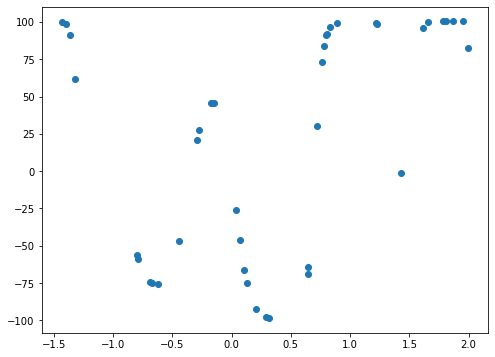

In [40]:
plt.figure(figsize=(8,6))
plt.scatter(X_multimodalS_train, Y_multimodalS_train)
plt.show()

### L1 regularization

Epoka 0: Loss = 17.985122631
Epoka 10: Loss = 2.612546697
Epoka 20: Loss = 2.557395234
Epoka 30: Loss = 2.571876859
Epoka 40: Loss = 2.513358841
Epoka 50: Loss = 2.442049533
Epoka 60: Loss = 2.420252212
Epoka 70: Loss = 2.352109393
Epoka 80: Loss = 2.329355364
Epoka 90: Loss = 2.308359646
Epoka 100: Loss = 2.289616031
Epoka 110: Loss = 2.260814900
Epoka 120: Loss = 2.250819029
Epoka 130: Loss = 2.258626331
Epoka 140: Loss = 2.258216618
Epoka 150: Loss = 2.251165869
Epoka 160: Loss = 2.231056827
Epoka 170: Loss = 2.226460926
Epoka 180: Loss = 2.233852399
Epoka 190: Loss = 2.226150655
Epoka 200: Loss = 2.227156987
Epoka 210: Loss = 2.217425069
Epoka 220: Loss = 2.205710364
Epoka 230: Loss = 2.201825107
Epoka 240: Loss = 2.193432764
Epoka 250: Loss = 2.212964174
Epoka 260: Loss = 2.193412846
Epoka 270: Loss = 2.191609758
Epoka 280: Loss = 2.180305437
Epoka 290: Loss = 2.177688292
Epoka 300: Loss = 2.183076331
Epoka 310: Loss = 2.179002237
Epoka 320: Loss = 2.157291773
Epoka 330: Loss = 2.

Epoka 3100: Loss = 1.388192237
Epoka 3110: Loss = 1.391398692
Epoka 3120: Loss = 1.387272338
Epoka 3130: Loss = 1.387765510
Epoka 3140: Loss = 1.385388358
Epoka 3150: Loss = 1.386395505
Epoka 3160: Loss = 1.386284629
Epoka 3170: Loss = 1.385571891
Epoka 3180: Loss = 1.380130159
Epoka 3190: Loss = 1.378024143
Epoka 3200: Loss = 1.377696377
Epoka 3210: Loss = 1.382011237
Epoka 3220: Loss = 1.371725905
Epoka 3230: Loss = 1.380117933
Epoka 3240: Loss = 1.372769734
Epoka 3250: Loss = 1.372950782
Epoka 3260: Loss = 1.372774723
Epoka 3270: Loss = 1.372401923
Epoka 3280: Loss = 1.365687706
Epoka 3290: Loss = 1.373600444
Epoka 3300: Loss = 1.364912610
Epoka 3310: Loss = 1.362897468
Epoka 3320: Loss = 1.360789899
Epoka 3330: Loss = 1.362634207
Epoka 3340: Loss = 1.354062848
Epoka 3350: Loss = 1.353149968
Epoka 3360: Loss = 1.352380519
Epoka 3370: Loss = 1.356123371
Epoka 3380: Loss = 1.348919882
Epoka 3390: Loss = 1.349784170
Epoka 3400: Loss = 1.356216088
Epoka 3410: Loss = 1.346609903
Epoka 34

Epoka 5910: Loss = 1.205472374
Epoka 5920: Loss = 1.204264698
Epoka 5930: Loss = 1.209142428
Epoka 5940: Loss = 1.204315940
Epoka 5950: Loss = 1.204040908
Epoka 5960: Loss = 1.205906827
Epoka 5970: Loss = 1.204274280
Epoka 5980: Loss = 1.204341052
Epoka 5990: Loss = 1.203890277
Epoka 6000: Loss = 1.206259194
Epoka 6010: Loss = 1.203758364
Epoka 6020: Loss = 1.203484428
Epoka 6030: Loss = 1.208291921
Epoka 6040: Loss = 1.203050661
Epoka 6050: Loss = 1.203349084
Epoka 6060: Loss = 1.204252930
Epoka 6070: Loss = 1.203437555
Epoka 6080: Loss = 1.204419039
Epoka 6090: Loss = 1.204758470
Epoka 6100: Loss = 1.203998197
Epoka 6110: Loss = 1.207414980
Epoka 6120: Loss = 1.206639837
Epoka 6130: Loss = 1.203699078
Epoka 6140: Loss = 1.202696902
Epoka 6150: Loss = 1.202641289
Epoka 6160: Loss = 1.206017831
Epoka 6170: Loss = 1.206253203
Epoka 6180: Loss = 1.203997004
Epoka 6190: Loss = 1.204225828
Epoka 6200: Loss = 1.205893918
Epoka 6210: Loss = 1.205388077
Epoka 6220: Loss = 1.206781263
Epoka 62

Epoka 8850: Loss = 1.206216225
Epoka 8860: Loss = 1.208456024
Epoka 8870: Loss = 1.204914289
Epoka 8880: Loss = 1.204873005
Epoka 8890: Loss = 1.206288634
Epoka 8900: Loss = 1.208643745
Epoka 8910: Loss = 1.204640506
Epoka 8920: Loss = 1.204472176
Epoka 8930: Loss = 1.205257164
Epoka 8940: Loss = 1.204554974
Epoka 8950: Loss = 1.205067088
Epoka 8960: Loss = 1.210167724
Epoka 8970: Loss = 1.209203865
Epoka 8980: Loss = 1.211061455
Epoka 8990: Loss = 1.206241434
Epoka 9000: Loss = 1.207062772
Epoka 9010: Loss = 1.209339081
Epoka 9020: Loss = 1.210771545
Epoka 9030: Loss = 1.207952123
Epoka 9040: Loss = 1.216427095
Epoka 9050: Loss = 1.207346437
Epoka 9060: Loss = 1.208637732
Epoka 9070: Loss = 1.205326053
Epoka 9080: Loss = 1.207853594
Epoka 9090: Loss = 1.205021752
Epoka 9100: Loss = 1.205136919
Epoka 9110: Loss = 1.209070551
Epoka 9120: Loss = 1.206463107
Epoka 9130: Loss = 1.206617633
Epoka 9140: Loss = 1.207433389
Epoka 9150: Loss = 1.205438819
Epoka 9160: Loss = 1.205745057
Epoka 91

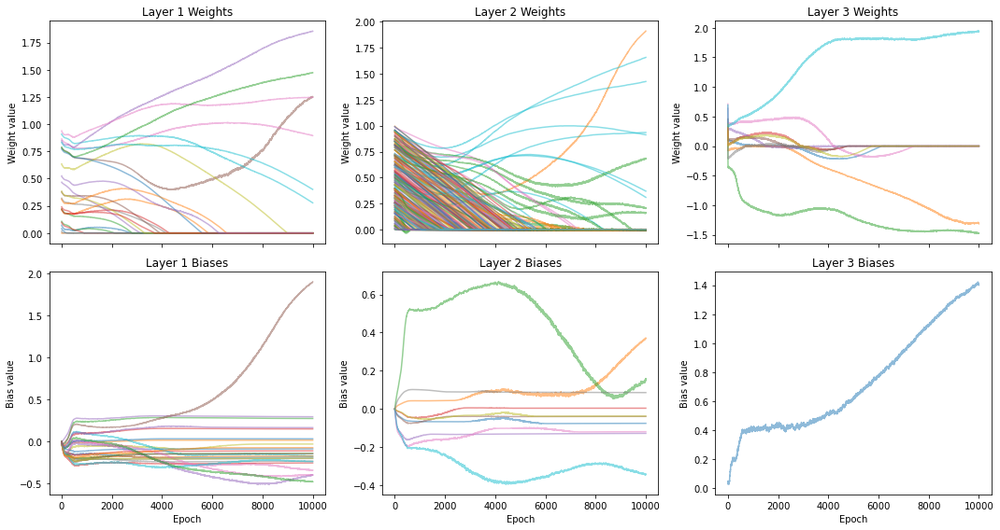

Czas wykonania: 5.018576 sekundy
mse:
1441.7137873156964
--------------------------------------------------------------------------------


In [128]:
mlp_multimodal1 = MLPNoBackprop(layer_sizes = [1, 25, 10, 1], hidden_activation='tanh', l1_lambda=0.01)
start_time = time.time()
mlp_multimodal1.mini_batch_GD(X_multimodalS_train_normalized, Y_multimodalS_train_normalized, batch_size = 32, epochs=10000, learning_rate=0.01)
end_time = time.time()
execution_time = end_time - start_time
print(f"Czas wykonania: {execution_time:.6f} sekundy")
Ypred_normalized = mlp_multimodal1.predict(X_multimodalS_test_normalized)
Ypred = (Ypred_normalized * np.std(Y_multimodalS_train)) + np.mean(Y_multimodalS_train)
print('mse:')
print(mlp_multimodal1.mse(Ypred, Y_multimodalS_test))
print('--------------------------------------------------------------------------------')

In [50]:
from itertools import product

Testuję: lr=0.0001, l1=0.0, bs=16, activation=tanh


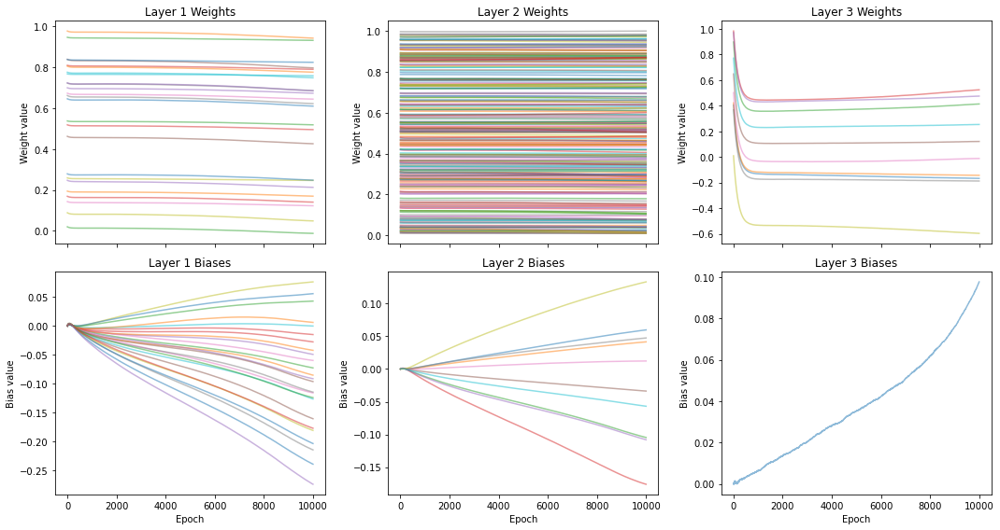

Testuję: lr=0.0001, l1=0.0, bs=32, activation=tanh


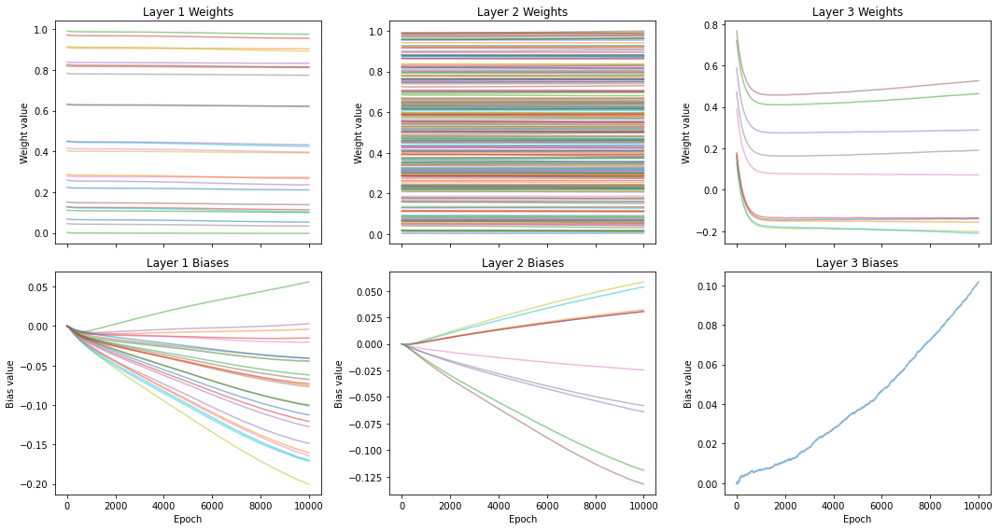

Testuję: lr=0.0001, l1=0.0, bs=64, activation=tanh


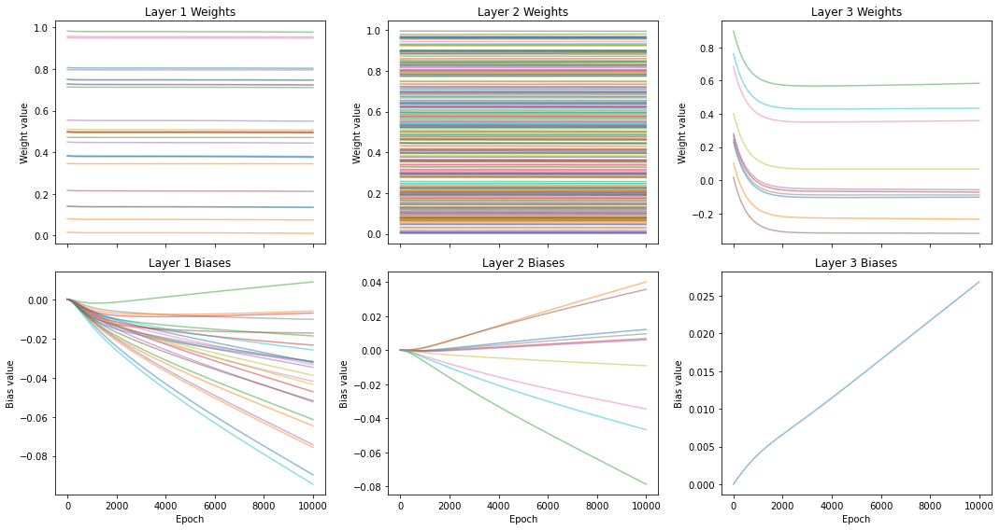

Testuję: lr=0.0001, l1=0.001, bs=16, activation=tanh


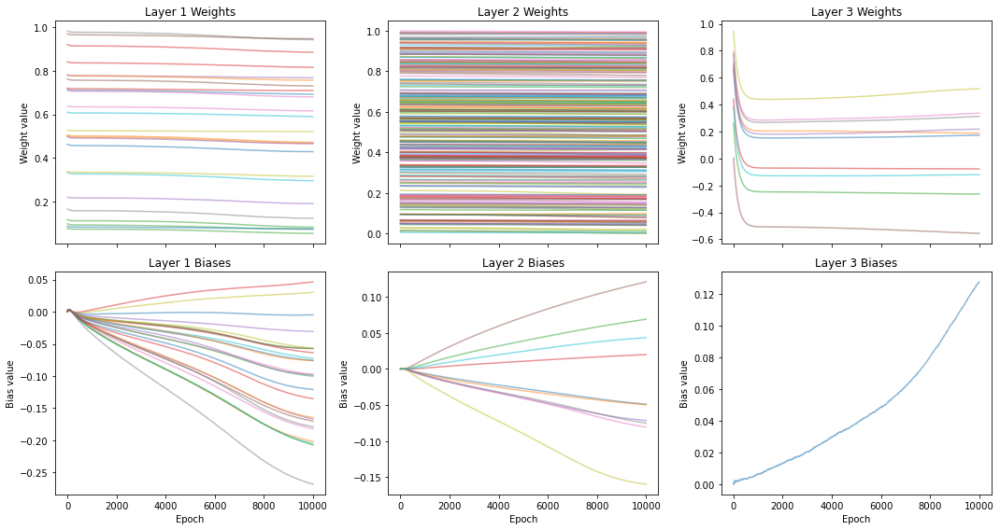

Testuję: lr=0.0001, l1=0.001, bs=32, activation=tanh


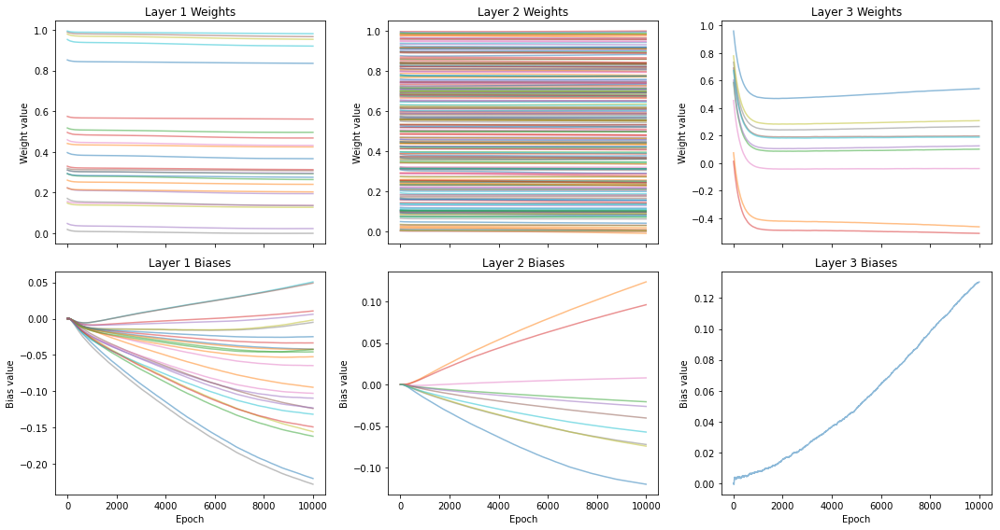

Testuję: lr=0.0001, l1=0.001, bs=64, activation=tanh


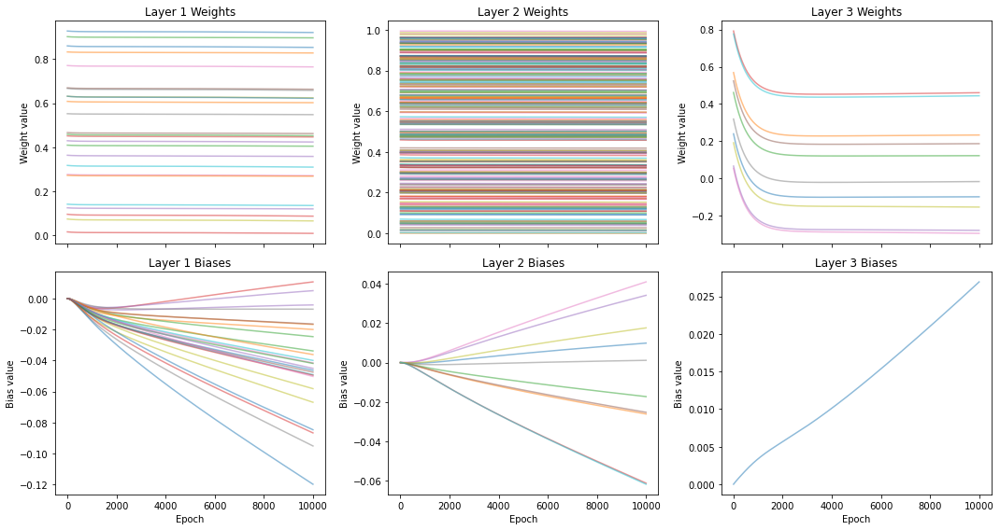

Testuję: lr=0.0001, l1=0.005, bs=16, activation=tanh


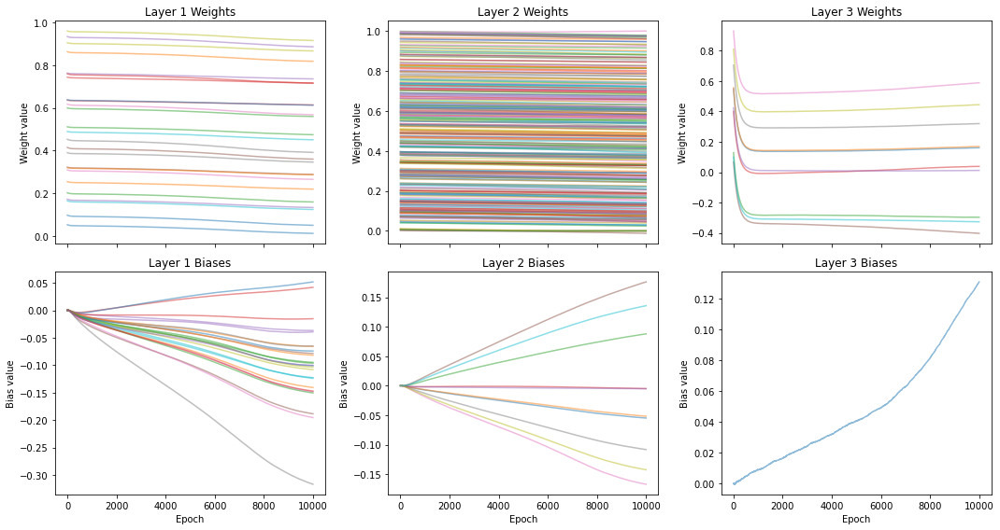

Testuję: lr=0.0001, l1=0.005, bs=32, activation=tanh


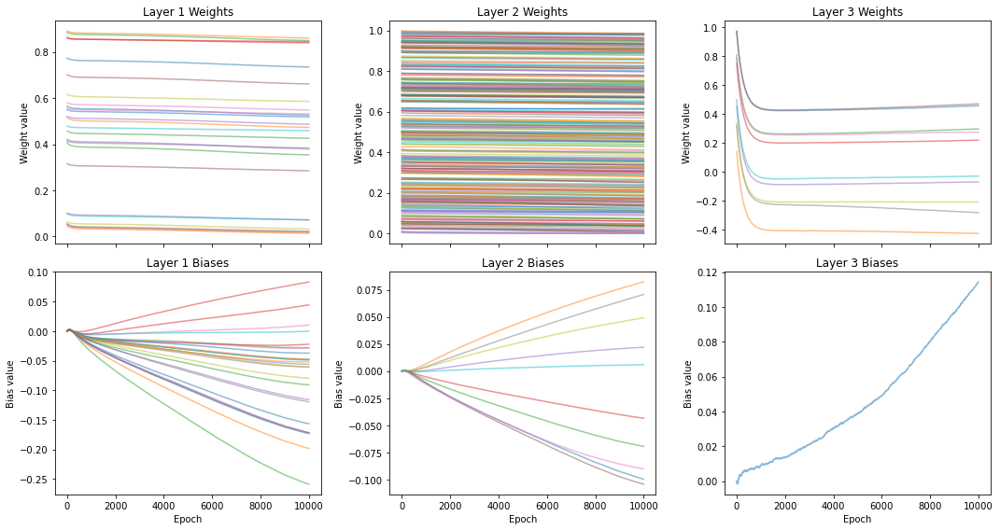

Testuję: lr=0.0001, l1=0.005, bs=64, activation=tanh


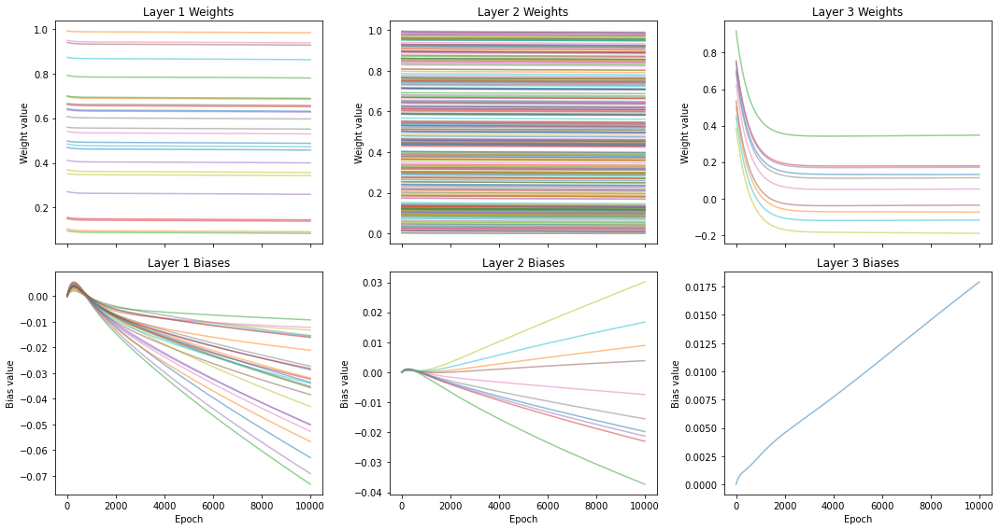

Testuję: lr=0.0001, l1=0.01, bs=16, activation=tanh


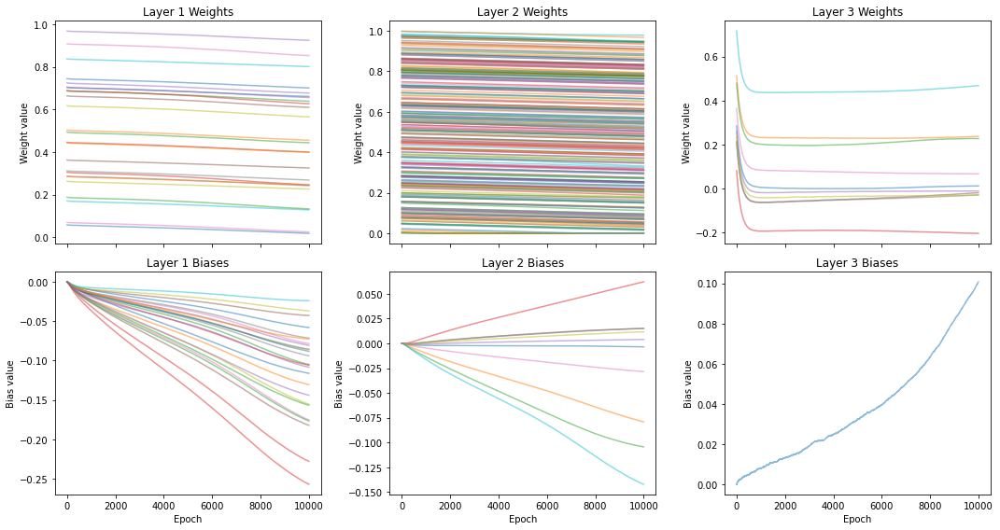

Testuję: lr=0.0001, l1=0.01, bs=32, activation=tanh


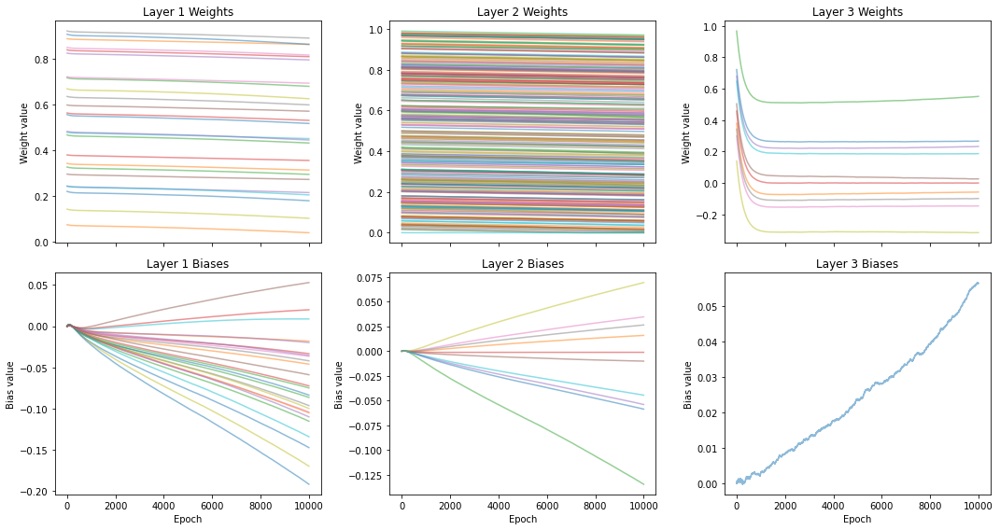

Testuję: lr=0.0001, l1=0.01, bs=64, activation=tanh


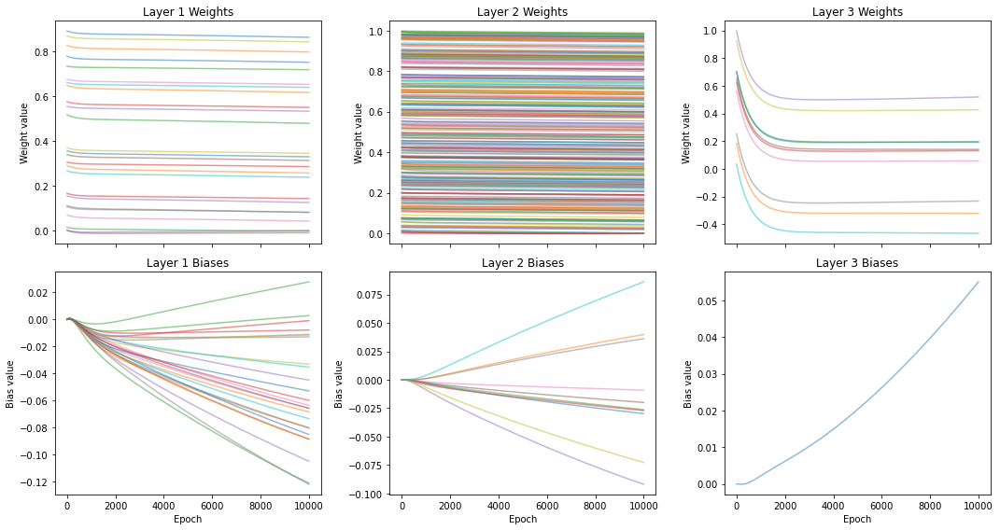

Testuję: lr=0.001, l1=0.0, bs=16, activation=tanh


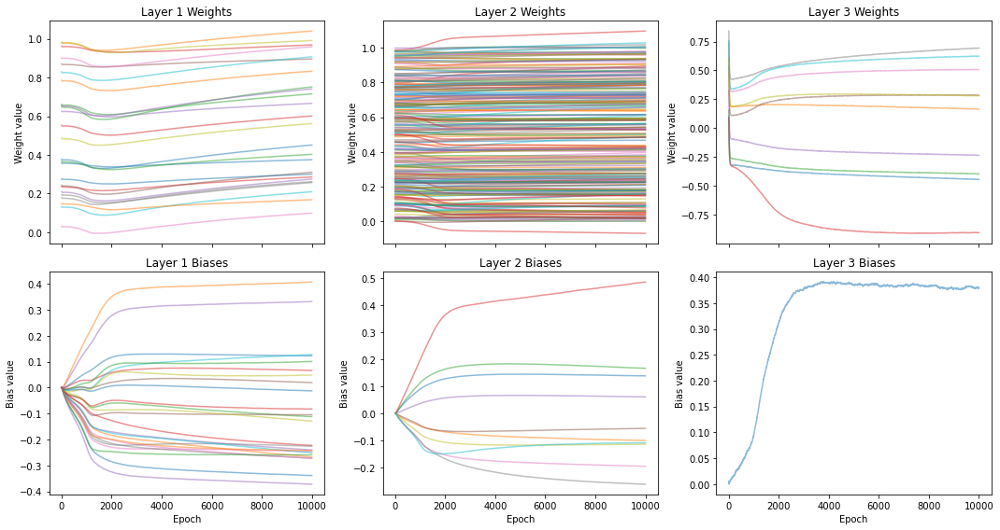

Testuję: lr=0.001, l1=0.0, bs=32, activation=tanh


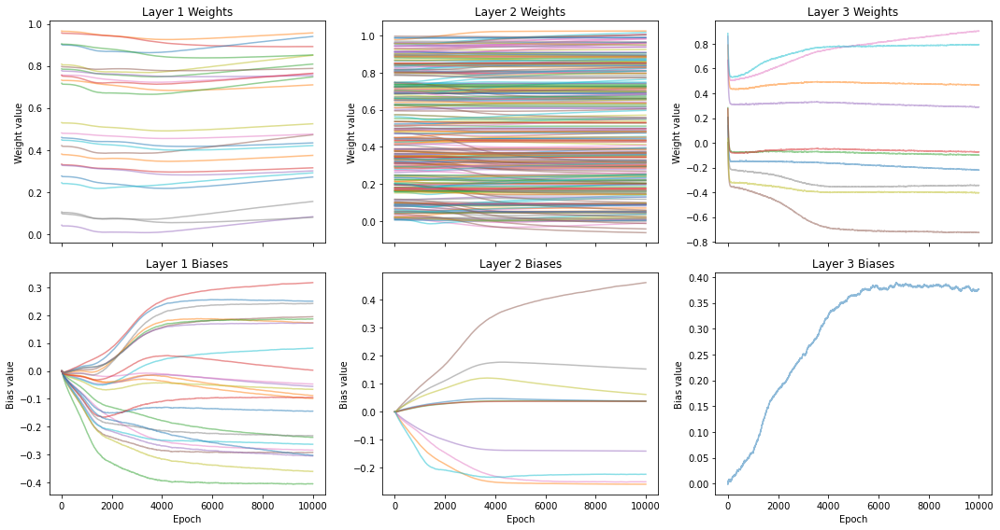

Testuję: lr=0.001, l1=0.0, bs=64, activation=tanh


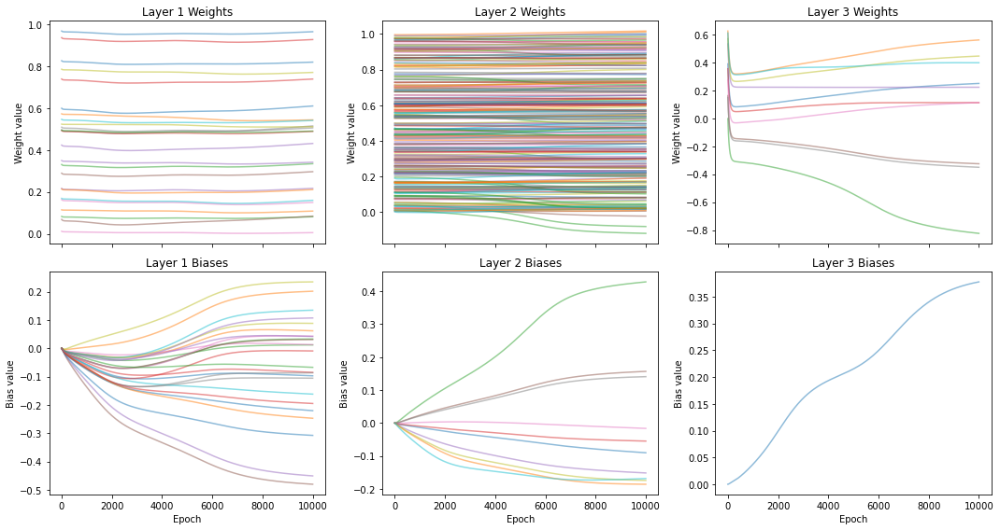

Testuję: lr=0.001, l1=0.001, bs=16, activation=tanh


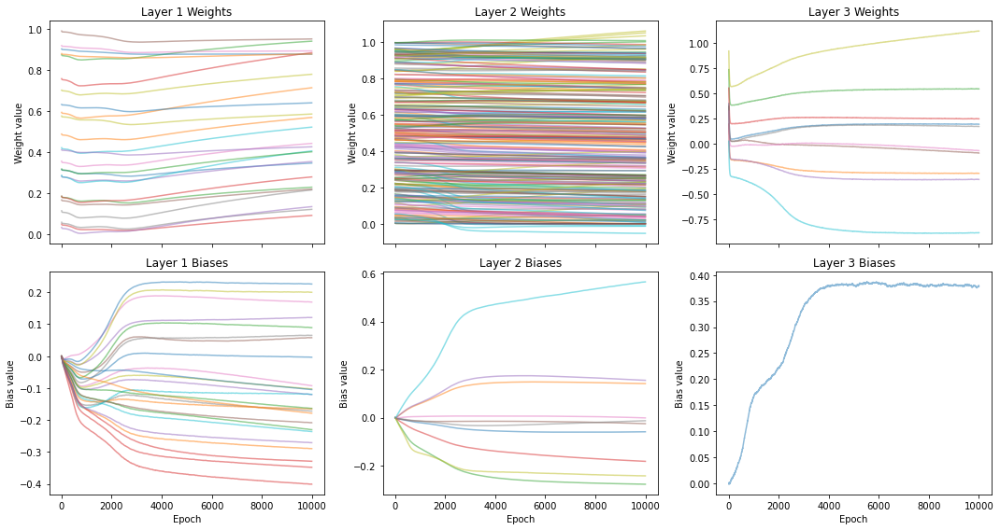

Testuję: lr=0.001, l1=0.001, bs=32, activation=tanh


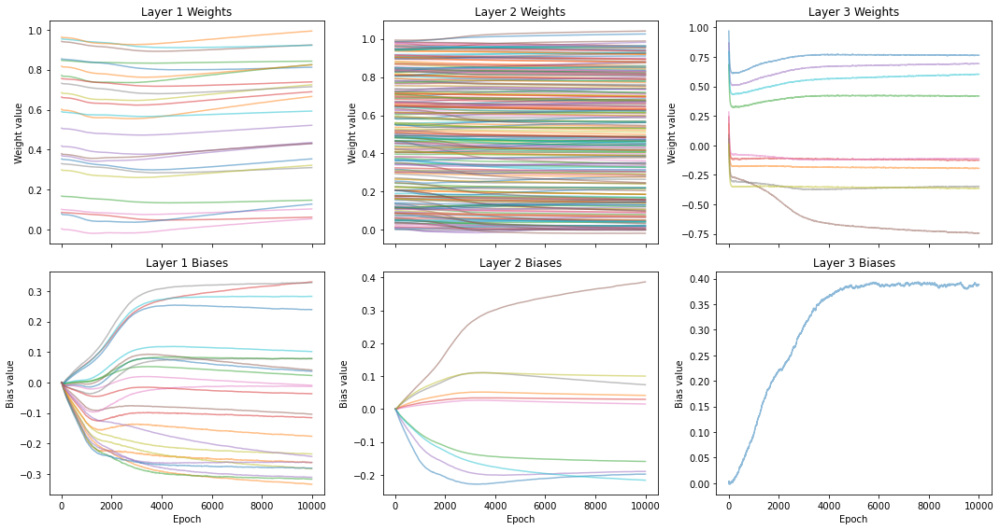

Testuję: lr=0.001, l1=0.001, bs=64, activation=tanh


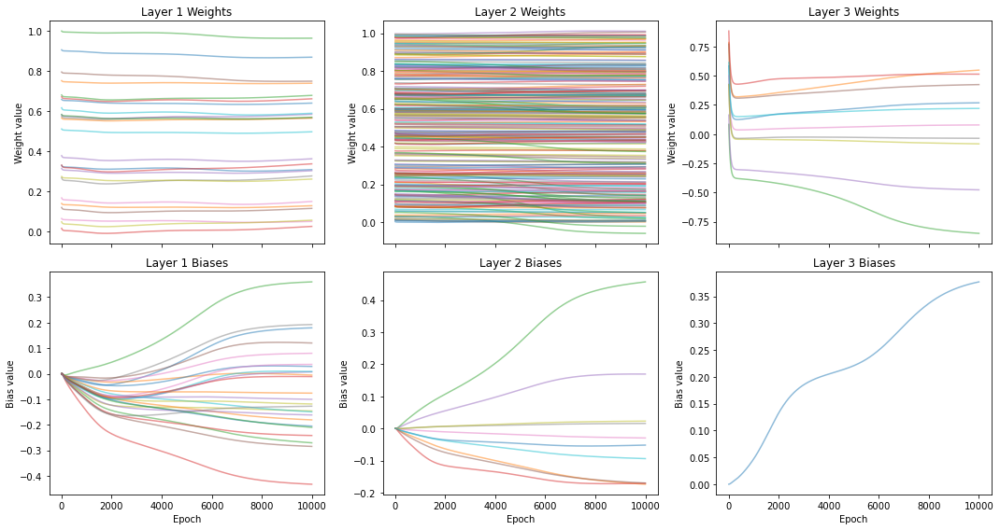

Testuję: lr=0.001, l1=0.005, bs=16, activation=tanh


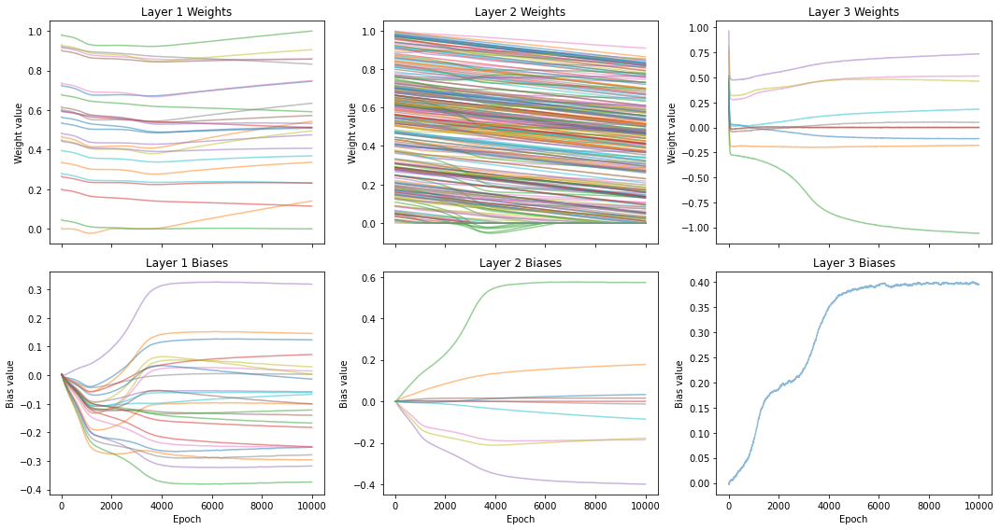

Testuję: lr=0.001, l1=0.005, bs=32, activation=tanh


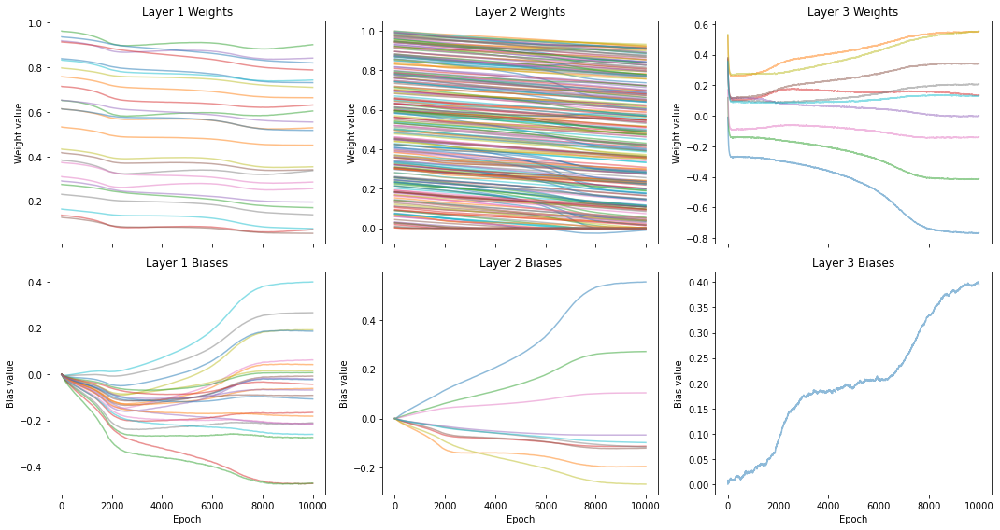

Testuję: lr=0.001, l1=0.005, bs=64, activation=tanh


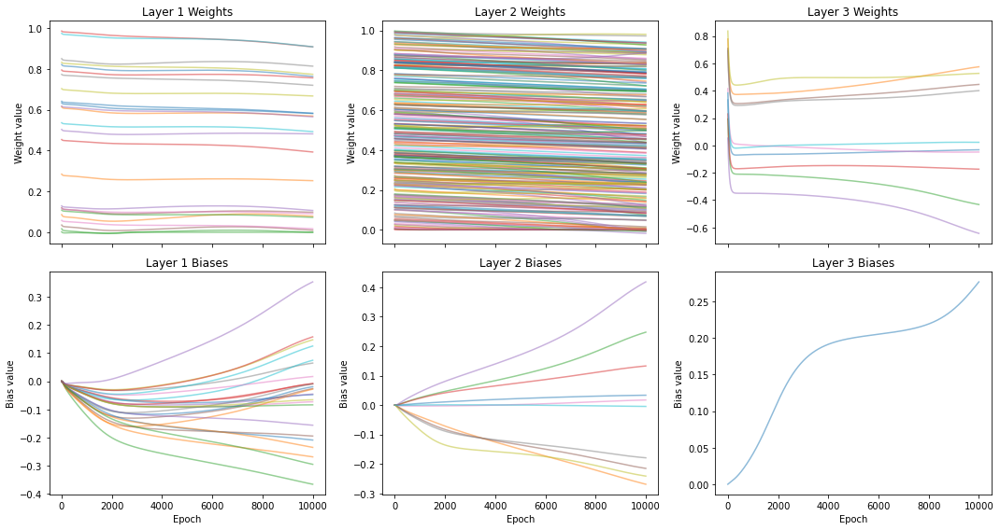

Testuję: lr=0.001, l1=0.01, bs=16, activation=tanh


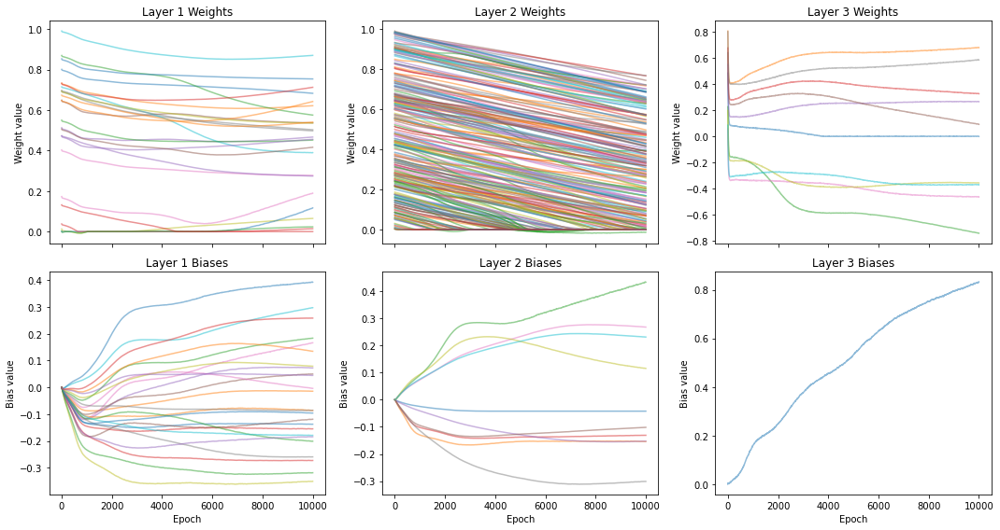

Testuję: lr=0.001, l1=0.01, bs=32, activation=tanh


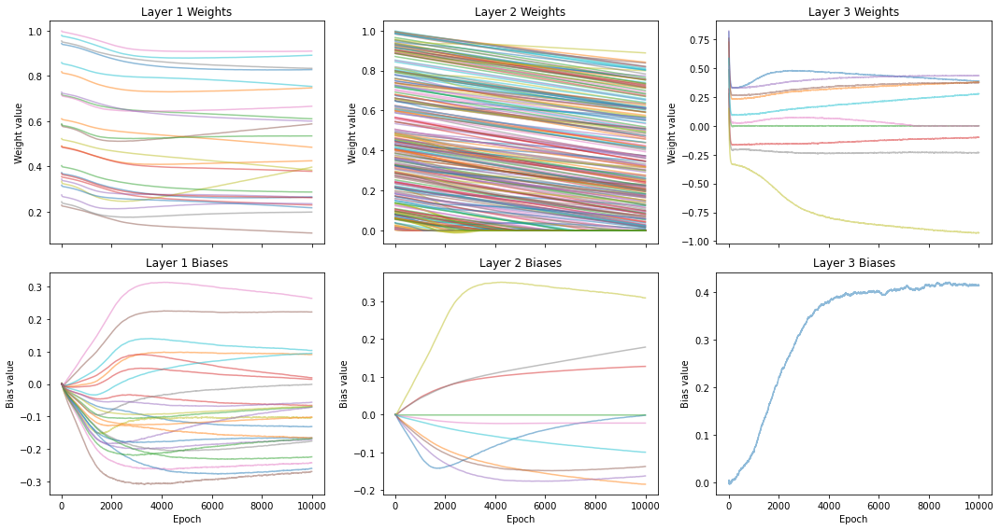

Testuję: lr=0.001, l1=0.01, bs=64, activation=tanh


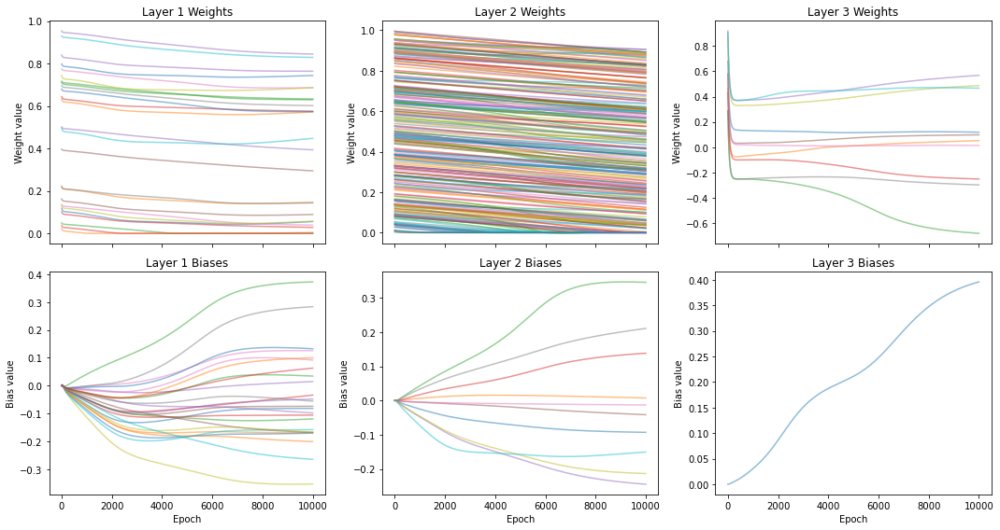

Testuję: lr=0.01, l1=0.0, bs=16, activation=tanh


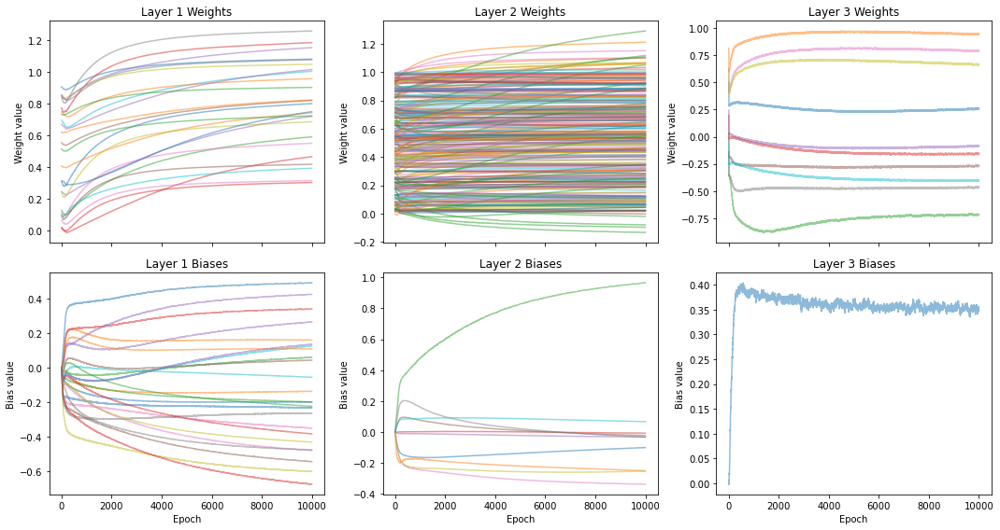

Testuję: lr=0.01, l1=0.0, bs=32, activation=tanh


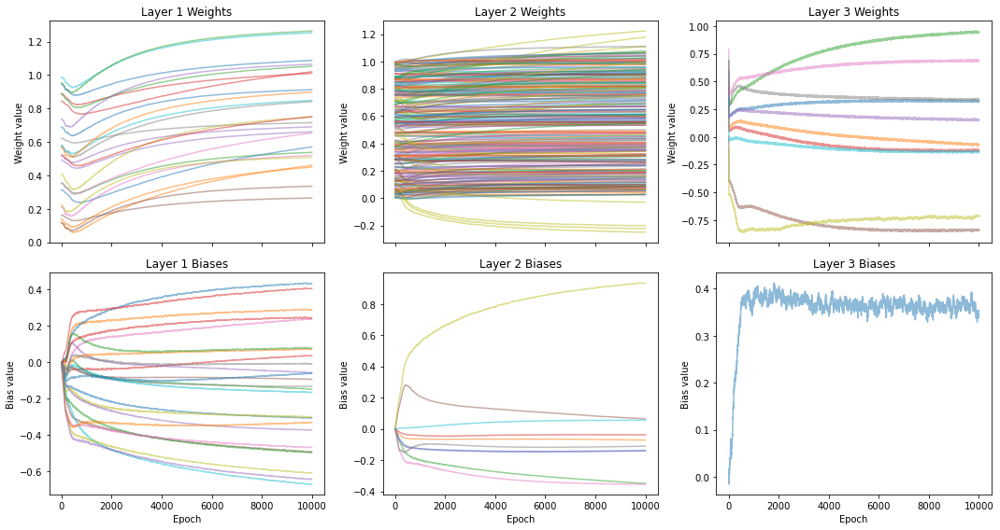

Testuję: lr=0.01, l1=0.0, bs=64, activation=tanh


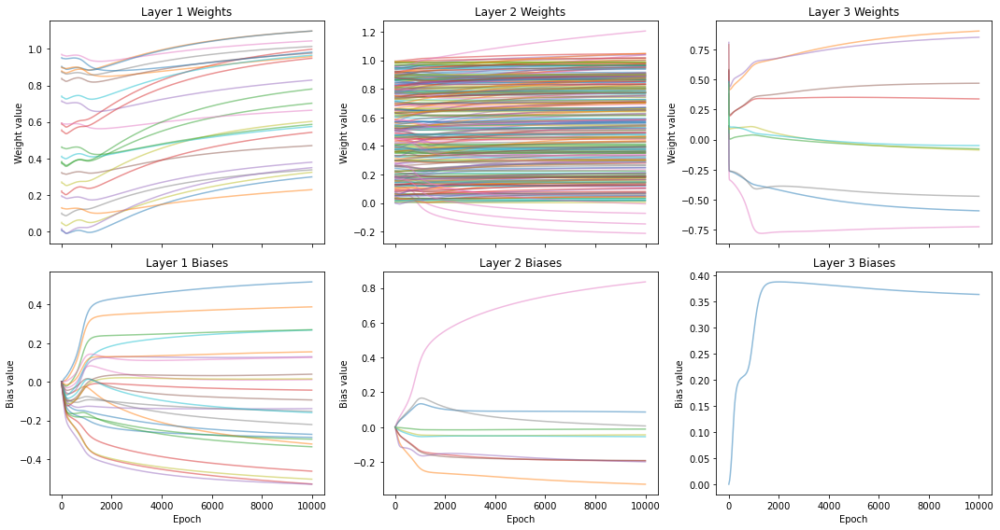

Testuję: lr=0.01, l1=0.001, bs=16, activation=tanh


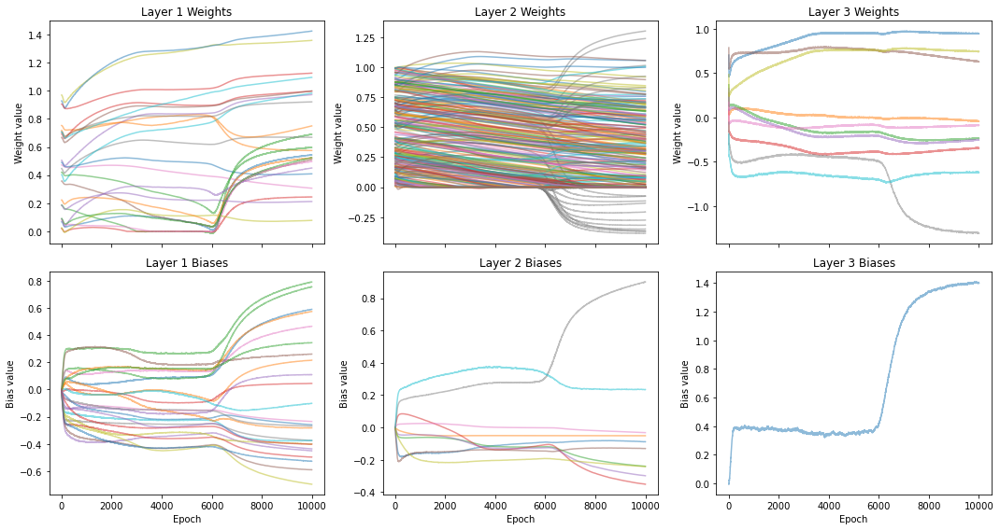

Testuję: lr=0.01, l1=0.001, bs=32, activation=tanh


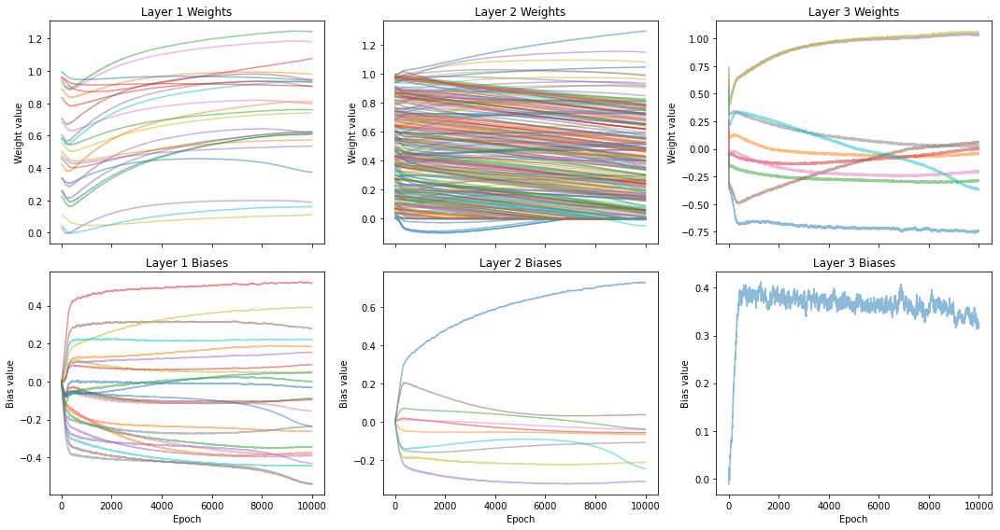

Testuję: lr=0.01, l1=0.001, bs=64, activation=tanh


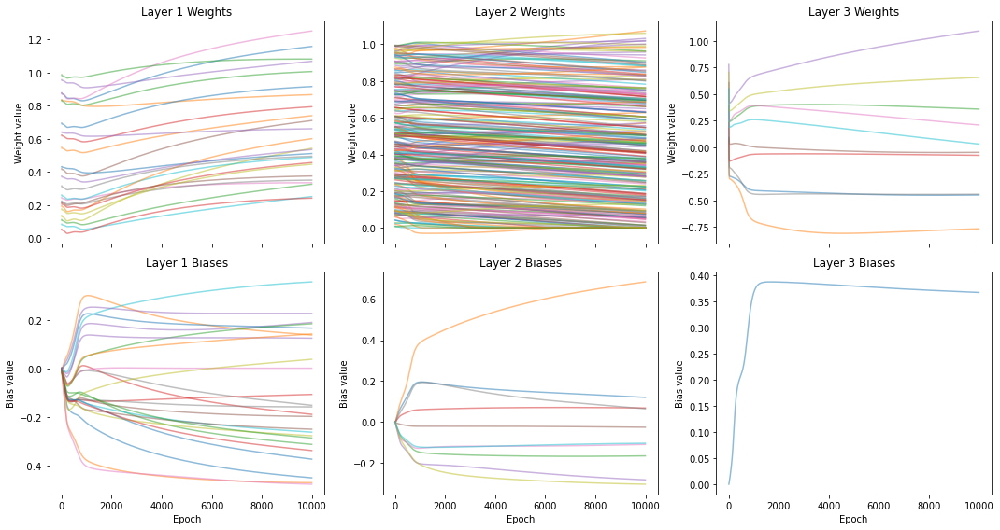

Testuję: lr=0.01, l1=0.005, bs=16, activation=tanh


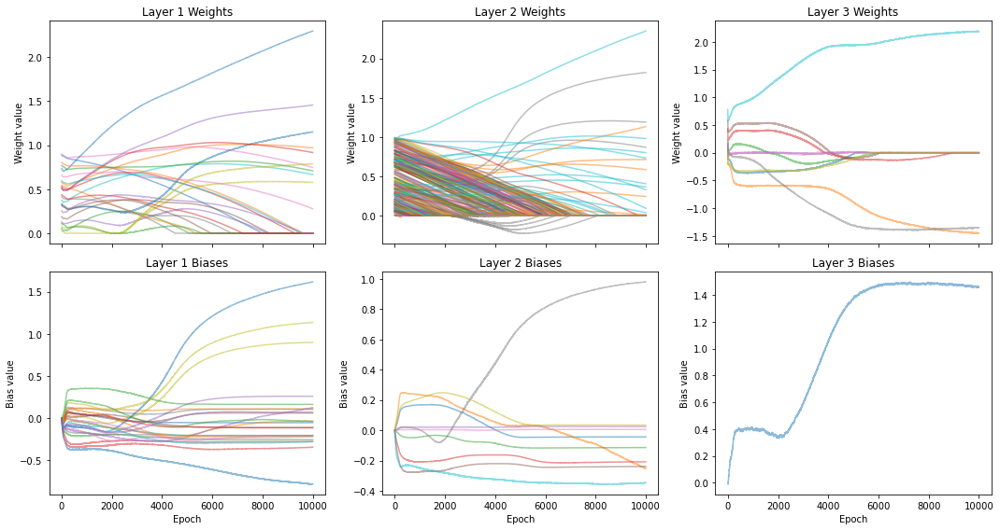

Testuję: lr=0.01, l1=0.005, bs=32, activation=tanh


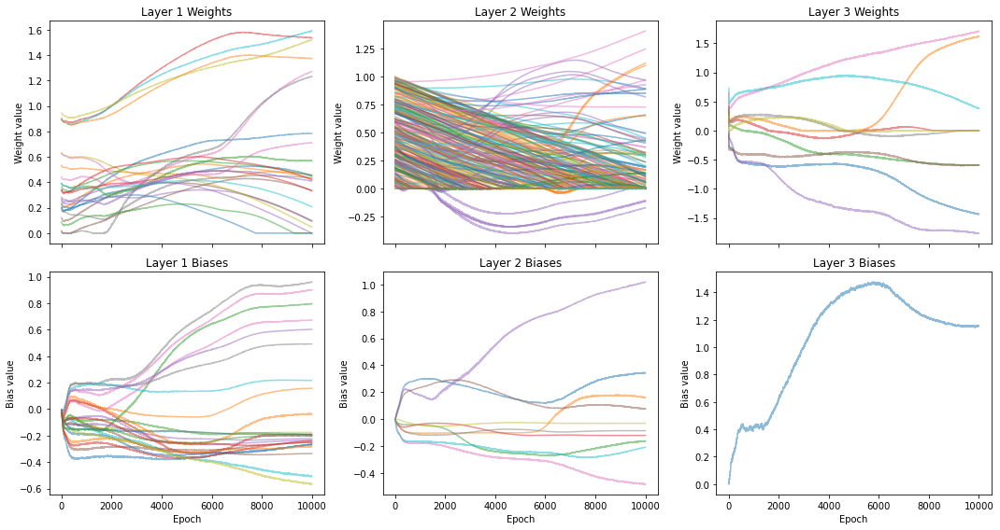

Testuję: lr=0.01, l1=0.005, bs=64, activation=tanh


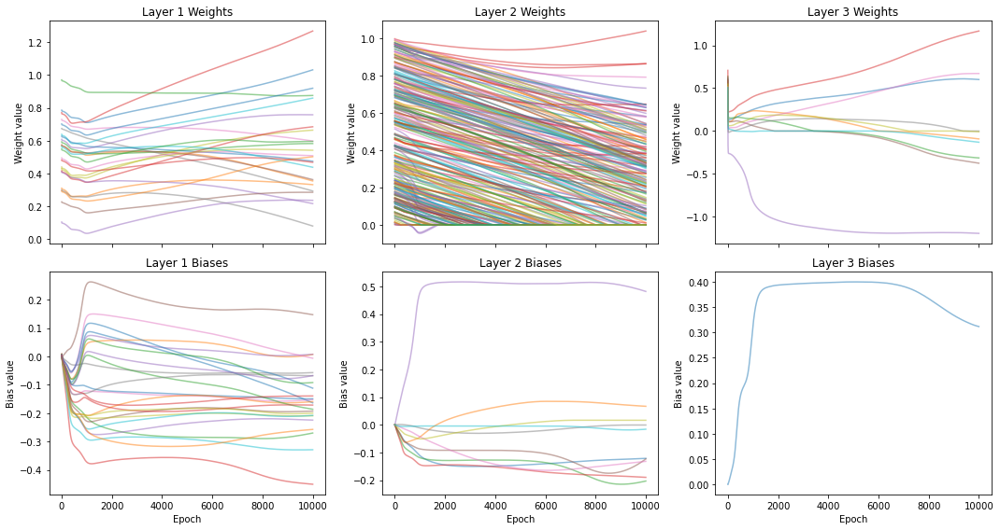

Testuję: lr=0.01, l1=0.01, bs=16, activation=tanh


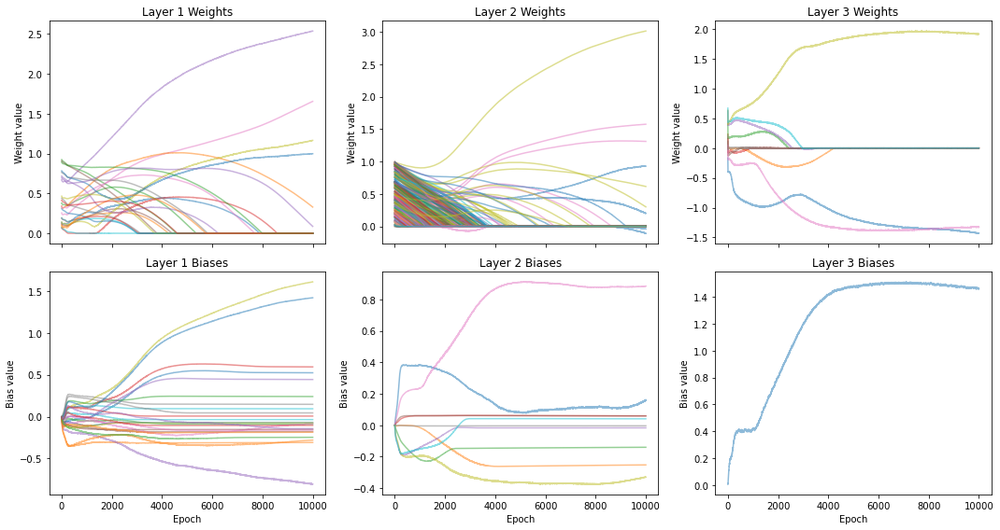

Testuję: lr=0.01, l1=0.01, bs=32, activation=tanh


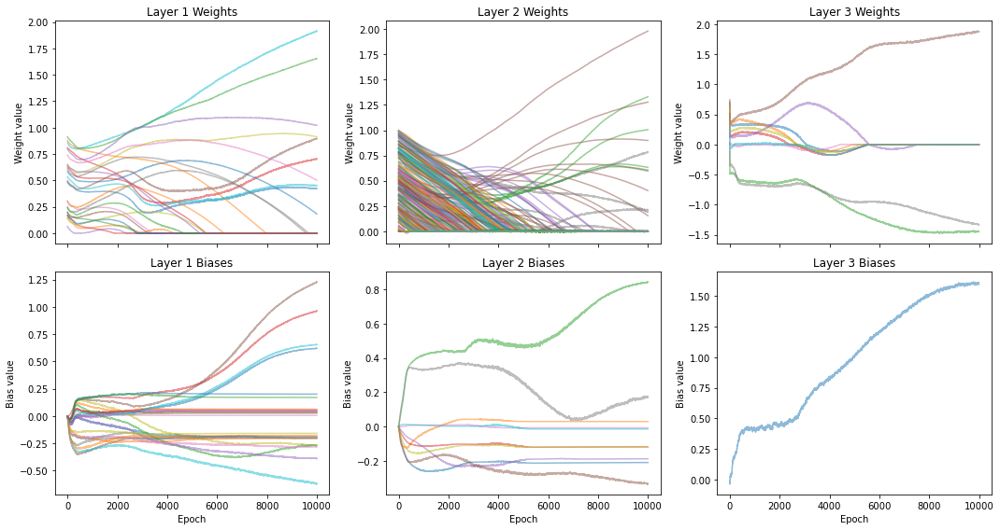

Testuję: lr=0.01, l1=0.01, bs=64, activation=tanh


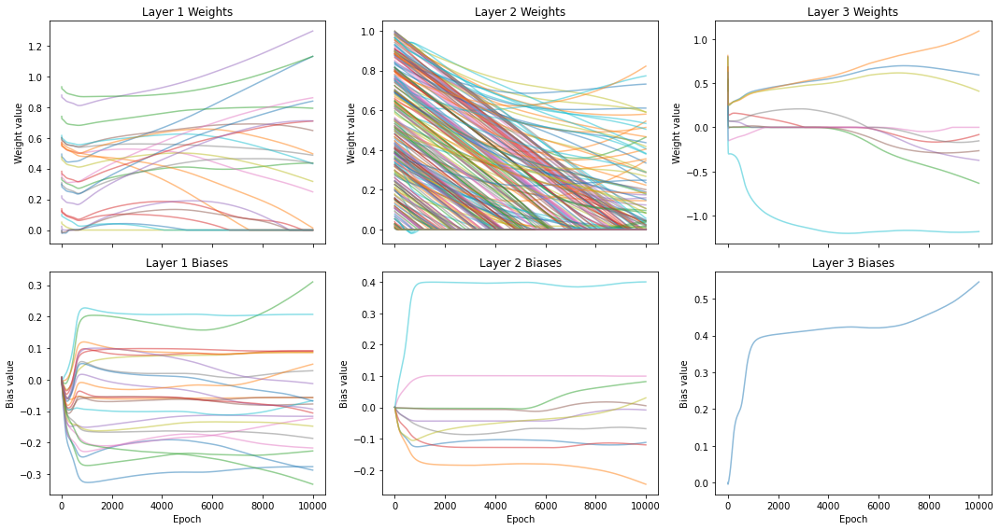

Najlepsze parametry:
{'learning_rate': 0.01, 'l1_lambda': 0.005, 'batch_size': 32, 'activation': 'tanh'}
Minimalne MSE: 707.675148


In [132]:
learning_rates = [0.0001, 0.001, 0.01]
l1_lambdas = [0.0, 0.001, 0.005, 0.01]
batch_sizes = [16, 32, 64]
activations = ['tanh']

best_mse = float('inf')
best_params = {}
results = []

for lr, l1, bs, act in product(learning_rates, l1_lambdas, batch_sizes, activations):
    print(f"Testuję: lr={lr}, l1={l1}, bs={bs}, activation={act}")

    model = MLPNoBackprop(
        layer_sizes=[1, 25, 10, 1],
        hidden_activation=act,
        l1_lambda=l1
    )
    model.mini_batch_GD(
        X_multimodalS_train_normalized,
        Y_multimodalS_train_normalized,
        batch_size=bs,
        epochs=10000,  
        learning_rate=lr
    )

    Y_pred_norm = model.predict(X_multimodalS_test_normalized)
    Y_pred = Y_pred_norm * np.std(Y_multimodalS_train) + np.mean(Y_multimodalS_train)
    mse = model.mse(Y_pred, Y_multimodalS_test)

    results.append({
        'lr': lr,
        'l1_lambda': l1,
        'batch_size': bs,
        'activation': act,
        'mse': mse
    })

    if mse < best_mse:
        best_mse = mse
        best_params = {
            'learning_rate': lr,
            'l1_lambda': l1,
            'batch_size': bs,
            'activation': act
        }

print("Najlepsze parametry:")
print(best_params)
print(f"Minimalne MSE: {best_mse:.6f}")


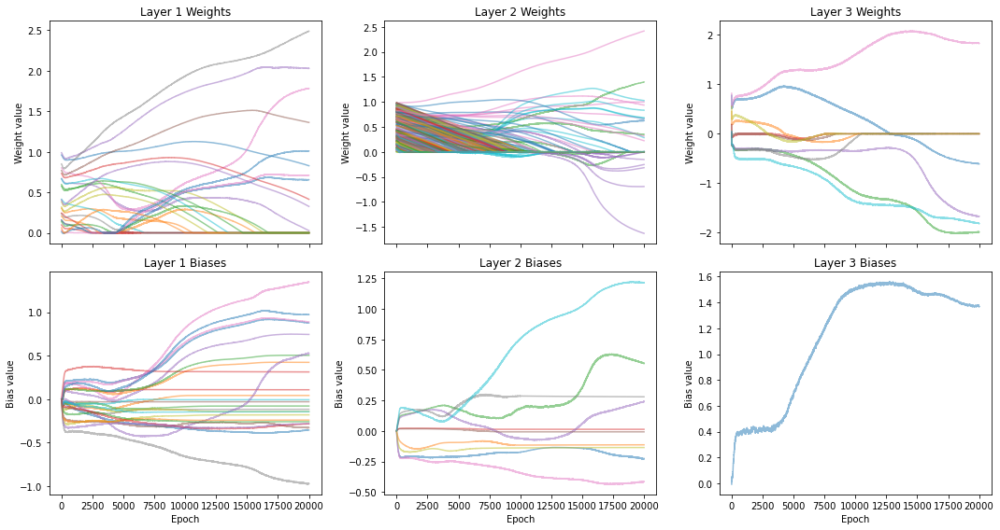

Czas wykonania: 22.753280 sekundy
mse:
606.9144367674995
--------------------------------------------------------------------------------


In [42]:
mlp_multimodal1 = MLPNoBackprop(layer_sizes = [1, 25, 10, 1], hidden_activation='tanh', l1_lambda=0.005)
start_time = time.time()
mlp_multimodal1.mini_batch_GD(X_multimodalS_train_normalized, Y_multimodalS_train_normalized, batch_size = 32, epochs=20000, learning_rate=0.01)
end_time = time.time()
execution_time = end_time - start_time
print(f"Czas wykonania: {execution_time:.6f} sekundy")
Ypred_normalized = mlp_multimodal1.predict(X_multimodalS_test_normalized)
Ypred = (Ypred_normalized * np.std(Y_multimodalS_train)) + np.mean(Y_multimodalS_train)
print('mse:')
print(mlp_multimodal1.mse(Ypred, Y_multimodalS_test))
print('--------------------------------------------------------------------------------')

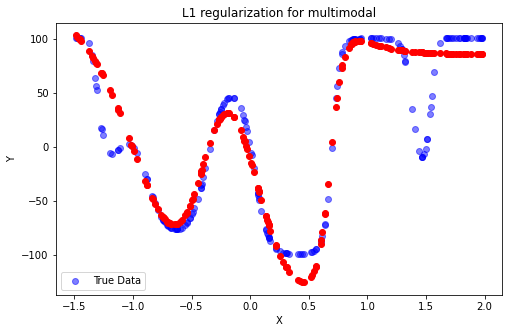

In [43]:
plt.figure(figsize=(8, 5))
plt.scatter(X_multimodalS_test, Y_multimodalS_test, label='True Data', color='blue', alpha=0.5)
plt.scatter(X_multimodalS_test, Ypred, color='red')
plt.legend()
plt.xlabel('X')
plt.ylabel('Y')
plt.title('L1 regularization for multimodal')
plt.show()

### L2 regularization 

Epoka 0: Loss = 15.659740002
Epoka 10: Loss = 2.301553971
Epoka 20: Loss = 2.268417445
Epoka 30: Loss = 2.247667108
Epoka 40: Loss = 2.160970261
Epoka 50: Loss = 2.174203785
Epoka 60: Loss = 2.066442626
Epoka 70: Loss = 2.126910955
Epoka 80: Loss = 2.084233537
Epoka 90: Loss = 2.015258392
Epoka 100: Loss = 1.967014200
Epoka 110: Loss = 1.896135219
Epoka 120: Loss = 1.890745329
Epoka 130: Loss = 1.873198798
Epoka 140: Loss = 1.865510703
Epoka 150: Loss = 1.833773076
Epoka 160: Loss = 1.838820310
Epoka 170: Loss = 1.822865986
Epoka 180: Loss = 1.829999126
Epoka 190: Loss = 1.825361039
Epoka 200: Loss = 1.811217083
Epoka 210: Loss = 1.793465049
Epoka 220: Loss = 1.788443779
Epoka 230: Loss = 1.776078368
Epoka 240: Loss = 1.761803304
Epoka 250: Loss = 1.761314042
Epoka 260: Loss = 1.765730608
Epoka 270: Loss = 1.760702358
Epoka 280: Loss = 1.769122488
Epoka 290: Loss = 1.751567490
Epoka 300: Loss = 1.732645597
Epoka 310: Loss = 1.734209532
Epoka 320: Loss = 1.722301537
Epoka 330: Loss = 1.

Epoka 3090: Loss = 1.209656236
Epoka 3100: Loss = 1.206870933
Epoka 3110: Loss = 1.206543964
Epoka 3120: Loss = 1.206005649
Epoka 3130: Loss = 1.203403274
Epoka 3140: Loss = 1.203523574
Epoka 3150: Loss = 1.205322811
Epoka 3160: Loss = 1.207987112
Epoka 3170: Loss = 1.199491992
Epoka 3180: Loss = 1.204367905
Epoka 3190: Loss = 1.199142433
Epoka 3200: Loss = 1.198234879
Epoka 3210: Loss = 1.200330134
Epoka 3220: Loss = 1.207489901
Epoka 3230: Loss = 1.202503690
Epoka 3240: Loss = 1.196691818
Epoka 3250: Loss = 1.196286754
Epoka 3260: Loss = 1.199810793
Epoka 3270: Loss = 1.203462159
Epoka 3280: Loss = 1.202594658
Epoka 3290: Loss = 1.199504093
Epoka 3300: Loss = 1.198680473
Epoka 3310: Loss = 1.207159847
Epoka 3320: Loss = 1.201894501
Epoka 3330: Loss = 1.197338953
Epoka 3340: Loss = 1.204950824
Epoka 3350: Loss = 1.203123466
Epoka 3360: Loss = 1.200641321
Epoka 3370: Loss = 1.195504611
Epoka 3380: Loss = 1.206329455
Epoka 3390: Loss = 1.196910226
Epoka 3400: Loss = 1.198788966
Epoka 34

Epoka 6050: Loss = 1.184013806
Epoka 6060: Loss = 1.172306541
Epoka 6070: Loss = 1.173237808
Epoka 6080: Loss = 1.175540684
Epoka 6090: Loss = 1.175298215
Epoka 6100: Loss = 1.173543273
Epoka 6110: Loss = 1.174575505
Epoka 6120: Loss = 1.173691992
Epoka 6130: Loss = 1.176521944
Epoka 6140: Loss = 1.179169673
Epoka 6150: Loss = 1.174262592
Epoka 6160: Loss = 1.185275221
Epoka 6170: Loss = 1.183192398
Epoka 6180: Loss = 1.186233204
Epoka 6190: Loss = 1.175334008
Epoka 6200: Loss = 1.177533823
Epoka 6210: Loss = 1.183843868
Epoka 6220: Loss = 1.186796770
Epoka 6230: Loss = 1.177352116
Epoka 6240: Loss = 1.179146515
Epoka 6250: Loss = 1.176059169
Epoka 6260: Loss = 1.173908330
Epoka 6270: Loss = 1.173704588
Epoka 6280: Loss = 1.178271050
Epoka 6290: Loss = 1.175718610
Epoka 6300: Loss = 1.181698981
Epoka 6310: Loss = 1.181653478
Epoka 6320: Loss = 1.174767283
Epoka 6330: Loss = 1.180021336
Epoka 6340: Loss = 1.182103731
Epoka 6350: Loss = 1.183704311
Epoka 6360: Loss = 1.179201495
Epoka 63

Epoka 9110: Loss = 1.193434156
Epoka 9120: Loss = 1.193248664
Epoka 9130: Loss = 1.192211453
Epoka 9140: Loss = 1.195249190
Epoka 9150: Loss = 1.200559276
Epoka 9160: Loss = 1.191914116
Epoka 9170: Loss = 1.191907583
Epoka 9180: Loss = 1.192408484
Epoka 9190: Loss = 1.193314402
Epoka 9200: Loss = 1.194235400
Epoka 9210: Loss = 1.194614175
Epoka 9220: Loss = 1.193601437
Epoka 9230: Loss = 1.192621900
Epoka 9240: Loss = 1.193040124
Epoka 9250: Loss = 1.196049718
Epoka 9260: Loss = 1.194352543
Epoka 9270: Loss = 1.192150586
Epoka 9280: Loss = 1.199035579
Epoka 9290: Loss = 1.204995147
Epoka 9300: Loss = 1.196358285
Epoka 9310: Loss = 1.195631332
Epoka 9320: Loss = 1.194585215
Epoka 9330: Loss = 1.196241843
Epoka 9340: Loss = 1.193083166
Epoka 9350: Loss = 1.193508333
Epoka 9360: Loss = 1.192858318
Epoka 9370: Loss = 1.192692526
Epoka 9380: Loss = 1.194793272
Epoka 9390: Loss = 1.196180063
Epoka 9400: Loss = 1.195017147
Epoka 9410: Loss = 1.194388092
Epoka 9420: Loss = 1.201009856
Epoka 94

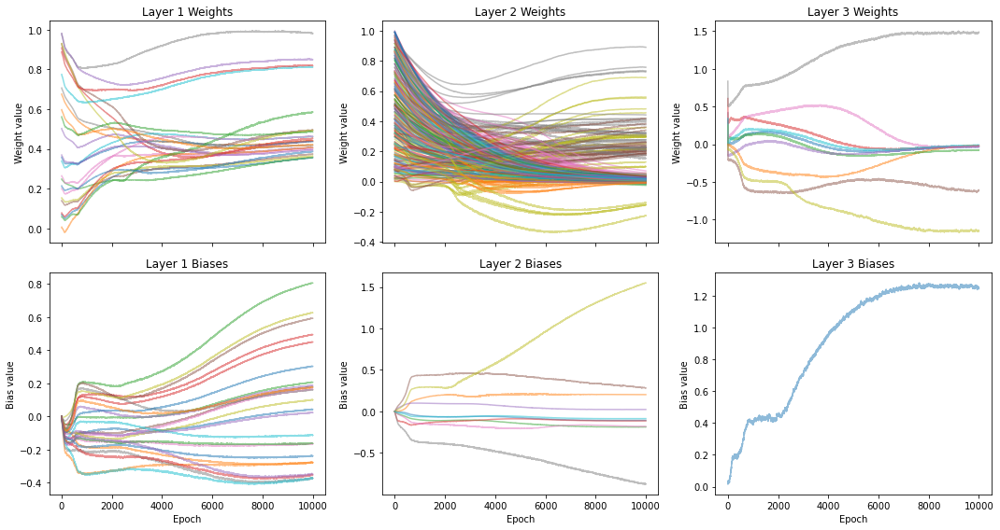

Czas wykonania: 4.818679 sekundy
mse:
1672.4398803811148
--------------------------------------------------------------------------------


In [138]:
mlp_multimodal2 = MLPNoBackprop(layer_sizes = [1, 25, 10, 1], hidden_activation='tanh', l2_lambda=0.01)
start_time = time.time()
mlp_multimodal2.mini_batch_GD(X_multimodalS_train_normalized, Y_multimodalS_train_normalized, batch_size = 32, epochs=10000, learning_rate=0.01)
end_time = time.time()
execution_time = end_time - start_time
print(f"Czas wykonania: {execution_time:.6f} sekundy")
Ypred_normalized = mlp_multimodal2.predict(X_multimodalS_test_normalized)
Ypred = (Ypred_normalized * np.std(Y_multimodalS_train)) + np.mean(Y_multimodalS_train)
print('mse:')
print(mlp_multimodal2.mse(Ypred, Y_multimodalS_test))
print('--------------------------------------------------------------------------------')

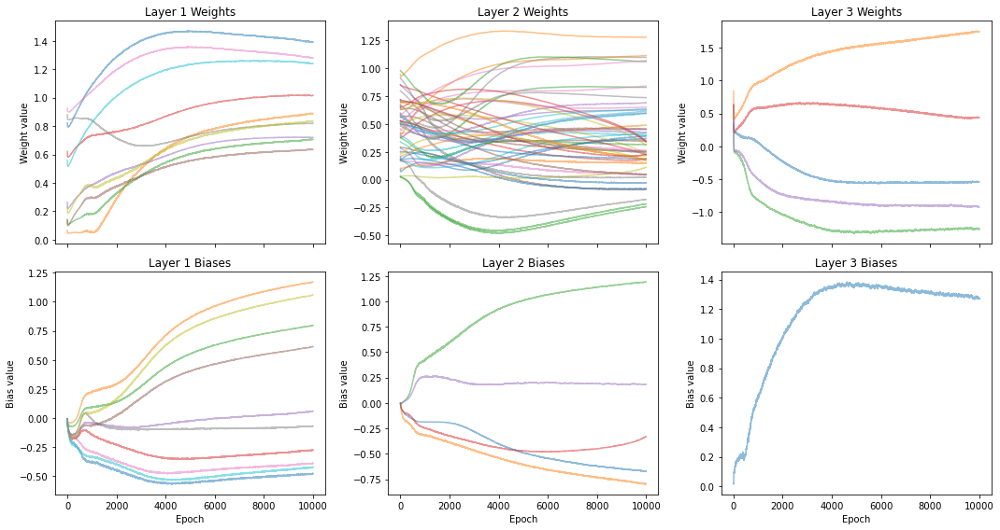

Czas wykonania: 2.968840 sekundy
mse:
1332.3602057086694
--------------------------------------------------------------------------------


In [145]:
mlp_multimodal2 = MLPNoBackprop(layer_sizes = [1, 10, 5, 1], hidden_activation='tanh', l2_lambda=0.005)
start_time = time.time()
mlp_multimodal2.mini_batch_GD(X_multimodalS_train_normalized, Y_multimodalS_train_normalized, batch_size = 32, epochs=10000, learning_rate=0.01)
end_time = time.time()
execution_time = end_time - start_time
print(f"Czas wykonania: {execution_time:.6f} sekundy")
Ypred_normalized = mlp_multimodal2.predict(X_multimodalS_test_normalized)
Ypred = (Ypred_normalized * np.std(Y_multimodalS_train)) + np.mean(Y_multimodalS_train)
print('mse:')
print(mlp_multimodal2.mse(Ypred, Y_multimodalS_test))
print('--------------------------------------------------------------------------------')

### early stopping

In [178]:
mlp_multimodal3 = MLPNoBackprop(layer_sizes = [1, 20, 5, 1], hidden_activation='tanh')

start_time = time.time()
mlp_multimodal3.mini_batch_earlystop_GD(
    X_multimodalS_train_normalized,
    Y_multimodalS_train_normalized,
    batch_size=20,
    epochs=20000,
    learning_rate=0.001,
    X_val=X_multimodalS_test_normalized,
    Y_val=Y_multimodalS_test_normalized,
    early_stopping=True,
    patience=200
)
end_time = time.time()
execution_time = end_time - start_time
print(f"Czas wykonania: {execution_time:.6f} sekundy")
Ypred_normalized = mlp_multimodal3.predict(X_multimodalS_test_normalized)
Ypred = (Ypred_normalized * np.std(Y_multimodalS_train)) + np.mean(Y_multimodalS_train)
print('mse:')
print(mlp_multimodal3.mse(Ypred, Y_multimodalS_test))
print('--------------------------------------------------------------------------------')

Epoka 0: Walidacja loss = 2.105772
Epoka 1: Walidacja loss = 2.055758
Epoka 2: Walidacja loss = 2.007531
Epoka 3: Walidacja loss = 1.960962
Epoka 4: Walidacja loss = 1.916055
Epoka 5: Walidacja loss = 1.872748
Epoka 6: Walidacja loss = 1.830991
Epoka 7: Walidacja loss = 1.790717
Epoka 8: Walidacja loss = 1.751900
Epoka 9: Walidacja loss = 1.714440
Epoka 10: Walidacja loss = 1.678325
Epoka 11: Walidacja loss = 1.643510
Epoka 12: Walidacja loss = 1.609869
Epoka 13: Walidacja loss = 1.577477
Epoka 14: Walidacja loss = 1.546208
Epoka 15: Walidacja loss = 1.516058
Epoka 16: Walidacja loss = 1.486959
Epoka 17: Walidacja loss = 1.458890
Epoka 18: Walidacja loss = 1.431813
Epoka 19: Walidacja loss = 1.405738
Epoka 20: Walidacja loss = 1.380528
Epoka 21: Walidacja loss = 1.356227
Epoka 22: Walidacja loss = 1.332803
Epoka 23: Walidacja loss = 1.310215
Epoka 24: Walidacja loss = 1.288450
Epoka 25: Walidacja loss = 1.267431
Epoka 26: Walidacja loss = 1.247140
Epoka 27: Walidacja loss = 1.227574
Ep

Epoka 332: Walidacja loss = 0.646390
Epoka 333: Walidacja loss = 0.646234
Epoka 334: Walidacja loss = 0.646079
Epoka 335: Walidacja loss = 0.645924
Epoka 336: Walidacja loss = 0.645768
Epoka 337: Walidacja loss = 0.645613
Epoka 338: Walidacja loss = 0.645457
Epoka 339: Walidacja loss = 0.645302
Epoka 340: Walidacja loss = 0.645146
Epoka 341: Walidacja loss = 0.644991
Epoka 342: Walidacja loss = 0.644836
Epoka 343: Walidacja loss = 0.644681
Epoka 344: Walidacja loss = 0.644526
Epoka 345: Walidacja loss = 0.644370
Epoka 346: Walidacja loss = 0.644216
Epoka 347: Walidacja loss = 0.644061
Epoka 348: Walidacja loss = 0.643906
Epoka 349: Walidacja loss = 0.643751
Epoka 350: Walidacja loss = 0.643596
Epoka 351: Walidacja loss = 0.643442
Epoka 352: Walidacja loss = 0.643287
Epoka 353: Walidacja loss = 0.643132
Epoka 354: Walidacja loss = 0.642978
Epoka 355: Walidacja loss = 0.642824
Epoka 356: Walidacja loss = 0.642669
Epoka 357: Walidacja loss = 0.642515
Epoka 358: Walidacja loss = 0.642360
E

Epoka 689: Walidacja loss = 0.588630
Epoka 690: Walidacja loss = 0.588448
Epoka 691: Walidacja loss = 0.588265
Epoka 692: Walidacja loss = 0.588082
Epoka 693: Walidacja loss = 0.587899
Epoka 694: Walidacja loss = 0.587716
Epoka 695: Walidacja loss = 0.587533
Epoka 696: Walidacja loss = 0.587349
Epoka 697: Walidacja loss = 0.587165
Epoka 698: Walidacja loss = 0.586981
Epoka 699: Walidacja loss = 0.586797
Epoka 700: Walidacja loss = 0.586612
Epoka 701: Walidacja loss = 0.586428
Epoka 702: Walidacja loss = 0.586243
Epoka 703: Walidacja loss = 0.586058
Epoka 704: Walidacja loss = 0.585873
Epoka 705: Walidacja loss = 0.585687
Epoka 706: Walidacja loss = 0.585502
Epoka 707: Walidacja loss = 0.585316
Epoka 708: Walidacja loss = 0.585130
Epoka 709: Walidacja loss = 0.584944
Epoka 710: Walidacja loss = 0.584757
Epoka 711: Walidacja loss = 0.584571
Epoka 712: Walidacja loss = 0.584383
Epoka 713: Walidacja loss = 0.584197
Epoka 714: Walidacja loss = 0.584010
Epoka 715: Walidacja loss = 0.583822
E

Epoka 1040: Walidacja loss = 0.511582
Epoka 1041: Walidacja loss = 0.511339
Epoka 1042: Walidacja loss = 0.511096
Epoka 1043: Walidacja loss = 0.510854
Epoka 1044: Walidacja loss = 0.510612
Epoka 1045: Walidacja loss = 0.510371
Epoka 1046: Walidacja loss = 0.510129
Epoka 1047: Walidacja loss = 0.509887
Epoka 1048: Walidacja loss = 0.509646
Epoka 1049: Walidacja loss = 0.509404
Epoka 1050: Walidacja loss = 0.509163
Epoka 1051: Walidacja loss = 0.508922
Epoka 1052: Walidacja loss = 0.508681
Epoka 1053: Walidacja loss = 0.508440
Epoka 1054: Walidacja loss = 0.508199
Epoka 1055: Walidacja loss = 0.507958
Epoka 1056: Walidacja loss = 0.507717
Epoka 1057: Walidacja loss = 0.507476
Epoka 1058: Walidacja loss = 0.507236
Epoka 1059: Walidacja loss = 0.506996
Epoka 1060: Walidacja loss = 0.506756
Epoka 1061: Walidacja loss = 0.506517
Epoka 1062: Walidacja loss = 0.506278
Epoka 1063: Walidacja loss = 0.506038
Epoka 1064: Walidacja loss = 0.505800
Epoka 1065: Walidacja loss = 0.505560
Epoka 1066: 

Epoka 1393: Walidacja loss = 0.454357
Epoka 1394: Walidacja loss = 0.454294
Epoka 1395: Walidacja loss = 0.454232
Epoka 1396: Walidacja loss = 0.454170
Epoka 1397: Walidacja loss = 0.454109
Epoka 1398: Walidacja loss = 0.454048
Epoka 1399: Walidacja loss = 0.453987
Epoka 1400: Walidacja loss = 0.453927
Epoka 1401: Walidacja loss = 0.453867
Epoka 1402: Walidacja loss = 0.453808
Epoka 1403: Walidacja loss = 0.453749
Epoka 1404: Walidacja loss = 0.453690
Epoka 1405: Walidacja loss = 0.453632
Epoka 1406: Walidacja loss = 0.453574
Epoka 1407: Walidacja loss = 0.453517
Epoka 1408: Walidacja loss = 0.453461
Epoka 1409: Walidacja loss = 0.453404
Epoka 1410: Walidacja loss = 0.453347
Epoka 1411: Walidacja loss = 0.453292
Epoka 1412: Walidacja loss = 0.453237
Epoka 1413: Walidacja loss = 0.453182
Epoka 1414: Walidacja loss = 0.453127
Epoka 1415: Walidacja loss = 0.453073
Epoka 1416: Walidacja loss = 0.453019
Epoka 1417: Walidacja loss = 0.452965
Epoka 1418: Walidacja loss = 0.452911
Epoka 1419: 

Epoka 1745: Walidacja loss = 0.445393
Epoka 1746: Walidacja loss = 0.445382
Epoka 1747: Walidacja loss = 0.445370
Epoka 1748: Walidacja loss = 0.445358
Epoka 1749: Walidacja loss = 0.445347
Epoka 1750: Walidacja loss = 0.445336
Epoka 1751: Walidacja loss = 0.445324
Epoka 1752: Walidacja loss = 0.445312
Epoka 1753: Walidacja loss = 0.445301
Epoka 1754: Walidacja loss = 0.445290
Epoka 1755: Walidacja loss = 0.445278
Epoka 1756: Walidacja loss = 0.445267
Epoka 1757: Walidacja loss = 0.445256
Epoka 1758: Walidacja loss = 0.445244
Epoka 1759: Walidacja loss = 0.445233
Epoka 1760: Walidacja loss = 0.445221
Epoka 1761: Walidacja loss = 0.445210
Epoka 1762: Walidacja loss = 0.445199
Epoka 1763: Walidacja loss = 0.445187
Epoka 1764: Walidacja loss = 0.445176
Epoka 1765: Walidacja loss = 0.445164
Epoka 1766: Walidacja loss = 0.445153
Epoka 1767: Walidacja loss = 0.445142
Epoka 1768: Walidacja loss = 0.445130
Epoka 1769: Walidacja loss = 0.445119
Epoka 1770: Walidacja loss = 0.445108
Epoka 1771: 

Epoka 2089: Walidacja loss = 0.440680
Epoka 2090: Walidacja loss = 0.440663
Epoka 2091: Walidacja loss = 0.440646
Epoka 2092: Walidacja loss = 0.440628
Epoka 2093: Walidacja loss = 0.440611
Epoka 2094: Walidacja loss = 0.440594
Epoka 2095: Walidacja loss = 0.440576
Epoka 2096: Walidacja loss = 0.440558
Epoka 2097: Walidacja loss = 0.440540
Epoka 2098: Walidacja loss = 0.440523
Epoka 2099: Walidacja loss = 0.440505
Epoka 2100: Walidacja loss = 0.440487
Epoka 2101: Walidacja loss = 0.440469
Epoka 2102: Walidacja loss = 0.440452
Epoka 2103: Walidacja loss = 0.440434
Epoka 2104: Walidacja loss = 0.440416
Epoka 2105: Walidacja loss = 0.440398
Epoka 2106: Walidacja loss = 0.440381
Epoka 2107: Walidacja loss = 0.440362
Epoka 2108: Walidacja loss = 0.440345
Epoka 2109: Walidacja loss = 0.440327
Epoka 2110: Walidacja loss = 0.440309
Epoka 2111: Walidacja loss = 0.440291
Epoka 2112: Walidacja loss = 0.440273
Epoka 2113: Walidacja loss = 0.440255
Epoka 2114: Walidacja loss = 0.440236
Epoka 2115: 

Epoka 2422: Walidacja loss = 0.433536
Epoka 2423: Walidacja loss = 0.433510
Epoka 2424: Walidacja loss = 0.433485
Epoka 2425: Walidacja loss = 0.433460
Epoka 2426: Walidacja loss = 0.433434
Epoka 2427: Walidacja loss = 0.433409
Epoka 2428: Walidacja loss = 0.433384
Epoka 2429: Walidacja loss = 0.433358
Epoka 2430: Walidacja loss = 0.433333
Epoka 2431: Walidacja loss = 0.433307
Epoka 2432: Walidacja loss = 0.433282
Epoka 2433: Walidacja loss = 0.433256
Epoka 2434: Walidacja loss = 0.433231
Epoka 2435: Walidacja loss = 0.433205
Epoka 2436: Walidacja loss = 0.433179
Epoka 2437: Walidacja loss = 0.433154
Epoka 2438: Walidacja loss = 0.433128
Epoka 2439: Walidacja loss = 0.433103
Epoka 2440: Walidacja loss = 0.433077
Epoka 2441: Walidacja loss = 0.433052
Epoka 2442: Walidacja loss = 0.433026
Epoka 2443: Walidacja loss = 0.433000
Epoka 2444: Walidacja loss = 0.432975
Epoka 2445: Walidacja loss = 0.432949
Epoka 2446: Walidacja loss = 0.432924
Epoka 2447: Walidacja loss = 0.432898
Epoka 2448: 

Epoka 2753: Walidacja loss = 0.424000
Epoka 2754: Walidacja loss = 0.423968
Epoka 2755: Walidacja loss = 0.423935
Epoka 2756: Walidacja loss = 0.423902
Epoka 2757: Walidacja loss = 0.423870
Epoka 2758: Walidacja loss = 0.423837
Epoka 2759: Walidacja loss = 0.423805
Epoka 2760: Walidacja loss = 0.423772
Epoka 2761: Walidacja loss = 0.423739
Epoka 2762: Walidacja loss = 0.423707
Epoka 2763: Walidacja loss = 0.423674
Epoka 2764: Walidacja loss = 0.423641
Epoka 2765: Walidacja loss = 0.423608
Epoka 2766: Walidacja loss = 0.423575
Epoka 2767: Walidacja loss = 0.423543
Epoka 2768: Walidacja loss = 0.423511
Epoka 2769: Walidacja loss = 0.423478
Epoka 2770: Walidacja loss = 0.423445
Epoka 2771: Walidacja loss = 0.423412
Epoka 2772: Walidacja loss = 0.423379
Epoka 2773: Walidacja loss = 0.423346
Epoka 2774: Walidacja loss = 0.423313
Epoka 2775: Walidacja loss = 0.423280
Epoka 2776: Walidacja loss = 0.423247
Epoka 2777: Walidacja loss = 0.423214
Epoka 2778: Walidacja loss = 0.423182
Epoka 2779: 

Epoka 3090: Walidacja loss = 0.411724
Epoka 3091: Walidacja loss = 0.411683
Epoka 3092: Walidacja loss = 0.411642
Epoka 3093: Walidacja loss = 0.411602
Epoka 3094: Walidacja loss = 0.411561
Epoka 3095: Walidacja loss = 0.411520
Epoka 3096: Walidacja loss = 0.411479
Epoka 3097: Walidacja loss = 0.411438
Epoka 3098: Walidacja loss = 0.411397
Epoka 3099: Walidacja loss = 0.411356
Epoka 3100: Walidacja loss = 0.411314
Epoka 3101: Walidacja loss = 0.411274
Epoka 3102: Walidacja loss = 0.411233
Epoka 3103: Walidacja loss = 0.411191
Epoka 3104: Walidacja loss = 0.411150
Epoka 3105: Walidacja loss = 0.411109
Epoka 3106: Walidacja loss = 0.411067
Epoka 3107: Walidacja loss = 0.411026
Epoka 3108: Walidacja loss = 0.410985
Epoka 3109: Walidacja loss = 0.410944
Epoka 3110: Walidacja loss = 0.410903
Epoka 3111: Walidacja loss = 0.410862
Epoka 3112: Walidacja loss = 0.410820
Epoka 3113: Walidacja loss = 0.410779
Epoka 3114: Walidacja loss = 0.410737
Epoka 3115: Walidacja loss = 0.410696
Epoka 3116: 

Epoka 3428: Walidacja loss = 0.396248
Epoka 3429: Walidacja loss = 0.396197
Epoka 3430: Walidacja loss = 0.396146
Epoka 3431: Walidacja loss = 0.396094
Epoka 3432: Walidacja loss = 0.396043
Epoka 3433: Walidacja loss = 0.395992
Epoka 3434: Walidacja loss = 0.395940
Epoka 3435: Walidacja loss = 0.395889
Epoka 3436: Walidacja loss = 0.395837
Epoka 3437: Walidacja loss = 0.395785
Epoka 3438: Walidacja loss = 0.395734
Epoka 3439: Walidacja loss = 0.395682
Epoka 3440: Walidacja loss = 0.395631
Epoka 3441: Walidacja loss = 0.395580
Epoka 3442: Walidacja loss = 0.395529
Epoka 3443: Walidacja loss = 0.395478
Epoka 3444: Walidacja loss = 0.395426
Epoka 3445: Walidacja loss = 0.395375
Epoka 3446: Walidacja loss = 0.395323
Epoka 3447: Walidacja loss = 0.395271
Epoka 3448: Walidacja loss = 0.395219
Epoka 3449: Walidacja loss = 0.395168
Epoka 3450: Walidacja loss = 0.395117
Epoka 3451: Walidacja loss = 0.395065
Epoka 3452: Walidacja loss = 0.395013
Epoka 3453: Walidacja loss = 0.394961
Epoka 3454: 

Epoka 3774: Walidacja loss = 0.376843
Epoka 3775: Walidacja loss = 0.376783
Epoka 3776: Walidacja loss = 0.376724
Epoka 3777: Walidacja loss = 0.376664
Epoka 3778: Walidacja loss = 0.376604
Epoka 3779: Walidacja loss = 0.376544
Epoka 3780: Walidacja loss = 0.376484
Epoka 3781: Walidacja loss = 0.376424
Epoka 3782: Walidacja loss = 0.376364
Epoka 3783: Walidacja loss = 0.376305
Epoka 3784: Walidacja loss = 0.376245
Epoka 3785: Walidacja loss = 0.376185
Epoka 3786: Walidacja loss = 0.376125
Epoka 3787: Walidacja loss = 0.376065
Epoka 3788: Walidacja loss = 0.376005
Epoka 3789: Walidacja loss = 0.375945
Epoka 3790: Walidacja loss = 0.375884
Epoka 3791: Walidacja loss = 0.375824
Epoka 3792: Walidacja loss = 0.375764
Epoka 3793: Walidacja loss = 0.375704
Epoka 3794: Walidacja loss = 0.375644
Epoka 3795: Walidacja loss = 0.375584
Epoka 3796: Walidacja loss = 0.375524
Epoka 3797: Walidacja loss = 0.375464
Epoka 3798: Walidacja loss = 0.375404
Epoka 3799: Walidacja loss = 0.375343
Epoka 3800: 

Epoka 4122: Walidacja loss = 0.356546
Epoka 4123: Walidacja loss = 0.356493
Epoka 4124: Walidacja loss = 0.356441
Epoka 4125: Walidacja loss = 0.356388
Epoka 4126: Walidacja loss = 0.356336
Epoka 4127: Walidacja loss = 0.356283
Epoka 4128: Walidacja loss = 0.356231
Epoka 4129: Walidacja loss = 0.356178
Epoka 4130: Walidacja loss = 0.356126
Epoka 4131: Walidacja loss = 0.356075
Epoka 4132: Walidacja loss = 0.356023
Epoka 4133: Walidacja loss = 0.355971
Epoka 4134: Walidacja loss = 0.355919
Epoka 4135: Walidacja loss = 0.355867
Epoka 4136: Walidacja loss = 0.355815
Epoka 4137: Walidacja loss = 0.355763
Epoka 4138: Walidacja loss = 0.355711
Epoka 4139: Walidacja loss = 0.355660
Epoka 4140: Walidacja loss = 0.355608
Epoka 4141: Walidacja loss = 0.355557
Epoka 4142: Walidacja loss = 0.355505
Epoka 4143: Walidacja loss = 0.355454
Epoka 4144: Walidacja loss = 0.355403
Epoka 4145: Walidacja loss = 0.355352
Epoka 4146: Walidacja loss = 0.355300
Epoka 4147: Walidacja loss = 0.355249
Epoka 4148: 

Epoka 4446: Walidacja loss = 0.343617
Epoka 4447: Walidacja loss = 0.343592
Epoka 4448: Walidacja loss = 0.343567
Epoka 4449: Walidacja loss = 0.343542
Epoka 4450: Walidacja loss = 0.343517
Epoka 4451: Walidacja loss = 0.343492
Epoka 4452: Walidacja loss = 0.343468
Epoka 4453: Walidacja loss = 0.343444
Epoka 4454: Walidacja loss = 0.343419
Epoka 4455: Walidacja loss = 0.343395
Epoka 4456: Walidacja loss = 0.343370
Epoka 4457: Walidacja loss = 0.343346
Epoka 4458: Walidacja loss = 0.343322
Epoka 4459: Walidacja loss = 0.343298
Epoka 4460: Walidacja loss = 0.343274
Epoka 4461: Walidacja loss = 0.343251
Epoka 4462: Walidacja loss = 0.343227
Epoka 4463: Walidacja loss = 0.343204
Epoka 4464: Walidacja loss = 0.343180
Epoka 4465: Walidacja loss = 0.343157
Epoka 4466: Walidacja loss = 0.343134
Epoka 4467: Walidacja loss = 0.343111
Epoka 4468: Walidacja loss = 0.343088
Epoka 4469: Walidacja loss = 0.343065
Epoka 4470: Walidacja loss = 0.343042
Epoka 4471: Walidacja loss = 0.343019
Epoka 4472: 

Epoka 4766: Walidacja loss = 0.340065
Epoka 4767: Walidacja loss = 0.340065
Epoka 4768: Walidacja loss = 0.340066
Epoka 4769: Walidacja loss = 0.340066
Epoka 4770: Walidacja loss = 0.340067
Epoka 4771: Walidacja loss = 0.340068
Epoka 4772: Walidacja loss = 0.340069
Epoka 4773: Walidacja loss = 0.340070
Epoka 4774: Walidacja loss = 0.340070
Epoka 4775: Walidacja loss = 0.340071
Epoka 4776: Walidacja loss = 0.340073
Epoka 4777: Walidacja loss = 0.340074
Epoka 4778: Walidacja loss = 0.340075
Epoka 4779: Walidacja loss = 0.340077
Epoka 4780: Walidacja loss = 0.340078
Epoka 4781: Walidacja loss = 0.340080
Epoka 4782: Walidacja loss = 0.340081
Epoka 4783: Walidacja loss = 0.340083
Epoka 4784: Walidacja loss = 0.340085
Epoka 4785: Walidacja loss = 0.340086
Epoka 4786: Walidacja loss = 0.340087
Epoka 4787: Walidacja loss = 0.340089
Epoka 4788: Walidacja loss = 0.340091
Epoka 4789: Walidacja loss = 0.340093
Epoka 4790: Walidacja loss = 0.340094
Epoka 4791: Walidacja loss = 0.340096
Epoka 4792: 

In [201]:
mlp_multimodal3 = MLPNoBackprop(layer_sizes = [1, 15, 5, 1], hidden_activation='tanh')

start_time = time.time()
mlp_multimodal3.mini_batch_earlystop_GD(
    X_multimodalS_train_normalized,
    Y_multimodalS_train_normalized,
    batch_size=10,
    epochs=50000,
    learning_rate=0.0005,
    X_val=X_multimodalS_test_normalized,
    Y_val=Y_multimodalS_test_normalized,
    early_stopping=True,
    patience=200
)
end_time = time.time()
execution_time = end_time - start_time
print(f"Czas wykonania: {execution_time:.6f} sekundy")
Ypred_normalized = mlp_multimodal3.predict(X_multimodalS_test_normalized)
Ypred = (Ypred_normalized * np.std(Y_multimodalS_train)) + np.mean(Y_multimodalS_train)
print('mse:')
print(mlp_multimodal3.mse(Ypred, Y_multimodalS_test))
print('--------------------------------------------------------------------------------')

Epoka 0: Walidacja loss = 4.611510
Epoka 1: Walidacja loss = 4.477582
Epoka 2: Walidacja loss = 4.348215
Epoka 3: Walidacja loss = 4.223258
Epoka 4: Walidacja loss = 4.102510
Epoka 5: Walidacja loss = 3.985859
Epoka 6: Walidacja loss = 3.873190
Epoka 7: Walidacja loss = 3.764354
Epoka 8: Walidacja loss = 3.659274
Epoka 9: Walidacja loss = 3.557646
Epoka 10: Walidacja loss = 3.459460
Epoka 11: Walidacja loss = 3.364634
Epoka 12: Walidacja loss = 3.273071
Epoka 13: Walidacja loss = 3.184591
Epoka 14: Walidacja loss = 3.099140
Epoka 15: Walidacja loss = 3.016558
Epoka 16: Walidacja loss = 2.936770
Epoka 17: Walidacja loss = 2.859776
Epoka 18: Walidacja loss = 2.785358
Epoka 19: Walidacja loss = 2.713455
Epoka 20: Walidacja loss = 2.643936
Epoka 21: Walidacja loss = 2.576869
Epoka 22: Walidacja loss = 2.512017
Epoka 23: Walidacja loss = 2.449414
Epoka 24: Walidacja loss = 2.388923
Epoka 25: Walidacja loss = 2.330492
Epoka 26: Walidacja loss = 2.273987
Epoka 27: Walidacja loss = 2.219458
Ep

Epoka 272: Walidacja loss = 0.628164
Epoka 273: Walidacja loss = 0.627927
Epoka 274: Walidacja loss = 0.627692
Epoka 275: Walidacja loss = 0.627457
Epoka 276: Walidacja loss = 0.627223
Epoka 277: Walidacja loss = 0.626988
Epoka 278: Walidacja loss = 0.626754
Epoka 279: Walidacja loss = 0.626521
Epoka 280: Walidacja loss = 0.626287
Epoka 281: Walidacja loss = 0.626054
Epoka 282: Walidacja loss = 0.625822
Epoka 283: Walidacja loss = 0.625589
Epoka 284: Walidacja loss = 0.625357
Epoka 285: Walidacja loss = 0.625125
Epoka 286: Walidacja loss = 0.624893
Epoka 287: Walidacja loss = 0.624662
Epoka 288: Walidacja loss = 0.624432
Epoka 289: Walidacja loss = 0.624202
Epoka 290: Walidacja loss = 0.623971
Epoka 291: Walidacja loss = 0.623741
Epoka 292: Walidacja loss = 0.623511
Epoka 293: Walidacja loss = 0.623282
Epoka 294: Walidacja loss = 0.623053
Epoka 295: Walidacja loss = 0.622824
Epoka 296: Walidacja loss = 0.622595
Epoka 297: Walidacja loss = 0.622367
Epoka 298: Walidacja loss = 0.622138
E

Epoka 562: Walidacja loss = 0.563203
Epoka 563: Walidacja loss = 0.562980
Epoka 564: Walidacja loss = 0.562758
Epoka 565: Walidacja loss = 0.562535
Epoka 566: Walidacja loss = 0.562313
Epoka 567: Walidacja loss = 0.562091
Epoka 568: Walidacja loss = 0.561869
Epoka 569: Walidacja loss = 0.561646
Epoka 570: Walidacja loss = 0.561424
Epoka 571: Walidacja loss = 0.561201
Epoka 572: Walidacja loss = 0.560979
Epoka 573: Walidacja loss = 0.560757
Epoka 574: Walidacja loss = 0.560535
Epoka 575: Walidacja loss = 0.560313
Epoka 576: Walidacja loss = 0.560091
Epoka 577: Walidacja loss = 0.559869
Epoka 578: Walidacja loss = 0.559646
Epoka 579: Walidacja loss = 0.559425
Epoka 580: Walidacja loss = 0.559203
Epoka 581: Walidacja loss = 0.558981
Epoka 582: Walidacja loss = 0.558759
Epoka 583: Walidacja loss = 0.558537
Epoka 584: Walidacja loss = 0.558315
Epoka 585: Walidacja loss = 0.558093
Epoka 586: Walidacja loss = 0.557871
Epoka 587: Walidacja loss = 0.557650
Epoka 588: Walidacja loss = 0.557428
E

Epoka 854: Walidacja loss = 0.503074
Epoka 855: Walidacja loss = 0.502901
Epoka 856: Walidacja loss = 0.502729
Epoka 857: Walidacja loss = 0.502557
Epoka 858: Walidacja loss = 0.502385
Epoka 859: Walidacja loss = 0.502213
Epoka 860: Walidacja loss = 0.502042
Epoka 861: Walidacja loss = 0.501870
Epoka 862: Walidacja loss = 0.501700
Epoka 863: Walidacja loss = 0.501529
Epoka 864: Walidacja loss = 0.501359
Epoka 865: Walidacja loss = 0.501189
Epoka 866: Walidacja loss = 0.501020
Epoka 867: Walidacja loss = 0.500852
Epoka 868: Walidacja loss = 0.500683
Epoka 869: Walidacja loss = 0.500515
Epoka 870: Walidacja loss = 0.500347
Epoka 871: Walidacja loss = 0.500179
Epoka 872: Walidacja loss = 0.500012
Epoka 873: Walidacja loss = 0.499845
Epoka 874: Walidacja loss = 0.499679
Epoka 875: Walidacja loss = 0.499513
Epoka 876: Walidacja loss = 0.499347
Epoka 877: Walidacja loss = 0.499181
Epoka 878: Walidacja loss = 0.499016
Epoka 879: Walidacja loss = 0.498852
Epoka 880: Walidacja loss = 0.498687
E

Epoka 1129: Walidacja loss = 0.469028
Epoka 1130: Walidacja loss = 0.468950
Epoka 1131: Walidacja loss = 0.468873
Epoka 1132: Walidacja loss = 0.468796
Epoka 1133: Walidacja loss = 0.468719
Epoka 1134: Walidacja loss = 0.468642
Epoka 1135: Walidacja loss = 0.468566
Epoka 1136: Walidacja loss = 0.468490
Epoka 1137: Walidacja loss = 0.468414
Epoka 1138: Walidacja loss = 0.468338
Epoka 1139: Walidacja loss = 0.468263
Epoka 1140: Walidacja loss = 0.468187
Epoka 1141: Walidacja loss = 0.468112
Epoka 1142: Walidacja loss = 0.468037
Epoka 1143: Walidacja loss = 0.467963
Epoka 1144: Walidacja loss = 0.467889
Epoka 1145: Walidacja loss = 0.467815
Epoka 1146: Walidacja loss = 0.467741
Epoka 1147: Walidacja loss = 0.467668
Epoka 1148: Walidacja loss = 0.467595
Epoka 1149: Walidacja loss = 0.467522
Epoka 1150: Walidacja loss = 0.467449
Epoka 1151: Walidacja loss = 0.467377
Epoka 1152: Walidacja loss = 0.467304
Epoka 1153: Walidacja loss = 0.467232
Epoka 1154: Walidacja loss = 0.467161
Epoka 1155: 

Epoka 1413: Walidacja loss = 0.454352
Epoka 1414: Walidacja loss = 0.454316
Epoka 1415: Walidacja loss = 0.454280
Epoka 1416: Walidacja loss = 0.454244
Epoka 1417: Walidacja loss = 0.454209
Epoka 1418: Walidacja loss = 0.454173
Epoka 1419: Walidacja loss = 0.454137
Epoka 1420: Walidacja loss = 0.454101
Epoka 1421: Walidacja loss = 0.454066
Epoka 1422: Walidacja loss = 0.454031
Epoka 1423: Walidacja loss = 0.453996
Epoka 1424: Walidacja loss = 0.453960
Epoka 1425: Walidacja loss = 0.453925
Epoka 1426: Walidacja loss = 0.453890
Epoka 1427: Walidacja loss = 0.453854
Epoka 1428: Walidacja loss = 0.453820
Epoka 1429: Walidacja loss = 0.453785
Epoka 1430: Walidacja loss = 0.453750
Epoka 1431: Walidacja loss = 0.453715
Epoka 1432: Walidacja loss = 0.453680
Epoka 1433: Walidacja loss = 0.453645
Epoka 1434: Walidacja loss = 0.453611
Epoka 1435: Walidacja loss = 0.453576
Epoka 1436: Walidacja loss = 0.453542
Epoka 1437: Walidacja loss = 0.453507
Epoka 1438: Walidacja loss = 0.453472
Epoka 1439: 

Epoka 1685: Walidacja loss = 0.445403
Epoka 1686: Walidacja loss = 0.445369
Epoka 1687: Walidacja loss = 0.445336
Epoka 1688: Walidacja loss = 0.445303
Epoka 1689: Walidacja loss = 0.445269
Epoka 1690: Walidacja loss = 0.445236
Epoka 1691: Walidacja loss = 0.445203
Epoka 1692: Walidacja loss = 0.445170
Epoka 1693: Walidacja loss = 0.445137
Epoka 1694: Walidacja loss = 0.445104
Epoka 1695: Walidacja loss = 0.445071
Epoka 1696: Walidacja loss = 0.445037
Epoka 1697: Walidacja loss = 0.445004
Epoka 1698: Walidacja loss = 0.444970
Epoka 1699: Walidacja loss = 0.444937
Epoka 1700: Walidacja loss = 0.444904
Epoka 1701: Walidacja loss = 0.444870
Epoka 1702: Walidacja loss = 0.444837
Epoka 1703: Walidacja loss = 0.444804
Epoka 1704: Walidacja loss = 0.444771
Epoka 1705: Walidacja loss = 0.444737
Epoka 1706: Walidacja loss = 0.444704
Epoka 1707: Walidacja loss = 0.444670
Epoka 1708: Walidacja loss = 0.444637
Epoka 1709: Walidacja loss = 0.444603
Epoka 1710: Walidacja loss = 0.444570
Epoka 1711: 

Epoka 1955: Walidacja loss = 0.435630
Epoka 1956: Walidacja loss = 0.435590
Epoka 1957: Walidacja loss = 0.435550
Epoka 1958: Walidacja loss = 0.435510
Epoka 1959: Walidacja loss = 0.435470
Epoka 1960: Walidacja loss = 0.435431
Epoka 1961: Walidacja loss = 0.435390
Epoka 1962: Walidacja loss = 0.435351
Epoka 1963: Walidacja loss = 0.435310
Epoka 1964: Walidacja loss = 0.435269
Epoka 1965: Walidacja loss = 0.435229
Epoka 1966: Walidacja loss = 0.435189
Epoka 1967: Walidacja loss = 0.435148
Epoka 1968: Walidacja loss = 0.435108
Epoka 1969: Walidacja loss = 0.435068
Epoka 1970: Walidacja loss = 0.435028
Epoka 1971: Walidacja loss = 0.434988
Epoka 1972: Walidacja loss = 0.434947
Epoka 1973: Walidacja loss = 0.434907
Epoka 1974: Walidacja loss = 0.434866
Epoka 1975: Walidacja loss = 0.434826
Epoka 1976: Walidacja loss = 0.434786
Epoka 1977: Walidacja loss = 0.434746
Epoka 1978: Walidacja loss = 0.434705
Epoka 1979: Walidacja loss = 0.434664
Epoka 1980: Walidacja loss = 0.434624
Epoka 1981: 

Epoka 2230: Walidacja loss = 0.423527
Epoka 2231: Walidacja loss = 0.423480
Epoka 2232: Walidacja loss = 0.423432
Epoka 2233: Walidacja loss = 0.423383
Epoka 2234: Walidacja loss = 0.423335
Epoka 2235: Walidacja loss = 0.423288
Epoka 2236: Walidacja loss = 0.423240
Epoka 2237: Walidacja loss = 0.423192
Epoka 2238: Walidacja loss = 0.423143
Epoka 2239: Walidacja loss = 0.423096
Epoka 2240: Walidacja loss = 0.423048
Epoka 2241: Walidacja loss = 0.423000
Epoka 2242: Walidacja loss = 0.422952
Epoka 2243: Walidacja loss = 0.422904
Epoka 2244: Walidacja loss = 0.422856
Epoka 2245: Walidacja loss = 0.422808
Epoka 2246: Walidacja loss = 0.422759
Epoka 2247: Walidacja loss = 0.422710
Epoka 2248: Walidacja loss = 0.422662
Epoka 2249: Walidacja loss = 0.422614
Epoka 2250: Walidacja loss = 0.422566
Epoka 2251: Walidacja loss = 0.422517
Epoka 2252: Walidacja loss = 0.422469
Epoka 2253: Walidacja loss = 0.422420
Epoka 2254: Walidacja loss = 0.422372
Epoka 2255: Walidacja loss = 0.422323
Epoka 2256: 

Epoka 2518: Walidacja loss = 0.408798
Epoka 2519: Walidacja loss = 0.408745
Epoka 2520: Walidacja loss = 0.408691
Epoka 2521: Walidacja loss = 0.408637
Epoka 2522: Walidacja loss = 0.408584
Epoka 2523: Walidacja loss = 0.408530
Epoka 2524: Walidacja loss = 0.408476
Epoka 2525: Walidacja loss = 0.408423
Epoka 2526: Walidacja loss = 0.408369
Epoka 2527: Walidacja loss = 0.408316
Epoka 2528: Walidacja loss = 0.408262
Epoka 2529: Walidacja loss = 0.408208
Epoka 2530: Walidacja loss = 0.408155
Epoka 2531: Walidacja loss = 0.408102
Epoka 2532: Walidacja loss = 0.408048
Epoka 2533: Walidacja loss = 0.407994
Epoka 2534: Walidacja loss = 0.407940
Epoka 2535: Walidacja loss = 0.407887
Epoka 2536: Walidacja loss = 0.407833
Epoka 2537: Walidacja loss = 0.407779
Epoka 2538: Walidacja loss = 0.407725
Epoka 2539: Walidacja loss = 0.407671
Epoka 2540: Walidacja loss = 0.407618
Epoka 2541: Walidacja loss = 0.407564
Epoka 2542: Walidacja loss = 0.407510
Epoka 2543: Walidacja loss = 0.407456
Epoka 2544: 

Epoka 2798: Walidacja loss = 0.393714
Epoka 2799: Walidacja loss = 0.393661
Epoka 2800: Walidacja loss = 0.393609
Epoka 2801: Walidacja loss = 0.393556
Epoka 2802: Walidacja loss = 0.393503
Epoka 2803: Walidacja loss = 0.393450
Epoka 2804: Walidacja loss = 0.393398
Epoka 2805: Walidacja loss = 0.393345
Epoka 2806: Walidacja loss = 0.393292
Epoka 2807: Walidacja loss = 0.393240
Epoka 2808: Walidacja loss = 0.393187
Epoka 2809: Walidacja loss = 0.393135
Epoka 2810: Walidacja loss = 0.393082
Epoka 2811: Walidacja loss = 0.393030
Epoka 2812: Walidacja loss = 0.392977
Epoka 2813: Walidacja loss = 0.392925
Epoka 2814: Walidacja loss = 0.392873
Epoka 2815: Walidacja loss = 0.392820
Epoka 2816: Walidacja loss = 0.392767
Epoka 2817: Walidacja loss = 0.392715
Epoka 2818: Walidacja loss = 0.392663
Epoka 2819: Walidacja loss = 0.392610
Epoka 2820: Walidacja loss = 0.392558
Epoka 2821: Walidacja loss = 0.392505
Epoka 2822: Walidacja loss = 0.392453
Epoka 2823: Walidacja loss = 0.392401
Epoka 2824: 

Epoka 3055: Walidacja loss = 0.381103
Epoka 3056: Walidacja loss = 0.381059
Epoka 3057: Walidacja loss = 0.381015
Epoka 3058: Walidacja loss = 0.380971
Epoka 3059: Walidacja loss = 0.380927
Epoka 3060: Walidacja loss = 0.380883
Epoka 3061: Walidacja loss = 0.380840
Epoka 3062: Walidacja loss = 0.380796
Epoka 3063: Walidacja loss = 0.380752
Epoka 3064: Walidacja loss = 0.380708
Epoka 3065: Walidacja loss = 0.380664
Epoka 3066: Walidacja loss = 0.380621
Epoka 3067: Walidacja loss = 0.380577
Epoka 3068: Walidacja loss = 0.380534
Epoka 3069: Walidacja loss = 0.380490
Epoka 3070: Walidacja loss = 0.380447
Epoka 3071: Walidacja loss = 0.380404
Epoka 3072: Walidacja loss = 0.380360
Epoka 3073: Walidacja loss = 0.380317
Epoka 3074: Walidacja loss = 0.380274
Epoka 3075: Walidacja loss = 0.380231
Epoka 3076: Walidacja loss = 0.380188
Epoka 3077: Walidacja loss = 0.380146
Epoka 3078: Walidacja loss = 0.380102
Epoka 3079: Walidacja loss = 0.380059
Epoka 3080: Walidacja loss = 0.380016
Epoka 3081: 

Epoka 3429: Walidacja loss = 0.368505
Epoka 3430: Walidacja loss = 0.368483
Epoka 3431: Walidacja loss = 0.368461
Epoka 3432: Walidacja loss = 0.368438
Epoka 3433: Walidacja loss = 0.368415
Epoka 3434: Walidacja loss = 0.368393
Epoka 3435: Walidacja loss = 0.368371
Epoka 3436: Walidacja loss = 0.368349
Epoka 3437: Walidacja loss = 0.368327
Epoka 3438: Walidacja loss = 0.368305
Epoka 3439: Walidacja loss = 0.368283
Epoka 3440: Walidacja loss = 0.368261
Epoka 3441: Walidacja loss = 0.368240
Epoka 3442: Walidacja loss = 0.368218
Epoka 3443: Walidacja loss = 0.368196
Epoka 3444: Walidacja loss = 0.368174
Epoka 3445: Walidacja loss = 0.368152
Epoka 3446: Walidacja loss = 0.368130
Epoka 3447: Walidacja loss = 0.368109
Epoka 3448: Walidacja loss = 0.368087
Epoka 3449: Walidacja loss = 0.368066
Epoka 3450: Walidacja loss = 0.368044
Epoka 3451: Walidacja loss = 0.368023
Epoka 3452: Walidacja loss = 0.368001
Epoka 3453: Walidacja loss = 0.367979
Epoka 3454: Walidacja loss = 0.367958
Epoka 3455: 

Epoka 3706: Walidacja loss = 0.364338
Epoka 3707: Walidacja loss = 0.364330
Epoka 3708: Walidacja loss = 0.364321
Epoka 3709: Walidacja loss = 0.364313
Epoka 3710: Walidacja loss = 0.364305
Epoka 3711: Walidacja loss = 0.364297
Epoka 3712: Walidacja loss = 0.364289
Epoka 3713: Walidacja loss = 0.364281
Epoka 3714: Walidacja loss = 0.364273
Epoka 3715: Walidacja loss = 0.364264
Epoka 3716: Walidacja loss = 0.364257
Epoka 3717: Walidacja loss = 0.364248
Epoka 3718: Walidacja loss = 0.364240
Epoka 3719: Walidacja loss = 0.364233
Epoka 3720: Walidacja loss = 0.364225
Epoka 3721: Walidacja loss = 0.364217
Epoka 3722: Walidacja loss = 0.364209
Epoka 3723: Walidacja loss = 0.364201
Epoka 3724: Walidacja loss = 0.364194
Epoka 3725: Walidacja loss = 0.364187
Epoka 3726: Walidacja loss = 0.364180
Epoka 3727: Walidacja loss = 0.364172
Epoka 3728: Walidacja loss = 0.364164
Epoka 3729: Walidacja loss = 0.364157
Epoka 3730: Walidacja loss = 0.364150
Epoka 3731: Walidacja loss = 0.364143
Epoka 3732: 

Epoka 3987: Walidacja loss = 0.363369
Epoka 3988: Walidacja loss = 0.363369
Epoka 3989: Walidacja loss = 0.363370
Epoka 3990: Walidacja loss = 0.363369
Epoka 3991: Walidacja loss = 0.363370
Epoka 3992: Walidacja loss = 0.363370
Epoka 3993: Walidacja loss = 0.363371
Epoka 3994: Walidacja loss = 0.363371
Epoka 3995: Walidacja loss = 0.363372
Epoka 3996: Walidacja loss = 0.363373
Epoka 3997: Walidacja loss = 0.363373
Epoka 3998: Walidacja loss = 0.363374
Epoka 3999: Walidacja loss = 0.363375
Epoka 4000: Walidacja loss = 0.363376
Epoka 4001: Walidacja loss = 0.363377
Epoka 4002: Walidacja loss = 0.363378
Epoka 4003: Walidacja loss = 0.363379
Epoka 4004: Walidacja loss = 0.363380
Epoka 4005: Walidacja loss = 0.363381
Epoka 4006: Walidacja loss = 0.363381
Epoka 4007: Walidacja loss = 0.363382
Epoka 4008: Walidacja loss = 0.363383
Epoka 4009: Walidacja loss = 0.363384
Epoka 4010: Walidacja loss = 0.363385
Epoka 4011: Walidacja loss = 0.363386
Epoka 4012: Walidacja loss = 0.363387
Epoka 4013: 

# Rings 5-sparse

In [202]:
df_rings5S_train = pd.read_csv('rings5-sparse-training.csv')
df_rings5S_test = pd.read_csv('rings5-sparse-test.csv')

In [203]:
df_rings5S_train.head()

,x,y,c
0,25.269660,-16.259998,0
1,-89.688540,86.489735,0
2,-89.935929,95.105807,0
3,-74.534468,98.085259,0
4,33.597949,-15.746616,0


In [204]:
X_rings5S_train = np.array(df_rings5S_train[['x', 'y']])
Y_rings5S_train = np.array(df_rings5S_train[['c']])
X_rings5S_test = np.array(df_rings5S_test[['x', 'y']])
Y_rings5S_test = np.array(df_rings5S_test[['c']])
X_rings5S_train_normalized = (X_rings5S_train - np.mean(X_rings5S_train))/np.std(X_rings5S_train)
X_rings5S_test_normalized = (X_rings5S_test - np.mean(X_rings5S_train))/np.std(X_rings5S_train)

In [246]:
mlp_rings5S = MLPNoBackprop(layer_sizes = [X_rings5S_train.shape[1], 10,  len(np.unique(Y_rings5S_train))], 
                           output_activation='softmax')
start_time = time.time()
mlp_rings5S.classification_earlystop_GD(X_rings5S_train_normalized, Y_rings5S_train, 
                              batch_size=64, epochs=140, 
                              learning_rate=0.001, 
                              X_val=X_rings5S_test_normalized, 
                              Y_val=Y_rings5S_test, 
                              early_stopping=True, patience=20)
end_time = time.time()
execution_time = end_time - start_time
print(f"Czas wykonania: {execution_time:.6f} sekundy")

Epoka 0: Walidacja loss = 1.592894
Epoka 1: Walidacja loss = 1.579450
Epoka 2: Walidacja loss = 1.568250
Epoka 3: Walidacja loss = 1.562063
Epoka 4: Walidacja loss = 1.562289
Epoka 5: Walidacja loss = 1.567392
Epoka 6: Walidacja loss = 1.574903
Epoka 7: Walidacja loss = 1.582664
Epoka 8: Walidacja loss = 1.589565
Epoka 9: Walidacja loss = 1.595142
Epoka 10: Walidacja loss = 1.599382
Epoka 11: Walidacja loss = 1.602461
Epoka 12: Walidacja loss = 1.604630
Epoka 13: Walidacja loss = 1.606128
Epoka 14: Walidacja loss = 1.607148
Epoka 15: Walidacja loss = 1.607836
Epoka 16: Walidacja loss = 1.608303
Epoka 17: Walidacja loss = 1.608617
Epoka 18: Walidacja loss = 1.608832
Epoka 19: Walidacja loss = 1.608980
Epoka 20: Walidacja loss = 1.609083
Epoka 21: Walidacja loss = 1.609157
Epoka 22: Walidacja loss = 1.609209
Epoka 23: Walidacja loss = 1.609248
Early stopping at epoch 23. Best validation loss: 1.562063
Czas wykonania: 0.091727 sekundy


In [247]:
ypred = mlp_rings5S.predict_classification(X_rings5S_test_normalized)
mlp_rings5S.f1_score(Y_rings5S_test, ypred)

0.10126960418222555

### L1 REG

Epoka 0: Loss = 0.114902708
Epoka 10: Loss = 0.273553885
Epoka 20: Loss = 0.316374074
Epoka 30: Loss = 0.314148503
Epoka 40: Loss = 0.331625884
Epoka 50: Loss = 0.354069731
Epoka 60: Loss = 0.334657945
Epoka 70: Loss = 0.368230159
Epoka 80: Loss = 0.353520216
Epoka 90: Loss = 0.368778794
Epoka 100: Loss = 0.379429463
Epoka 110: Loss = 0.372679744
Epoka 120: Loss = 0.393396585
Epoka 130: Loss = 0.394175424
Epoka 140: Loss = 0.405171498
Epoka 150: Loss = 0.401499382
Epoka 160: Loss = 0.398949000
Epoka 170: Loss = 0.414855468
Epoka 180: Loss = 0.410633771
Epoka 190: Loss = 0.475223936
Epoka 200: Loss = 0.441158347
Epoka 210: Loss = 0.457461173
Epoka 220: Loss = 0.537974125
Epoka 230: Loss = 0.527024585
Epoka 240: Loss = 0.558617326
Epoka 250: Loss = 0.686212152
Epoka 260: Loss = 0.582055431
Epoka 270: Loss = 0.675298890
Epoka 280: Loss = 0.743589316
Epoka 290: Loss = 0.704956455
Epoka 300: Loss = 0.769769937
Epoka 310: Loss = 0.765789391
Epoka 320: Loss = 0.787293958
Epoka 330: Loss = 0.7

Epoka 2830: Loss = 0.919493243
Epoka 2840: Loss = 0.919493243
Epoka 2850: Loss = 0.919493243
Epoka 2860: Loss = 0.919493243
Epoka 2870: Loss = 0.919493243
Epoka 2880: Loss = 0.919493243
Epoka 2890: Loss = 0.919493243
Epoka 2900: Loss = 0.919493243
Epoka 2910: Loss = 0.919493243
Epoka 2920: Loss = 0.919493243
Epoka 2930: Loss = 0.919493243
Epoka 2940: Loss = 0.919493243
Epoka 2950: Loss = 0.919493243
Epoka 2960: Loss = 0.919493243
Epoka 2970: Loss = 0.919493243
Epoka 2980: Loss = 0.919493243
Epoka 2990: Loss = 0.919493243
Epoka 3000: Loss = 0.919493243
Epoka 3010: Loss = 0.919493243
Epoka 3020: Loss = 0.919493243
Epoka 3030: Loss = 0.919493243
Epoka 3040: Loss = 0.919493243
Epoka 3050: Loss = 0.919493243
Epoka 3060: Loss = 0.919493243
Epoka 3070: Loss = 0.919493243
Epoka 3080: Loss = 0.919493243
Epoka 3090: Loss = 0.919493243
Epoka 3100: Loss = 0.919493243
Epoka 3110: Loss = 0.924765958
Epoka 3120: Loss = 0.919493243
Epoka 3130: Loss = 0.919493243
Epoka 3140: Loss = 0.924765958
Epoka 31

Epoka 5510: Loss = 0.939986107
Epoka 5520: Loss = 0.934986107
Epoka 5530: Loss = 0.944977331
Epoka 5540: Loss = 0.939986107
Epoka 5550: Loss = 0.934986107
Epoka 5560: Loss = 0.944977331
Epoka 5570: Loss = 0.944977331
Epoka 5580: Loss = 0.934986107
Epoka 5590: Loss = 0.934986107
Epoka 5600: Loss = 0.934986107
Epoka 5610: Loss = 0.934986107
Epoka 5620: Loss = 0.944977331
Epoka 5630: Loss = 0.944977331
Epoka 5640: Loss = 0.934986107
Epoka 5650: Loss = 0.934986107
Epoka 5660: Loss = 0.944977331
Epoka 5670: Loss = 0.944977331
Epoka 5680: Loss = 0.944977331
Epoka 5690: Loss = 0.934986107
Epoka 5700: Loss = 0.939986107
Epoka 5710: Loss = 0.944977331
Epoka 5720: Loss = 0.944977331
Epoka 5730: Loss = 0.939986107
Epoka 5740: Loss = 0.939986107
Epoka 5750: Loss = 0.940039060
Epoka 5760: Loss = 0.939986107
Epoka 5770: Loss = 0.934986107
Epoka 5780: Loss = 0.944977331
Epoka 5790: Loss = 0.944977331
Epoka 5800: Loss = 0.944977331
Epoka 5810: Loss = 0.939986107
Epoka 5820: Loss = 0.944977331
Epoka 58

Epoka 8380: Loss = 0.950049398
Epoka 8390: Loss = 0.955043808
Epoka 8400: Loss = 0.955043808
Epoka 8410: Loss = 0.955043808
Epoka 8420: Loss = 0.955043808
Epoka 8430: Loss = 0.945049398
Epoka 8440: Loss = 0.955043808
Epoka 8450: Loss = 0.945049398
Epoka 8460: Loss = 0.945049398
Epoka 8470: Loss = 0.955043808
Epoka 8480: Loss = 0.945049398
Epoka 8490: Loss = 0.945049398
Epoka 8500: Loss = 0.950049398
Epoka 8510: Loss = 0.950049398
Epoka 8520: Loss = 0.955043808
Epoka 8530: Loss = 0.955043808
Epoka 8540: Loss = 0.955043808
Epoka 8550: Loss = 0.955043808
Epoka 8560: Loss = 0.955043808
Epoka 8570: Loss = 0.945049398
Epoka 8580: Loss = 0.955043808
Epoka 8590: Loss = 0.945049398
Epoka 8600: Loss = 0.955043808
Epoka 8610: Loss = 0.955043808
Epoka 8620: Loss = 0.955043808
Epoka 8630: Loss = 0.955043808
Epoka 8640: Loss = 0.950049398
Epoka 8650: Loss = 0.955043808
Epoka 8660: Loss = 0.955043808
Epoka 8670: Loss = 0.955043808
Epoka 8680: Loss = 0.945049398
Epoka 8690: Loss = 0.955043808
Epoka 87

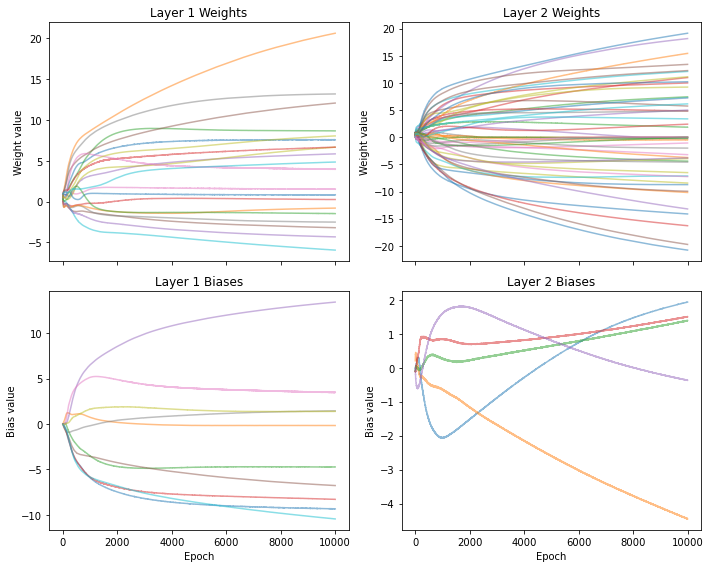

Czas wykonania: 7.340220 sekundy
f1:
0.8091174617937973
--------------------------------------------------------------------------------


In [254]:
mlp_rings3 = MLPNoBackprop(layer_sizes = [X_rings5S_train.shape[1], 10,  len(np.unique(Y_rings5S_train))], 
                           output_activation='softmax', l1_lambda=0.005)
start_time = time.time()
mlp_rings3.classifiaction_train(X_rings5S_train_normalized, Y_rings5S_train, batch_size = 32, epochs=10000, learning_rate=0.01)
end_time = time.time()
execution_time = end_time - start_time
print(f"Czas wykonania: {execution_time:.6f} sekundy")
Ypred = mlp_rings3.predict_classification(X_rings5S_test_normalized)
print('f1:')
print(mlp_rings3.f1_score(Ypred, Y_rings5S_test))
print('--------------------------------------------------------------------------------')

### L2 REG

Epoka 0: Loss = 0.127839688
Epoka 10: Loss = 0.226583363
Epoka 20: Loss = 0.325757017
Epoka 30: Loss = 0.304441655
Epoka 40: Loss = 0.349168811
Epoka 50: Loss = 0.347004915
Epoka 60: Loss = 0.355921322
Epoka 70: Loss = 0.373788515
Epoka 80: Loss = 0.385080160
Epoka 90: Loss = 0.420911184
Epoka 100: Loss = 0.427506372
Epoka 110: Loss = 0.401953347
Epoka 120: Loss = 0.456561857
Epoka 130: Loss = 0.425795444
Epoka 140: Loss = 0.431397459
Epoka 150: Loss = 0.452965283
Epoka 160: Loss = 0.461809303
Epoka 170: Loss = 0.515282888
Epoka 180: Loss = 0.520021581
Epoka 190: Loss = 0.461546474
Epoka 200: Loss = 0.522116402
Epoka 210: Loss = 0.517981145
Epoka 220: Loss = 0.536728649
Epoka 230: Loss = 0.525060344
Epoka 240: Loss = 0.562082073
Epoka 250: Loss = 0.566961680
Epoka 260: Loss = 0.580005744
Epoka 270: Loss = 0.562727648
Epoka 280: Loss = 0.552256286
Epoka 290: Loss = 0.598074256
Epoka 300: Loss = 0.632012133
Epoka 310: Loss = 0.620932706
Epoka 320: Loss = 0.616776633
Epoka 330: Loss = 0.6

Epoka 2680: Loss = 0.905044489
Epoka 2690: Loss = 0.905078223
Epoka 2700: Loss = 0.900029719
Epoka 2710: Loss = 0.894911852
Epoka 2720: Loss = 0.910022468
Epoka 2730: Loss = 0.909963318
Epoka 2740: Loss = 0.899960356
Epoka 2750: Loss = 0.905078223
Epoka 2760: Loss = 0.900038733
Epoka 2770: Loss = 0.899960356
Epoka 2780: Loss = 0.909963318
Epoka 2790: Loss = 0.910093774
Epoka 2800: Loss = 0.894911852
Epoka 2810: Loss = 0.894911852
Epoka 2820: Loss = 0.905078223
Epoka 2830: Loss = 0.899960356
Epoka 2840: Loss = 0.899960356
Epoka 2850: Loss = 0.905078223
Epoka 2860: Loss = 0.905078223
Epoka 2870: Loss = 0.899960356
Epoka 2880: Loss = 0.899960356
Epoka 2890: Loss = 0.905078223
Epoka 2900: Loss = 0.910093774
Epoka 2910: Loss = 0.899960356
Epoka 2920: Loss = 0.894911852
Epoka 2930: Loss = 0.899848561
Epoka 2940: Loss = 0.900029719
Epoka 2950: Loss = 0.899960356
Epoka 2960: Loss = 0.905078223
Epoka 2970: Loss = 0.899770943
Epoka 2980: Loss = 0.899960356
Epoka 2990: Loss = 0.904481298
Epoka 30

Epoka 5340: Loss = 0.910023647
Epoka 5350: Loss = 0.904897065
Epoka 5360: Loss = 0.904897065
Epoka 5370: Loss = 0.910023647
Epoka 5380: Loss = 0.904897065
Epoka 5390: Loss = 0.904897065
Epoka 5400: Loss = 0.904897065
Epoka 5410: Loss = 0.904897065
Epoka 5420: Loss = 0.905025115
Epoka 5430: Loss = 0.904897065
Epoka 5440: Loss = 0.904897065
Epoka 5450: Loss = 0.904897065
Epoka 5460: Loss = 0.910023647
Epoka 5470: Loss = 0.904897065
Epoka 5480: Loss = 0.904897065
Epoka 5490: Loss = 0.904897065
Epoka 5500: Loss = 0.904897065
Epoka 5510: Loss = 0.910023647
Epoka 5520: Loss = 0.904897065
Epoka 5530: Loss = 0.904897065
Epoka 5540: Loss = 0.904897065
Epoka 5550: Loss = 0.904897065
Epoka 5560: Loss = 0.904897065
Epoka 5570: Loss = 0.910023647
Epoka 5580: Loss = 0.904897065
Epoka 5590: Loss = 0.904897065
Epoka 5600: Loss = 0.910023647
Epoka 5610: Loss = 0.910023647
Epoka 5620: Loss = 0.904897065
Epoka 5630: Loss = 0.904897065
Epoka 5640: Loss = 0.904897065
Epoka 5650: Loss = 0.904897065
Epoka 56

Epoka 8060: Loss = 0.910023647
Epoka 8070: Loss = 0.910023647
Epoka 8080: Loss = 0.910023647
Epoka 8090: Loss = 0.910023647
Epoka 8100: Loss = 0.904897065
Epoka 8110: Loss = 0.904897065
Epoka 8120: Loss = 0.904897065
Epoka 8130: Loss = 0.904897065
Epoka 8140: Loss = 0.904897065
Epoka 8150: Loss = 0.910023647
Epoka 8160: Loss = 0.910023647
Epoka 8170: Loss = 0.904897065
Epoka 8180: Loss = 0.904897065
Epoka 8190: Loss = 0.910023647
Epoka 8200: Loss = 0.914989061
Epoka 8210: Loss = 0.904897065
Epoka 8220: Loss = 0.904897065
Epoka 8230: Loss = 0.904897065
Epoka 8240: Loss = 0.904897065
Epoka 8250: Loss = 0.904897065
Epoka 8260: Loss = 0.904897065
Epoka 8270: Loss = 0.904897065
Epoka 8280: Loss = 0.904897065
Epoka 8290: Loss = 0.904897065
Epoka 8300: Loss = 0.904897065
Epoka 8310: Loss = 0.904897065
Epoka 8320: Loss = 0.904897065
Epoka 8330: Loss = 0.904897065
Epoka 8340: Loss = 0.904897065
Epoka 8350: Loss = 0.904897065
Epoka 8360: Loss = 0.910023647
Epoka 8370: Loss = 0.910023647
Epoka 83

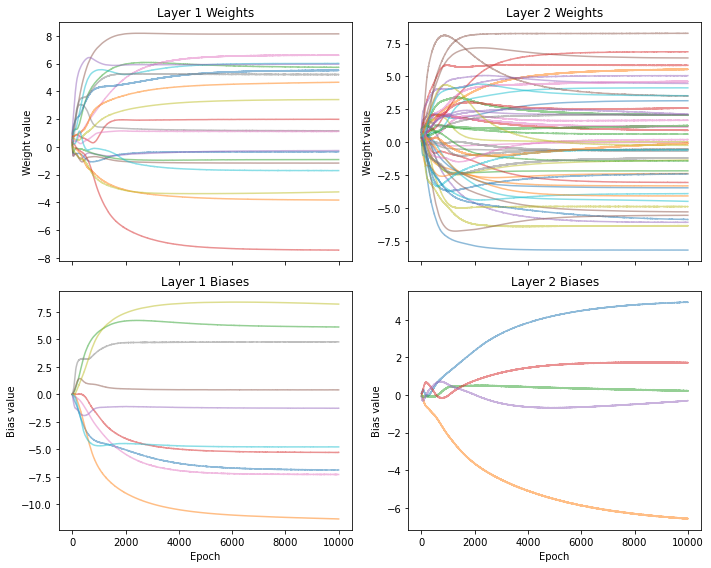

Czas wykonania: 7.848233 sekundy
f1:
0.7080580046359567
--------------------------------------------------------------------------------


In [255]:
mlp_rings3 = MLPNoBackprop(layer_sizes = [X_rings5S_train.shape[1], 10,  len(np.unique(Y_rings5S_train))], 
                           output_activation='softmax', l2_lambda = 0.005)
start_time = time.time()
mlp_rings3.classifiaction_train(X_rings5S_train_normalized, Y_rings5S_train, batch_size = 32, epochs=10000, learning_rate=0.01)
end_time = time.time()
execution_time = end_time - start_time
print(f"Czas wykonania: {execution_time:.6f} sekundy")
Ypred = mlp_rings3.predict_classification(X_rings5S_test_normalized)
print('f1:')
print(mlp_rings3.f1_score(Ypred, Y_rings5S_test))
print('--------------------------------------------------------------------------------')

## Rings 5 balance

In [256]:
df_rings3B_train = pd.read_csv('rings3-balance-training.csv')
df_rings3B_test = pd.read_csv('rings3-balance-test.csv')
df_rings3B_train.head()

,x,y,c
0,-51.444410,96.406766,0
1,35.512763,11.880533,0
2,3.504740,16.612403,0
3,-95.913214,-91.379244,0
4,4.620613,-10.885877,0


In [257]:
X_rings3B_train = np.array(df_rings3B_train[['x', 'y']])
Y_rings3B_train = np.array(df_rings3B_train[['c']])
X_rings3B_test = np.array(df_rings3B_test[['x', 'y']])
Y_rings3B_test = np.array(df_rings3B_test[['c']])
X_rings3B_train_normalized = (X_rings3B_train - np.mean(X_rings3B_train))/np.std(X_rings3B_train)
X_rings3B_test_normalized = (X_rings3B_test - np.mean(X_rings3B_train))/np.std(X_rings3B_train)

### L1 regularization

Epoka 0: Loss = 0.428630137
Epoka 10: Loss = 0.420888759
Epoka 20: Loss = 0.435192682
Epoka 30: Loss = 0.532970002
Epoka 40: Loss = 0.552294853
Epoka 50: Loss = 0.553897847
Epoka 60: Loss = 0.550002094
Epoka 70: Loss = 0.547778330
Epoka 80: Loss = 0.550078079
Epoka 90: Loss = 0.549013134
Epoka 100: Loss = 0.565071903
Epoka 110: Loss = 0.608210433
Epoka 120: Loss = 0.627583477
Epoka 130: Loss = 0.635474502
Epoka 140: Loss = 0.640069506
Epoka 150: Loss = 0.643329066
Epoka 160: Loss = 0.644657473
Epoka 170: Loss = 0.656405826
Epoka 180: Loss = 0.688254817
Epoka 190: Loss = 0.695770738
Epoka 200: Loss = 0.697089872
Epoka 210: Loss = 0.715566065
Epoka 220: Loss = 0.716217709
Epoka 230: Loss = 0.724030179
Epoka 240: Loss = 0.725362308
Epoka 250: Loss = 0.723776502
Epoka 260: Loss = 0.791799283
Epoka 270: Loss = 0.746243633
Epoka 280: Loss = 0.772984896
Epoka 290: Loss = 0.790801824
Epoka 300: Loss = 0.768898419
Epoka 310: Loss = 0.761590764
Epoka 320: Loss = 0.777388701
Epoka 330: Loss = 0.7

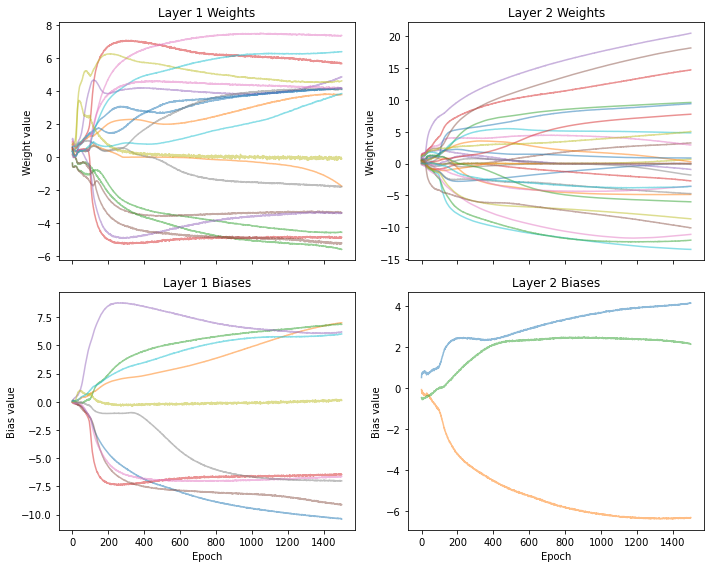

Czas wykonania: 9.317376 sekundy
f1:
0.764664128795161
--------------------------------------------------------------------------------


In [259]:
mlp_rings3 = MLPNoBackprop(layer_sizes = [X_rings3B_train.shape[1], 10,  len(np.unique(Y_rings3B_train))], 
                           output_activation='softmax', l1_lambda=0.005)
start_time = time.time()
mlp_rings3.classifiaction_train(X_rings3B_train_normalized, Y_rings3B_train, batch_size = 32, epochs=1500, learning_rate=0.01)
end_time = time.time()
execution_time = end_time - start_time
print(f"Czas wykonania: {execution_time:.6f} sekundy")
Ypred = mlp_rings3.predict_classification(X_rings3B_test_normalized)
print('f1:')
print(mlp_rings3.f1_score(Ypred, Y_rings3B_test))
print('--------------------------------------------------------------------------------')

### L2 regularization

Epoka 0: Loss = 0.430700377
Epoka 10: Loss = 0.415560928
Epoka 20: Loss = 0.489047619
Epoka 30: Loss = 0.528203827
Epoka 40: Loss = 0.550024810
Epoka 50: Loss = 0.555156489
Epoka 60: Loss = 0.554356468
Epoka 70: Loss = 0.555390266
Epoka 80: Loss = 0.560964517
Epoka 90: Loss = 0.564674632
Epoka 100: Loss = 0.593998583
Epoka 110: Loss = 0.615031960
Epoka 120: Loss = 0.631855978
Epoka 130: Loss = 0.633520082
Epoka 140: Loss = 0.640406394
Epoka 150: Loss = 0.643658289
Epoka 160: Loss = 0.643674903
Epoka 170: Loss = 0.643373559
Epoka 180: Loss = 0.644321686
Epoka 190: Loss = 0.642318476
Epoka 200: Loss = 0.653495410
Epoka 210: Loss = 0.655439877
Epoka 220: Loss = 0.677521321
Epoka 230: Loss = 0.677227715
Epoka 240: Loss = 0.675940938
Epoka 250: Loss = 0.674862986
Epoka 260: Loss = 0.685604911
Epoka 270: Loss = 0.689936654
Epoka 280: Loss = 0.701022471
Epoka 290: Loss = 0.709213625
Epoka 300: Loss = 0.711503063
Epoka 310: Loss = 0.710160438
Epoka 320: Loss = 0.710172220
Epoka 330: Loss = 0.7

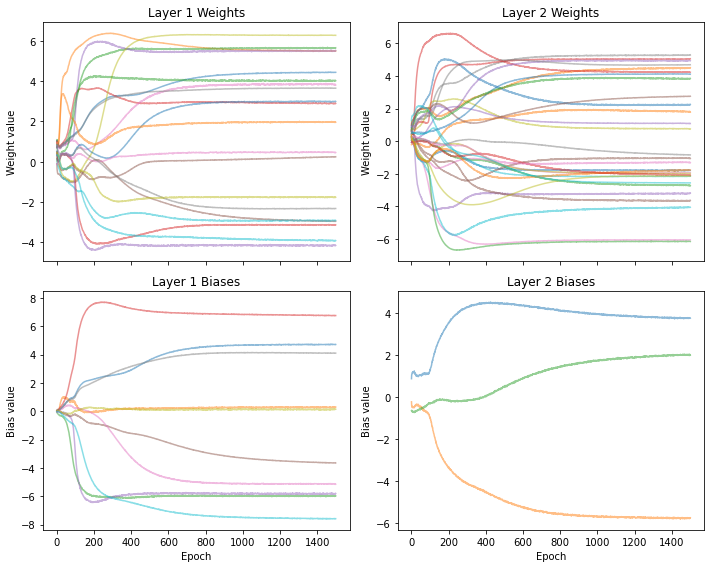

Czas wykonania: 9.134902 sekundy
f1:
0.624735434324605
--------------------------------------------------------------------------------


In [260]:
mlp_rings3 = MLPNoBackprop(layer_sizes = [X_rings3B_train.shape[1], 10,  len(np.unique(Y_rings3B_train))], 
                           output_activation='softmax', l2_lambda=0.005)
start_time = time.time()
mlp_rings3.classifiaction_train(X_rings3B_train_normalized, Y_rings3B_train, batch_size = 32, epochs=1500, learning_rate=0.01)
end_time = time.time()
execution_time = end_time - start_time
print(f"Czas wykonania: {execution_time:.6f} sekundy")
Ypred = mlp_rings3.predict_classification(X_rings3B_test_normalized)
print('f1:')
print(mlp_rings3.f1_score(Ypred, Y_rings3B_test))
print('--------------------------------------------------------------------------------')

### earlystopping

In [285]:
mlp_rings3B = MLPNoBackprop(layer_sizes = [X_rings3B_train.shape[1], 15,  len(np.unique(Y_rings3B_train))], 
                           output_activation='softmax')
start_time = time.time()
mlp_rings3B.classification_earlystop_GD(X_rings3B_train_normalized, Y_rings3B_train, 
                              batch_size=32, epochs=100, 
                              learning_rate=0.001, 
                              X_val=X_rings3B_test_normalized, 
                              Y_val=Y_rings3B_test, 
                              early_stopping=True, patience=10)
end_time = time.time()
execution_time = end_time - start_time
print(f"Czas wykonania: {execution_time:.6f} sekundy")

Epoka 0: Walidacja loss = 1.080023
Epoka 1: Walidacja loss = 1.082063
Epoka 2: Walidacja loss = 1.085001
Epoka 3: Walidacja loss = 1.088616
Epoka 4: Walidacja loss = 1.092151
Epoka 5: Walidacja loss = 1.094973
Epoka 6: Walidacja loss = 1.097149
Epoka 7: Walidacja loss = 1.098549
Epoka 8: Walidacja loss = 1.099387
Epoka 9: Walidacja loss = 1.099799
Epoka 10: Walidacja loss = 1.100045
Early stopping at epoch 10. Best validation loss: 1.080023
Czas wykonania: 0.106636 sekundy


In [286]:
ypred = mlp_rings3B.predict_classification(X_rings3B_test_normalized)
mlp_rings5S.f1_score(Y_rings3B_test, ypred)

0.4559733260206376

### XOR BALANCE

In [287]:
df_xor3B_train = pd.read_csv('xor3-balance-training.csv')
df_xor3B_test = pd.read_csv('xor3-balance-test.csv')
df_xor3B_train.head()

,x,y,c
0,-86.230963,-45.018574,0
1,60.883229,50.779619,0
2,-8.728612,5.851914,0
3,71.094995,88.402734,0
4,-49.498710,60.214482,0


In [288]:
X_xor3B_train = np.array(df_xor3B_train[['x', 'y']])
Y_xor3B_train = np.array(df_xor3B_train[['c']])
X_xor3B_test = np.array(df_xor3B_test[['x', 'y']])
Y_xor3B_test = np.array(df_xor3B_test[['c']])
X_xor3B_train_normalized = (X_xor3B_train - np.mean(X_xor3B_train))/np.std(X_xor3B_train)
X_xor3B_test_normalized = (X_xor3B_test - np.mean(X_xor3B_train))/np.std(X_xor3B_train)

Epoka 0: Loss = 0.487804878
Epoka 10: Loss = 0.487804878
Epoka 20: Loss = 0.487804878
Epoka 30: Loss = 0.487804878
Epoka 40: Loss = 0.487804878
Epoka 50: Loss = 0.487804878
Epoka 60: Loss = 0.487804878
Epoka 70: Loss = 0.487804878
Epoka 80: Loss = 0.487804878
Epoka 90: Loss = 0.487804878
Epoka 100: Loss = 0.487804878
Epoka 110: Loss = 0.487804878
Epoka 120: Loss = 0.487804878
Epoka 130: Loss = 0.487804878
Epoka 140: Loss = 0.487804878
Epoka 150: Loss = 0.487804878
Epoka 160: Loss = 0.487804878
Epoka 170: Loss = 0.487804878
Epoka 180: Loss = 0.487804878
Epoka 190: Loss = 0.487804878
Epoka 200: Loss = 0.487804878
Epoka 210: Loss = 0.487804878
Epoka 220: Loss = 0.487804878
Epoka 230: Loss = 0.487804878
Epoka 240: Loss = 0.487804878
Epoka 250: Loss = 0.487804878
Epoka 260: Loss = 0.487804878
Epoka 270: Loss = 0.487804878
Epoka 280: Loss = 0.487804878
Epoka 290: Loss = 0.487804878
Epoka 300: Loss = 0.487804878
Epoka 310: Loss = 0.487804878
Epoka 320: Loss = 0.487804878
Epoka 330: Loss = 0.4

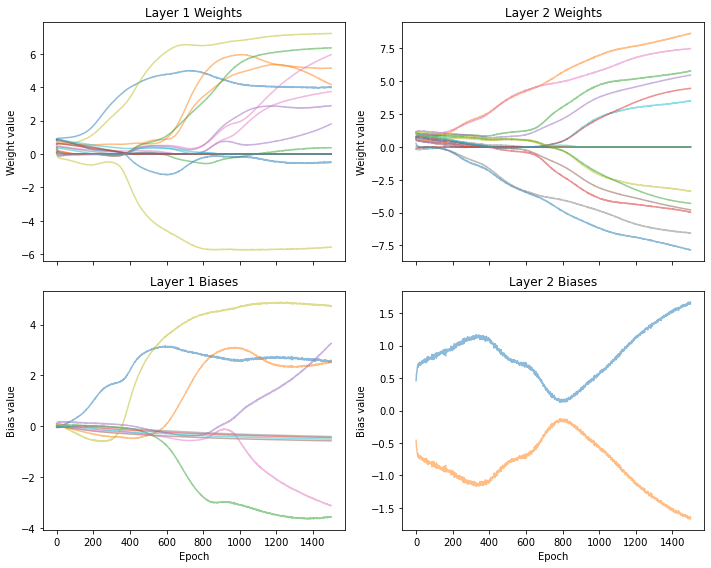

Czas wykonania: 4.518570 sekundy
f1:
0.7105001039046657
--------------------------------------------------------------------------------


In [289]:
mlp_xor3 = MLPNoBackprop(layer_sizes = [X_xor3B_train.shape[1], 10,  len(np.unique(Y_xor3B_train))], 
                           output_activation='softmax', l1_lambda=0.005)
start_time = time.time()
mlp_xor3.classifiaction_train(X_xor3B_train_normalized, Y_xor3B_train, batch_size = 32, epochs=1500, learning_rate=0.01)
end_time = time.time()
execution_time = end_time - start_time
print(f"Czas wykonania: {execution_time:.6f} sekundy")
Ypred = mlp_xor3.predict_classification(X_xor3B_test_normalized)
print('f1:')
print(mlp_xor3.f1_score(Ypred, Y_xor3B_test))
print('--------------------------------------------------------------------------------')

Epoka 0: Loss = 0.487804878
Epoka 10: Loss = 0.487804878
Epoka 20: Loss = 0.487804878
Epoka 30: Loss = 0.487804878
Epoka 40: Loss = 0.487804878
Epoka 50: Loss = 0.487804878
Epoka 60: Loss = 0.487804878
Epoka 70: Loss = 0.487804878
Epoka 80: Loss = 0.487804878
Epoka 90: Loss = 0.487804878
Epoka 100: Loss = 0.487804878
Epoka 110: Loss = 0.487804878
Epoka 120: Loss = 0.487804878
Epoka 130: Loss = 0.487804878
Epoka 140: Loss = 0.487804878
Epoka 150: Loss = 0.487804878
Epoka 160: Loss = 0.487804878
Epoka 170: Loss = 0.487804878
Epoka 180: Loss = 0.487804878
Epoka 190: Loss = 0.487804878
Epoka 200: Loss = 0.487804878
Epoka 210: Loss = 0.487804878
Epoka 220: Loss = 0.487804878
Epoka 230: Loss = 0.487804878
Epoka 240: Loss = 0.487804878
Epoka 250: Loss = 0.487804878
Epoka 260: Loss = 0.487804878
Epoka 270: Loss = 0.487804878
Epoka 280: Loss = 0.487804878
Epoka 290: Loss = 0.487804878
Epoka 300: Loss = 0.487804878
Epoka 310: Loss = 0.487804878
Epoka 320: Loss = 0.487804878
Epoka 330: Loss = 0.4

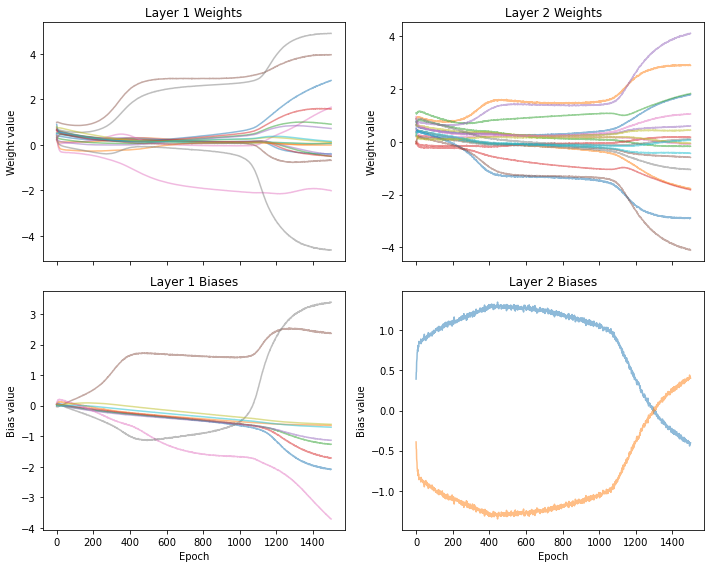

Czas wykonania: 4.787126 sekundy
f1:
0.3650495551993275
--------------------------------------------------------------------------------


In [290]:
mlp_xor3 = MLPNoBackprop(layer_sizes = [X_xor3B_train.shape[1], 10,  len(np.unique(Y_xor3B_train))], 
                           output_activation='softmax', l2_lambda=0.005)
start_time = time.time()
mlp_xor3.classifiaction_train(X_xor3B_train_normalized, Y_xor3B_train, batch_size = 32, epochs=1500, learning_rate=0.01)
end_time = time.time()
execution_time = end_time - start_time
print(f"Czas wykonania: {execution_time:.6f} sekundy")
Ypred = mlp_xor3.predict_classification(X_xor3B_test_normalized)
print('f1:')
print(mlp_xor3.f1_score(Ypred, Y_xor3B_test))
print('--------------------------------------------------------------------------------')